### Algorithm : Local Outlier Factor
## Steps for Implementation
1. Data loading<br>
2. Data Exploration <br>
3. Selection of data based on features <br>
4. Removal of Invalid data <br>
5. Removal of highly correlated data <br>
6. Median Normalization and Removal of infinite results <br>
7. Training of Algorithm <br>
8. Visualization of Results

In [1]:
#  Import Required Libraries
import pandas as pd
import numpy as np
import seaborn as sn
import matplotlib.pyplot as plt
from sklearn.neighbors import LocalOutlierFactor
from pyod.models.cblof import CBLOF
from pyod.models.loci import LOCI
from pyod.models.hbos import HBOS
import sklearn.metrics as eval_metrics
#from sklearn.metrics import davies_bouldin_score

In [2]:
def read_data(file_path):
#     Read and return csv file
#  Input Parameter 
#  file_path : path of csv file to be read
#  Returns dataframe : csv file contents
    df = pd.read_csv(file_path)
    return df

In [3]:
file_path = "../parsing/Data/correlated_data_20210208.csv"
df = read_data(file_path)

In [4]:
def select_data_based_on_feature(df, feature_value):
# Based on feature and feature value specified, Returns records with only feature value that is specified
    return df[df["agent_id"] == feature_value]

In [5]:
def get_valid_mask(df):
#     Returns mask for columns whose correlation with themselves is valid
    return ~df.corr().isna().all()

In [6]:
def get_valid_columns(df, mask):
#  Returns the name of columns whose correlation with themselves is a valid value i-e not nan

    not_nan_columns = []
    for column, valid in zip(df.corr().columns, mask):
        if valid == True:
            not_nan_columns.append(column)
        else:
            pass
        
    return not_nan_columns

In [7]:
def select_features(df, features):
#     Returns dataframe with features specified
    return df[features]

In [52]:
def get_selected_features(X, features):
    features_list = []
    for feature in features:
        if feature in X.columns:
            features_list.append(feature)
    if len(features_list) > 1:
        X = select_features(X, features_list)
        return X
    else:
        print("No valid feature")
        return 0

In [70]:
def select_service(df,service_id):
    df_selected = df.loc[df['service_id'] == service_id]
    return df_selected

In [8]:
def highly_correlated_feature(df, threshold):
#  This function finds fetures who are highly correlated
#  Input
#  dataframe
#  threshold to compute highly correlated features
#  Returns features to drop
    cor_matrix = df.corr()
    upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),
                                      k=1).astype(np.bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > threshold)]
    
    return to_drop

In [9]:
def drop_correlated_features(df, features_to_drop):
#  Returns dataframe after dropping highly correlated featrures
    return df.drop(df[features_to_drop], axis = 1 )

In [10]:
# Formula for median normalization

# x−median(x) / MAD(x)  WHERE  MAD(x)  = median(|x − median(x)|) 

def median_normalization(df_column):

    median_value = df_column.median()
  # print("median", median_value)
    x_minus_median = df_column - median_value
#     print("x minus median" , x_minus_median)
  # print("len x minus median", len(x_minus_median))
    mad = x_minus_median.abs().median()
#     print("mad", mad)
  # print("x_minus_median.abs()", x_minus_median.abs())
    normalized_value = x_minus_median/mad

    return normalized_value

In [11]:
def normalize_data(dataframe):
    df = pd.DataFrame(columns = dataframe.columns)
    for column in dataframe.columns:
    # print(column)
    # if column == 'flow_duration':
        df[column] = median_normalization(dataframe[column])
#         if df[column].isna().any():
#             print("column name : ", column, df[column])
      # print(median_normalization(dataframe[column]))
      # print(df[column])

    return df

In [12]:
def remove_invalid_feature(df):
    
    nan_mask = df.isna().any()
    not_nan_columns = []
    for column, valid in zip(df.corr().columns, nan_mask):
        if valid == False:
            not_nan_columns.append(column)
        else:
            pass
        
    return df[not_nan_columns]

In [13]:
def cluster_training_lof(X, contamination, n_neighbors):
#     Train clustering algorithm and return predicted labels and scores
#  Input Parameters
#  X : input data
#  n_neighbors : number of neighbors in a cluster, parameter for tuning
#  contamination : parameter for tuning
#  Output
#  y_pred : labels
#  X_scores : scores

# fit the model for outlier detection (default)
    clf = LocalOutlierFactor(n_neighbors=n_neighbors, contamination=contamination)

# use fit_predict to compute the predicted labels of the training samples
# (when LOF is used for outlier detection, the estimator has no predict,
# decision_function and score_samples methods).
    y_pred = clf.fit_predict(X)

# n_errors = (y_pred != ground_truth).sum()
# print(n_errors)
    X_scores = clf.negative_outlier_factor_
    
    return (y_pred, X_scores)

In [14]:
def cluster_training_cblof(X,contamination):
#     Train clustering algorithm and return predicted labels and scores
#  Input Parameters
#  X : input data
#  contamination : parameter for tuning
#  Output
#  y_pred : labels
#  X_scores : scores

    clf_name = 'CBLOF'
    clf = CBLOF( contamination = contamination)

    clf.fit(X)
    
    y_pred = clf.labels_  # binary labels (0: inliers, 1: outliers)
    X_scores = clf.decision_scores_
    
    return (y_pred, X_scores)

In [15]:
def cluster_training_loci(X,contamination):
#     Train clustering algorithm and return predicted labels and scores
#  Input Parameters
#  X : input data
#  contamination : parameter for tuning
#  Output
#  y_pred : labels
#  X_scores : scores

    clf_name = 'LOCI'
    clf = LOCI( contamination = contamination)

    clf.fit(X)
    
    y_pred = clf.labels_  # binary labels (0: inliers, 1: outliers)
    X_scores = clf.decision_scores_
    
    return (y_pred, X_scores)

In [16]:
def cluster_training_hbos(X,contamination):
#     Train clustering algorithm and return predicted labels and scores
#  Input Parameters
#  X : input data
#  contamination : parameter for tuning
#  Output
#  y_pred : labels
#  X_scores : scores

    clf_name = 'HBOS'
    #clf = HBOS( contamination = contamination)
    clf = HBOS()
    clf.fit(X)
    
    #X_scores = clf.decision_function(X) * -1
    #y_pred = clf.predict(X)
    
    
    y_pred = clf.labels_  # binary labels (0: inliers, 1: outliers)
    X_scores = clf.decision_scores_
    
    return (y_pred, X_scores)

In [65]:
def check_valid_labels(labels):
    
    valid = False
    for i in range(len(labels) -1):
        if labels[i] != labels[i+1]:
            valid = True
            return valid
    return valid
    

In [76]:
def calculate_evaluation_metrices(input_df, output_labels, distance_metric = 'euclidean'):
    #More silhouette_score is better
    # Calculate Silhoutte Score
    if check_valid_labels(output_labels):
        silht_score = eval_metrics.silhouette_score(input_df, output_labels, metric=distance_metric)
        print('Silhouetter Score: %.3f' % silht_score)

        #less davies_bouldin_score is better
        dbi_score = eval_metrics.davies_bouldin_score(input_df, output_labels)
        print('davies bouldin Score: %.3f' % dbi_score)

        #higher calinski_harabasz_score is better
        ch_score = eval_metrics.calinski_harabasz_score(input_df, output_labels)
        print('calinski_harabasz Score: %.3f' % ch_score)

        return silht_score, dbi_score, ch_score
    else:
        print("Number of labels not enough to evaluate")
        return 0,0,0


In [18]:
def inliers_outliers_sk(y_pred):
#     Print Number of inliers and outliers
    print("Number of Inliers : ", len(np.where(y_pred == 1)[0]))
    print("Number of Outliers : " , len(np.where(y_pred == -1)[0]))

In [19]:
#verify outliers by printing them
def print_outliers_sk(scores_list, labels_list):
    count = 0
    for index in range(0, len(labels_list)):
        if (labels_list[index] == -1):
            count += 1
            print("Outlier index: " + str(index))
            print("Outlier score: " + str(scores_list[index]))
    print("Total number of outliers found: " + str(count))

In [20]:
def inliers_outliers_pyod(y_pred):
#     Print Number of inliers and outliers
    print("Number of Inliers : ", len(np.where(y_pred == 0)[0]))
    print("Number of Outliers : " , len(np.where(y_pred == 1)[0]))

In [21]:
#verify outliers by printing them
def print_outliers_pyod(scores_list, labels_list):
    count = 0
    for index in range(0, len(labels_list)):
        if (labels_list[index] == 1):
            count += 1
            print("Outlier index: " + str(index))
            print("Outlier score: " + str(scores_list[index]))
    print("Total number of outliers found: " + str(count))

In [22]:
def plot_results(results_df, graph_title, x_label, y_label):
    plt.figure(figsize = (20,10))
    plt.title(graph_title)
    plt.scatter(results_df.iloc[:, 0], results_df.iloc[:, 1], color='k', s=3., label='Data points')
    # plot circles with radius proportional to the outlier scores
    max_score = results_df.iloc[:, 1].values.max()
    min_score = results_df.iloc[:, 1].values.min()
    radius = (max_score - results_df.iloc[:, 1]) / (max_score - min_score)
    plt.scatter(results_df.iloc[:, 0], results_df.iloc[:, 1], s=1000 * radius, edgecolors='r',
            facecolors='none', label='Outlier scores')
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.axis('tight')
    legend = plt.legend(loc='center right')
    legend.legendHandles[0]._sizes = [10]
    legend.legendHandles[1]._sizes = [20]
    plt.savefig("plots/" + graph_title + ".png")
    plt.show()

In [80]:
def execute_etlp_pipeline(df,features, algorithm, algorithm_args, service_id, agent_id = "all"):

    
    contamination = 0.1
    n_neighbors   = 20
    if(len(algorithm_args)<1):
        print("parameters of algorithm are not passed so using default parameters")
    elif (len(algorithm_args)<2): 
        print("only contamination is passed in parameter list; hence using default value of n_neighbors")
        contamination = algorithm_args[0]
    else:
        print("input parameters are being used instead of default values")
        contamination = algorithm_args[0]
        n_neighbors   = algorithm_args[1]
    
    print ("contamination: " + str(contamination))
    print ("n_neighbors: " + str(n_neighbors))
    
#  Contamination and n_neighbors are used seperately
#  algorithm not using currently, will be used   
    if agent_id != "all":
        df = select_data_based_on_feature(df, agent_id)
    df = select_service(df,service_id)
    valid_mask = get_valid_mask(df)
    valid_columns = get_valid_columns(df, valid_mask)
    df = select_features(df, valid_columns)
    features_to_drop = highly_correlated_feature(df, 0.95)
    df = drop_correlated_features(df, features_to_drop)
    tid_list = df.iloc[:,0].values
    df   = normalize_data(df)
    X = remove_invalid_feature(df)
    X = get_selected_features(X, features) # check if feature exists in X, then select from dataframe
    if type(X) == int:
        print("No Valid columns found for combination of ", features)
        return 0,0,0
    #     X = X[X.columns[1:]]
    print("Features Used :: ", X.columns)
    y_pred = []
    x_score = []
    list_of_evaluation_scores = []
    if algorithm == "lof":
        y_pred, x_score = cluster_training_lof(X, contamination, n_neighbors)
        inliers_outliers_sk(y_pred)
        print_outliers_sk(x_score, y_pred)
        
    elif algorithm == "cblof":
        y_pred, x_score = cluster_training_cblof(X,contamination)
        inliers_outliers_pyod(y_pred)
        print_outliers_pyod(x_score, y_pred)

    elif algorithm == "loci":
        y_pred, x_score = cluster_training_loci(X,contamination)
        inliers_outliers_pyod(y_pred)
        print_outliers_pyod(x_score, y_pred)

    elif algorithm == "hbos":
        y_pred, x_score = cluster_training_hbos(X,contamination)
        inliers_outliers_pyod(y_pred)
        print_outliers_pyod(x_score, y_pred)
        
    results_df = pd.DataFrame(tid_list, columns=['t_id'])
    results_df = results_df.assign(outlier_score = pd.Series(x_score))
    title = "plot of negative " + algorithm + " scores against t_id"
    
    list_of_evaluation_scores = calculate_evaluation_metrices(X, y_pred)
    plot_results (results_df, title , "t_id", "scores")
    
    return list_of_evaluation_scores


input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['t_id', 'src_port'], dtype='object')
Number of Inliers :  2342
Number of Outliers :  169
Outlier index: 0
Outlier score: 6.61441789616192
Outlier index: 1279
Outlier score: 3.6259235364523477
Outlier index: 1280
Outlier score: 3.6259235364523477
Outlier index: 1281
Outlier score: 3.6259235364523477
Outlier index: 1282
Outlier score: 3.6259235364523477
Outlier index: 1283
Outlier score: 3.6259235364523477
Outlier index: 1284
Outlier score: 3.6259235364523477
Outlier index: 1285
Outlier score: 3.6259235364523477
Outlier index: 1286
Outlier score: 3.6259235364523477
Outlier index: 1287
Outlier score: 3.6259235364523477
Outlier index: 1288
Outlier score: 3.6259235364523477
Outlier index: 1289
Outlier sc

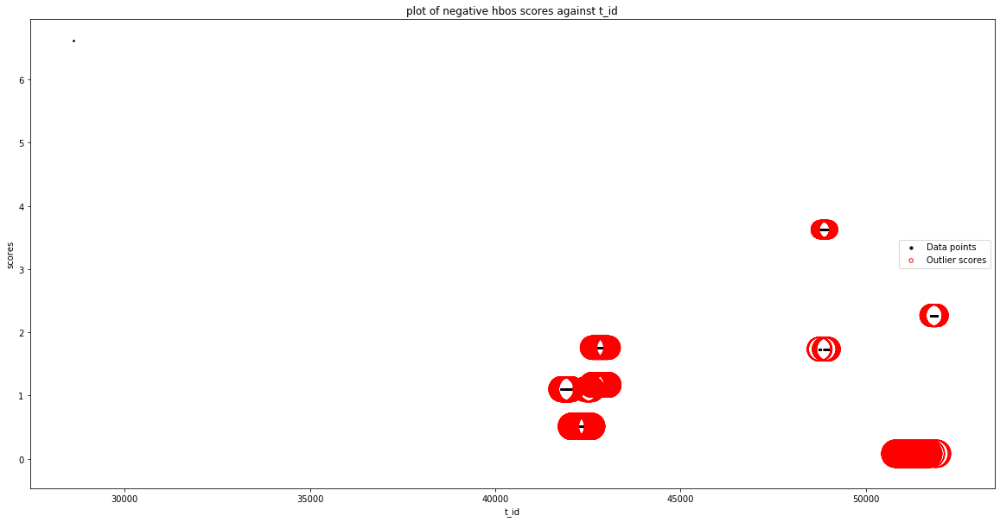

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['t_id', 'flow_duration'], dtype='object')
Number of Inliers :  2272
Number of Outliers :  239
Outlier index: 0
Outlier score: 6.636067734420048
Outlier index: 1244
Outlier score: 5

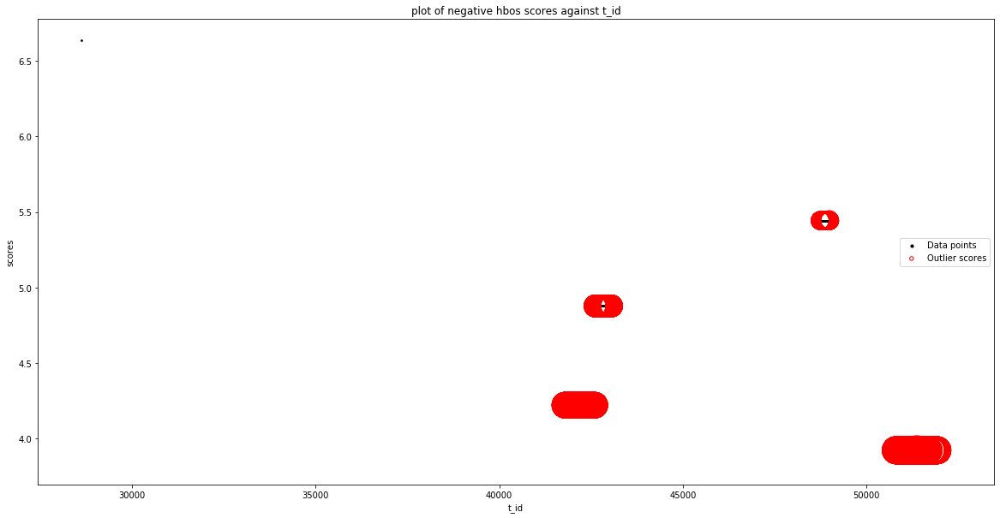

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['t_id', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2261
Number of Outliers :  250
Outlier index: 0
Outlier score: 6.635872290121252
Outlier index: 825
Outlier score: 4.883132596010087
Outlier index: 857
Outlier score: 4.878386909965821
Outlier index: 866
Outlier score: 4.878386909965821
Outlier index: 907
Outlier score: 4.878386909965821
Outlier index: 937
Outlier score: 4.883330672106123
Outlier index: 949
Outlier score: 4.883132596010087
Outlier index: 1066
Outlier score: 4.8783869

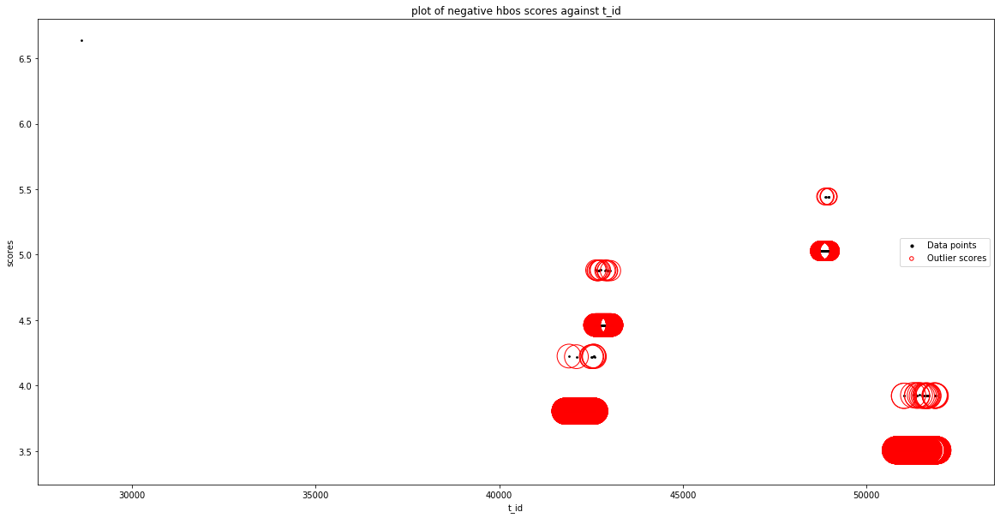

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['t_id', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2327
Number of Outliers :  184
Outlier index: 0
Outlier score: 6.404858268003906
Outlier index: 1
Outlier score: 3.9958555916005434
Outlier index: 63
Outlier score: 4.039228287246426
Outlier index: 113
Outlier score: 3.9958555916005434
Outlier index: 115
Outlier score: 3.9958555916005434
Outlier index: 174
Outlier score: 4.20220620714345
Outlier index: 193
Outlier score: 4.039228287246426
Outlier index: 311
Outlier score: 3.9958555916005434
Outlier index: 426
Outlier score: 4.1777658010928365
Outlier index: 498
Outlier score: 3.9958555916005434
Outlier index: 553
Outlier score: 4.039228287246426
Outlier index:

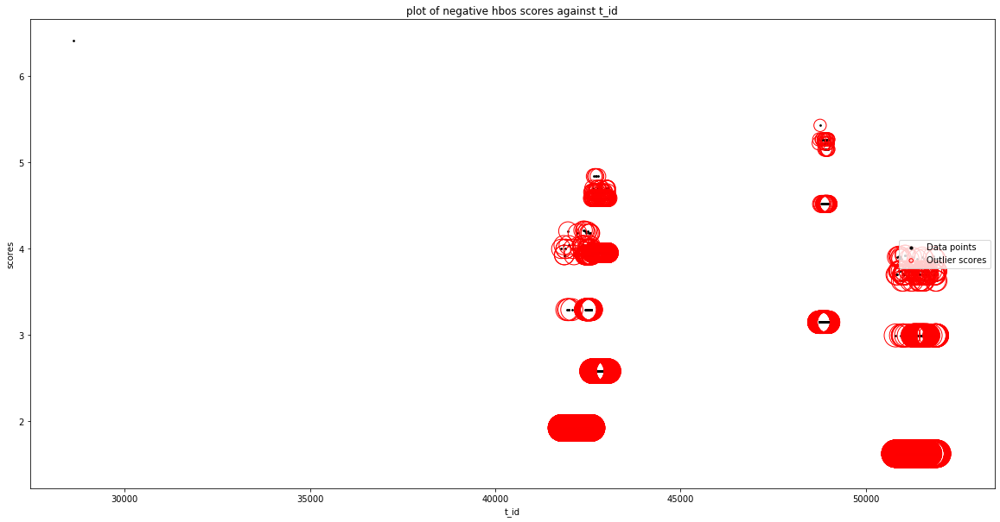

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['t_id', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2271
Number of Outliers :  240
Outlier index: 0
Outlier score: 6.525176663843384
Outlier index: 113
Outlier score: 4.217221437898314
Outlier index: 311
Outlier score: 4.209067162094504
Outlier index: 498
Outlier score: 4.175313754398616
Outlier index: 564
Outlier score: 4.175313754398616
Outlier index: 574
Outlier score: 4.209067162094504
Outlier index: 667
Outlier score: 4.197728055287624
Outlier index: 703
Outlier score: 4.215586891457925
Outlier index: 707
Outlier score: 4.209067162094504
Outlier index: 721
Outlier score: 4.215586891457925
Outlier index: 758
Outlier score: 4.209067162094504
Outlier index: 763
O

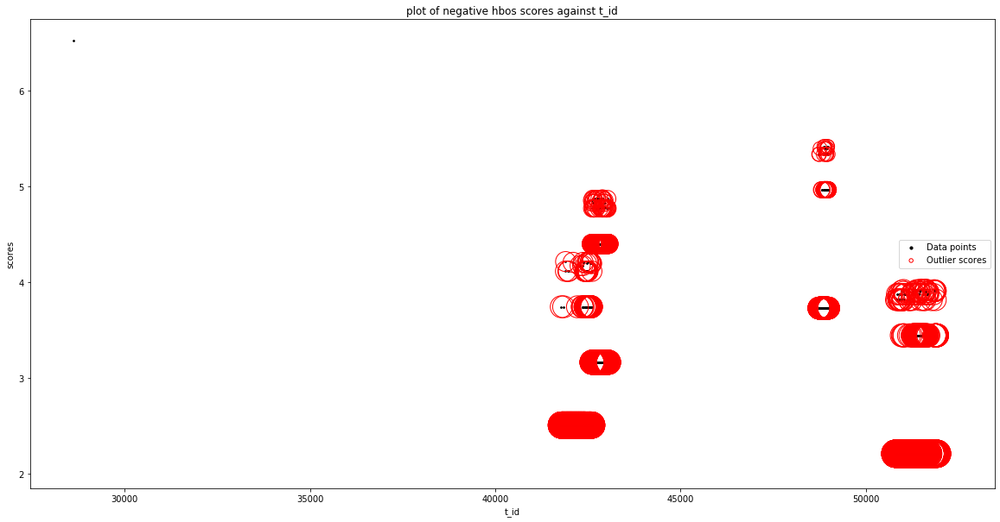

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'bwd_packet_length_std']
input parameters are being used instead of default values
c

Silhouetter Score: 0.282
davies bouldin Score: 4.535
calinski_harabasz Score: 17.621


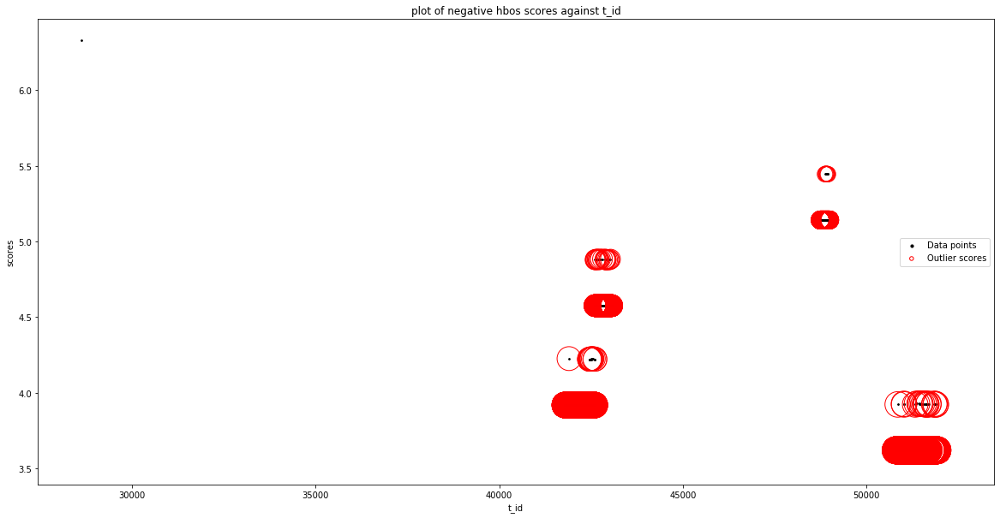

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['t_id', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2303
Number of Outliers :  208
Outlier index: 0
Outlier score: 5.639227722141547
Outlier index: 803
Outlier score: 4.469666655850335
Outlier index: 805
Outlier score: 4.819834072561813
Outlier index: 806
Outlier score: 4.469666655850335
Outlier index: 812
Outlier score: 4.469666655850335
Outlier index: 813
Outlier score: 4.7601149098751
Outlier index: 818
Outlier score: 4.469666655850335
Outlier index: 820
Outlier score: 4.819834072561813
Outlier index: 825
Outlier score: 4.819834072561813
Outlier index: 828
Outlier score: 4.469666655850335
Outlier index: 829
Outlier score: 4.819834072561813
Outlier index: 831
Outlier score: 4.469666655850335
Outlier index: 832
Outlier score: 4.7601149098751
Outlier index: 833
Outlier score: 4.469666655850335
Outlier index: 840
Outlier score: 4.469666655850335
Outlier i

Outlier index: 1401
Outlier score: 4.968221288991388
Outlier index: 1402
Outlier score: 5.03539214084091
Outlier index: 1403
Outlier score: 4.968221288991388
Outlier index: 1404
Outlier score: 5.03539214084091
Outlier index: 1405
Outlier score: 5.03539214084091
Outlier index: 1406
Outlier score: 5.433998399209839
Outlier index: 1407
Outlier score: 4.968221288991388
Outlier index: 1409
Outlier score: 4.968221288991388
Outlier index: 1410
Outlier score: 5.03539214084091
Outlier index: 1412
Outlier score: 5.03539214084091
Outlier index: 1414
Outlier score: 4.968221288991388
Outlier index: 1415
Outlier score: 4.968221288991388
Outlier index: 1416
Outlier score: 5.325840394865676
Outlier index: 1418
Outlier score: 4.968221288991388
Outlier index: 1421
Outlier score: 4.968221288991388
Outlier index: 1424
Outlier score: 4.968221288991388
Outlier index: 1428
Outlier score: 5.03539214084091
Outlier index: 1429
Outlier score: 4.968221288991388
Outlier index: 1430
Outlier score: 5.03539214084091


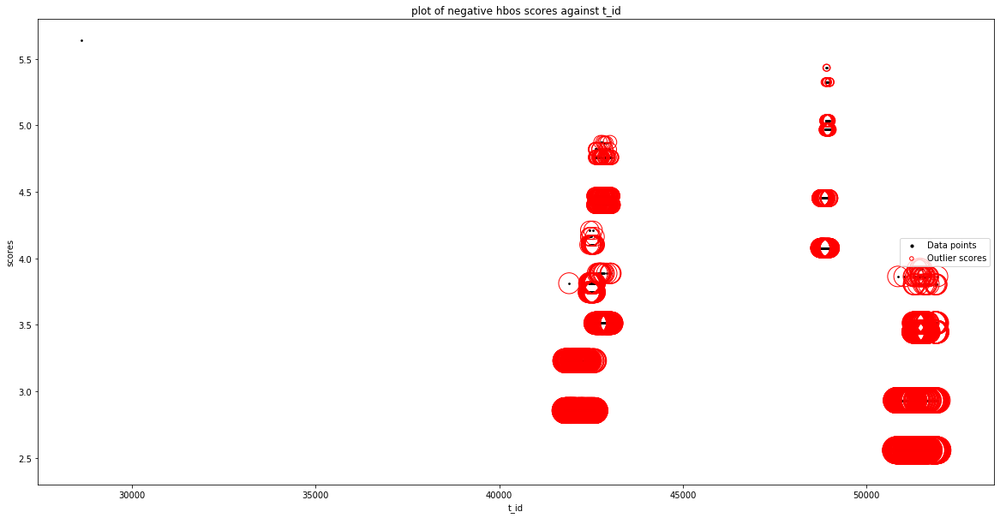

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['t_id', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2272
Number of Outliers :  239
Outlier index: 0
Outlier score: 6.609116942061645
Outlier index: 1244
Outlier score: 5.422895200547691
Outlier index: 1245
Outlier score: 5.422895200547691
Outlier index: 1246
Outlier score: 5.422895200547691
Outlier index: 1247
Outlier score: 5.422895200547691
Outlier index: 1248
Outlier score: 5.422895200547691
Outlier index: 1249
Outlier score: 5.422895200547691
Outlier index: 1250
Outlier score: 5.422895200547691
Outlier index: 1251
Outlier score: 5.422895200547691
Outlier index: 1252
Outlier score: 5.422895200547691
Outlier index: 1253
Outlier score: 5.422895200547691
Outlier index: 1254
Outlier score: 5.422895200547691
Outlier index: 1255
Outlier score: 5.422895200547691
Outlier index: 1256
Outlier score: 5.422895200547691
Outlier index: 1257
Outlier score: 5.42289520054

Outlier score: 5.422895200547691
Outlier index: 1401
Outlier score: 5.422895200547691
Outlier index: 1402
Outlier score: 5.422895200547691
Outlier index: 1403
Outlier score: 5.422895200547691
Outlier index: 1404
Outlier score: 5.422895200547691
Outlier index: 1405
Outlier score: 5.422895200547691
Outlier index: 1406
Outlier score: 5.422895200547691
Outlier index: 1407
Outlier score: 5.422895200547691
Outlier index: 1408
Outlier score: 5.422895200547691
Outlier index: 1409
Outlier score: 5.422895200547691
Outlier index: 1410
Outlier score: 5.422895200547691
Outlier index: 1411
Outlier score: 5.422895200547691
Outlier index: 1412
Outlier score: 5.422895200547691
Outlier index: 1413
Outlier score: 5.422895200547691
Outlier index: 1414
Outlier score: 5.422895200547691
Outlier index: 1415
Outlier score: 5.422895200547691
Outlier index: 1416
Outlier score: 5.422895200547691
Outlier index: 1417
Outlier score: 5.422895200547691
Outlier index: 1418
Outlier score: 5.422895200547691
Outlier index

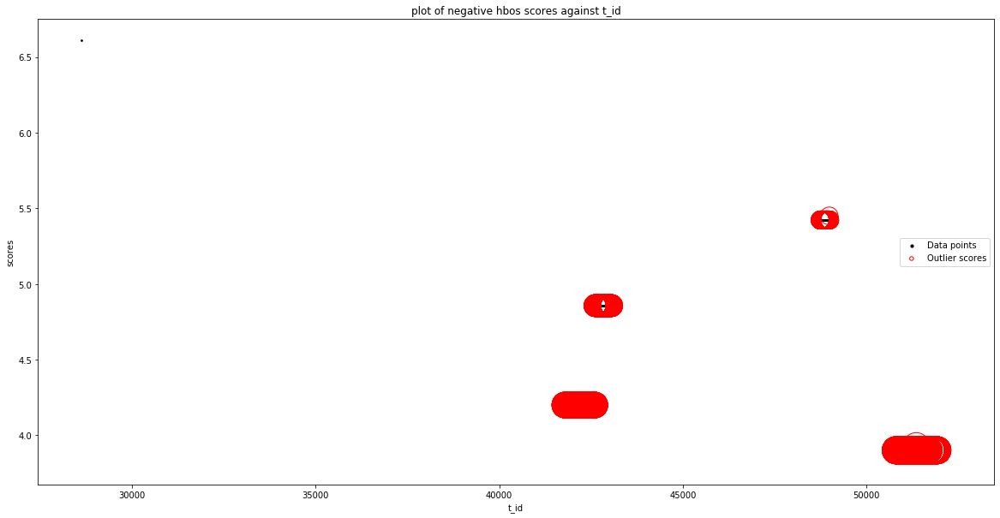

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['t_id', 'flow_iat_min'], dtype='object')
Number of Inliers :  2272
Number of Outliers :  239
Outlier index: 0
Outlier score: 6.161053515338393
Outlier index: 1244
Outlier score: 4.974831773824439
Outlier index: 1245
Outlier score: 4.974831773824439
Outlier index: 1246
Outlier score: 4.974831773824439
Outlier index: 1247
Outlier score: 4.974831773824439
Outlier index: 1248
Outlier score: 4.974831773824439
Outlier index: 1249
Outlier score: 4.974831773824439
Outlier index: 1250
Outlier score: 4.974831773824439
Outlier i

Outlier score: 4.974831773824439
Outlier index: 1441
Outlier score: 4.974831773824439
Outlier index: 1442
Outlier score: 4.974831773824439
Outlier index: 1443
Outlier score: 4.974831773824439
Outlier index: 1444
Outlier score: 4.974831773824439
Outlier index: 1445
Outlier score: 4.974831773824439
Outlier index: 1446
Outlier score: 4.974831773824439
Outlier index: 1447
Outlier score: 4.974831773824439
Outlier index: 1448
Outlier score: 4.974831773824439
Outlier index: 1449
Outlier score: 4.974831773824439
Outlier index: 1450
Outlier score: 4.974831773824439
Outlier index: 1451
Outlier score: 4.974831773824439
Outlier index: 1452
Outlier score: 4.974831773824439
Outlier index: 1453
Outlier score: 4.974831773824439
Outlier index: 1454
Outlier score: 4.974831773824439
Outlier index: 1455
Outlier score: 4.974831773824439
Outlier index: 1456
Outlier score: 4.974831773824439
Outlier index: 1457
Outlier score: 4.974831773824439
Outlier index: 1458
Outlier score: 4.974831773824439
Outlier index

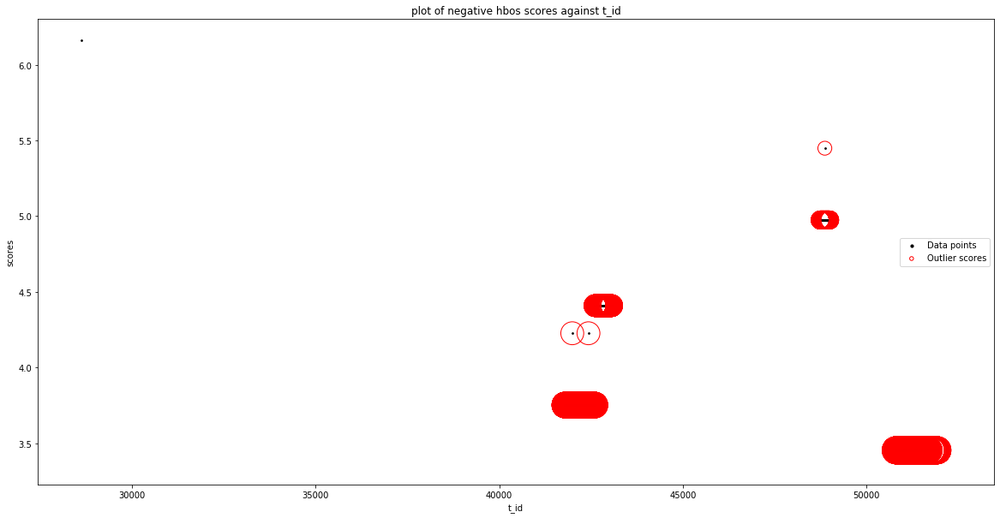

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['t_id', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2271
Number of Outliers :  240
Outlier index: 0
Outlier score: 6.285805525109492
Outlier index: 1221
Out

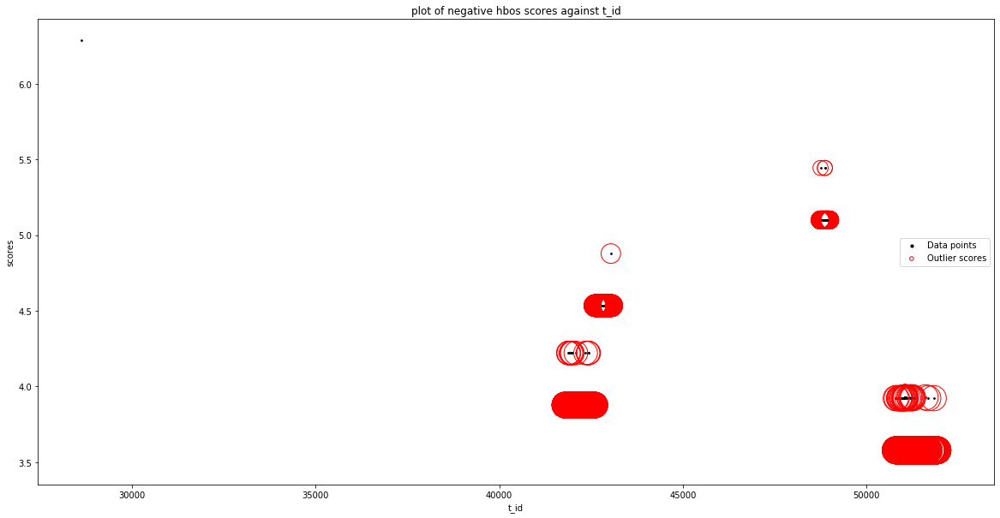

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['t_id', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2272
Number of Outliers :  239
Outlier index: 0
Outlier score: 6.392702907079082
Outlier index: 1244
Outl

Outlier index: 1400
Outlier score: 5.206481165565128
Outlier index: 1401
Outlier score: 5.206481165565128
Outlier index: 1402
Outlier score: 5.206481165565128
Outlier index: 1403
Outlier score: 5.206481165565128
Outlier index: 1404
Outlier score: 5.206481165565128
Outlier index: 1405
Outlier score: 5.206481165565128
Outlier index: 1406
Outlier score: 5.206481165565128
Outlier index: 1407
Outlier score: 5.206481165565128
Outlier index: 1408
Outlier score: 5.206481165565128
Outlier index: 1409
Outlier score: 5.206481165565128
Outlier index: 1410
Outlier score: 5.206481165565128
Outlier index: 1411
Outlier score: 5.206481165565128
Outlier index: 1412
Outlier score: 5.206481165565128
Outlier index: 1413
Outlier score: 5.206481165565128
Outlier index: 1414
Outlier score: 5.206481165565128
Outlier index: 1415
Outlier score: 5.206481165565128
Outlier index: 1416
Outlier score: 5.206481165565128
Outlier index: 1417
Outlier score: 5.206481165565128
Outlier index: 1418
Outlier score: 5.206481165

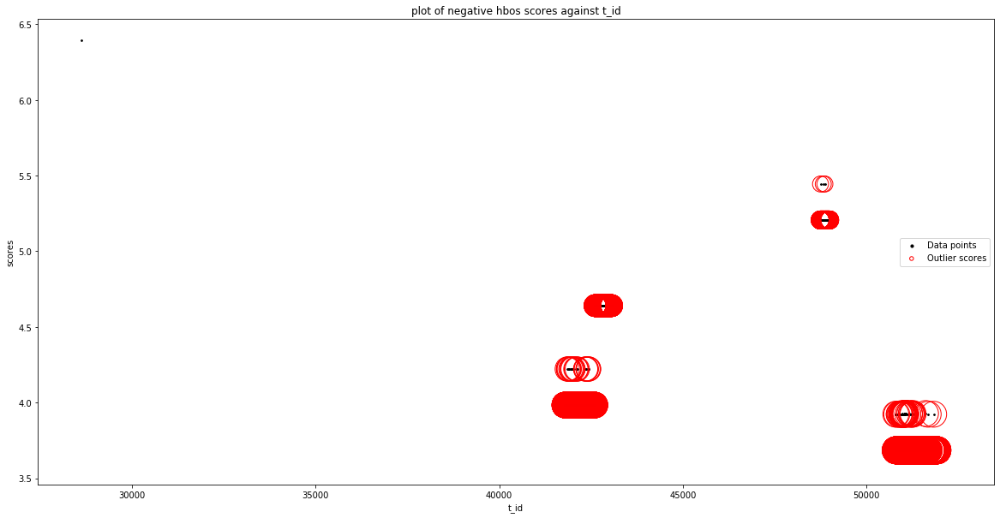

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Fe

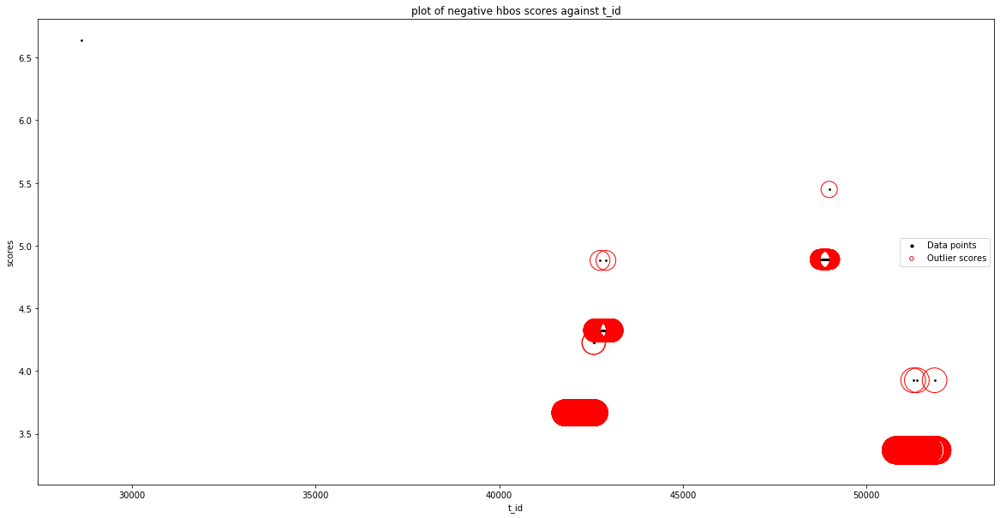

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'packet_length_mean']
input parameters are being used instead of default values
contamination: 0.

Outlier score: 5.081203457673108
Outlier index: 1409
Outlier score: 5.081203457673108
Outlier index: 1410
Outlier score: 5.081203457673108
Outlier index: 1411
Outlier score: 5.081203457673108
Outlier index: 1412
Outlier score: 5.081203457673108
Outlier index: 1413
Outlier score: 5.081203457673108
Outlier index: 1414
Outlier score: 5.081203457673108
Outlier index: 1415
Outlier score: 5.081203457673108
Outlier index: 1416
Outlier score: 5.081203457673108
Outlier index: 1417
Outlier score: 5.081203457673108
Outlier index: 1418
Outlier score: 5.081203457673108
Outlier index: 1419
Outlier score: 5.081203457673108
Outlier index: 1420
Outlier score: 5.081203457673108
Outlier index: 1421
Outlier score: 5.445470977053185
Outlier index: 1422
Outlier score: 5.081203457673108
Outlier index: 1423
Outlier score: 5.081203457673108
Outlier index: 1424
Outlier score: 5.081203457673108
Outlier index: 1425
Outlier score: 5.081203457673108
Outlier index: 1426
Outlier score: 5.081203457673108
Outlier index

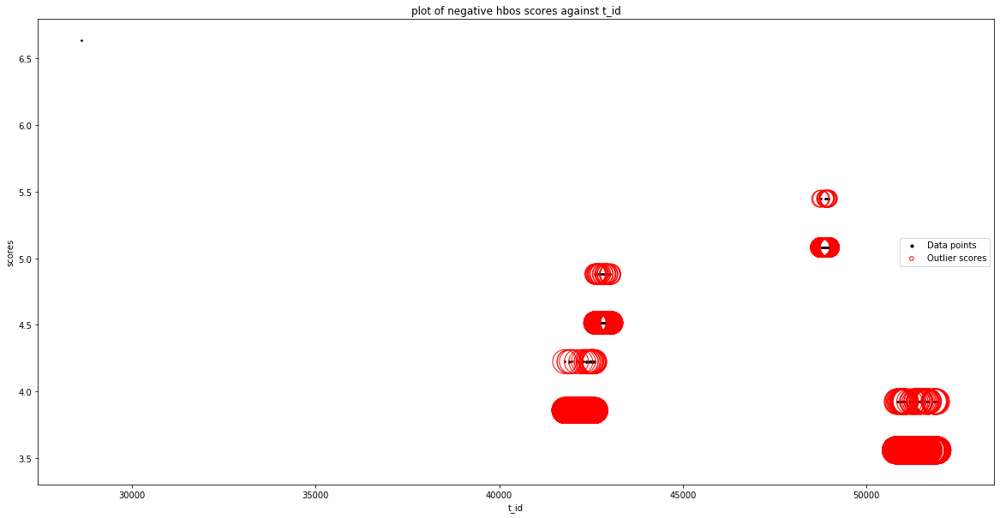

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['t_id', 'psh_flag_count'], dtype='object')
Number of Inliers :  2269
Number of Outliers :  242
Outlier index: 0
Outlier score: 6.6347031470292155
Outlier index: 763
Outlier score: 4.221606244778817
Outlier index: 937
Outlier score: 4.87866169467765
Outlier index: 1090
Outlier score: 4.87866169467765
Outlier index: 1244
Outlier score: 3.

davies bouldin Score: 3.002
calinski_harabasz Score: 44.218


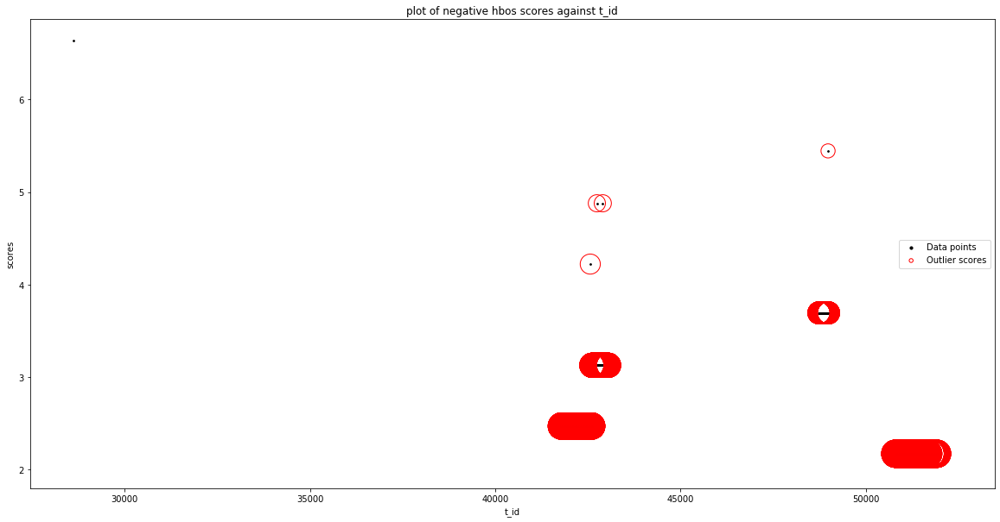

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'down_up_ratio']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No

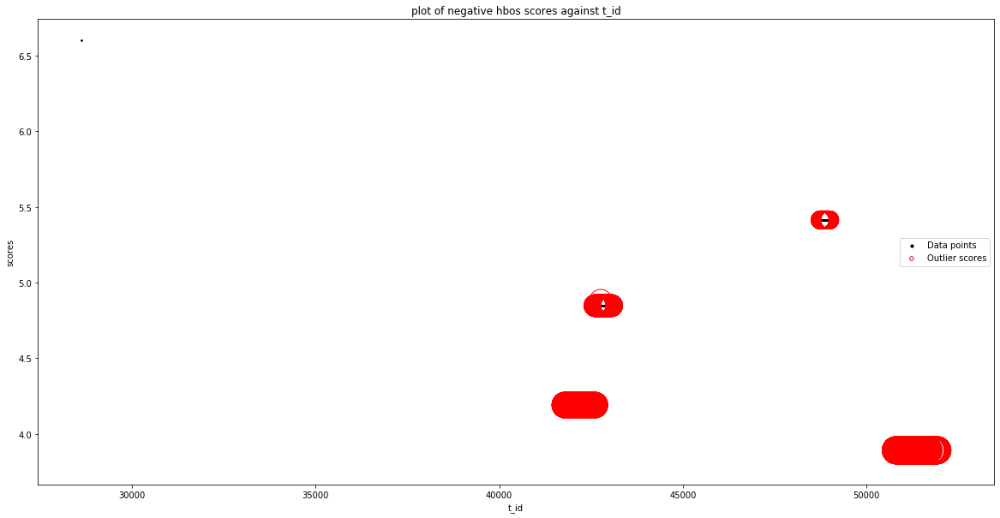

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'active_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No v

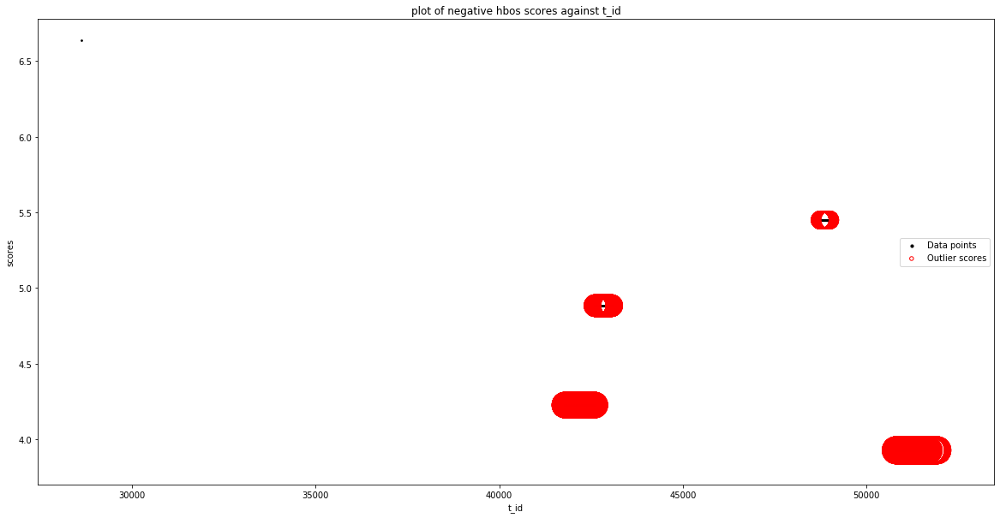

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['t_id', 'idle_max'], dtype='object')
Number of Inliers :  2272
Number of Outliers :  239
Outlier index: 0
Outlier score: 6.635872895755126
Outlier index: 1244
Outlier score: 5.023560471522558
Outlier index: 1245
Outlier score: 5.023560471522558
Outlier index: 1246
Outlier score: 5.023560471522558
Outlier index: 1247
Outlier score: 5.023560471522558
Outlier index: 1248
Outlier score: 5.023560471522558
Outlier index: 1249
Outlier score: 5.023560471522558
Outlier index: 1250
Outlier score: 5.023560471522558
Outlier index: 1251
Outlier score: 5.023560471522558
Outlier index: 1252
Outlier score: 5.023560471522558
Outlier index: 1253
Outlier score: 5.023560471522558
Outlier index: 1254
Outlier score: 5.

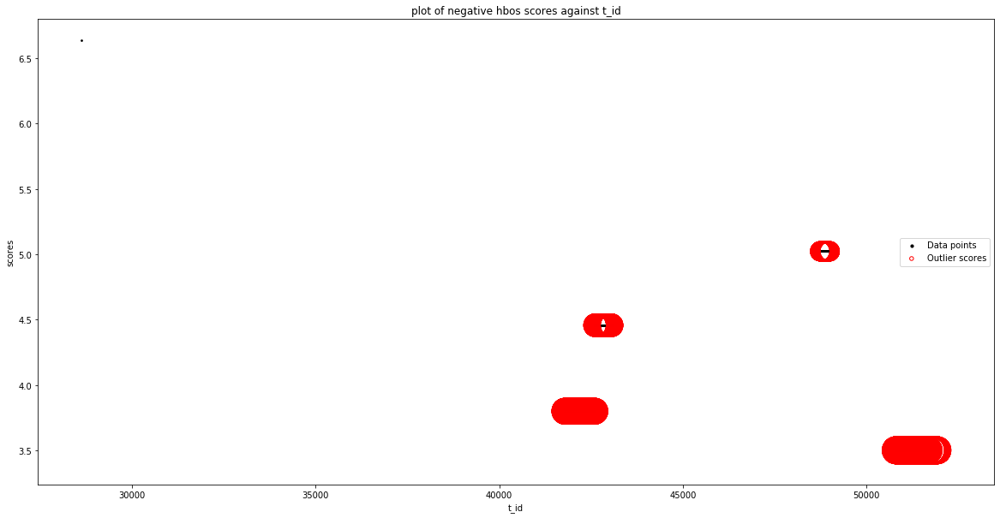

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['t_id', 'a_id'], dtype='object')
Number of Inliers :  2272
Number of Outliers :  239
Outlier index: 0
Outlier score: 6.633822999641296
Outlier index: 1244
Outlier score: 3.7234769483872086
Outlier index: 1245
Outlier score: 3.7234769483872086
Outlier index: 1246
Outlier score: 3.7234769483872086
Outlier index: 1247
Outlier score: 3.7234769483872086
Outlier index: 1248
Outlier score: 3.7234769483872086
Outlier index: 1249
Outlier score: 3.7234769483872086
Outlier index: 1250
Outlier score: 3.7234769483872086
Outlier index: 

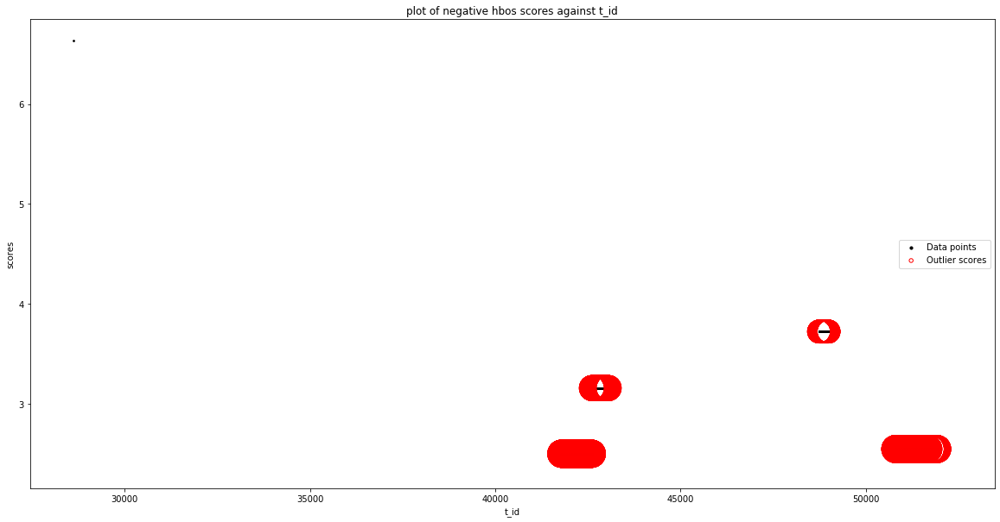

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'service_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30


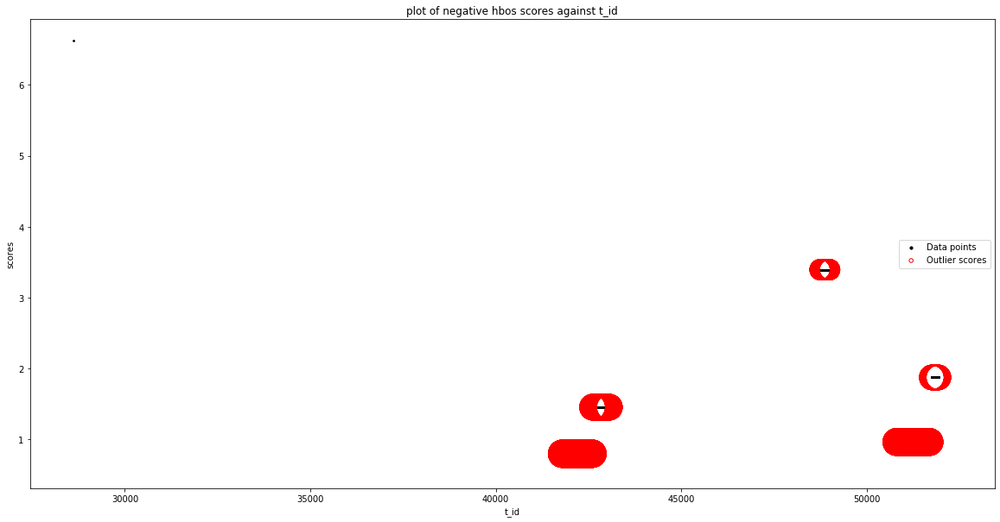

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['t_id', 'log_start_time']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No vali

No valid feature
No Valid columns found for combination of  ['src_ip', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_ip', 'bwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_ip', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_ip', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_ip', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_

No valid feature
No Valid columns found for combination of  ['src_ip', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_ip', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_ip', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_ip', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_ip', 'service_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_ip', 'service_pseu

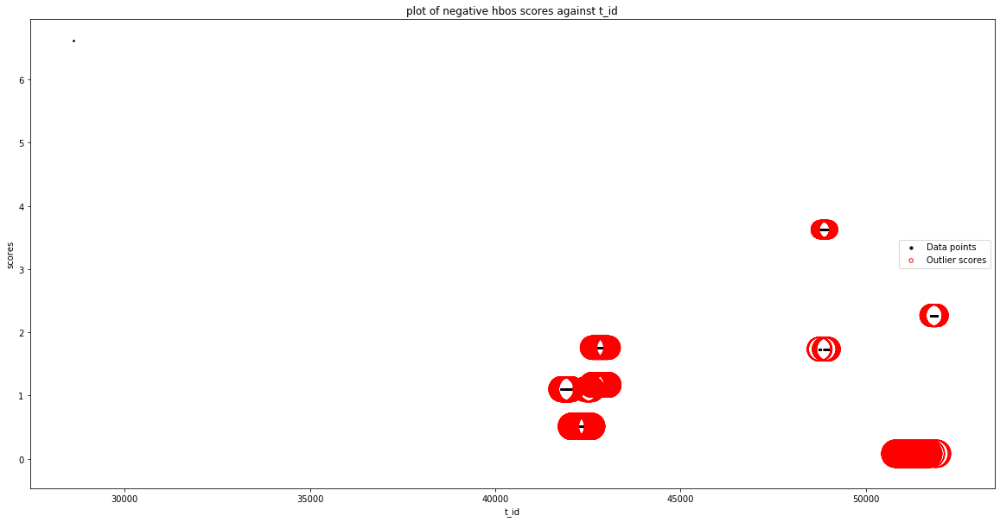

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Use

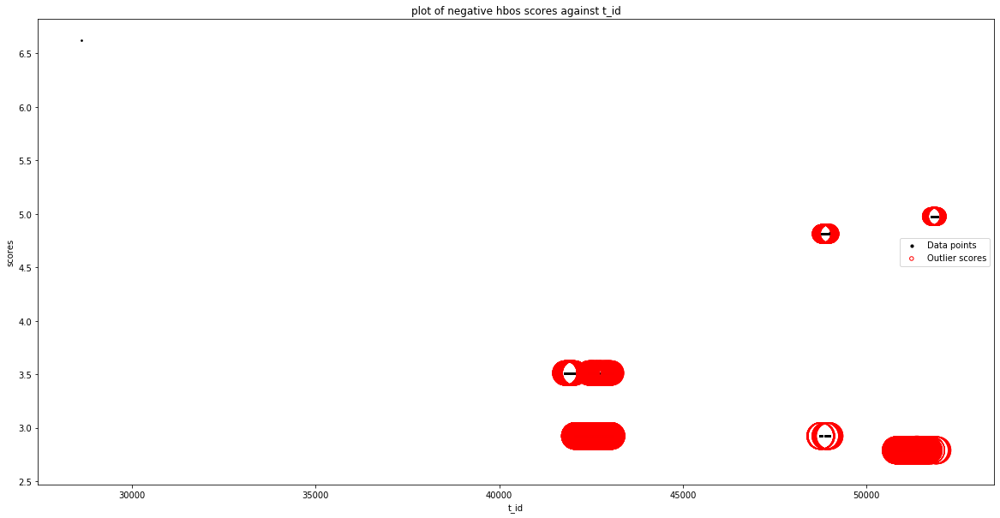

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['src_port', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2362
Number of Outliers :  149
Outlier index: 0
Outlier score: 6.622005425943508
Outlier index: 1363
Outlier score: 4.814194654096989
Outlier index: 1380
Outlier score: 4.814194654096989
Outlier index: 1446
Outlier score: 4.814194654096989
Outlier index: 1452
Outlier score: 4.814194654096989
Outlier index: 1459
Outlier score: 4.814194654096989
Outlier index: 2358
Outlier score: 4.5614763862501135
Outlier index: 2359
Outli

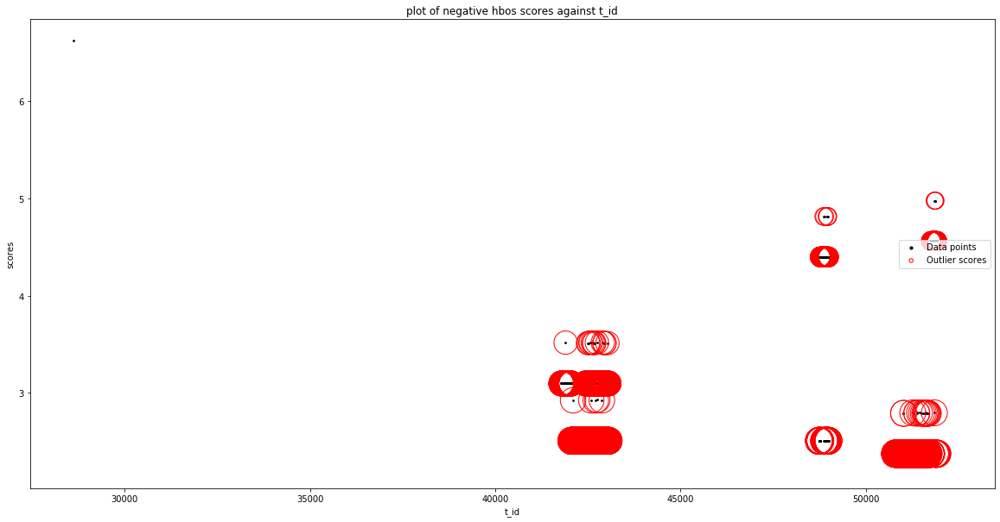

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['src_port', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2344
Number of Outliers :  167
Outlier index: 0
Outlier score: 6.390991403826162
Outlier index: 1
Outlier score: 3.287134088854057
Outlier index: 63
Outlier score: 3.3305067844999394
Outlier index: 76
Outlier score: 3.216775795827671
Outlier index: 83
Outlier score: 3.216775795827671
Outlier index: 113
Outlier score: 3.287134088854057
Outlier index: 115
Outlier score: 3.287134088854057
Outlier index: 174
Outlier score: 3.4934847043969635
Outlier index: 193
Outlier score: 3.3305067844999394
Outlier index: 311
Outlier score: 2.6981197342866587
Outlier index: 426
Outlier score: 2.8800299437789514
Outlier 

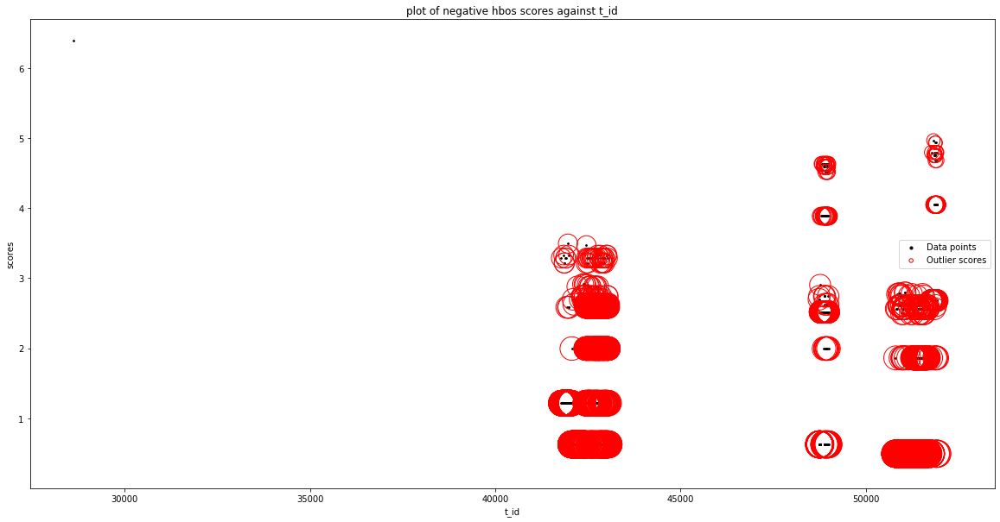

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['src_port', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2303
Number of Outliers :  208
Outlier index: 0
Outlier score: 6.51130979966564
Outlier index: 113
Outlier score: 3.508499935151828
Outlier index: 115
Outlier score: 3.407452484693535
Outlier index: 174
Outlier score: 3.407452484693535
Outlier index: 193
Outlier score: 3.407452484693535
Outlier index: 657
Outlier score: 3.407452484693535
Outlier index: 667
Outlier score: 3.489006552541137
Outlier index: 701
Outlier score: 3.407452484693535
Outlier index: 703
Outlier score: 3.506865388711439
Outlier index: 721
Outlier score: 3.506865388711439
Outlier index: 763
Outlier score: 3.506865388711439
Outlier index

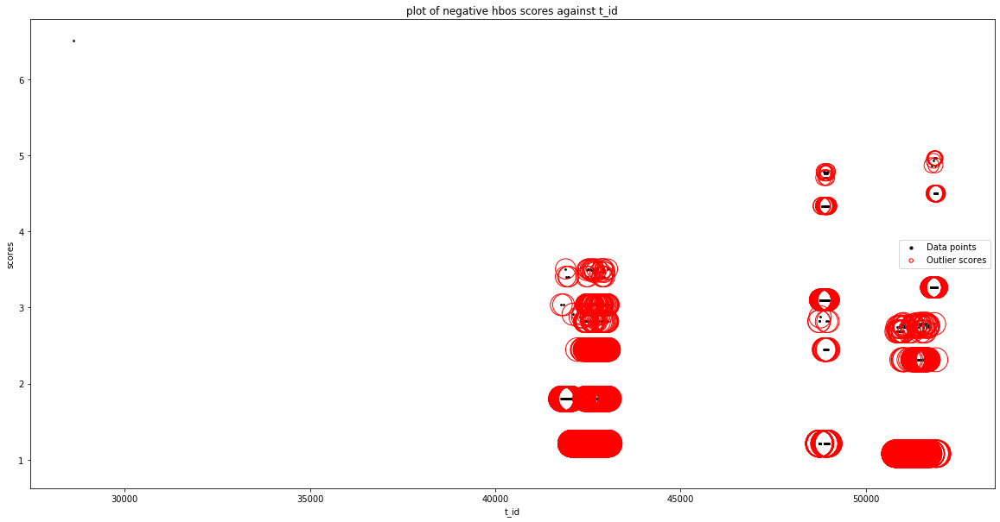

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'bwd_packet_length_std']
input parameters are being used instead

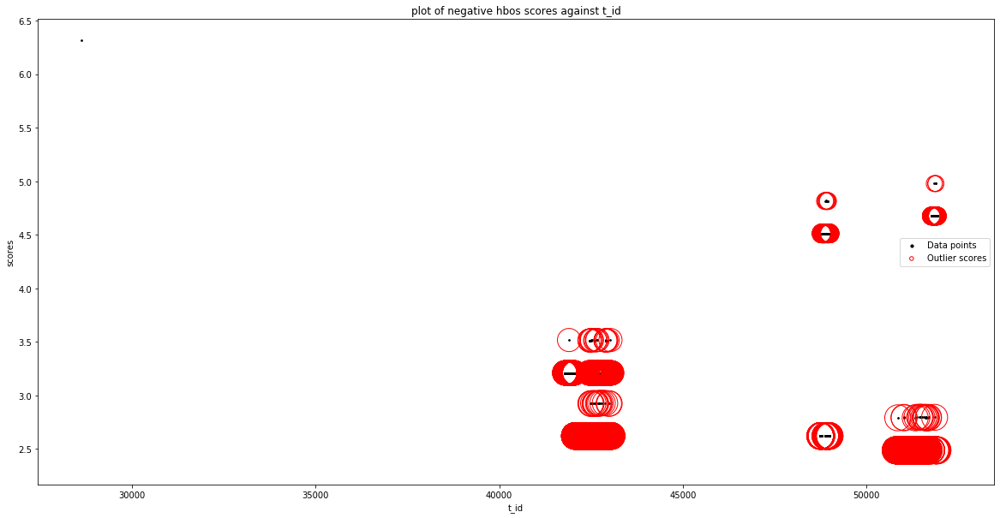

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['src_port', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2266
Number of Outliers :  245
Outlier index: 0
Outlier score: 5.625360857963804
Outlier index: 663
Outlier score: 3.5024959615739437
Outlier index: 749
Outlier score: 3.5024959615739437
Outlier index: 1033
Outlier score: 3.5024959615739437
Outlier index: 1059
Outlier score: 3.5024959615739437
Outlier index: 1098
Outlier score: 3.5024959615739437
Outlier index: 1195
Outlier score: 3.5084194485073437
Outlier index: 1280
Outlier score: 3.823088239768185
Outlier index: 1281
Outlier score: 3.823088239768185
Outlier index: 1282
Outlier score: 3.823088239768185
Outlier index: 1283
Outlier score: 3.823088239768185
Outlier index: 1289
Outlier score: 3.823088239768185
Outlier index: 1290
Outlier score: 3.823088239768185
Outlier index: 1291
Outlier score: 3.823088239768185
Outlier index: 1292
Outlier score: 3

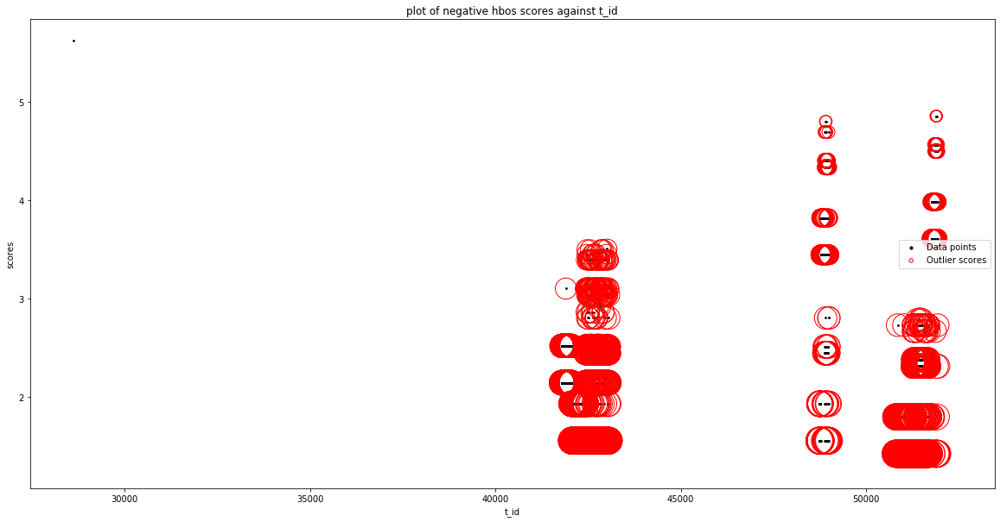

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['src_port', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2366
Number of Outliers :  145
Outlier index: 0
Outlier score: 6.595250077883902
Outlier index: 1468
Outlier score: 4.819920149005327
Outlier index: 2358
Outlier score: 4.955886863659789
Outlier index: 2359
Outlier score: 4.955886863659789
Outlier index: 2360
Outlier score: 4.955886863659789
Outlier index: 2361
Outlier score: 4.955886863659789
Outlier index: 2362
Outlier score: 4.955886863659789
Outlier index: 2363
Outlier score: 4.955886863659789
Outlier index: 2364
Outlier score: 4.955886863659789
Outlier index: 2365
Outlier score: 4.955886863659789
Outlier index: 2366
Outlier score: 4.955886863659789
Outlier index: 2367
Outlier score: 4.955886863659789
Outlier index: 2368
Outlier score: 4.955886863659789
Outlier index: 2369
Outlier score: 4.955886863659789
Outlier index: 2370
Outlier score: 4.9558868

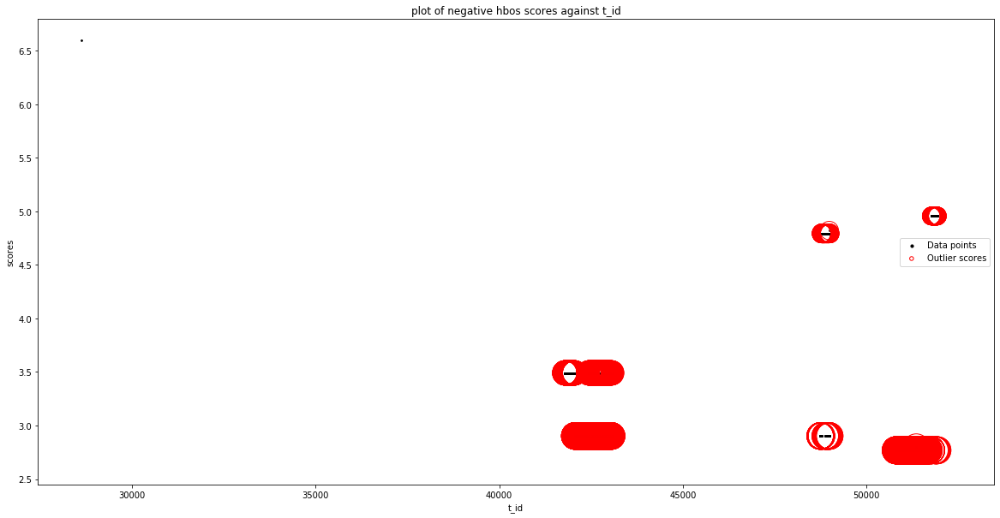

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['src_port', 'flow_iat_min'], dtype='object')
Number of Inliers :  2366
Number of Outliers :  145
Outlier index: 0
Outlier score: 6.14718665116065
Outlier index: 1359
Outlier score: 4.819258234909525
Outlier index: 2358
Outlier score: 4.507823436936537
Outlier index: 2359
Outlier score: 4.507823436936537
Outlier index: 2360
Outlier score: 4.507823436936537
Outlier index: 2361
Outlier score: 4.507823436936537
Outlier index: 2362
Outlier score: 4.507823436936537
Outlier index: 2363
Outlier score: 4.50782343693653

Silhouetter Score: 0.305
davies bouldin Score: 3.324
calinski_harabasz Score: 4.504


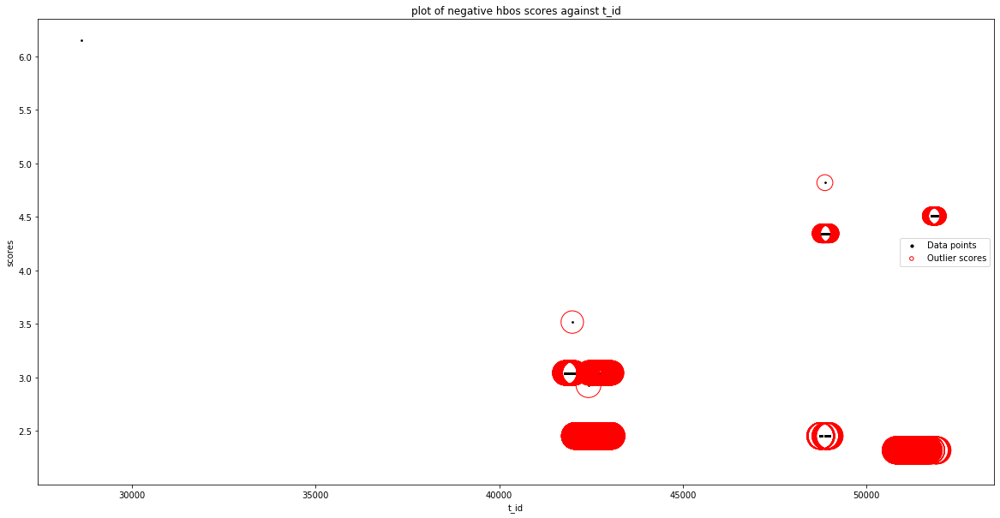

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['src_port', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2365
Number of Outliers :  146
Outlier index: 0
Outlier score: 6.271938660931749
Out

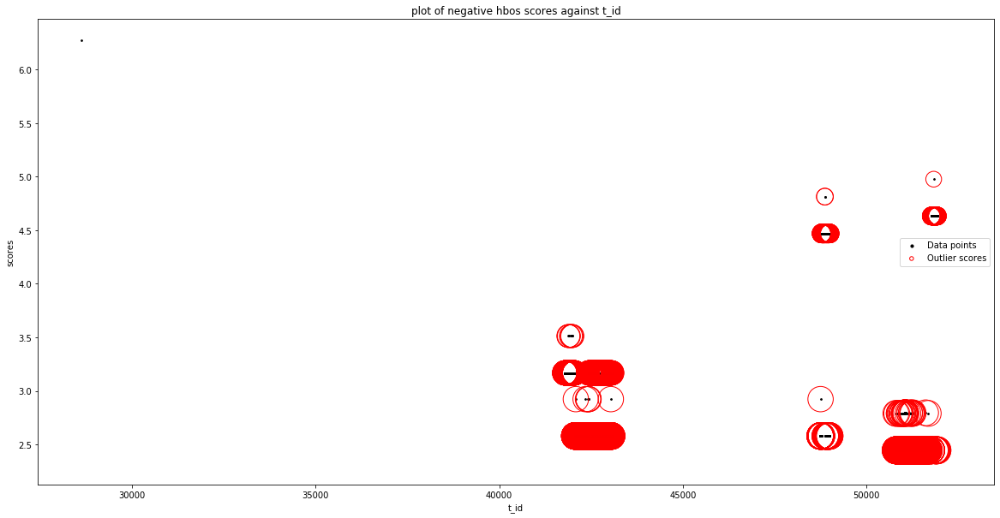

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['src_port', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2365
Number of Outliers :  146
Outlier index: 0
Outlier score: 6.378836042901338
Outl

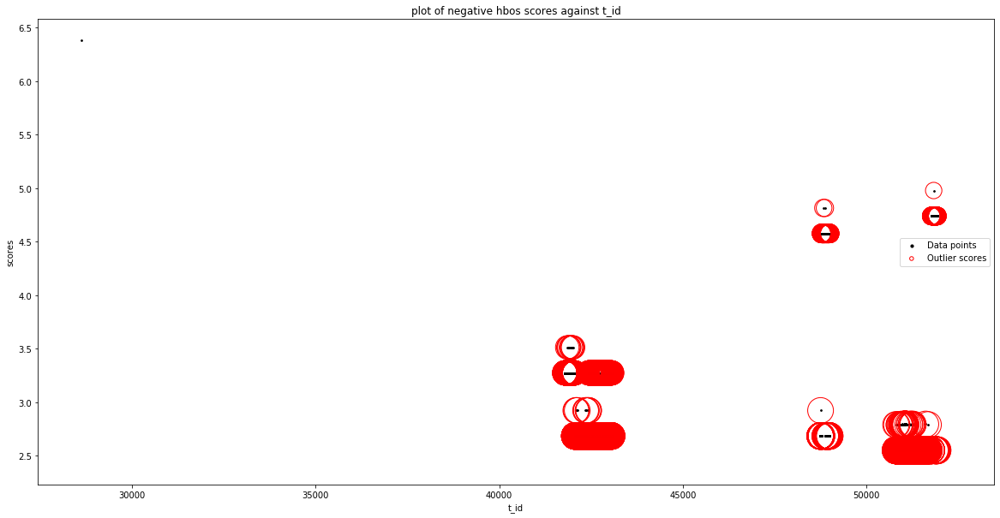

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.2

Silhouetter Score: 0.240
davies bouldin Score: 4.852
calinski_harabasz Score: 10.978


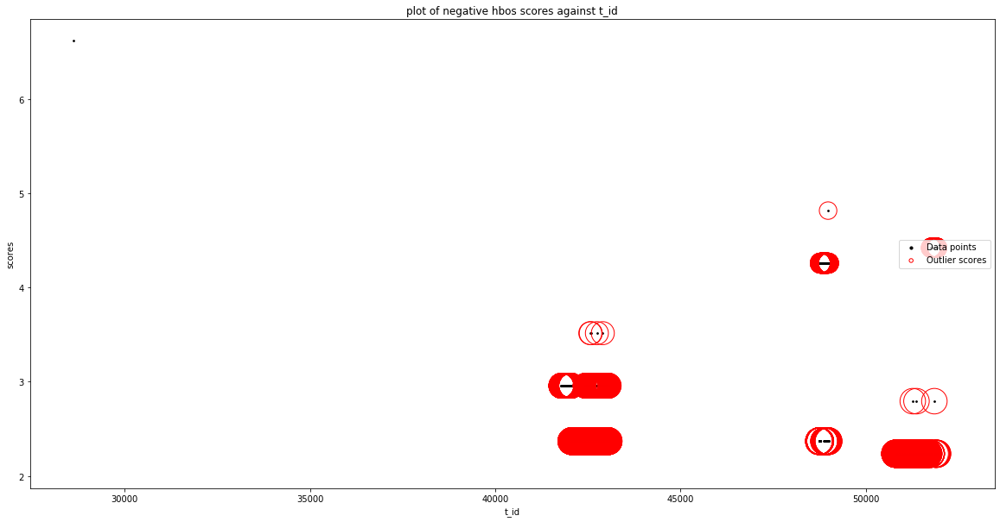

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'packet_length_mean']
input parameters are being used instead of default valu

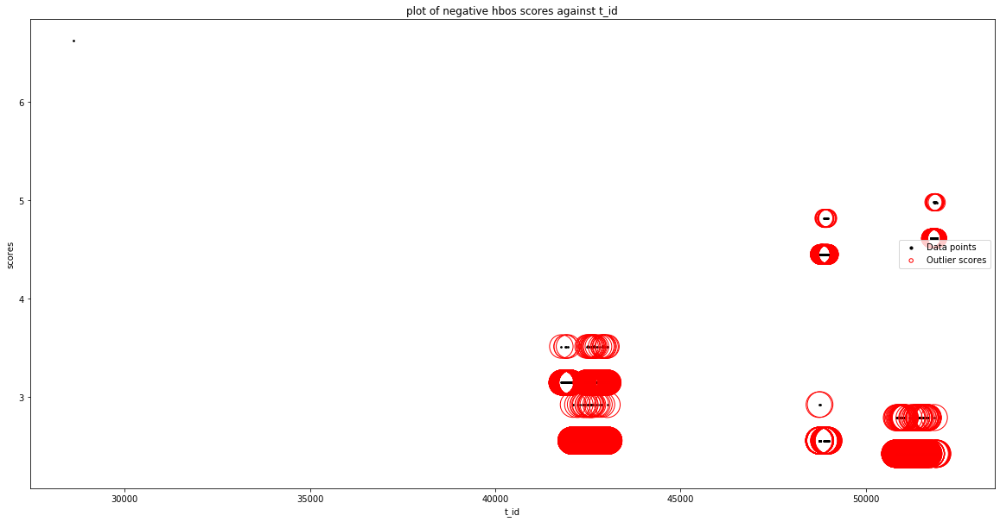

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['src_port', 'psh_flag_count'], dtype='object')
Number of Inliers :  2363
Number of Outliers :  148
Outlier index: 0
Outlier score: 6.620836282851473
Outlier index: 763
Outlier score: 3.512884742032331
Outlier index: 937
Outlier score: 3.512884742032331
Outlier index: 1090
Outlier score: 3.512884742032331
Outlier index: 1468


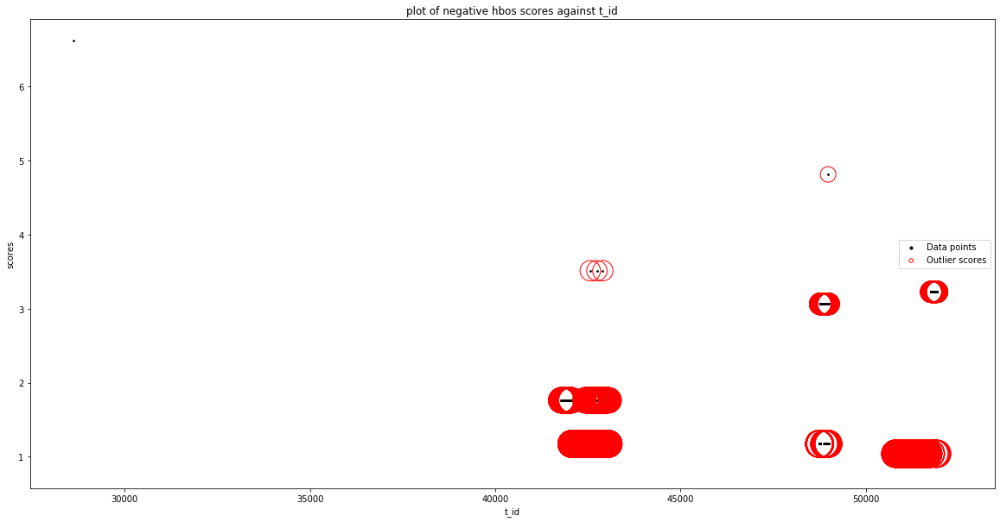

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'down_up_ratio']
input parameters are being used instead of default values
contamination: 0.2

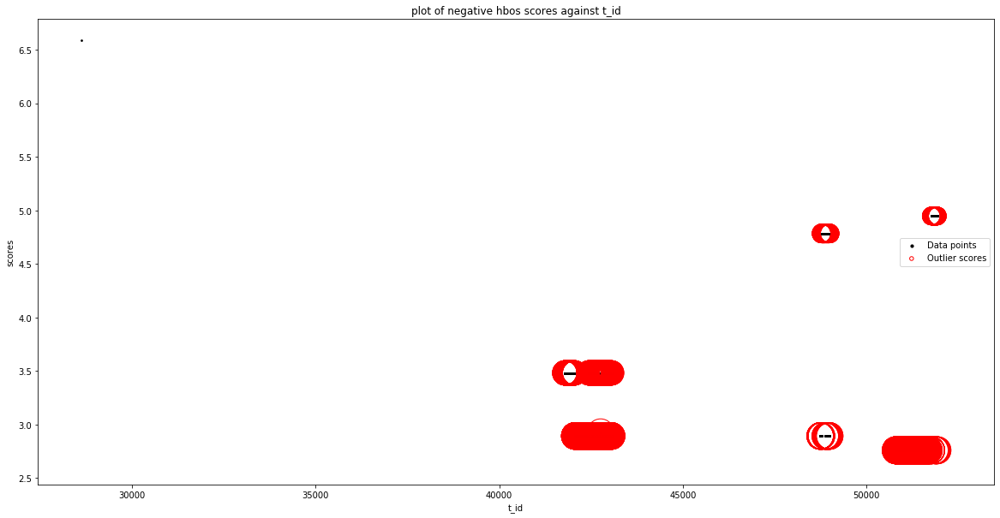

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'active_max']
input parameters are being used instead of default values
contamination: 0.27


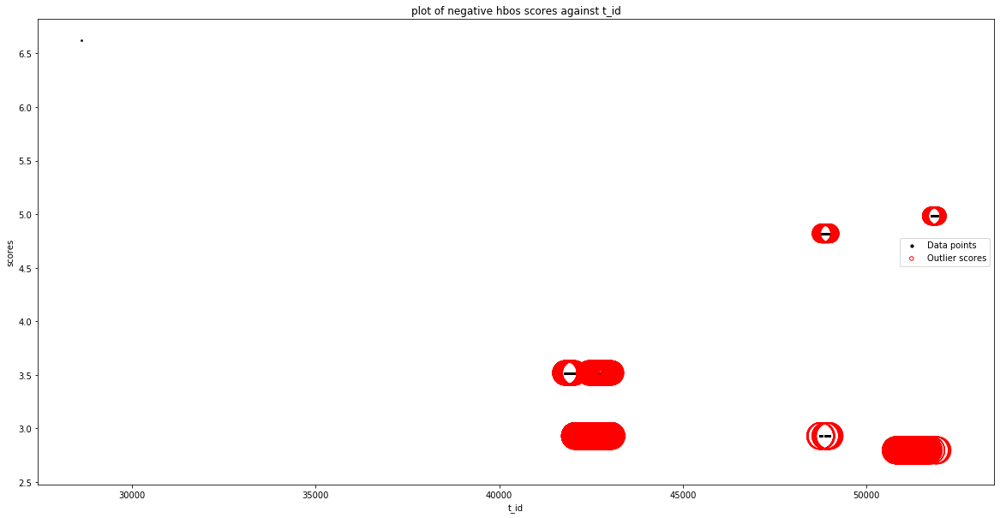

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['src_port', 'idle_max'], dtype='object')
Number of Inliers :  2367
Number of Outliers :  144
Outlier index: 0
Outlier score: 6.622006031577381
Outlier index: 2358
Outlier score: 4.556552134634655
Outlier index: 2359
Outlier score: 4.556552134634655
Outlier index: 2360
Outlier score: 4.556552134634655
Outlier index: 2361
Outlier score: 4.556552134634655
Outlier index: 2362
Outlier score: 4.556552134634655
Outlier index: 2363
Outlier score: 4.556552134634655
Outlier index: 2364
Outlier score: 4.556552134634655
Outlier index: 2365
Outlier score: 4.556552134634655
Outlier index: 2366
Outlier score: 4.556552134634655
Outlier index: 2367
Outlier score: 4.556552134634655
Outlier index: 2368
Outlier s

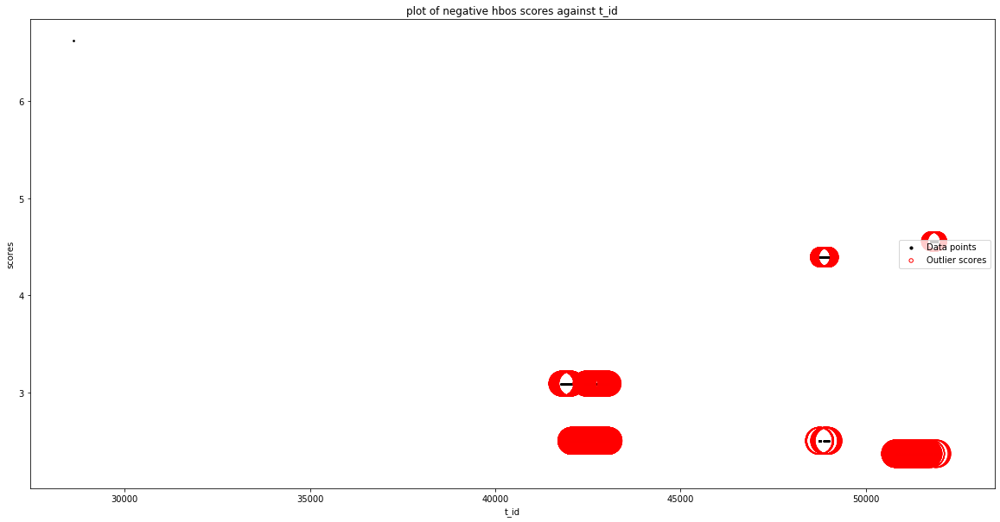

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['src_port', 'a_id'], dtype='object')
Number of Inliers :  2367
Number of Outliers :  144
Outlier index: 0
Outlier score: 6.619956135463552
Outlier index: 2358
Outlier score: 3.6019682309111483
Outlier index: 2359
Outlier score: 3.6019682309111483
Outlier index: 2360
Outlier score: 3.6019682309111483
Outlier index: 2361
Outlier score: 3.6019682309111483
Outlier index: 2362
Outlier score: 3.6019682309111483
Outlier index: 2363
Outlier score: 3.6019682309111483
Outlier index: 2364
Outlier score: 3.6019682309111483
Out

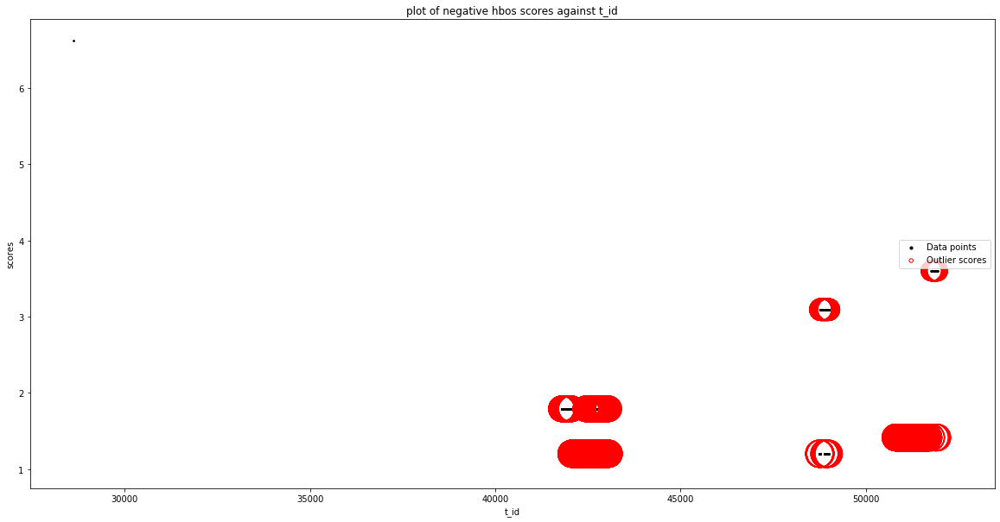

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'service_physical_ip']
input parameters are being used instead of default values
contamination: 0

Silhouetter Score: 0.462
davies bouldin Score: 0.419
calinski_harabasz Score: 576.650


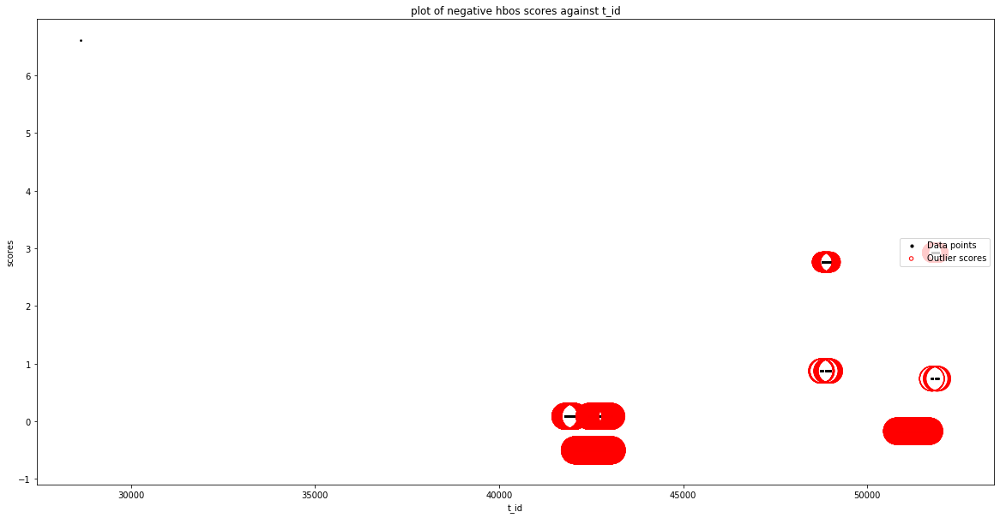

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['src_port', 'log_start_time']
input parameters are being used instead of default values
contamination: 0.27
n_n

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_ip', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_ip', 'bwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_ip', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_ip', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_ip', 'packet_length_min']
input parameters are being used instead of default values
con

No valid feature
No Valid columns found for combination of  ['dest_ip', 'a_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_ip', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_ip', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_ip', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_ip', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_ip', 'service_physical_ip']

No valid feature
No Valid columns found for combination of  ['dest_port', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_port', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_port', 'bwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_port', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_port', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_port', 'fwd_ur

No valid feature
No Valid columns found for combination of  ['dest_port', 'active_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_port', 'active_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_port', 'idle_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_port', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_port', 'idle_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['dest_port', 'idle_min']
input par

No valid feature
No Valid columns found for combination of  ['protocol', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['protocol', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['protocol', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['protocol', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['protocol', 'fwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['protocol', 'bwd_iat_tota

No valid feature
No Valid columns found for combination of  ['protocol', 'subflow_bwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['protocol', 'fwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['protocol', 'bwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['protocol', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['protocol', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination 

No valid feature
No Valid columns found for combination of  ['timestamp', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['timestamp', 'bwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['timestamp', 'flow_bytes_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['timestamp', 'flow_pkts_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['timestamp', 'flow_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combi

No valid feature
No Valid columns found for combination of  ['timestamp', 'fwd_packet_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['timestamp', 'fwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['timestamp', 'bwd_bytes_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['timestamp', 'bwd_packet_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['timestamp', 'bwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns foun

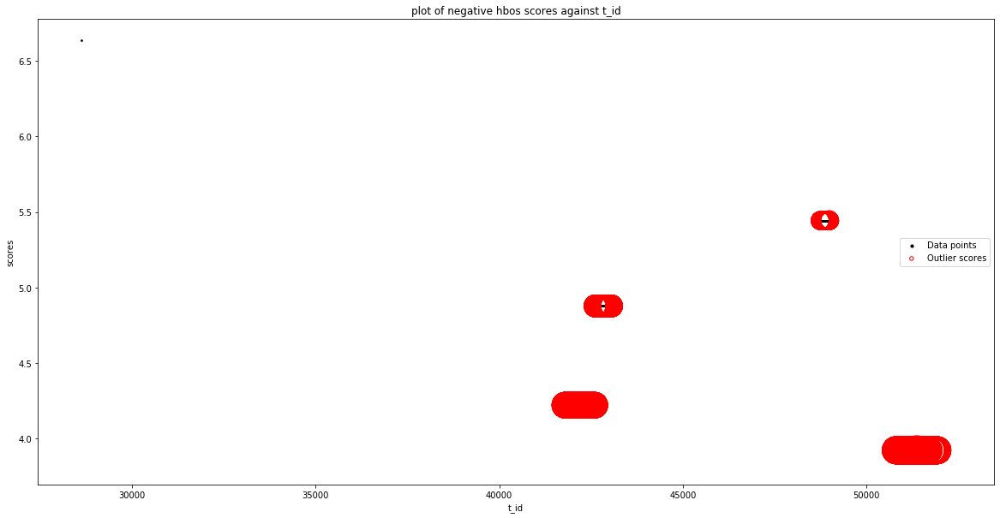

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_duration', 'src_port'], dtype='object')
Number of Inliers :  2366
Number of Outliers :  145
Outlier index: 0
Outlier score: 6.622200870242304
Outlier index: 1468
Outlier score: 4.819928252046686
Outlier index: 2358
Outlier score: 4.975983194328393
Outlier index: 2359
Outlier score: 4.975983194328393
Outlier index: 2360
Outlier score: 4.975983194328393
Outlier index: 2361
Outlier score: 4.975983194328393
Outlier index: 2362
Outlier score: 4.975983194328393
Outlier index: 2363
Outlier score: 4.975983194328393
Outlier index: 2364
Outlier score: 4.975983194328393
Outlier index: 2365
Outlier score: 4.975983194328393
Outlier index: 2366
Outlier score: 4.975983194328393
Outlier index: 2367
O

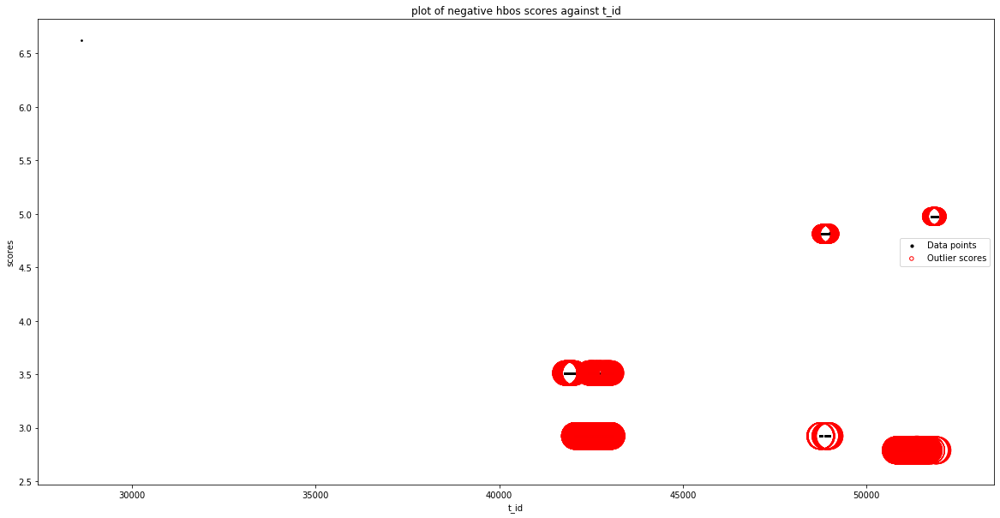

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'total_fwd_packets']
input parameters are being used instead of default values
contaminatio

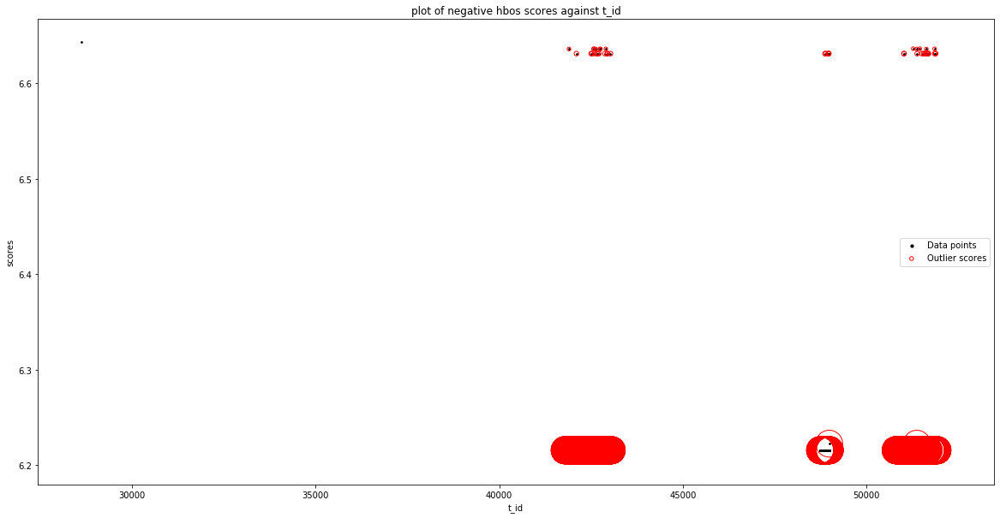

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_duration', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
Outlier index: 0
Outlier score: 6.41264124208429
Outlier index: 1
Outlier score: 6.405786780394491
Outlier index: 63
Outlier score: 6.449159476040374
Outlier index: 113
Outlier score: 6.405786780394491
Outlier index: 115
Outlier score: 6.405786780394491
Outlier index: 174
Outlier score: 6.612137395937398
Outlier index: 193
Outlier score: 6.449159476040374
Outlier index: 311
Outlier score: 6.405786780394491
Outlier index: 426
Outlier score: 6.587696989886784
Outlier index: 498
Outlier score: 6.405786780394491
Outlier index: 553
Outlier score: 6.449159476040374
Ou

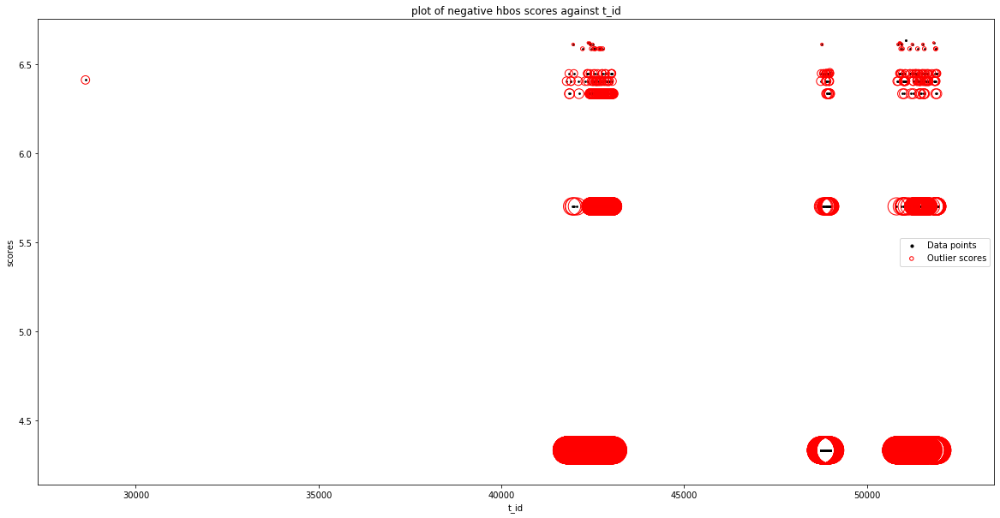

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_duration', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2355
Number of Outliers :  156
Outlier index: 0
Outlier score: 6.532959637923768
Outlier index: 113
Outlier score: 6.627152626692263
Outlier index: 115
Outlier score: 6.526105176233969
Outlier index: 174
Outlier score: 6.526105176233969
Outlier index: 193
Outlier score: 6.526105176233969
Outlier index: 311
Outlier score: 6.618998350888452
Outlier index: 498
Outlier score: 6.5852449431925635
Outlier index: 564
Outlier score: 6.5852449431925635
Outlier index: 574
Outlier score: 6.618998350888452
Outlier index: 616
Outlier score: 6.526105176233969
Outlier index: 625
Outlier score: 6.526105176233969


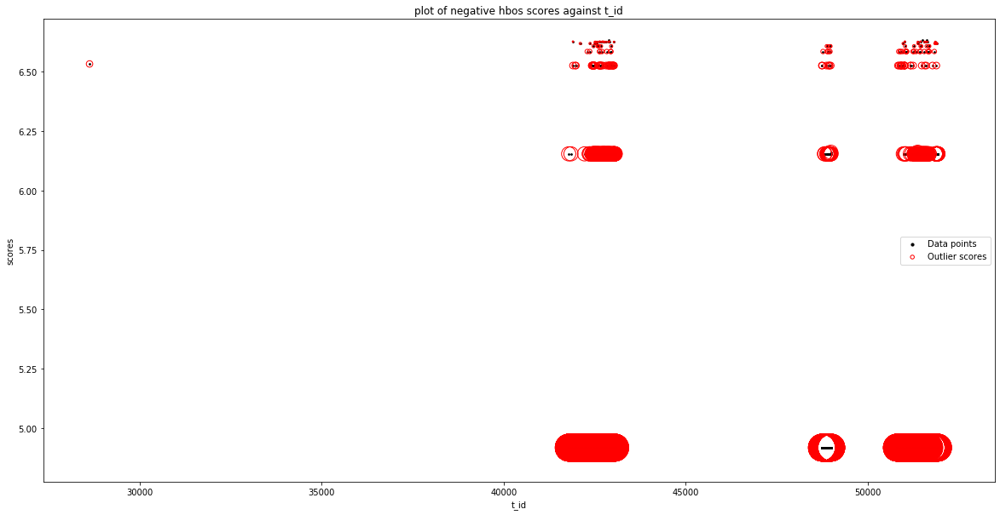

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'bwd_packet_length_std']
input paramete

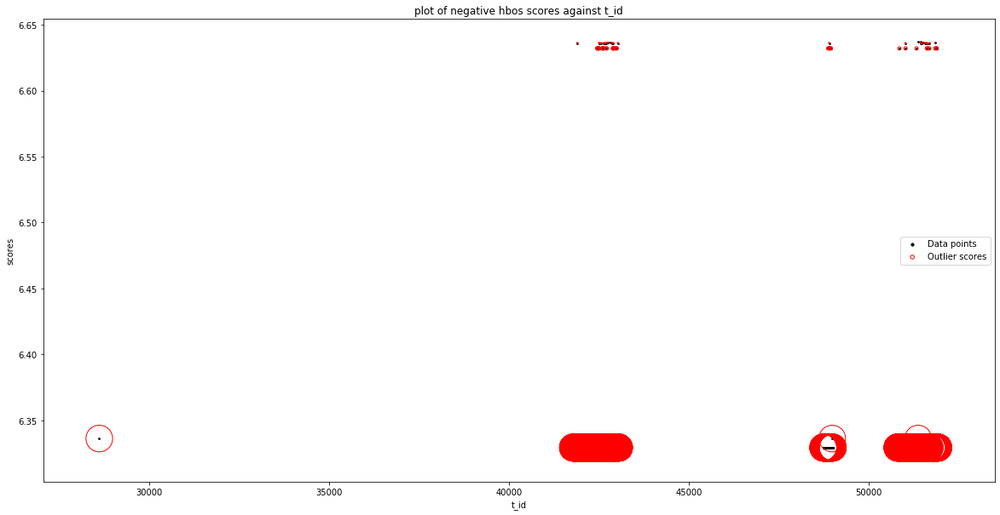

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_duration', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2399
Number of Outliers :  112
Outlier index: 653
Outlier score: 6.512990648770216
Outlier index: 663
Outlier score: 6.621148653114378
Outlier index: 667
Outlier score: 6.572709811456928
Outlier index: 674
Outlier score: 6.572709811456928
Outlier index: 687
Outlier score: 6.512990648770216
Outlier index: 689
Outlier score: 6.512990648770216
Outlier index: 694
Outlier score: 6.512990648770216
Outlier index: 701
Outlier score: 6.512990648770216
Outlier index: 707
Outlier score: 6.572709811456928
Outlier index: 709
Outlier score: 6.512990648770216
Outlier index: 713
Outlier score: 6.512990648770216
Outlier index: 732
Outlier score: 6.512990648770216
Outlier index: 747
Outlier score: 6.512990648770216
Outlier index: 749
Outlier score: 6.621148653114378
Outlier index: 762
Outlier score: 6.5129906487

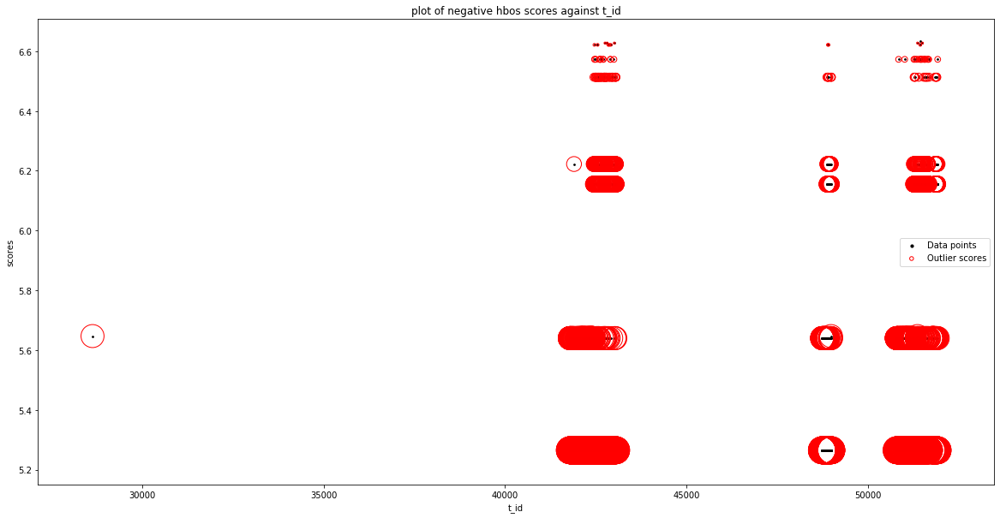

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_duration', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2507
Number of Outliers :  4
Outlier index: 0
Outlier score: 6.61689991614203
Outlier index: 1468
Outlier score: 6.643842605459073
Outlier index: 2030
Outlier score: 6.636988143769274
Outlier index: 2046
Outlier score: 6.61689991614203
Total number of outliers found: 4
Silhouetter Score: 0.997
davies bouldin Score: 0.811
calinski_harabasz Score: 2786.699


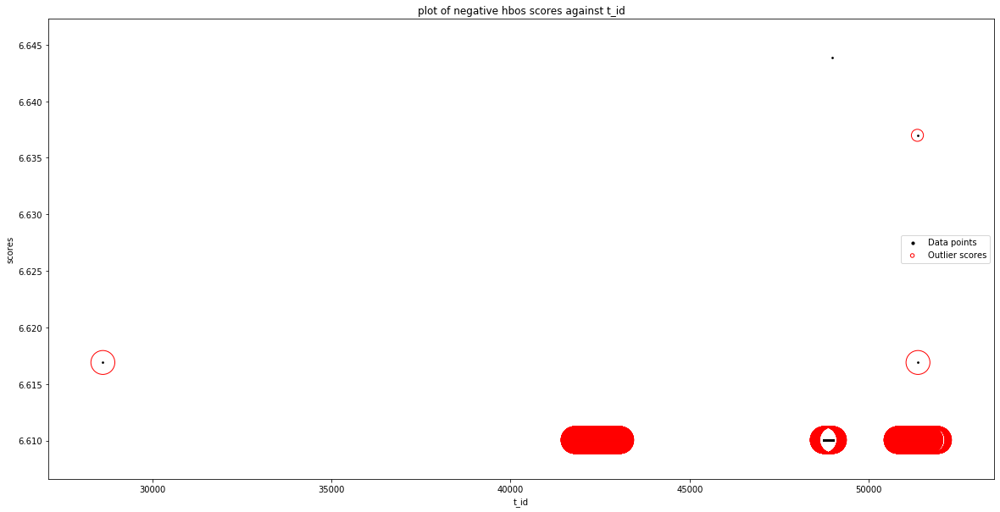

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_duration', 'flow_iat_min'], dtype='object')
Number of Inliers :  2505
Number of Outliers :  6
Outlier index: 0
Outlier score: 6.168836489418778
Outlier index: 199
Outlier score: 6.636326229673473
Outlier index: 631
Outlier score: 6.636326229673473
Outlier index: 1359
Outlier score: 6.636326229673473
Outlier index: 1468
Outlier score: 6.168836489418778
Outlier index: 2046
Outlier score: 6.168836489418778
Total number of outliers found: 6
Silhouetter Score: 0.994
davies bouldin Score: 1.196
calin

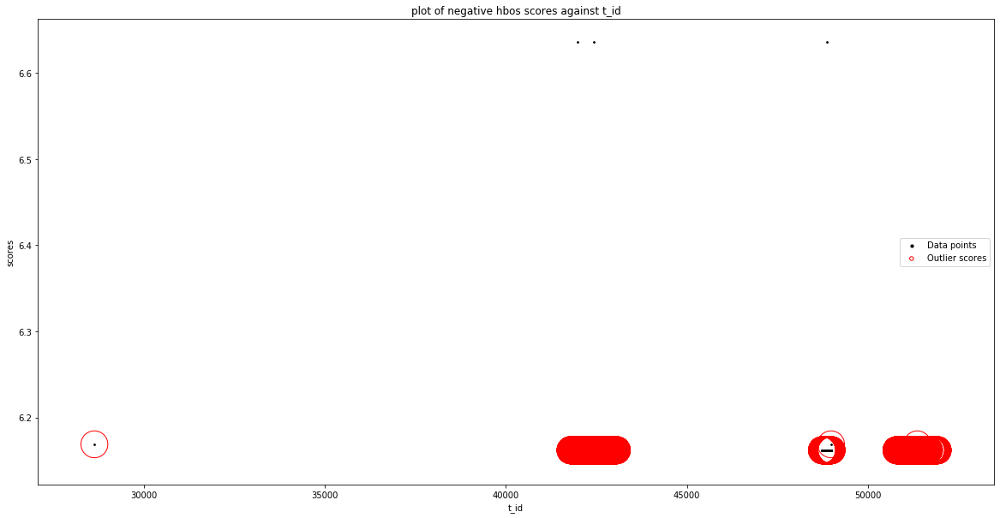

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_duration', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2456
Number of Outliers :  55
Outlier index: 0
Outlier scor

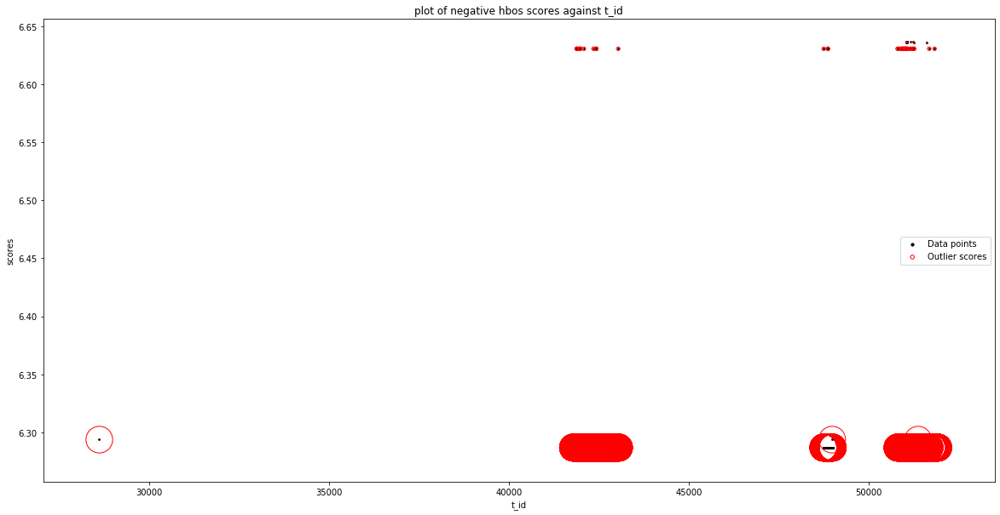

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_duration', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2442
Number of Outliers :  69
Outlier index: 0
Outlier score

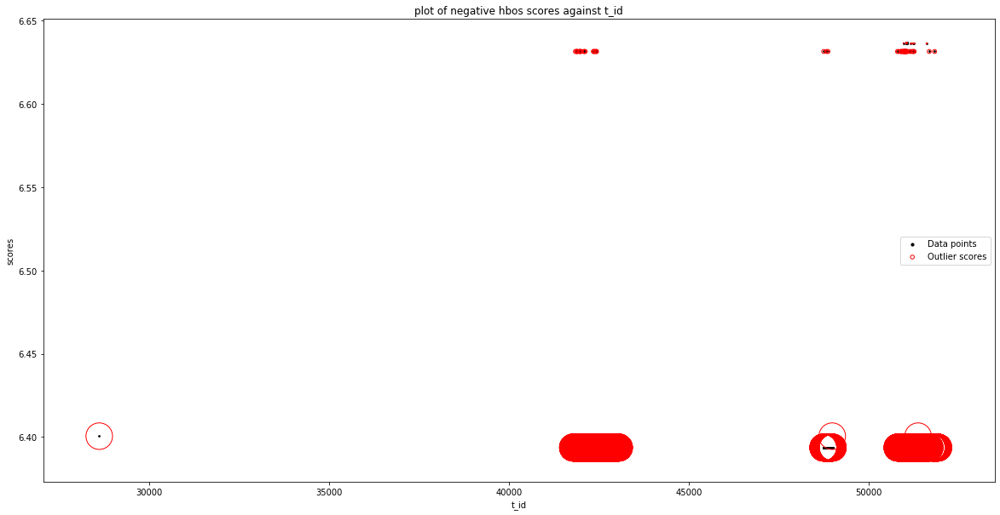

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'fwd_header_length']
input parameters are being used instead of default 

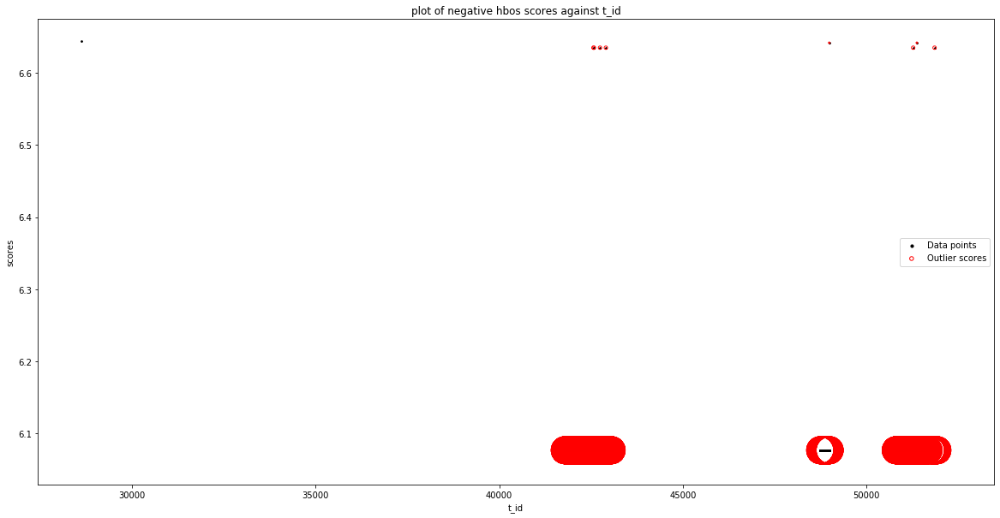

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'packet_length_mean']
input parameters are being use

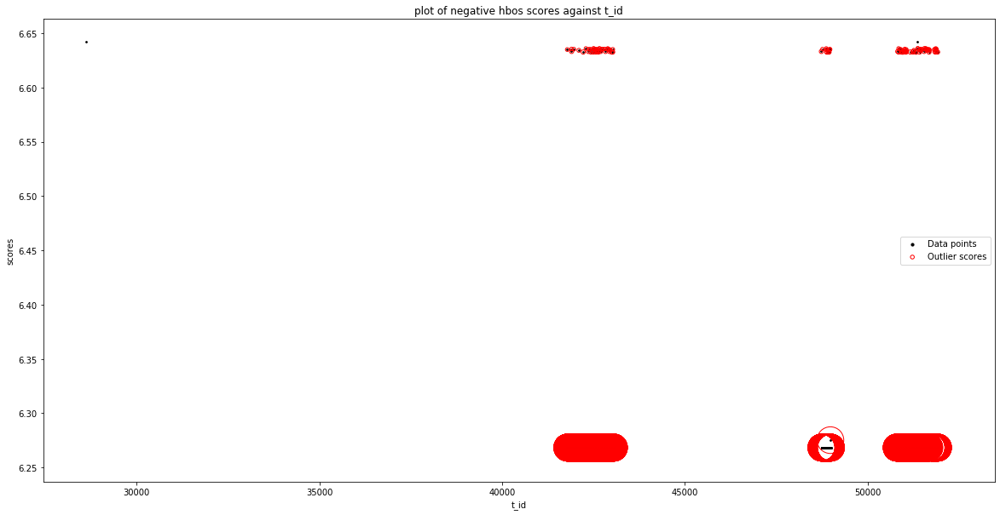

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_duration', 'psh_flag_count'], dtype='object')
Number of Inliers :  2505
Number of Outliers :  6
Outlier index: 0
Outlier score: 6.6424861211096005
Outlier index: 763
Outlier score: 6.631537433572765
Outlier index: 937
Outlier score: 6.631537433572765
Outlier index: 1090
Outlier score: 6.631537433572765
O

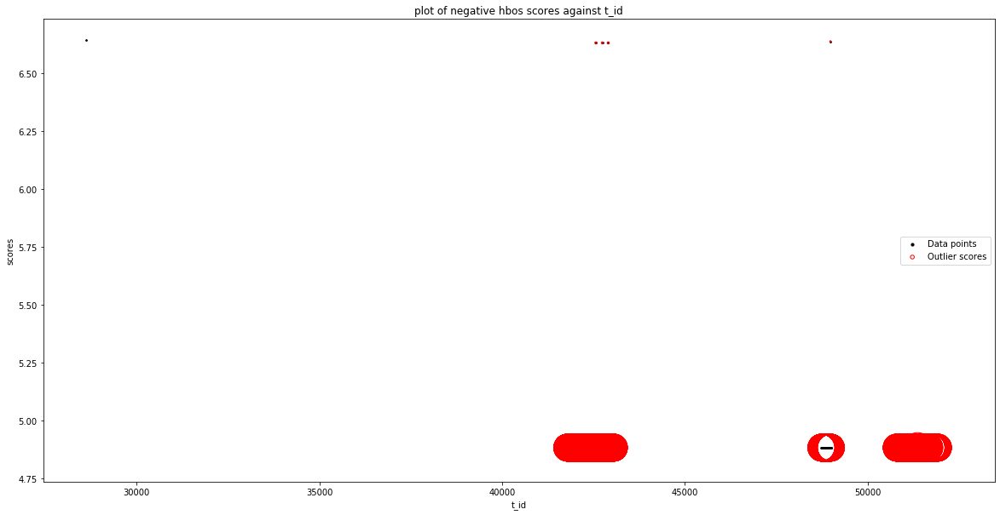

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'down_up_ratio']
input parameters are being used instead of default 

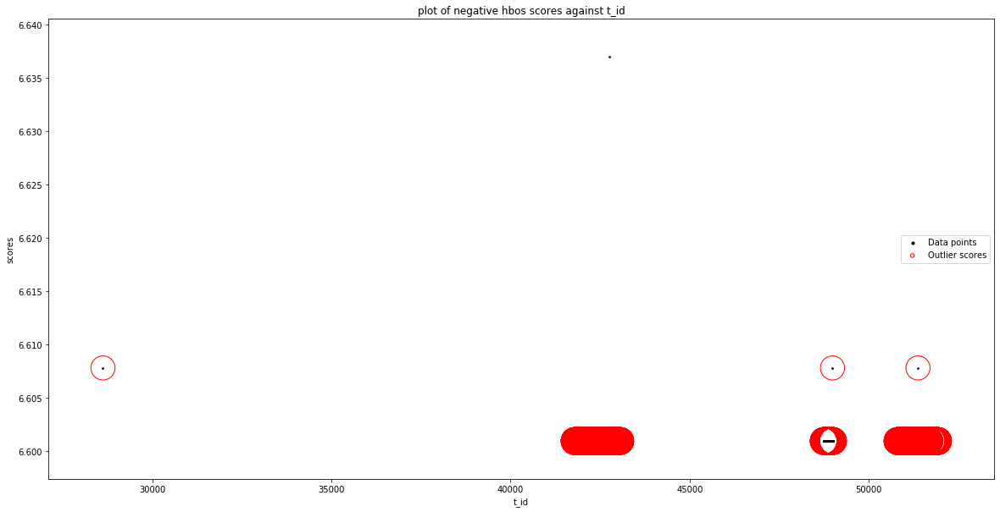

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'active_max']
input parameters are being used instead of default va

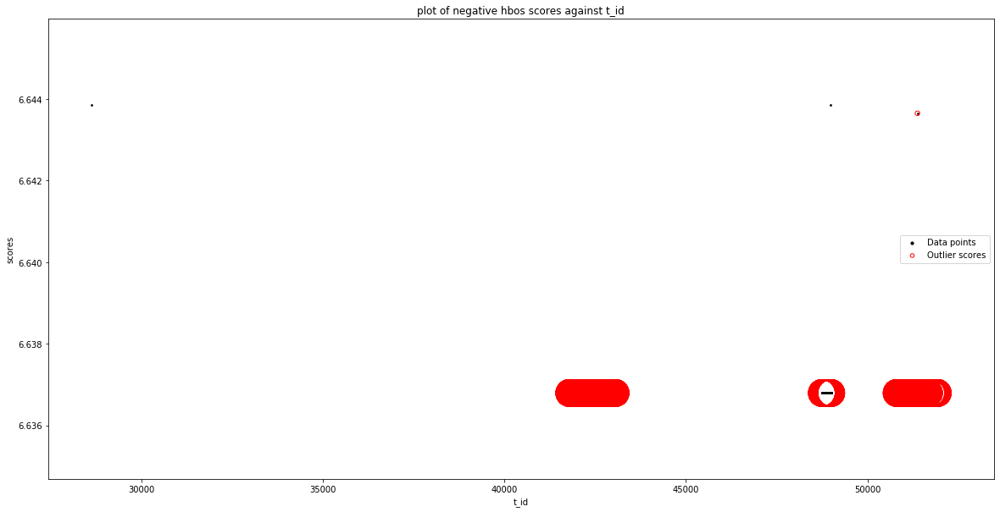

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_duration', 'idle_max'], dtype='object')
Number of Inliers :  2508
Number of Outliers :  3
Outlier index: 0
Outlier score: 6.643655869835509
Outlier index: 1468
Outlier score: 6.217565187116896
Outlier index: 2046
Outlier score: 6.217565187116896
Total number of outliers found: 3
Silhouetter Score: 0.997
davies bouldin Score: 0.662
calinski_harabasz Score: 4424.427


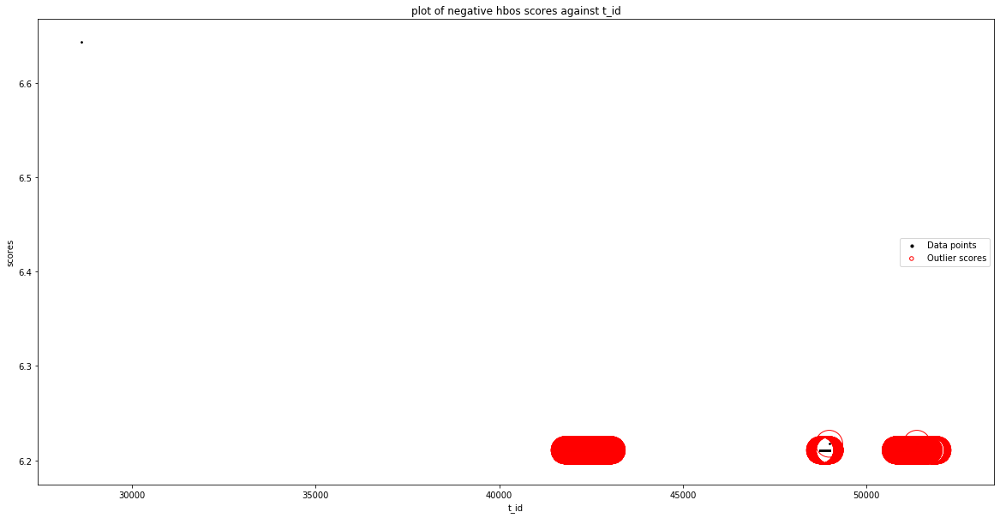

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_duration', 'a_id'], dtype='object')
Number of Inliers :  2509
Number of Outliers :  2
Outlier index: 0
Outlier score: 6.6416059737216795
Outlier index: 2046
Outlier score: 5.262981283393389
Total number of outliers found: 2
Silhouetter Score: 0.995
davies bouldin Score: 0.611
calinski_harabasz Score: 304.352


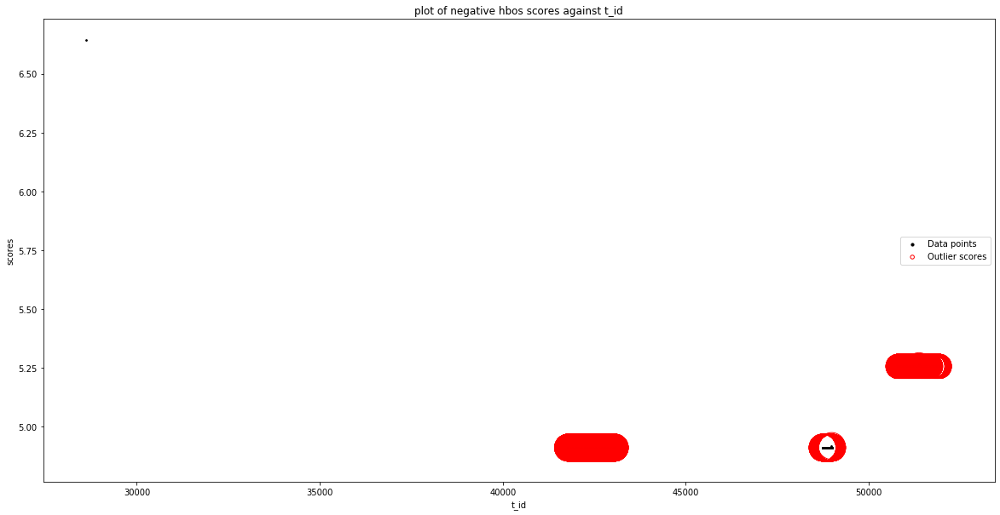

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'service_physical_ip']
input parameters are being used instead of defaul

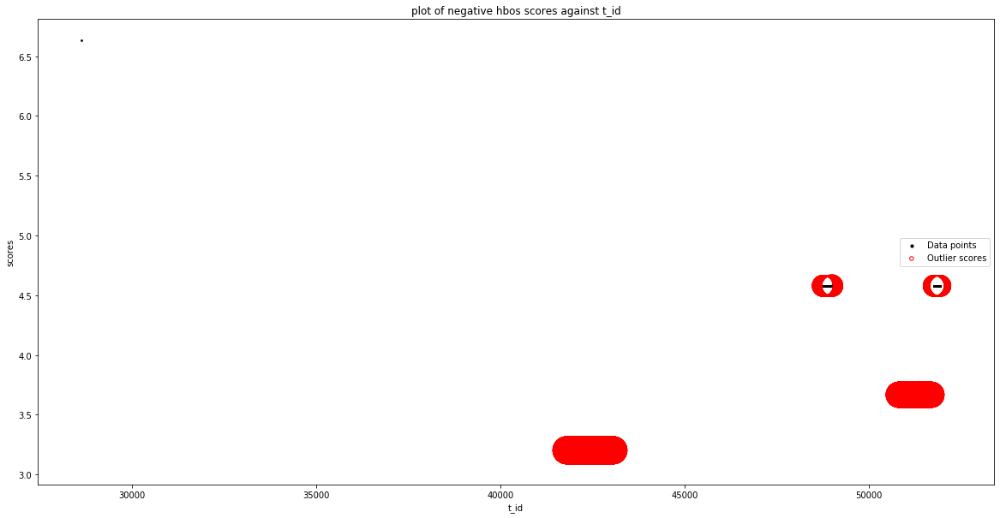

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_duration', 'log_start_time']
input parameters are being used instead of default value

No valid feature
No Valid columns found for combination of  ['total_fwd_packets', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_fwd_packets', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_fwd_packets', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_fwd_packets', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_fwd_packets', 'bwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid c

No valid feature
No Valid columns found for combination of  ['total_fwd_packets', 'idle_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_fwd_packets', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_fwd_packets', 'idle_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_fwd_packets', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_fwd_packets', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination 

No valid feature
No Valid columns found for combination of  ['total_bwd_packets', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_bwd_packets', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_bwd_packets', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_bwd_packets', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_bwd_packets', 'fwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found f

No valid feature
No Valid columns found for combination of  ['total_bwd_packets', 'subflow_fwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_bwd_packets', 'subflow_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_bwd_packets', 'subflow_bwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_bwd_packets', 'fwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_bwd_packets', 'bwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid fe

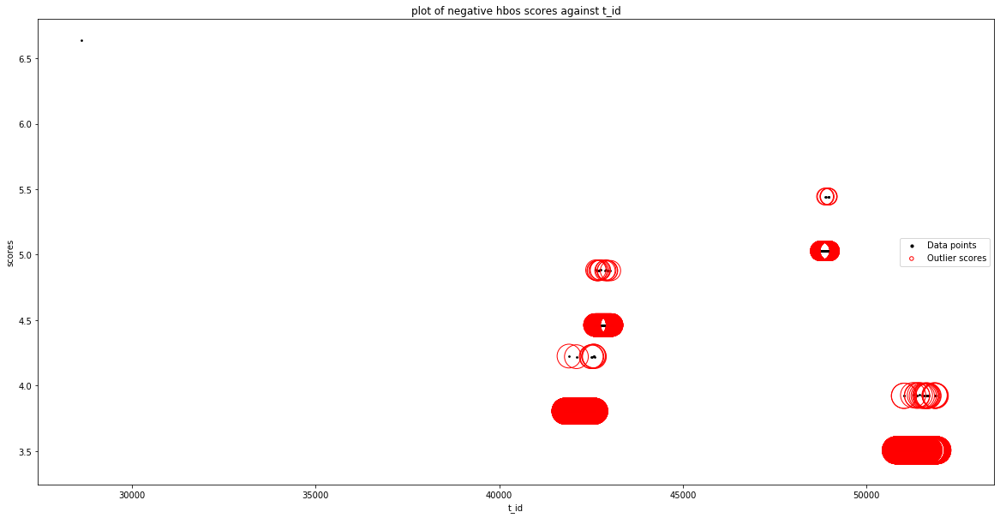

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['total_length_of_fwd_packet', 'src_port'], dtype='object')
Number of Inliers :  2362
Number of Outliers :  149
Outlier index: 0
Outlier score: 6.622005425943508
Outlier index: 1363
Outlier score: 4.814194654096989
Outlier index: 1380
Outlier score: 4.814194654096989
Outlier index: 1446
Outlier score: 4.814194654096989
Outlier index: 1452
Outlier score: 4.814194654096989
Outlier index: 1459
Outlier score: 4.814194654096989
Outlier index: 2358
Outlier score: 4.5614763862501135
Outlier index: 2359
Outlier score: 4.5614763862501135
Outlier index: 2360
Outlier score: 4.5614763862501135
Outlier index: 2361
Outlier score: 4.5614763862501135
Outlier index: 2362
Outlier score: 4.5614763

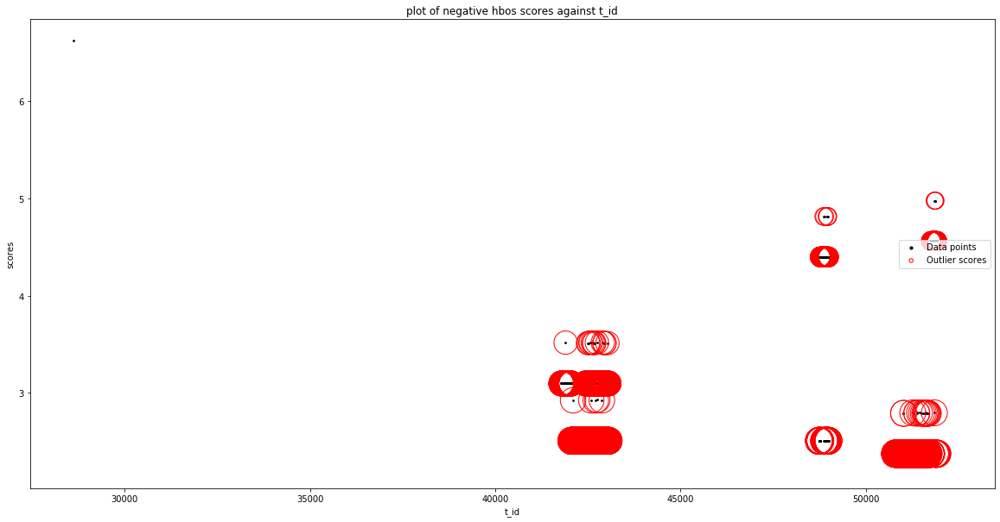

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['total_length_of_fwd_packet', 'flow_duration'], dtype='object')
Number of Inliers :  2467
Nu

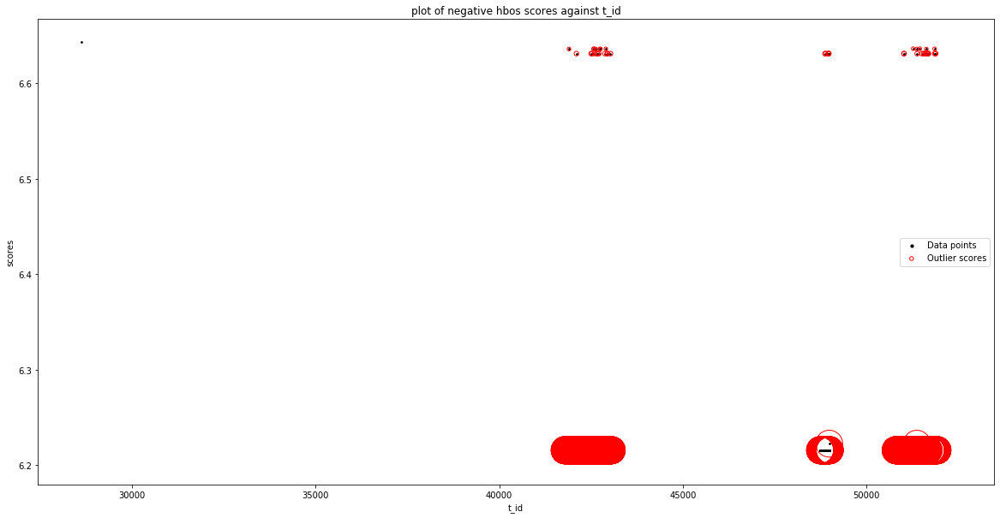

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['total_length_of_fwd_packet', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
Outlier index: 0
Outlier score: 6.4124457977854945
Outlier index: 1
Outlier score: 5.991279972316212
Outlier index: 63
Outlier sco

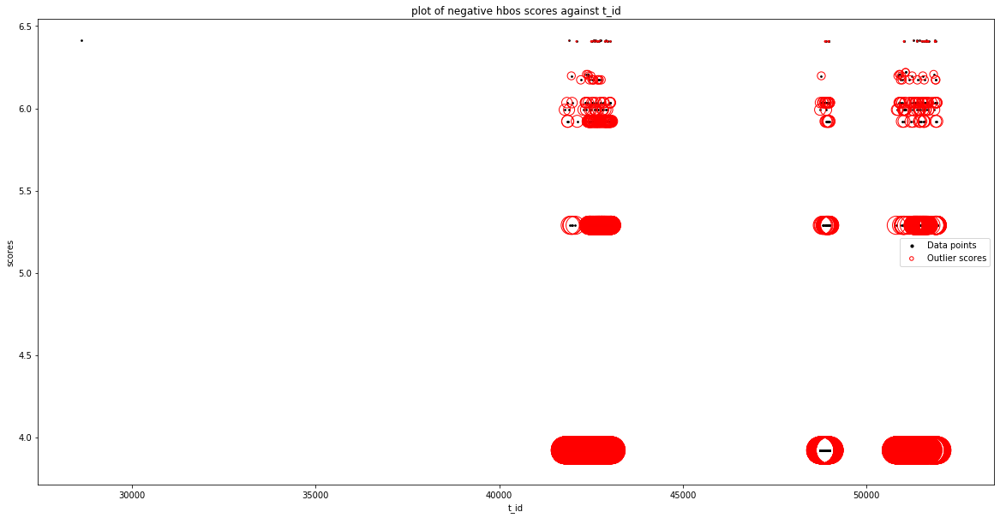

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['total_length_of_fwd_packet', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2357
Number of Outliers :  154
Outlier index: 0
Outlier score: 6.532764193624972
Outlier index: 113
Outlier score: 6.63301917647663
Outlier index: 115
Outlier score: 6.11159836815569
Outlier index: 174
Outlier score: 6.11159836815569
Outlier index: 193
Outlier score: 6.11159836815569
Outlier index: 311
Outlier score: 6.620119214628554
Outlier index: 498
Outlier score: 6.170738135114284
Outlier index: 564
Outlier score: 6.170738135114284
Outlier index: 574
Outlier score: 6.204491542810173
Outlier index: 616
Outlier score: 6.11159836815569
Outlier index: 625
Outlier score:

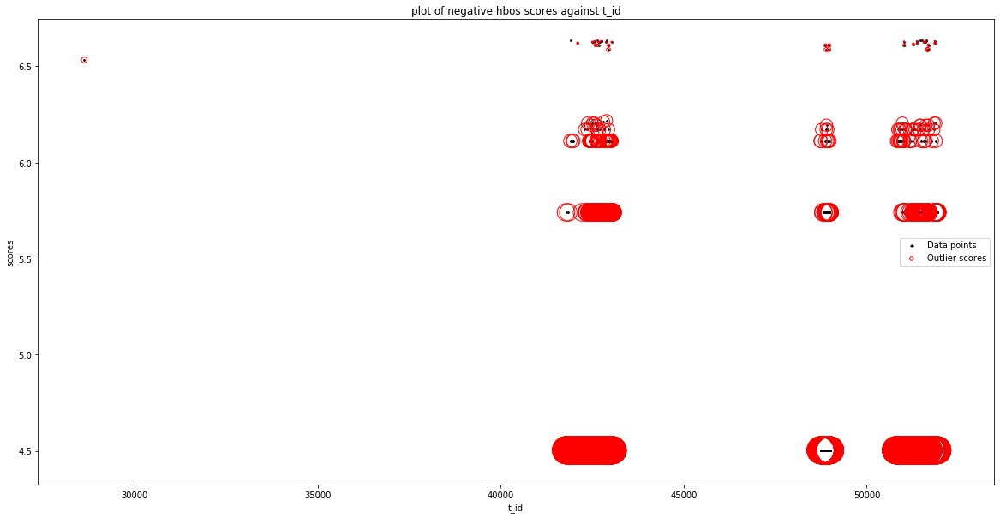

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['tot

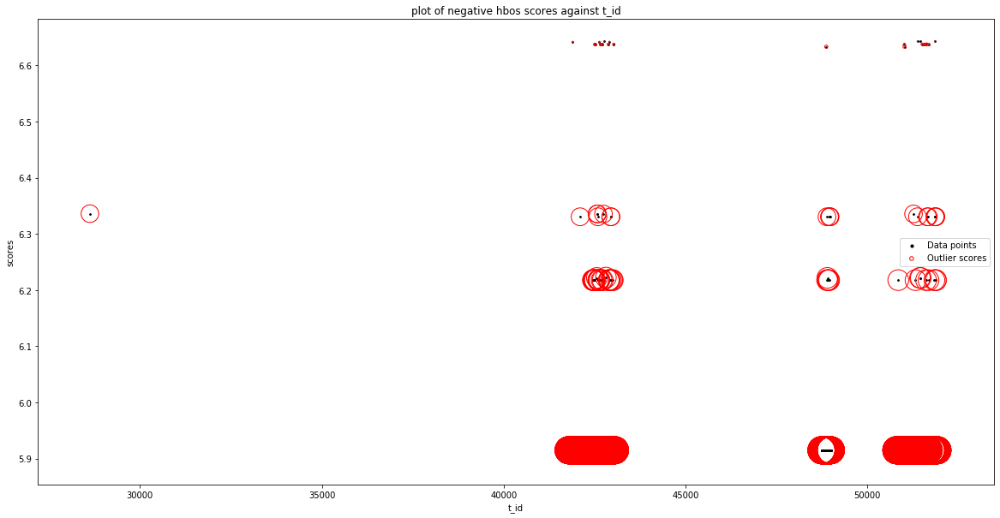

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['total_length_of_fwd_packet', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2387
Number of Outliers :  124
Outlier index: 113
Outlier score: 6.228408944529818
Outlier index: 653
Outlier score: 6.098483840691936
Outlier index: 663
Outlier score: 6.206641845036099
Outlier index: 667
Outlier score: 6.158203003378649
Outlier index: 674
Outlier score: 6.158203003378649
Outlier index: 687
Outlier score: 6.098483840691936
Outlier index: 689
Outlier score: 6.098483840691936
Outlier index: 694
Outlier score: 6.098483840691936
Outlier index: 701
Outlier score: 6.098483840691936
Outlier index: 703
Outlier score: 6.156492406636029
Outlier index: 707
Outlier score: 6.158203003378649
Outlier index: 709
Outlier score: 6.098483840691936
Outlier index: 713
Outlier score: 6.098483840691936
Outlier index: 721
Outlier score: 6.223663258485551
Outlier index: 732
Outlier score:

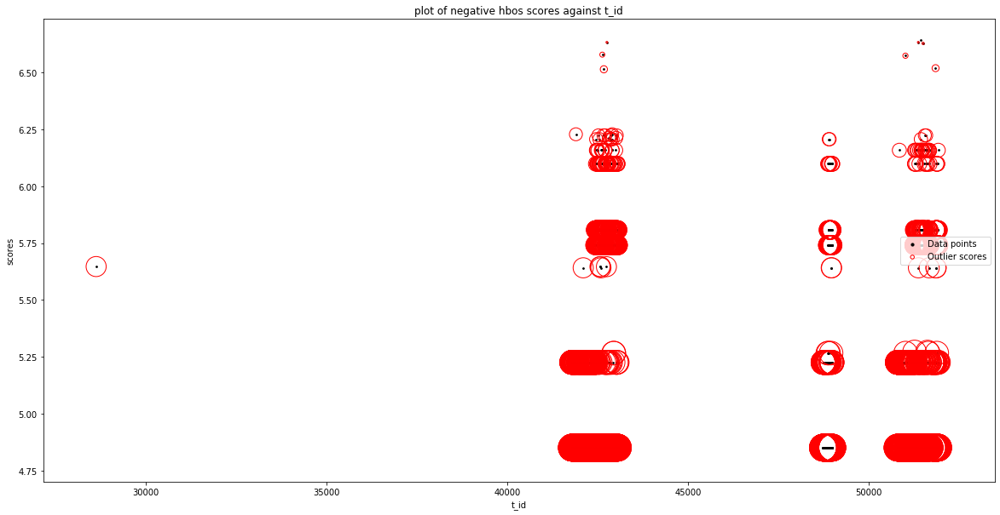

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['total_length_of_fwd_packet', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2467
Number of Outliers :  44
Outlier index: 0
Outlier score: 6.616704471843233
Outlier index: 113
Outlier score: 6.615912004236598
Outlier index: 311
Outlier score: 6.611166318192332
Outlier index: 703
Outlier score: 6.611166318192332
Outlier index: 721
Outlier score: 6.611166318192332
Outlier index: 763
Outlier score: 6.616110080332634
Outlier index: 775
Outlier score: 6.616308183627437
Outlier index: 788
Outlier score: 6.611166318192332
Outlier index: 825
Outlier score: 6.615912004236598
Outlier index: 857
Outlier score: 6.611166318192332
Outlier index: 866
Outlier score: 6.611166318192332
Outlier index: 907
Outlier score: 6.611166318192332
Outlier index: 937
Outlier score: 6.616110080332634
Outlier index: 949
Outlier score: 6.615912004236598
Outlier index: 1066
Outlier score: 6.611

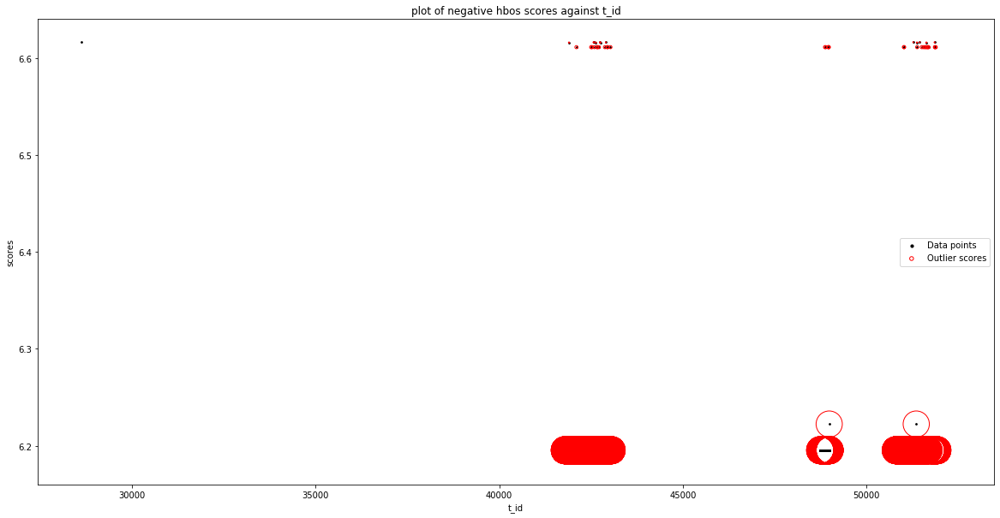

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['total_length_of_fwd_packet', 'flow_iat_min'], dtype='object')
Number of Inliers :  2466
Number of Outliers :  45
Outlier index: 0
Outlier score: 6.168641045119982
Outlier index: 113
Outlier score: 6.167848577513347
Outlier index: 199
Outlier score: 6.221819421595193
Outlier index: 311
Outlier score: 6.16310289146908
Outlier index: 631
Outlier score: 6.221819421595193
Outlier index: 703
Outlier score: 6.16310289146908
Outlier index: 721
Outlier score: 6.16310289146908
Outlie

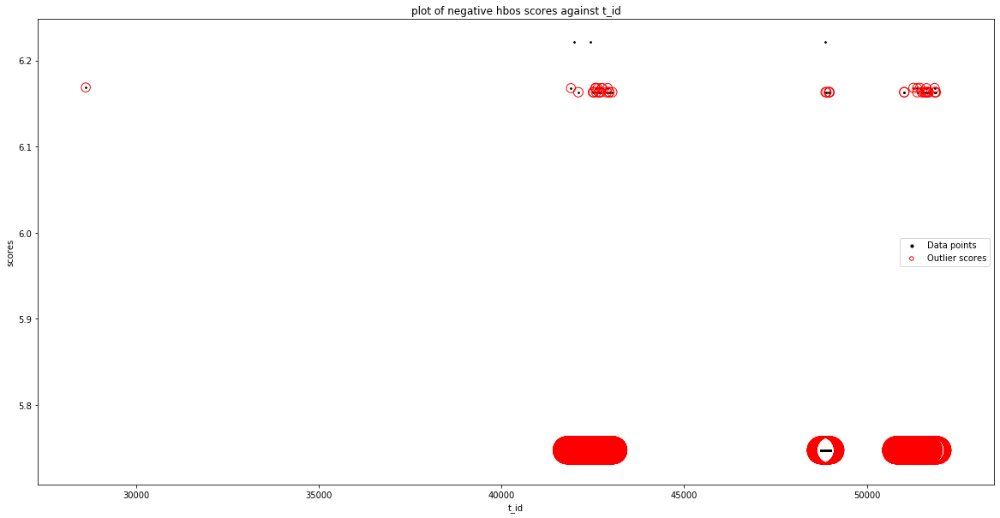

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['total_length_of_fwd_packet', 'fwd_iat_min'], dtype='object')
Number of Inlie

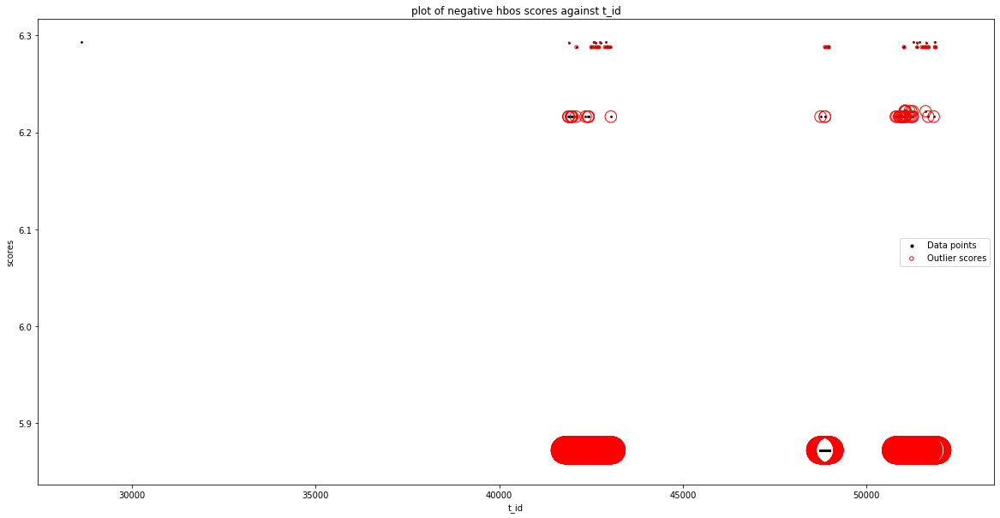

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['total_length_of_fwd_packet', 'bwd_iat_min'], dtype='object')
Number of Inlier

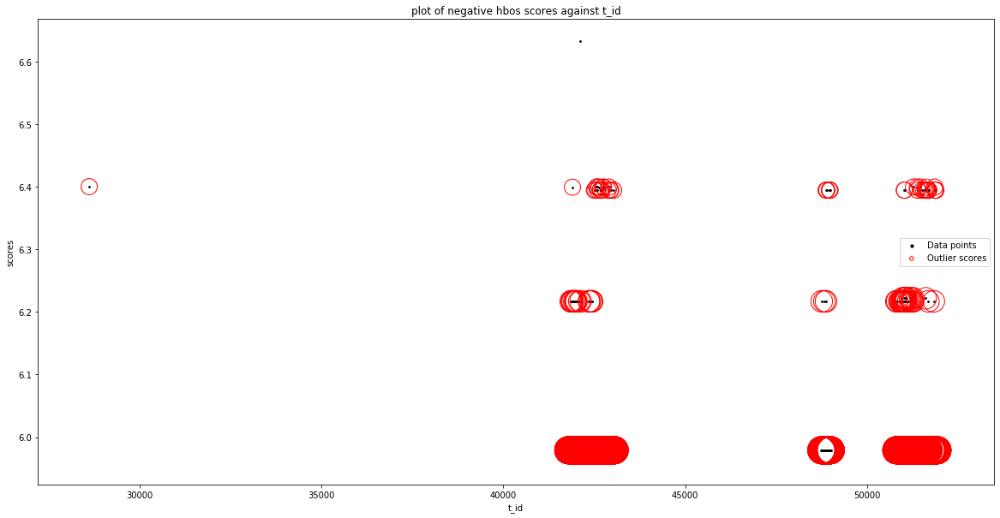

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'fwd_he

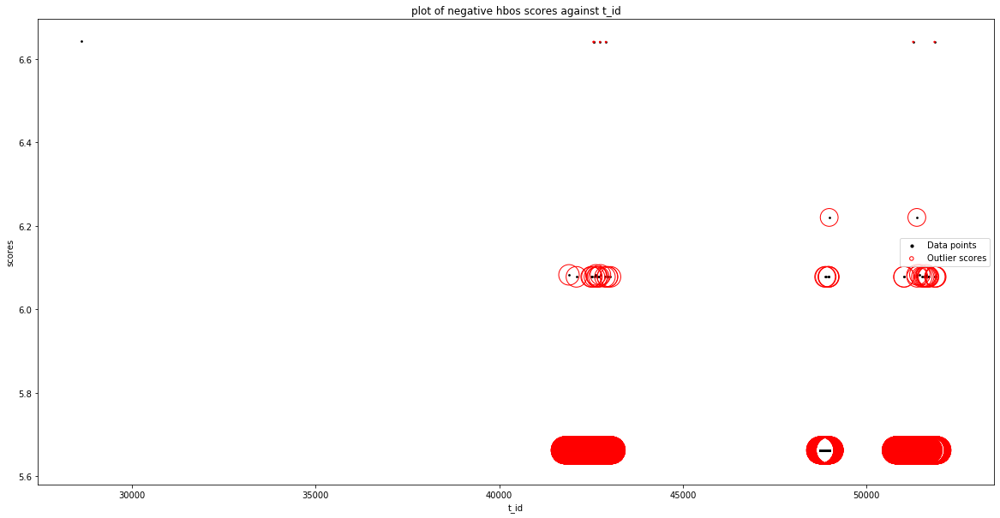

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_

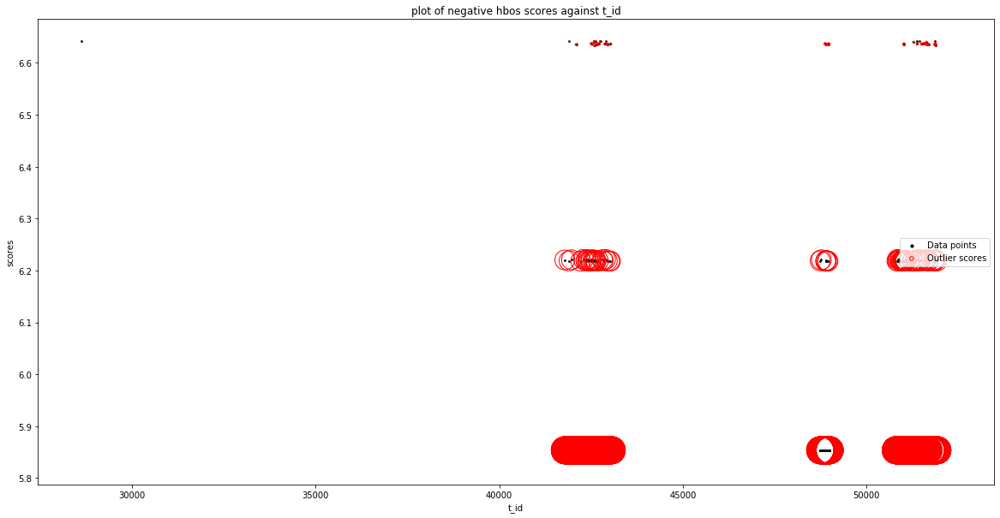

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['total_length_of_fwd_packet', 'psh_flag_count'], dtype='object')
Number of Inliers :  2468
Number of Outliers :  43
Outlier index: 0
Outlier score: 6.642290676810804
Outlier index: 113
Outlier score: 4.8874603236524985
Outlier index: 311
Outlier score: 4.882714637608232
O

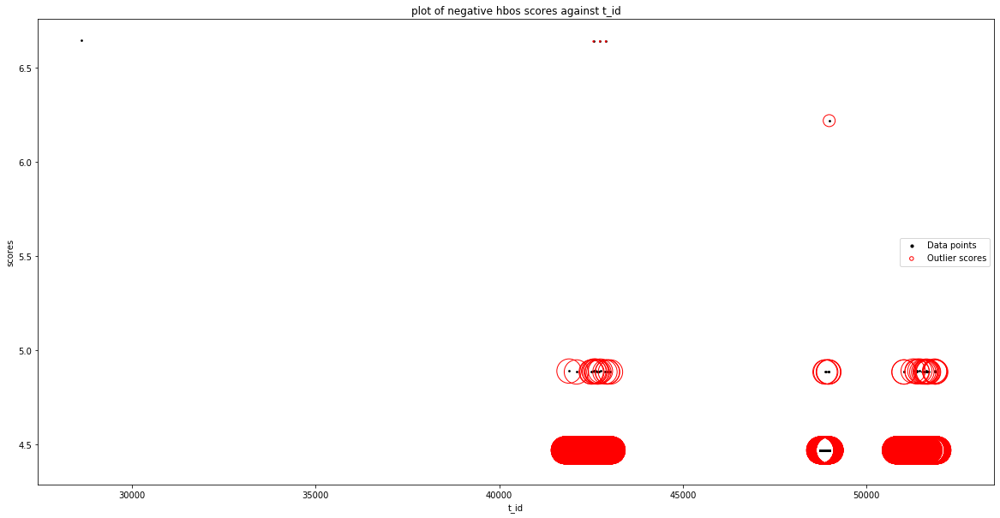

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'do

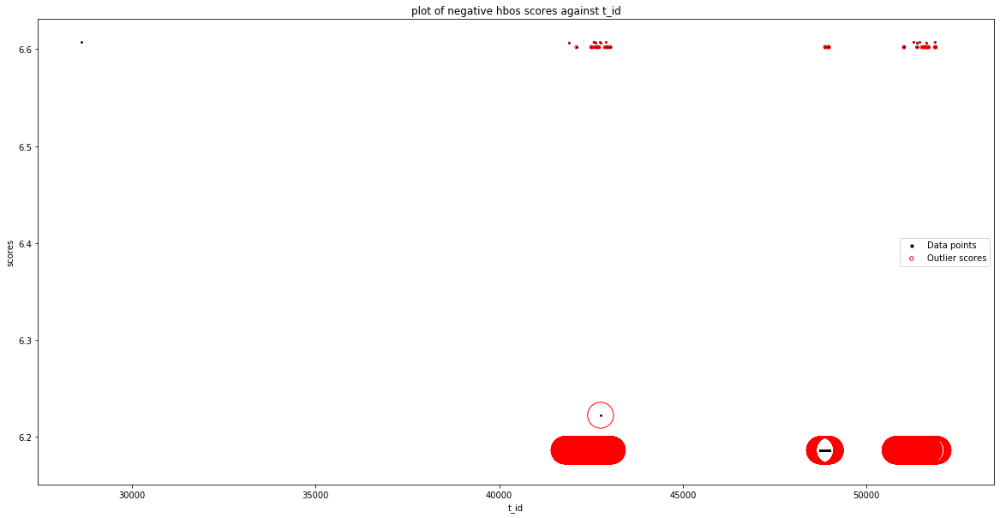

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'a

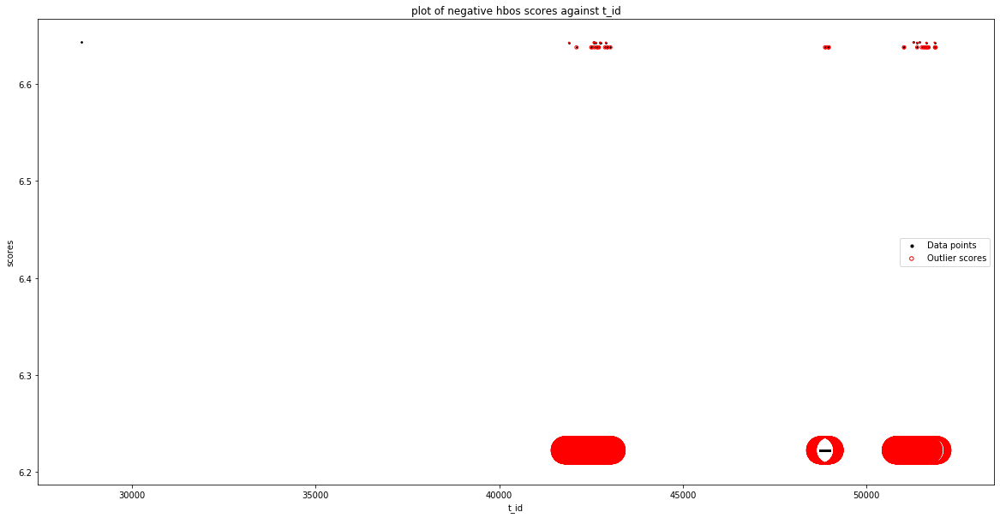

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['total_length_of_fwd_packet', 'idle_max'], dtype='object')
Number of Inliers :  2469
Number of Outliers :  42
Outlier index: 0
Outlier score: 6.643460425536714
Outlier index: 113
Outlier score: 6.216577275211465
Outlier index: 311
Outlier score: 6.211831589167199
Outlier index: 703
Outlier score: 6.211831589167199
Outlier index: 721
Outlier score: 6.211831589167199
Outlier index: 763
Outlier score: 6.216775351307501
Outlier index: 775
Outlier score: 6.216973454602304
Outlier index: 788
Outlier score: 6.211831589167199
Outlier index: 825
Outlier score: 6.216577275211465
Outlier index: 857
Outlier score: 6.211831589167199
Outlier index: 866
Outlier score: 6.211831589167199
Outl

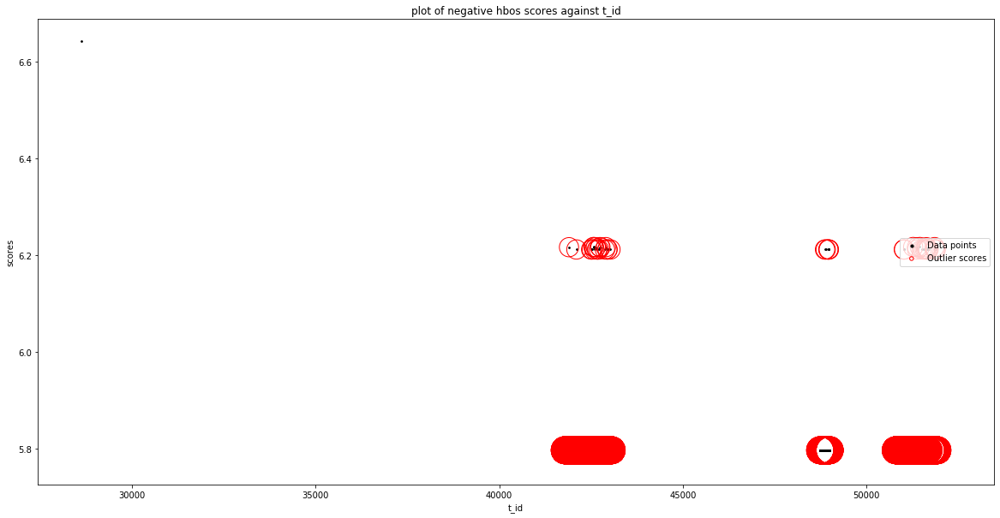

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['total_length_of_fwd_packet', 'a_id'], dtype='object')
Number of Inliers :  2469
Number of Outliers :  42
Outlier index: 0
Outlier score: 6.641410529422884
Outlier index: 113
Outlier score: 4.916493752076116
Outlier index: 311
Outlier score: 4.9117480660318495
Outlier index: 703
Outlier score: 4.9117480660318495
Outlier index: 721
Outlier score: 4.9117480660318495
Outlier index: 763
Outlier score: 4.9166918281721514
Outlier index: 775
Outlier score: 4.9168899314669545
Outlier ind

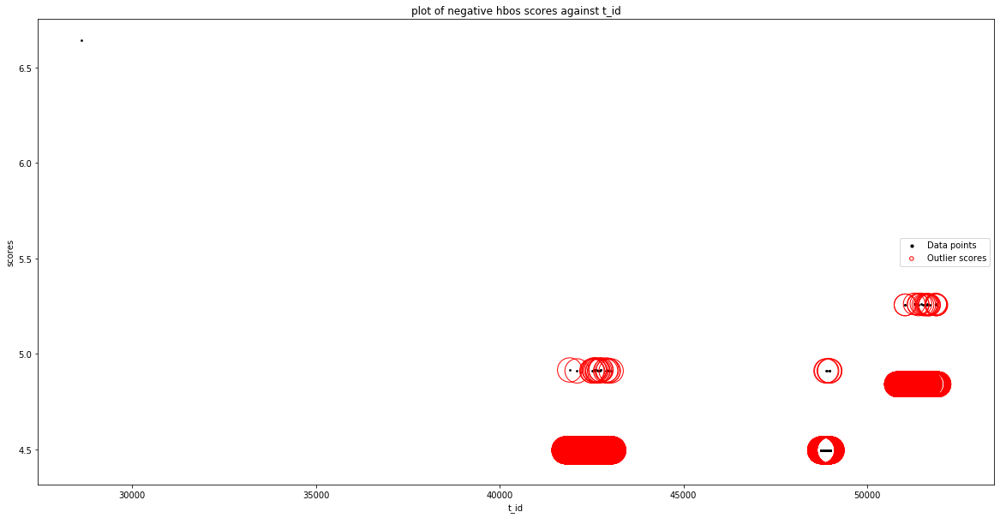

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'servic

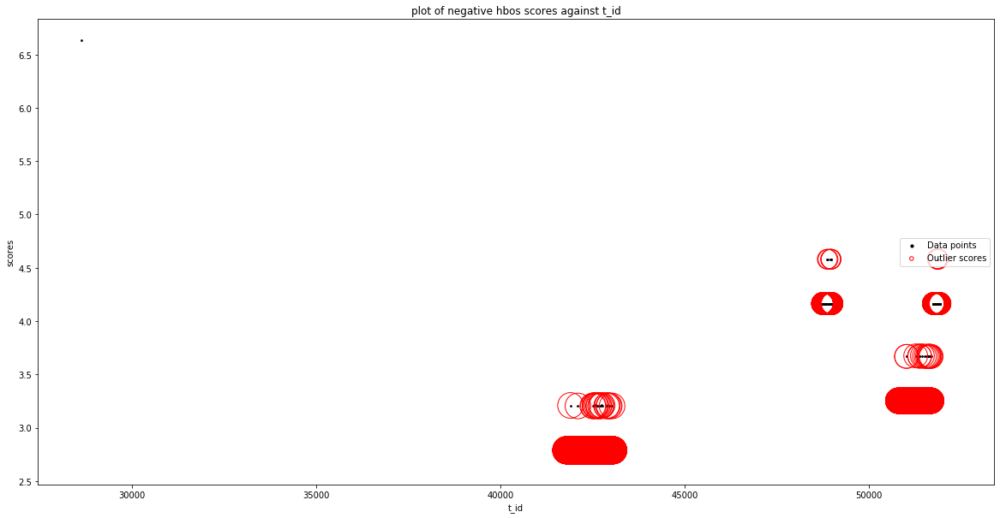

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_fwd_packet', 'log_star

No valid feature
No Valid columns found for combination of  ['total_length_of_bwd_packet', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_bwd_packet', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_bwd_packet', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_bwd_packet', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_bwd_packet', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_

No valid feature
No Valid columns found for combination of  ['total_length_of_bwd_packet', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_bwd_packet', 'active_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_bwd_packet', 'active_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_bwd_packet', 'idle_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['total_length_of_bwd_packet', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid

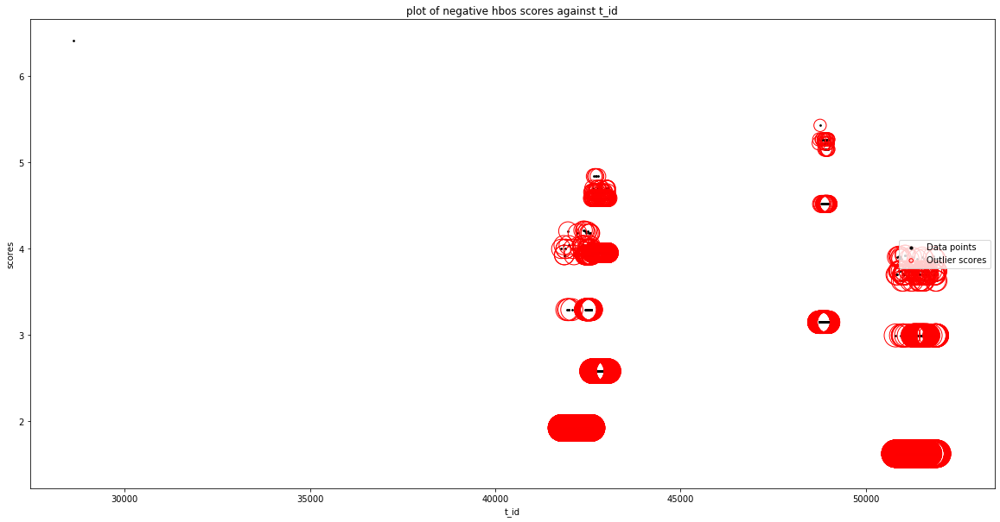

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_max', 'src_port'], dtype='object')
Number of Inliers :  2344
Number of Outliers :  167
Outlier index: 0
Outlier score: 6.390991403826162
Outlier index: 1
Outlier score: 3.287134088854057
Outlier index: 63
Outlier score: 3.3305067844999394
Outlier index: 76
Outlier score: 3.216775795827671
Outlier index: 83
Outlier score: 3.216775795827671
Outlier index: 113
Outlier score: 3.287134088854057
Outlier index: 115
Outlier score: 3.287134088854057
Outlier index: 174
Outlier score: 3.4934847043969635
Outlier index: 193
Outlier score: 3.3305067844999394
Outlier index: 311
Outlier score: 2.6981197342866587
Outlier index: 426
Outlier score: 2.8800299437789514
Outlier index: 

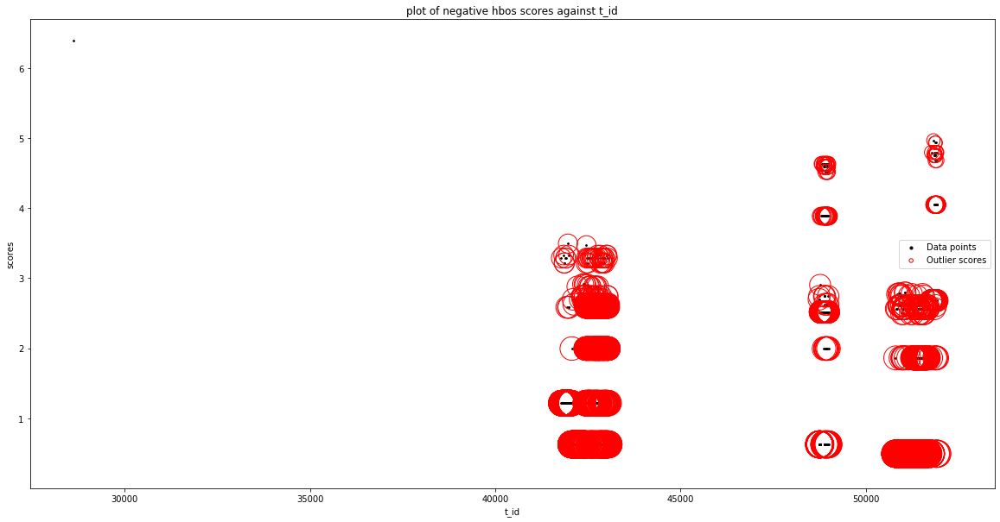

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_max', 'flow_duration'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
O

Silhouetter Score: 0.846
davies bouldin Score: 1.791
calinski_harabasz Score: 35.862


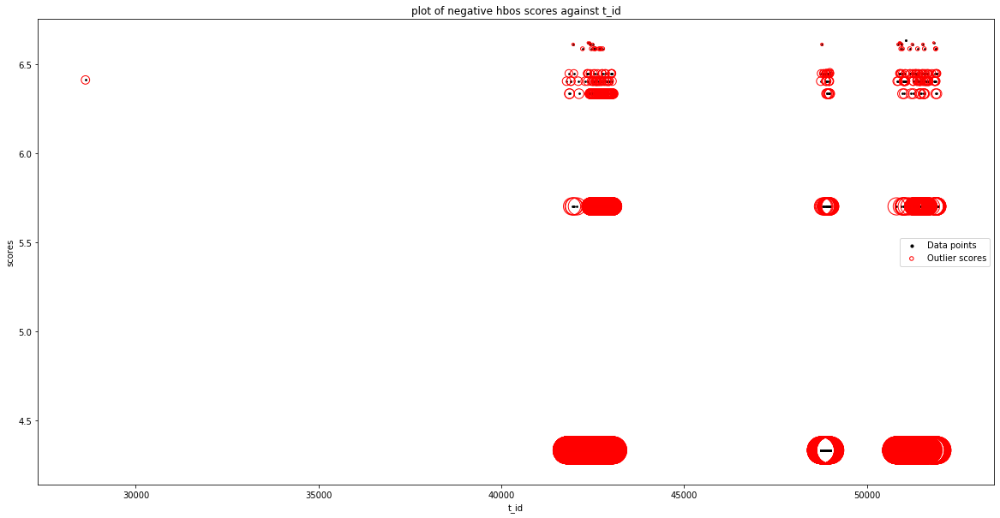

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_max', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
Outlier index: 0
Outlier score: 6.4124457977854945
Outlier index: 1
Outlier score: 5.991279972316212
Outlier index: 63
Outlier score: 6.034652667962095
Outlier index: 113
Outlier score: 6.41165333017886
Outlier index: 115
Outlier score: 5.991279972316212
Outlier index: 174
Outlier score: 6.197630587859119
Outlier index: 193
Outlier score: 6.034652667962

Silhouetter Score: 0.864
davies bouldin Score: 0.820
calinski_harabasz Score: 1405.306


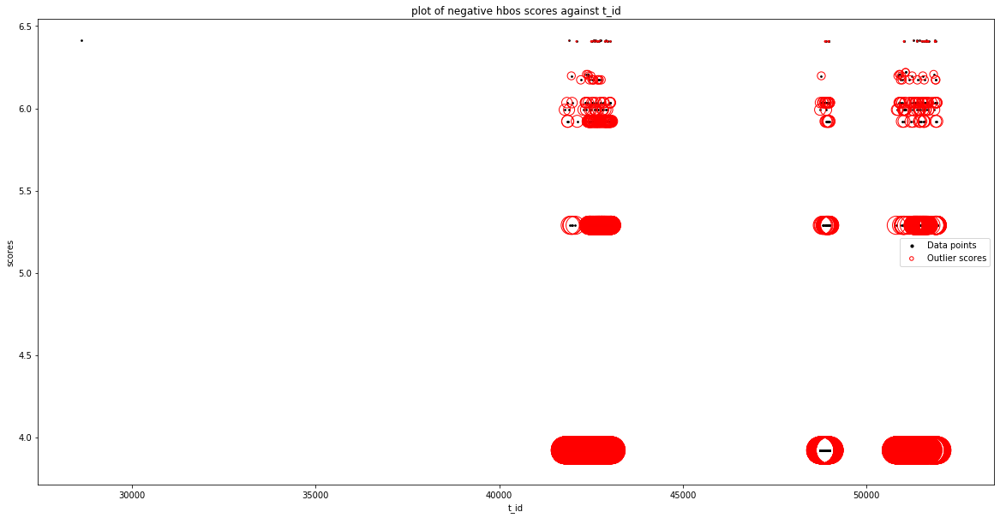

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_max', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2295
Number of Outliers :  216
Outlier index: 0
Outlier score: 6.301750171507626
Outlier index: 1
Outlier score: 5.930102765841379
Outlier index: 63
Outlier score: 5.973475461487262
Outlier index: 113
Outlier score: 6.402797621965919
Outlier index: 115
Outlier score: 6.301750171507626
Outlier index: 174
Outlier score: 6.508100787050532
Outlier index: 193
Outlier score: 6.345

Total number of outliers found: 216
Silhouetter Score: 0.787
davies bouldin Score: 0.730
calinski_harabasz Score: 3473.945


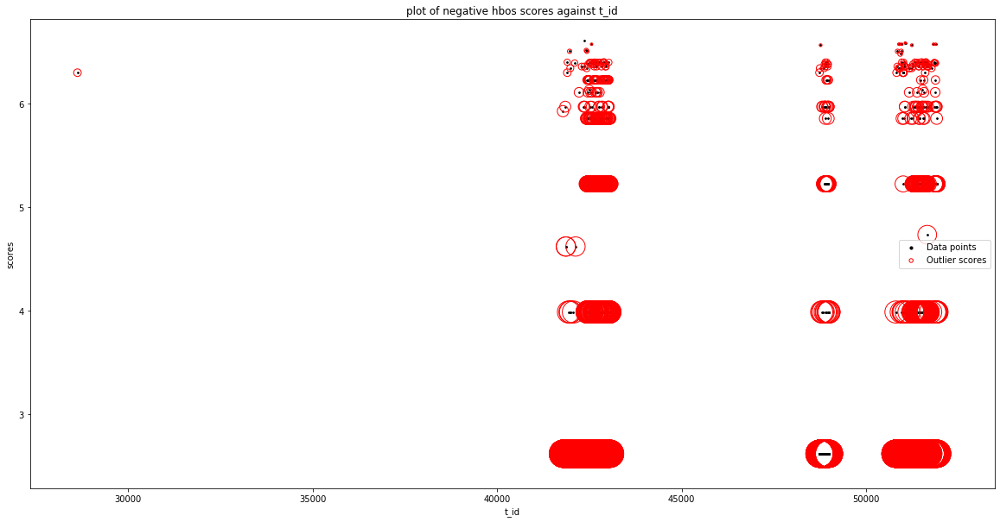

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max',

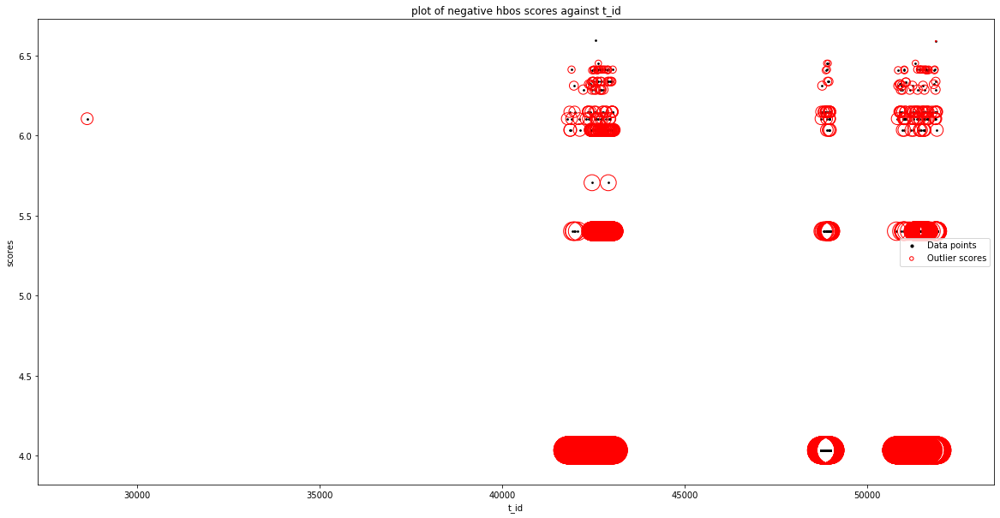

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_max', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2312
Number of Outliers :  199
Outlier index: 0
Outlier score: 5.41580122980579
Outlier index: 1
Outlier score: 5.41580122980579
Outlier index: 113
Outlier score: 5.9981873900191065
Outlier index: 311
Outlier score: 5.41580122980579
Outlier index: 332
Outlier score: 5.345442936779404
Outlier index: 564
Outlier score: 5.41580122980579
Outlier index: 574
Outlier score: 5.631424807729991
Outlier index: 575
Outlier score: 5.4591739254516725
Outlier index: 621
Outlier score: 5.345442936779404
Outlier index: 629
Outlier score: 5.345442936779404
Outlier index: 634
Outlier score: 5.6221518453486965
Outlier index: 638
Outlier score: 5.860658245143198
Outlier index: 650
Outlier score: 5.860658245143198
Outlier index: 657
Outlier score: 5.9278290969927205
Outlier index: 660
Outlier score: 5.927829

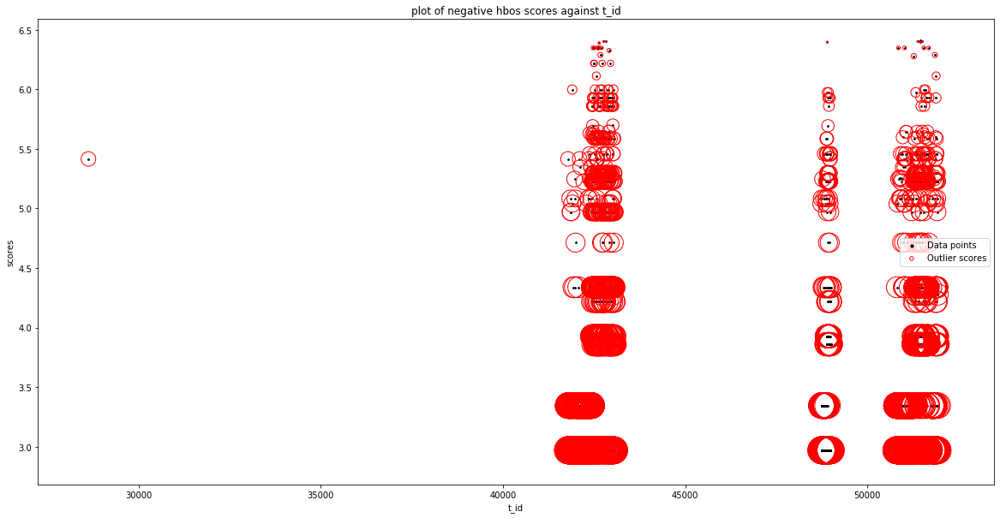

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_max', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
Outlier index: 0
Outlier score: 6.385690449725887
Outlier index: 1
Outlier score: 6.385690449725887
Outlier index: 63
Outlier score: 6.42906314537177
Outlier index: 113
Outlier score: 6.385690449725887
Outlier index: 115
Outlier score: 6.385690449725887
Outlier index: 174
Outlier score: 6.592041065268794
Outlier index: 193
Outlier score: 6.42906314537177
Outlier index: 311
Outlier score: 6.385690449725887
Outlier index: 426
Outlier score: 6.56760065921818
Outlier index: 498
Outlier score: 6.385690449725887
Outlier index: 553
Outlier score: 6.42906314537177
Outlier index: 554
Outlier score: 6.42906314537177
Outlier index: 564
Outlier score: 6.385690449725887
Outlier index: 574
Outlier score: 6.601314027650089
Outlier index: 575
Outlier score: 6.42906314537177
O

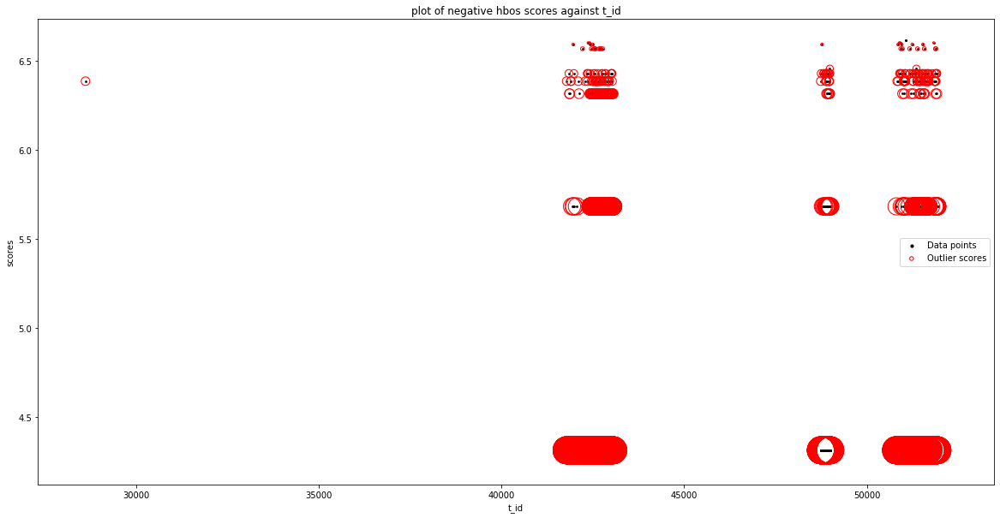

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_max', 'flow_iat_min'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
Outlier index: 0
Outlier score: 5.937627023002635
Outlier index: 1
Outlier score: 5.937627023002635
Outlier index: 63
Outlier score: 5.980999718648518
Outlier index: 113
Outlier score: 5.937627023002635
Outlier index: 115
Outlier score: 5.937627023002635
Outlier index: 174
Outlier score: 6.143977638545542
Outlier index: 193
Outlier score: 5.980999718648518
Outlier index: 311
O

Outlier index: 2476
Outlier score: 5.980999718648518
Outlier index: 2488
Outlier score: 5.980999718648518
Outlier index: 2489
Outlier score: 5.980999718648518
Outlier index: 2500
Outlier score: 5.980999718648518
Total number of outliers found: 175
Silhouetter Score: 0.762
davies bouldin Score: 0.627
calinski_harabasz Score: 306.879


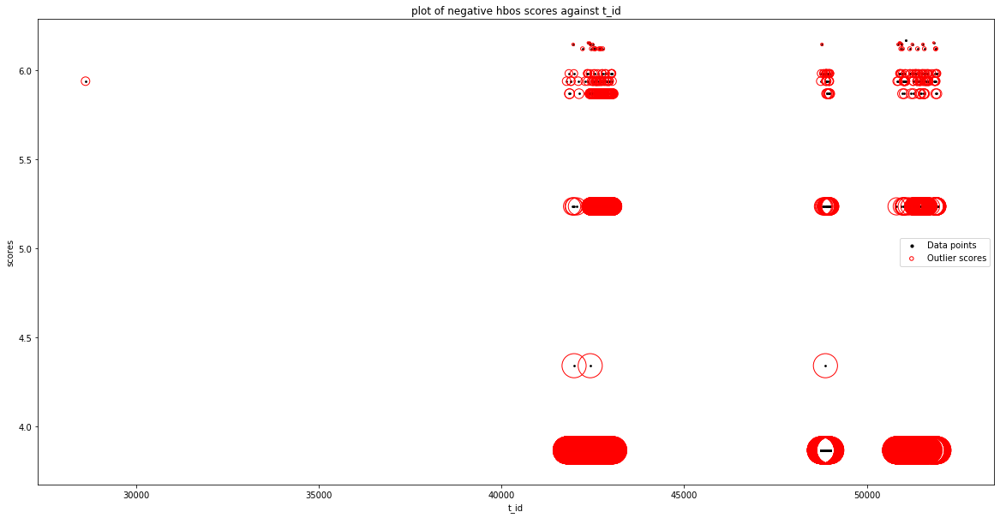

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_max', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2336
Number of Outl

Silhouetter Score: 0.612
davies bouldin Score: 0.832
calinski_harabasz Score: 95.562


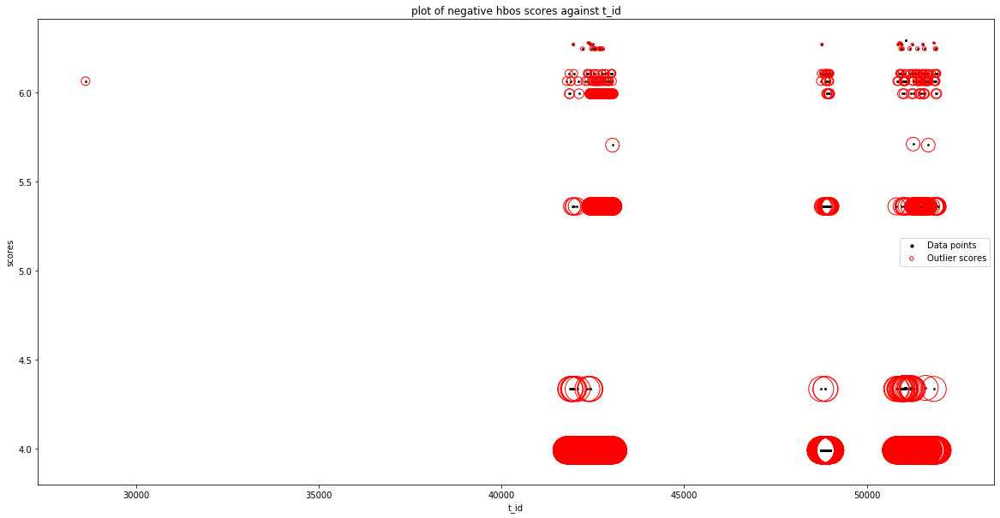

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_max', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2335
Number of Outli

Silhouetter Score: 0.602
davies bouldin Score: 1.754
calinski_harabasz Score: 31.871


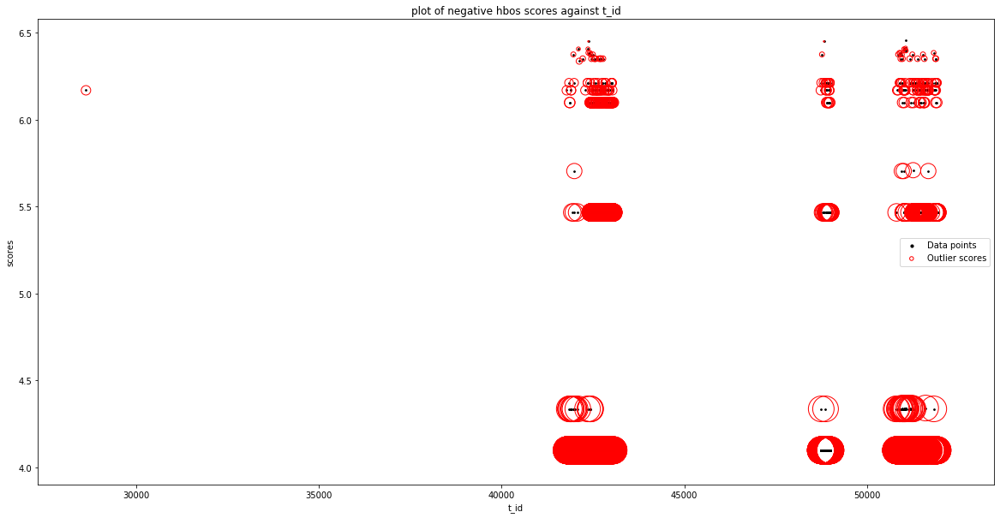

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'fwd_header_length']
input param

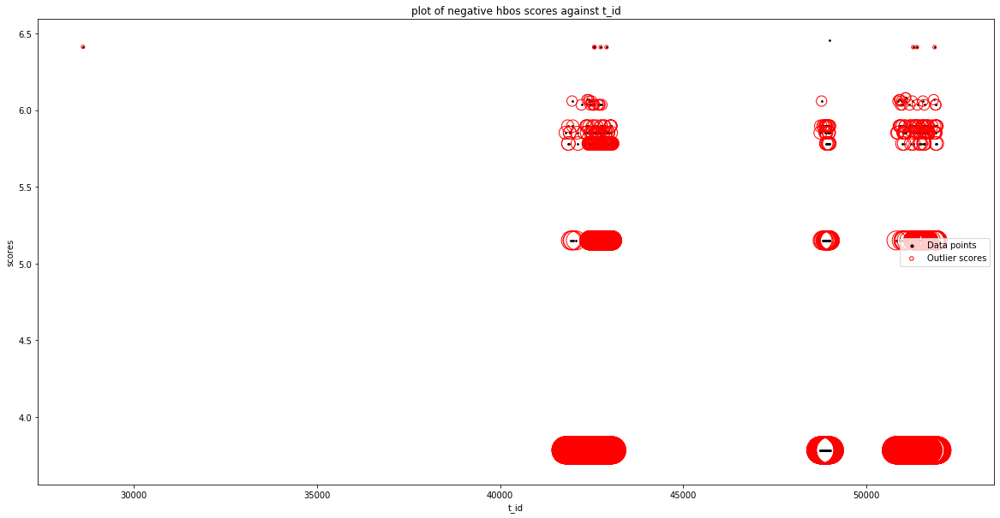

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'packet_leng

Outlier index: 2469
Outlier score: 6.408790856154299
Outlier index: 2471
Outlier score: 6.592801495216523
Outlier index: 2476
Outlier score: 6.087371402497187
Outlier index: 2488
Outlier score: 6.087371402497187
Outlier index: 2489
Outlier score: 6.087371402497187
Outlier index: 2500
Outlier score: 6.451638921877263
Total number of outliers found: 175
Silhouetter Score: 0.889
davies bouldin Score: 0.776
calinski_harabasz Score: 3124.329


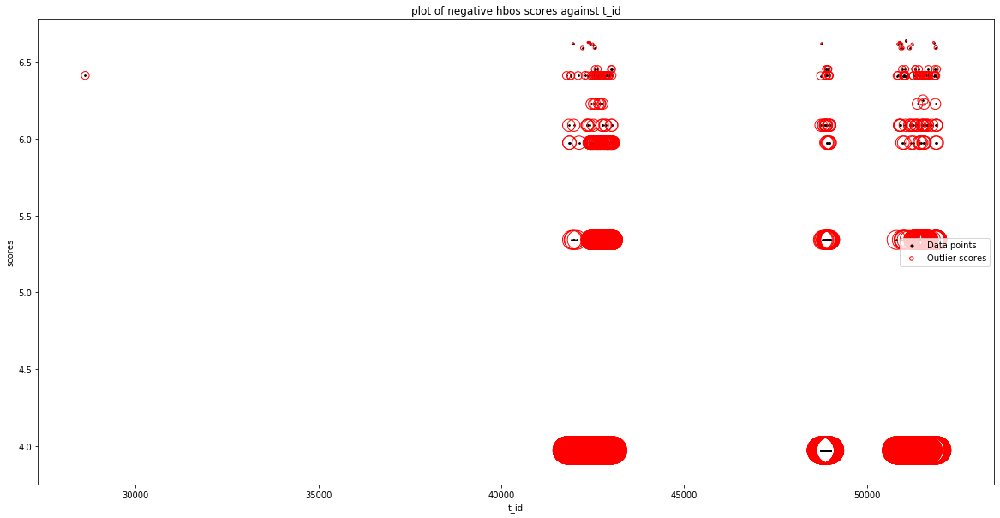

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_max', 'psh_flag_count'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
Outlier index: 0
Outlier score: 6.411276654693458
Outlier index: 1
Outlier score: 4.657238769141787
Outlier index: 63
Outlier score: 4.70061146478767
Outlier index: 113
Outlie

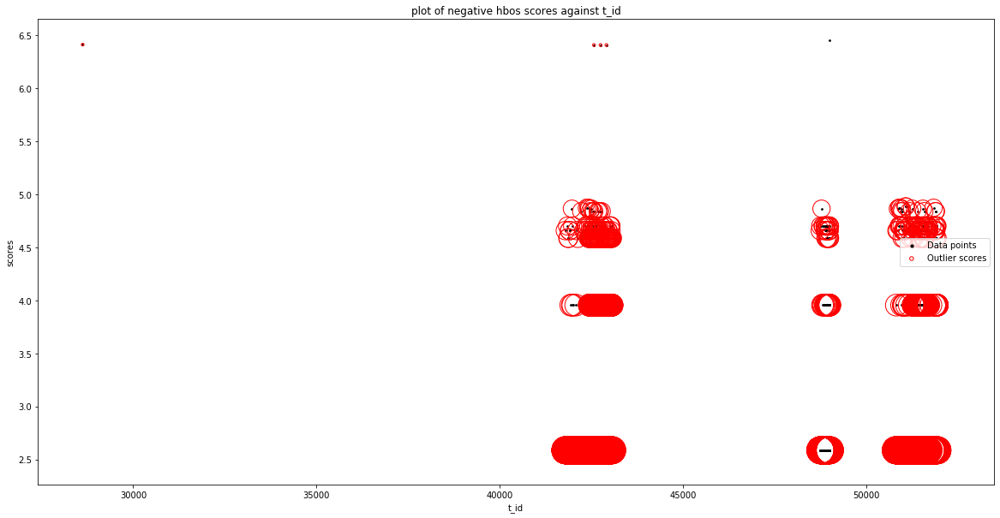

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'down_up_ratio']
input param

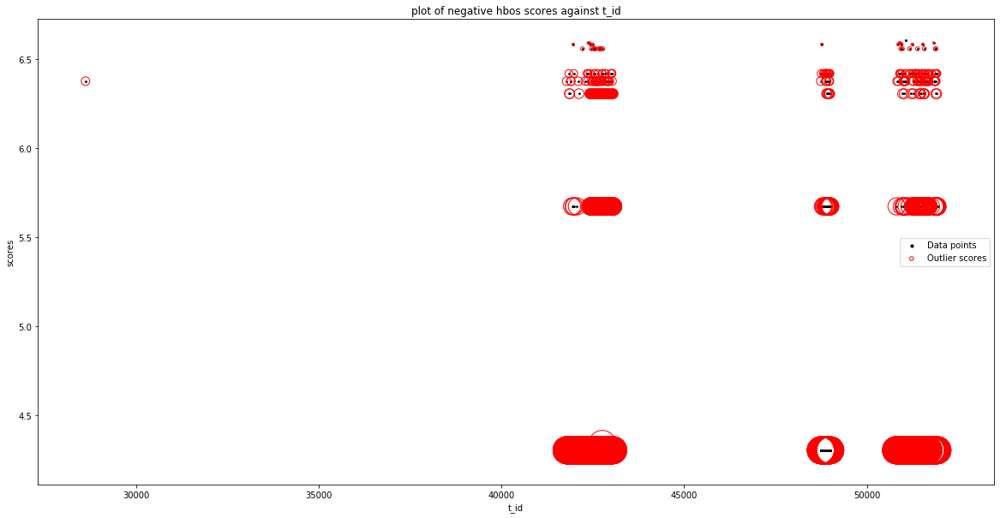

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'active_max']
input paramet

Silhouetter Score: 0.860
davies bouldin Score: 1.978
calinski_harabasz Score: 27.000


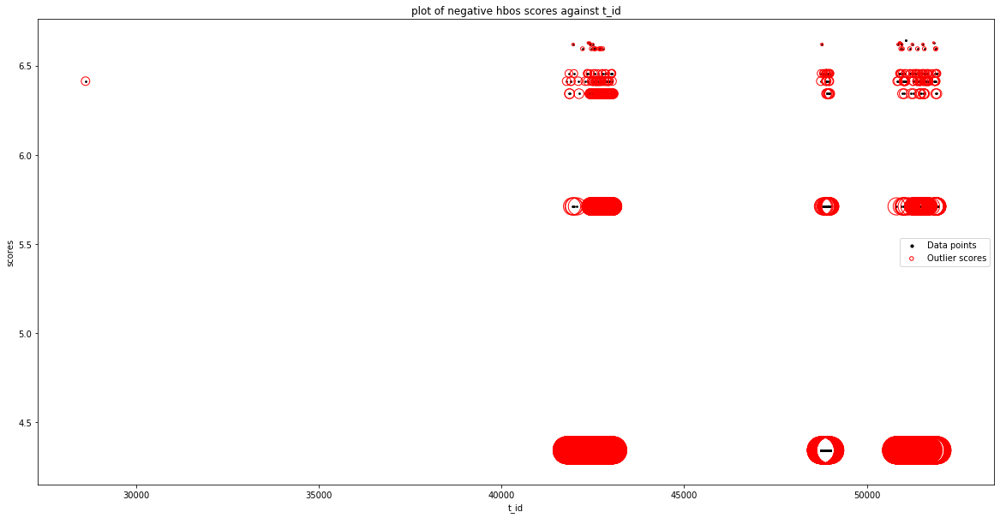

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_max', 'idle_max'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
Outlier index: 0
Outlier score: 6.412446403419368
Outlier index: 1
Outlier score: 5.986355720700754
Outlier index: 63
Outlier score: 6.029728416346636
Outlier index: 113
Outlier score: 5.986355720700754
Outlier index: 115
Outlier score: 5.986355720700754
Outlier index: 174
Outlier score: 6.19270633624366
Outlier index: 193
Outlier score: 6.029728416346636
Outlier index: 311
Outlier score: 5.986355720700754
Outlier index: 426
Outlier score: 6.168265930193046
Outlier index: 498
Outlier score: 5.986355720700754
Outlier index: 553
Outlier score: 6.029728416346636
Outlier index: 55

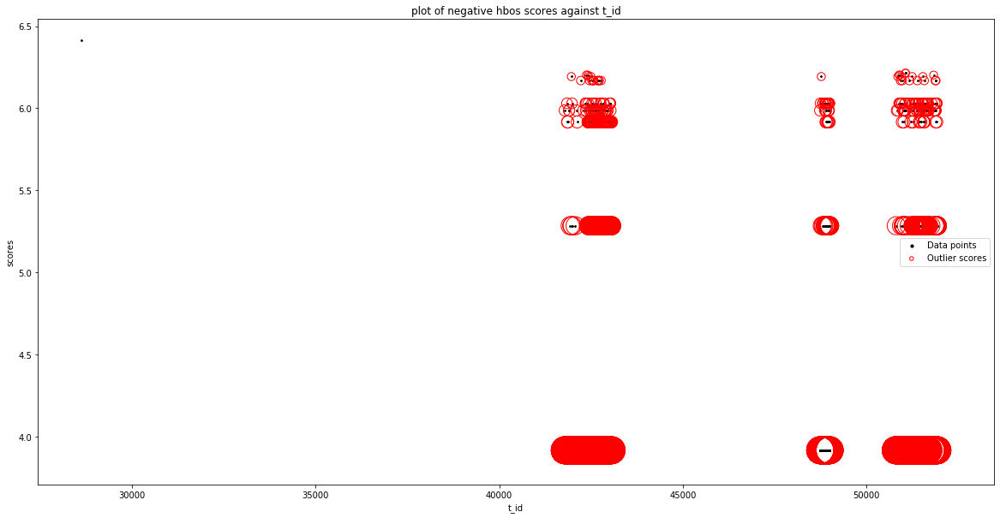

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_max', 'a_id'], dtype='object')
Number of Inliers :  2324
Number of Outliers :  187
Outlier index: 0
Outlier score: 6.4103965073055384
Outlier index: 1
Outlier score: 4.686272197565405
Outlier index: 63
Outlier score: 4.729644893211288
Outlier index: 113
Outlier score: 4.686272197565405
Outlier index: 115
Outlier score: 4.686272197565405
Outlier index: 174
Outlier score: 4.892622813108312
Outlier index: 193
Outlier score: 4.729644893211288
Outlier index: 311
Outlier score

Outlier score: 5.031771816977247
Outlier index: 2440
Outlier score: 5.07514451262313
Outlier index: 2446
Outlier score: 5.031771816977247
Outlier index: 2452
Outlier score: 5.031771816977247
Outlier index: 2459
Outlier score: 5.21368202646954
Outlier index: 2466
Outlier score: 4.961413523950861
Outlier index: 2469
Outlier score: 5.031771816977247
Outlier index: 2471
Outlier score: 5.21368202646954
Outlier index: 2476
Outlier score: 5.07514451262313
Outlier index: 2488
Outlier score: 5.07514451262313
Outlier index: 2489
Outlier score: 5.07514451262313
Outlier index: 2497
Outlier score: 4.961413523950861
Outlier index: 2500
Outlier score: 5.07514451262313
Total number of outliers found: 187
Silhouetter Score: 0.607
davies bouldin Score: 0.971
calinski_harabasz Score: 1155.633


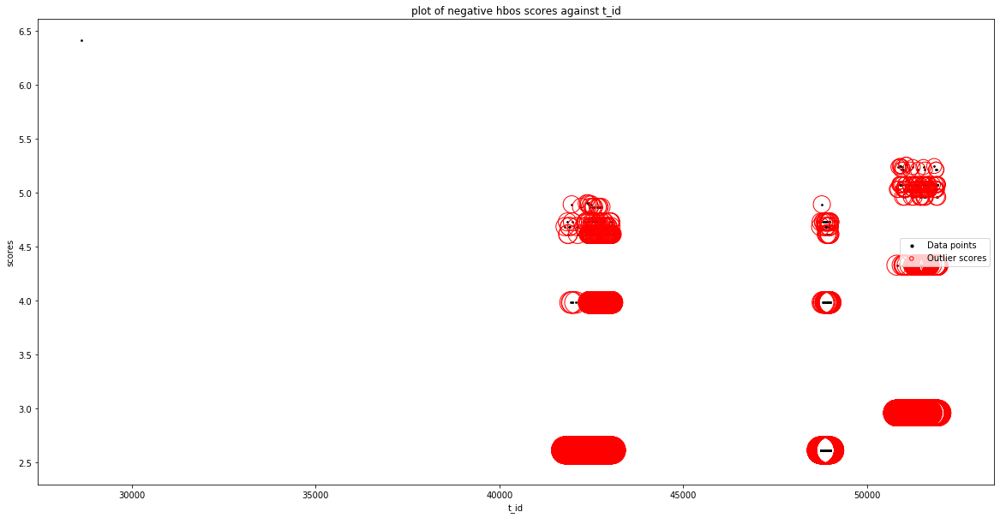

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'service_physical_ip']
input par

Outlier score: 3.4863754861963385
Outlier index: 2242
Outlier score: 3.37264449752407
Outlier index: 2256
Outlier score: 3.443002790550456
Outlier index: 2266
Outlier score: 3.443002790550456
Outlier index: 2269
Outlier score: 3.4863754861963385
Outlier index: 2276
Outlier score: 3.443002790550456
Outlier index: 2283
Outlier score: 3.443002790550456
Outlier index: 2291
Outlier score: 3.443002790550456
Outlier index: 2308
Outlier score: 3.4863754861963385
Outlier index: 2309
Outlier score: 3.443002790550456
Outlier index: 2316
Outlier score: 3.4863754861963385
Outlier index: 2333
Outlier score: 3.443002790550456
Outlier index: 2339
Outlier score: 3.443002790550456
Outlier index: 2341
Outlier score: 3.4863754861963385
Outlier index: 2344
Outlier score: 3.443002790550456
Outlier index: 2346
Outlier score: 3.443002790550456
Outlier index: 2350
Outlier score: 3.651951521474342
Outlier index: 2366
Outlier score: 4.397976605388388
Outlier index: 2414
Outlier score: 4.570227487666708
Outlier i

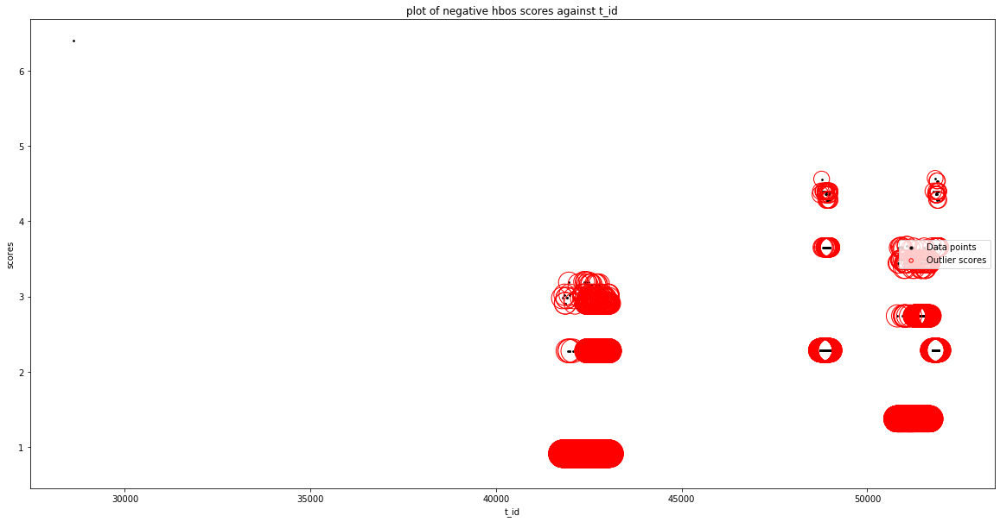

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_max', 'log_start_time']
input parameters

No valid feature
No Valid columns found for combination of  ['fwd_packet_length_min', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_min', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_min', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_min', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_min', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid fe

No valid feature
No Valid columns found for combination of  ['fwd_packet_length_min', 'active_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_min', 'idle_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_min', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_min', 'idle_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_min', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns fou

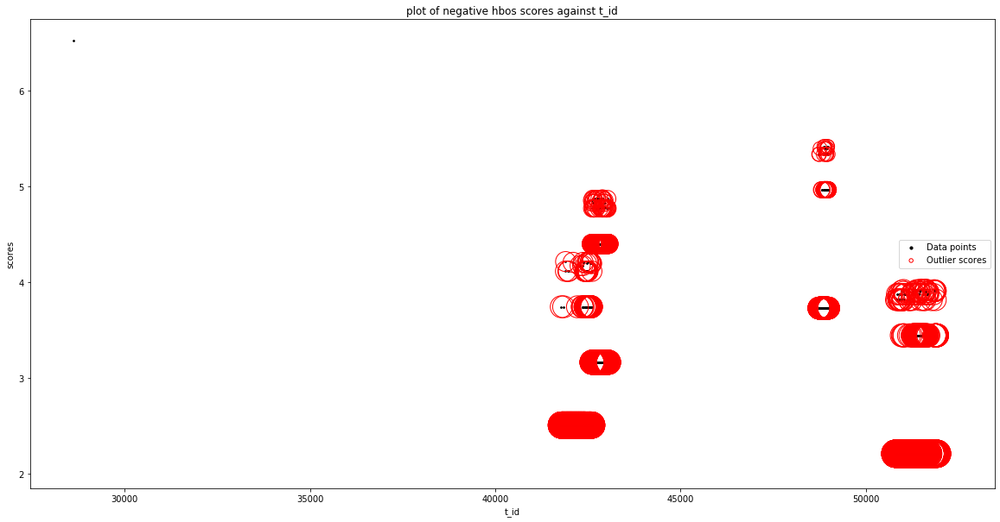

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_mean', 'src_port'], dtype='object')
Number of Inliers :  2303
Number of Outliers :  208
Outlier index: 0
Outlier score: 6.51130979966564
Outlier index: 113
Outlier score: 3.508499935151828
Outlier index: 115
Outlier score: 3.407452484693535
Outlier index: 174
Outlier score: 3.407452484693535
Outlier index: 193
Outlier score: 3.407452484693535
Outlier index: 657
Outlier score: 3.407452484693535
Outlier index: 667
Outlier score: 3.489006552541137
Outlier index: 701
Outlier score: 3.407452484693535
Outlier index: 703
Outlier score: 3.506865388711439
Outlier index: 721
Outlier score: 3.506865388711439
Outlier index: 763
Outlier score: 3.506865388711439
Outlier index:

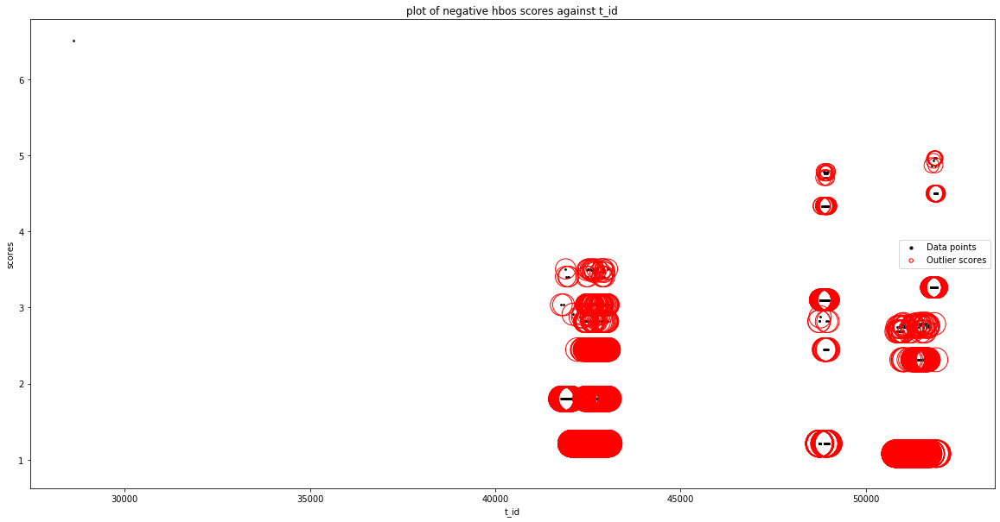

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_mean', 'flow_duration'], dtype='object')
Number of Inliers :  2355
Number of Outliers :  

Silhouetter Score: 0.847
davies bouldin Score: 1.958
calinski_harabasz Score: 30.963


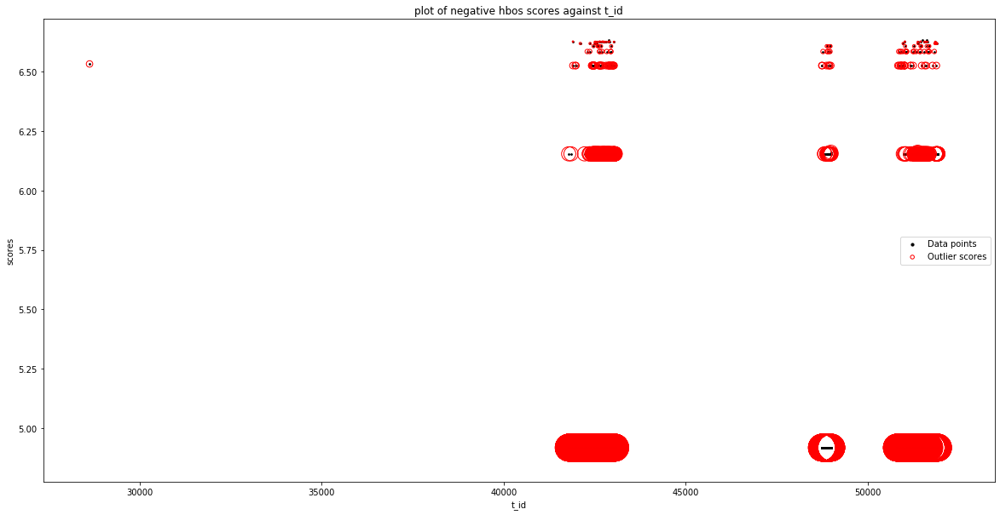

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_mean', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2357
Number of Outliers :  154
Outlier index: 0
Outlier score: 6.532764193624972
Outlier index: 113
Outlier score: 6.63301917647663
Outlier index: 115
Outlier score: 6.11159836815569
Outlier index: 174
Outlier score: 6.11159836815569
Outlier index: 193
Outlier score: 6.11159836815569
Outlier index: 311
Outlier score: 6.620119214628554
Outlier index: 498
Outlier score: 6.1707381351

Silhouetter Score: 0.847
davies bouldin Score: 0.890
calinski_harabasz Score: 1266.289


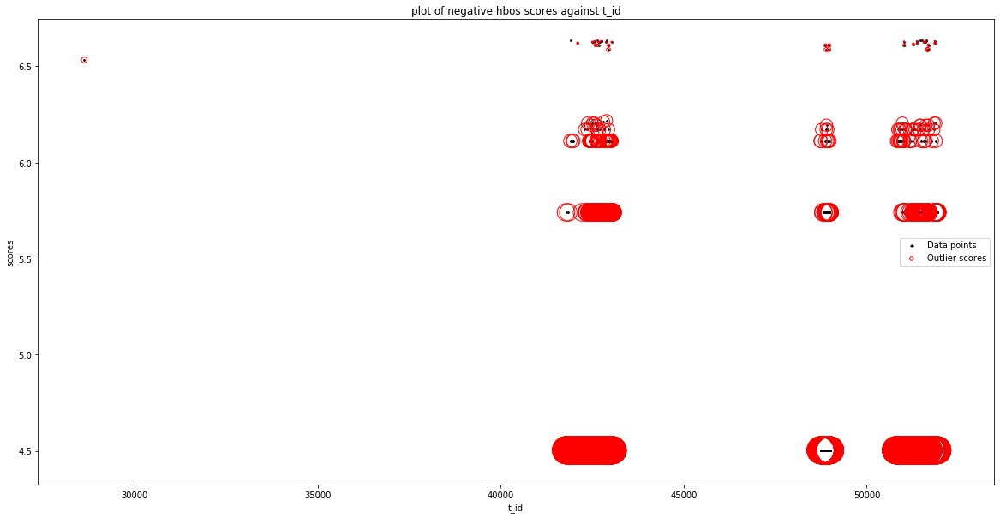

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_mean', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2295
Number of Outliers :  216
Outlier index: 0
Outlier score: 6.301750171507626
Outlier index: 1
Outlier score: 5.930102765841379
Outlier index: 63
Outlier score: 5.973475461487262
Outlier index: 113
Outlier score: 6.402797621965919
Outlier index: 115
Outlier score: 6.301750171507626
Outlier index: 174
Outlier score: 6.508100787050532
Outlier index: 193
Outlier score: 6.345122867153508
Outlier index: 311
Outlier score: 6.394643346162109
Outlier index: 426
Outlier score: 6.1120129753336725
Outlier index: 498
Outlier score: 6.3608899384662205
Outlier index: 553
Outlier score:

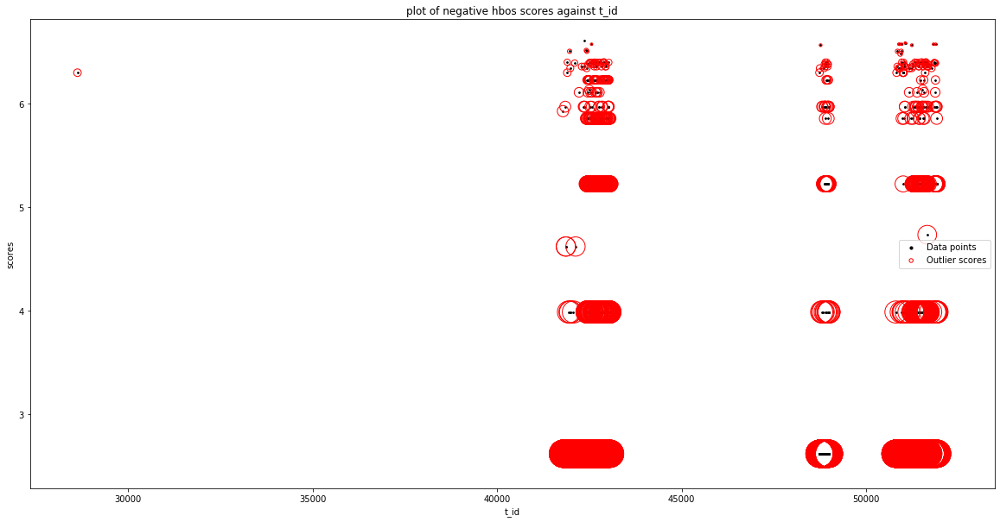

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_me

Silhouetter Score: 0.771
davies bouldin Score: 0.957
calinski_harabasz Score: 1152.092


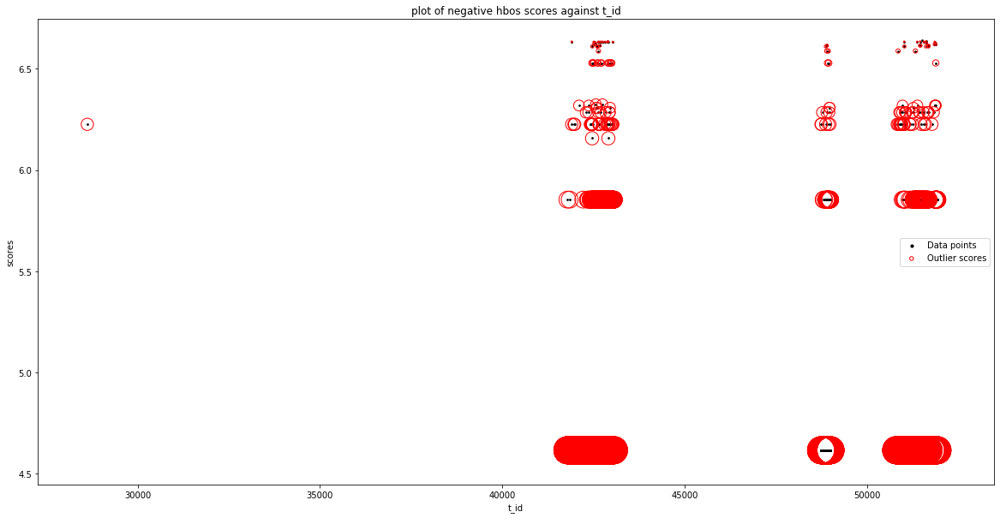

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_mean', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2306
Number of Outliers :  205
Outlier index: 113
Outlier score: 6.219553236316878
Outlier index: 638
Outlier score: 6.051334934009062
Outlier index: 650
Outlier score: 6.051334934009062
Outlier index: 657
Outlier score: 6.118505785858584
Outlier index: 660
Outlier score: 6.118505785858584
Outlier index: 661
Outlier score: 6.051334934009062
Outlier index: 663
Outlier score: 6.145464638561267
Outlier index: 664
Outlier score: 6.051334934009062
Outlier index: 665
Outlier score: 5.7468583801923385
Outlier index: 666
Outlier score: 5.7468583801923385
Outlier index: 667
Outlier score: 6.550227270417665
Outlier index: 673
Outlier score: 5.7468583801923385
Outlier index: 674
Outlier score: 6.097025796903816
Outlier index: 676
Outlier score: 6.051334934009062
Outlier index: 687
Outlier score: 

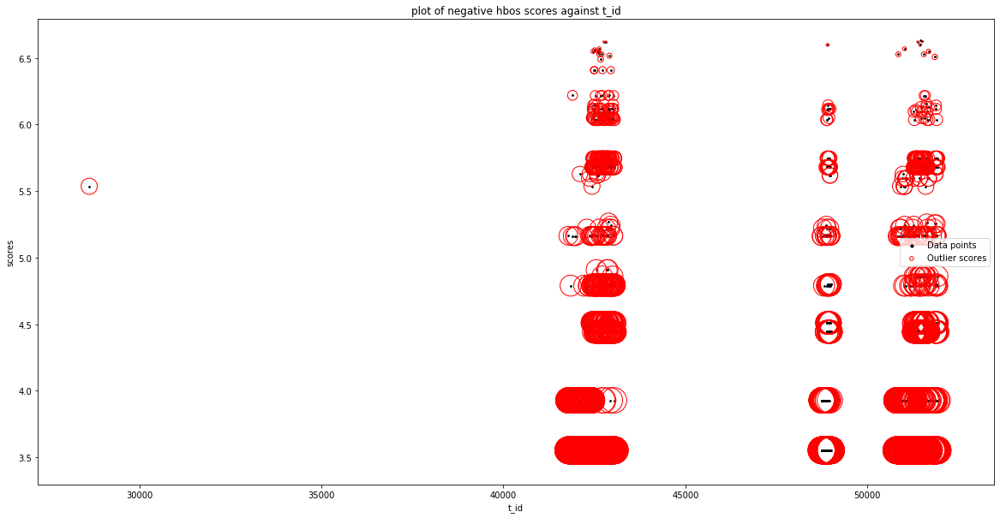

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_mean', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2355
Number of Outliers :  156
Outlier index: 0
Outlier score: 6.506008845565365
Outlier index: 113
Outlier score: 6.607056296023659
Outlier index: 115
Outlier score: 6.506008845565365
Outlier index: 174
Outlier score: 6.506008845565365
Outlier index: 193
Outlier score: 6.506008845565365
Outlier index: 311
Outlier score: 6.598902020219848
Outlier index: 498
Outlier score: 6.565148612523959
Outlier index: 564
Outlier score: 6.565148612523959
Outlier index: 574
Outlier score: 6.598902020219848
Outlier index: 616
Outlier score: 6.506008845565365
Outlier index: 625
Outlier score: 6.506008845565365
Outlier index: 634
Outlier score: 6.506008845565365
Outlier index: 638
Outlier score: 6.506008845565365
Outlier index: 650
Outlier score: 6.506008845565365
Outlier index: 657
Outlier score: 6.5060088

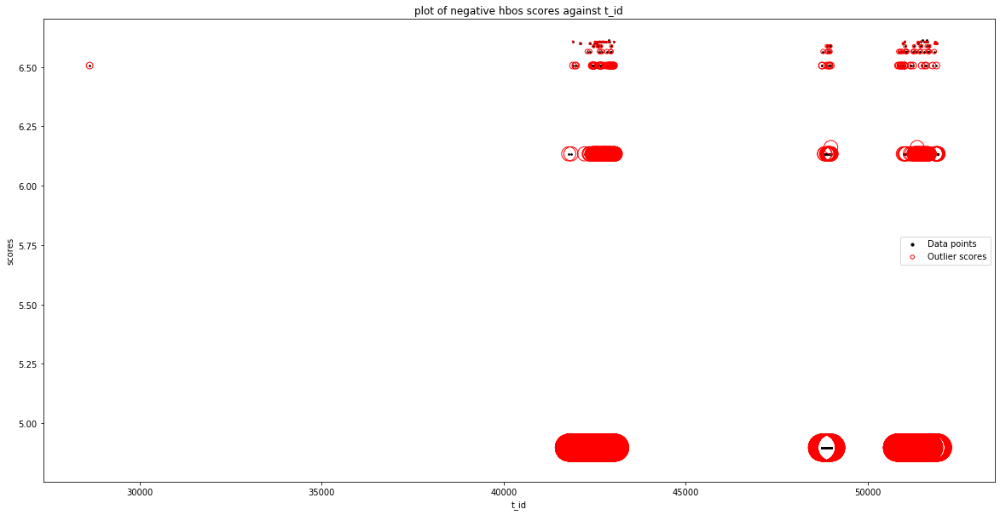

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_mean', 'flow_iat_min'], dtype='object')
Number of Inliers :  2357
Number of Outliers :  154
Outlier index: 0
Outlier score: 6.057945418842113
Outlier index: 113
Outlier score: 6.158992869300407
Outlier index: 115
Outlier score: 6.057945418842113
Outlier index: 174
Outlier score: 6.057945418842113
Outlier index: 193
Outlier score: 6.057945418842113
Outlier index: 311
Outlier score: 6.150838593496596
Outlier index: 498
Outlier score: 6.117085185800708
Outlier index:

Silhouetter Score: 0.733
davies bouldin Score: 0.675
calinski_harabasz Score: 301.588


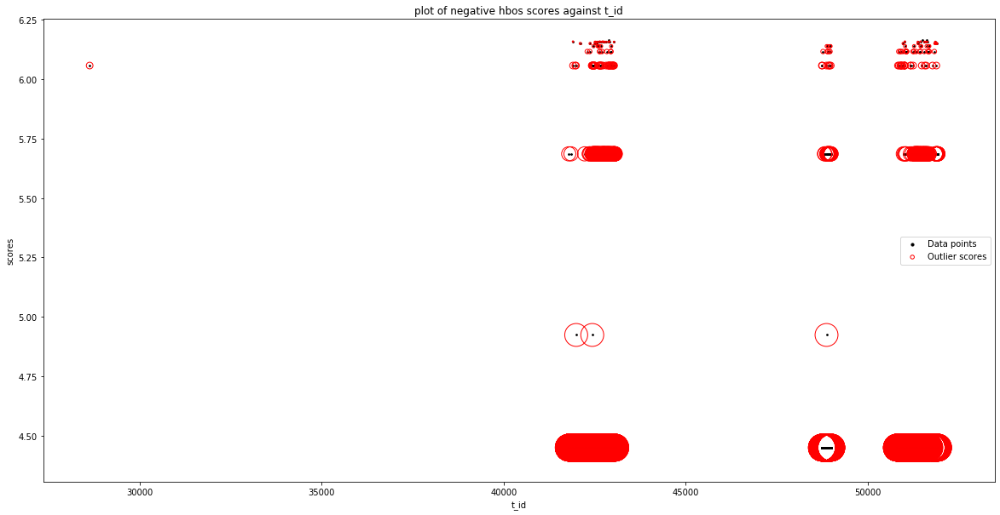

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_mean', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2357
Number of

Silhouetter Score: 0.606
davies bouldin Score: 0.849
calinski_harabasz Score: 98.291


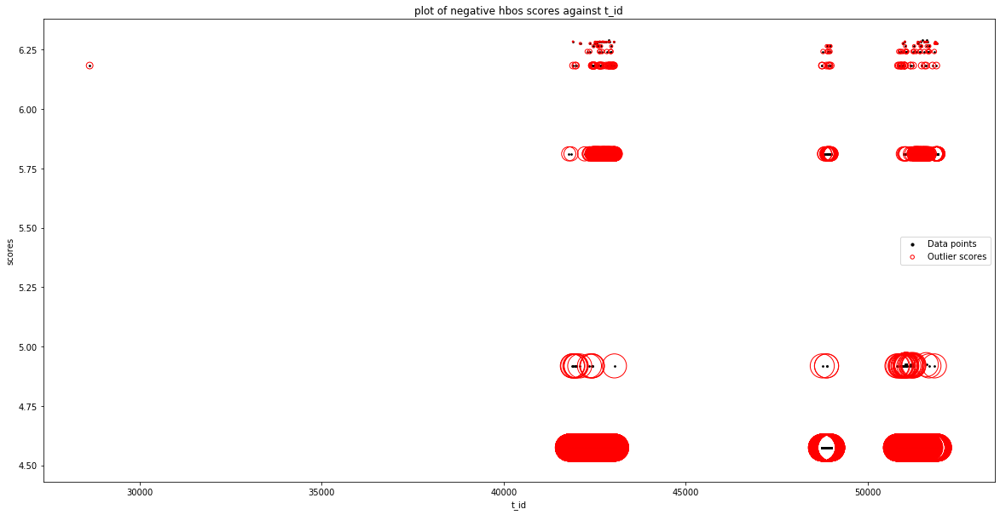

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_mean', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2354
Number of 

Silhouetter Score: 0.610
davies bouldin Score: 1.758
calinski_harabasz Score: 32.963


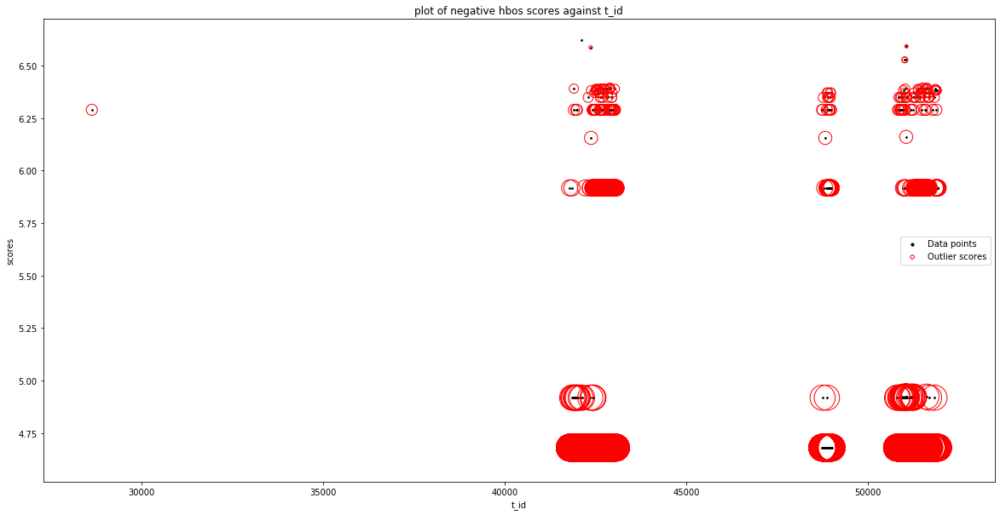

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'fwd_header_length']
input 

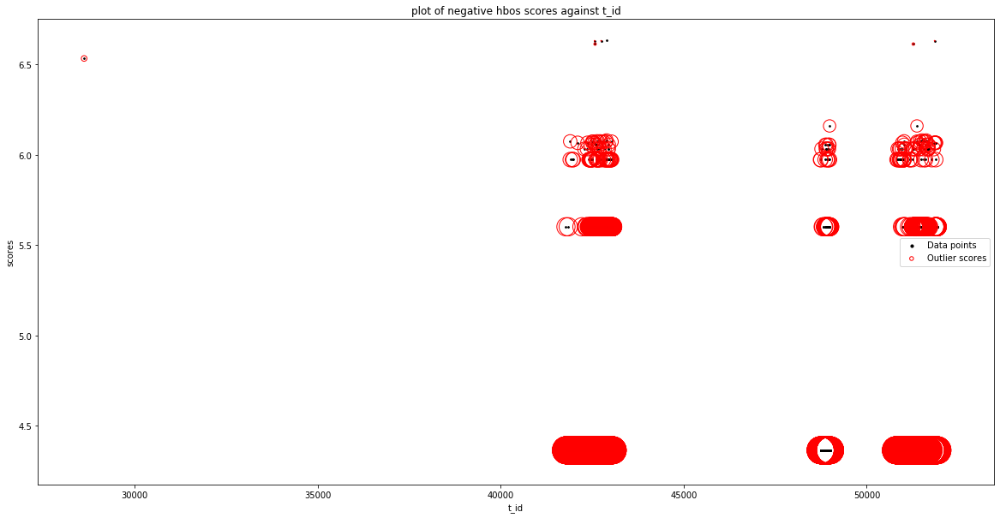

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'packet

Silhouetter Score: 0.888
davies bouldin Score: 0.771
calinski_harabasz Score: 3166.288


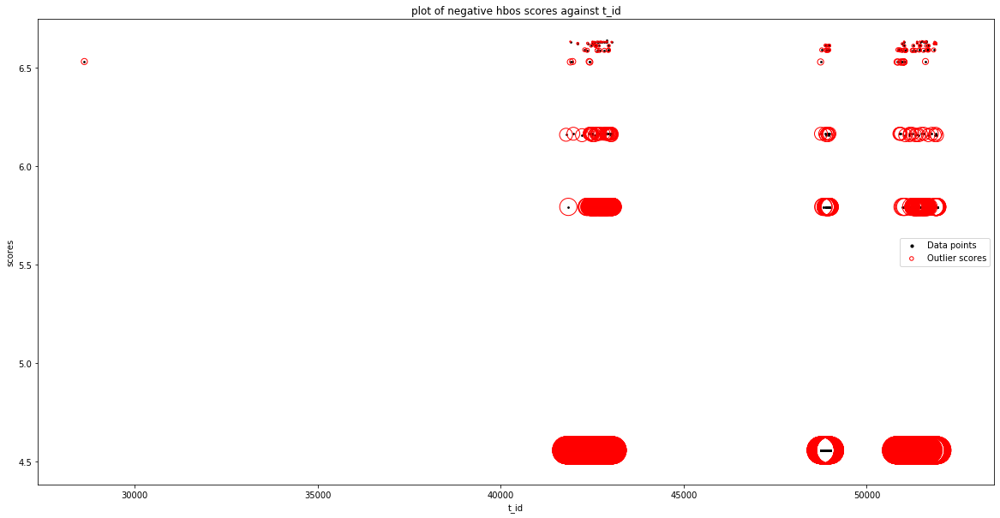

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_mean', 'psh_flag_count'], dtype='object')
Number of Inliers :  2356
Number of Outliers :  155
Outlier index: 0
Outlier score: 6.531595050532935
Outlier index: 113
Outlier score: 4.878604615439558
Outlier index: 115
Outlier score: 4.777557164981265
Outlier index: 17

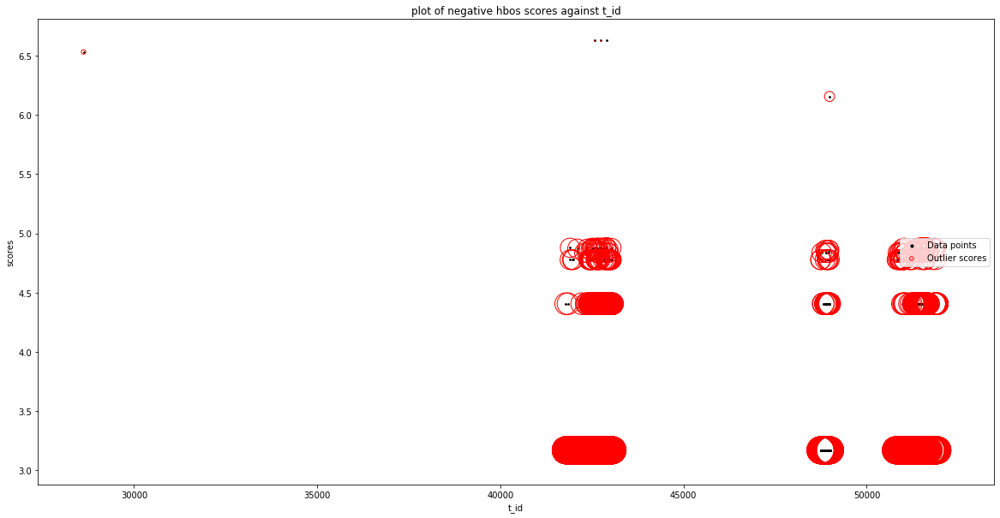

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'down_up_ratio']
input 

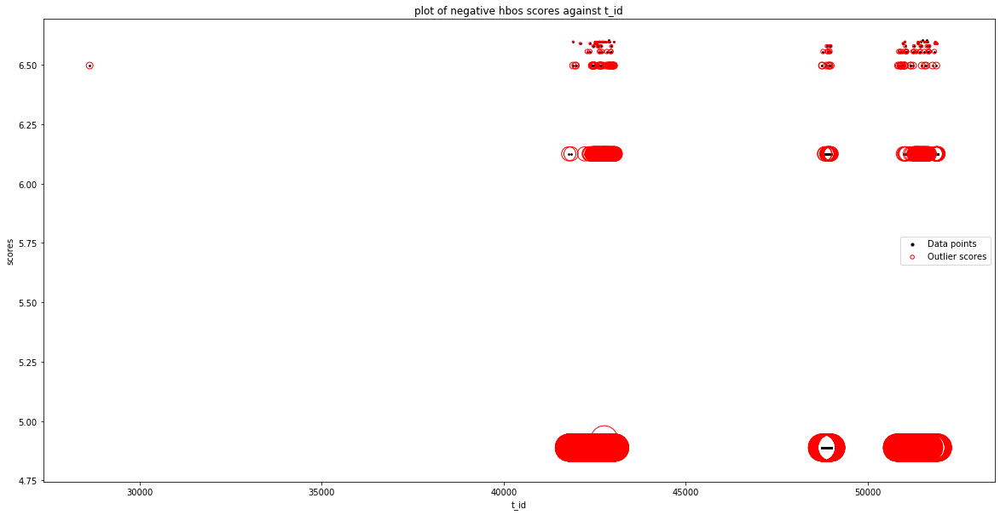

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'active_max']
input pa

Silhouetter Score: 0.876
davies bouldin Score: 1.975
calinski_harabasz Score: 30.773


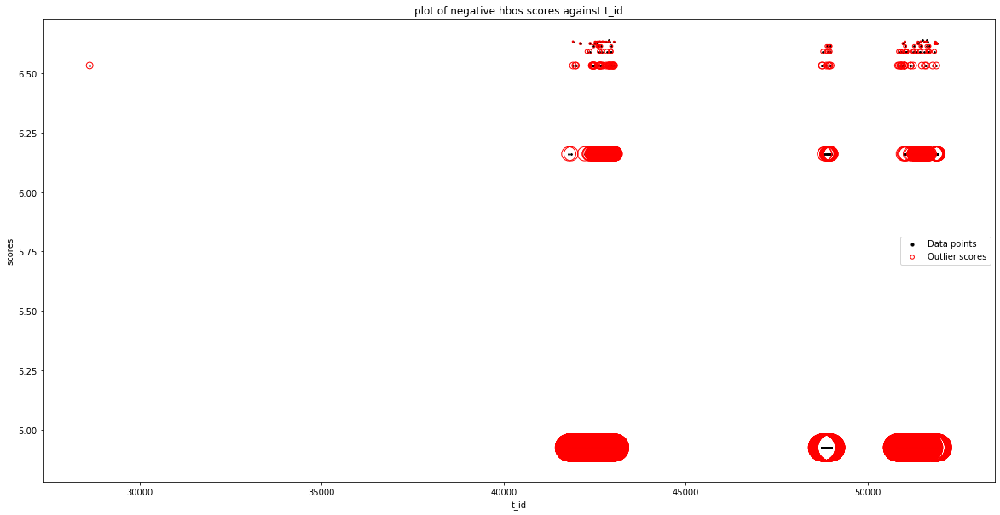

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_mean', 'idle_max'], dtype='object')
Number of Inliers :  2357
Number of Outliers :  154
Outlier index: 0
Outlier score: 6.532764799258846
Outlier index: 113
Outlier score: 6.207721566998525
Outlier index: 115
Outlier score: 6.106674116540232
Outlier index: 174
Outlier score: 6.106674116540232
Outlier index: 193
Outlier score: 6.106674116540232
Outlier index: 311
Outlier score: 6.199567291194715
Outlier index: 498
Outlier score: 6.165813883498826
Outlier index: 564
Outlier score: 6.165813883498826
Outlier index: 574
Outlier score: 6.199567291194715
Outlier index: 616
Outlier score: 6.106674116540232
Outlier index: 625
Outlier score: 6.106674116540232
Outlier ind

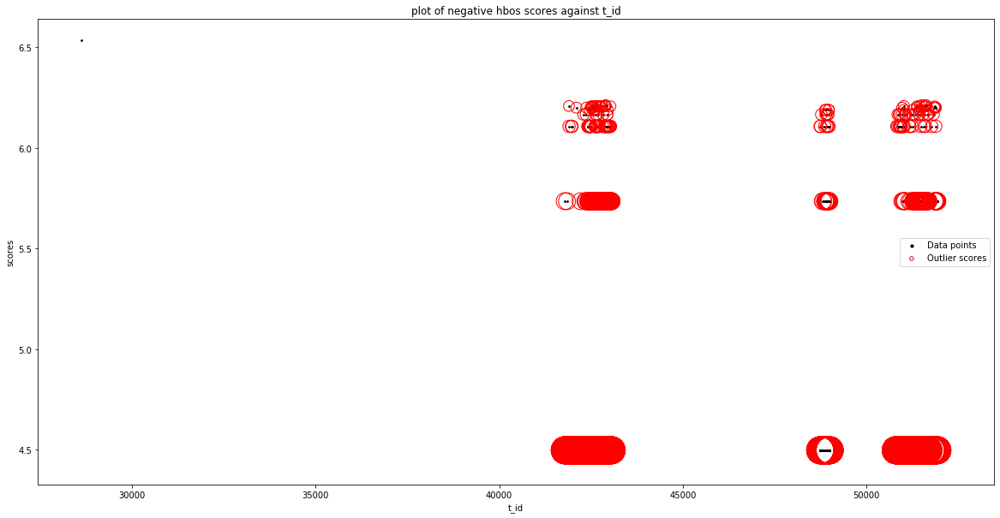

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_packet_length_mean', 'a_id'], dtype='object')
Number of Inliers :  2357
Number of Outliers :  154
Outlier index: 0
Outlier score: 6.530714903145016
Outlier index: 113
Outlier score: 4.907638043863176
Outlier index: 115
Outlier score: 4.8065905934048825
Outlier index: 174
Outlier score: 4.8065905934048825
Outlier index: 193
Outlier score: 4.8065905934048825
Outlier index: 311
Outlier score: 4.8994837680593655
Outlier index: 498
Outlier score: 4.865730360363477
Outlier index: 564
Outl

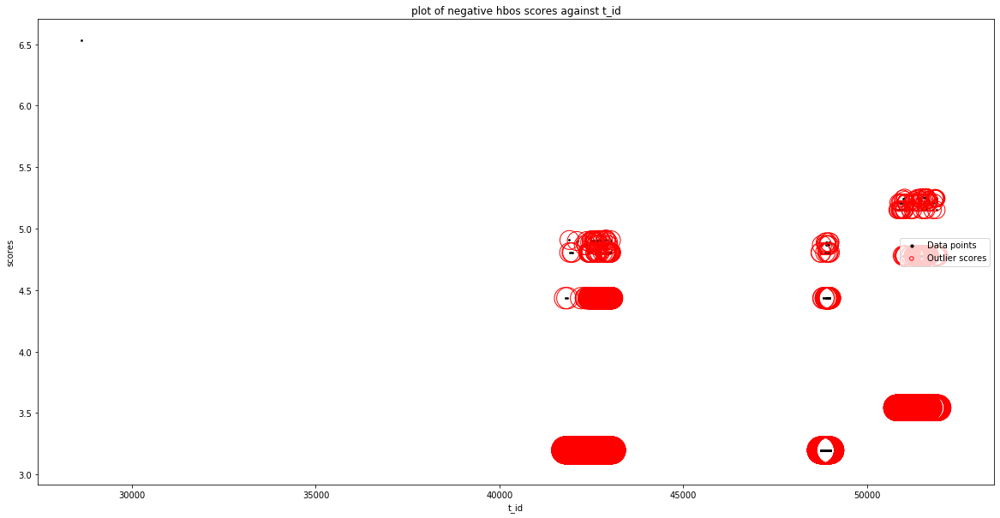

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'service_physical_ip']
inpu

Silhouetter Score: 0.709
davies bouldin Score: 0.852
calinski_harabasz Score: 1598.872


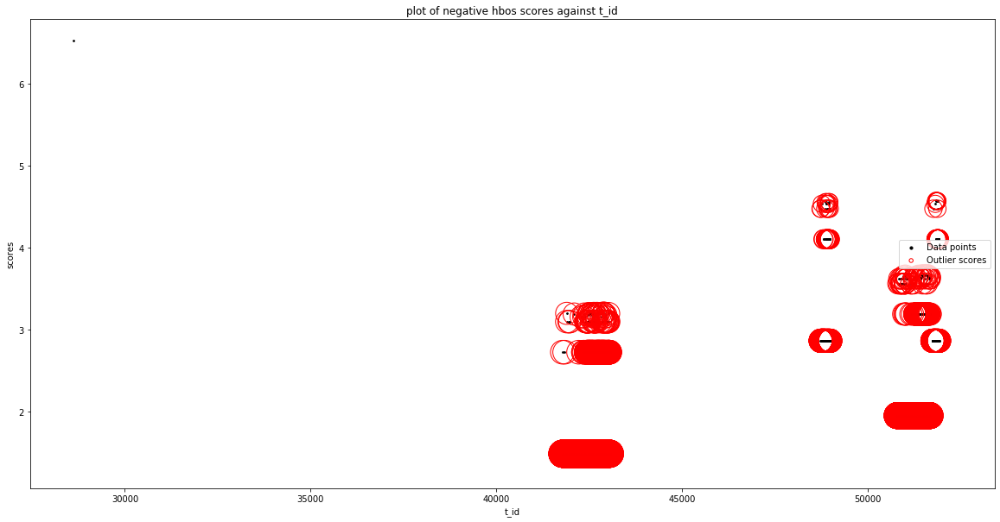

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_mean', 'log_start_time']
input param

No valid feature
No Valid columns found for combination of  ['fwd_packet_length_std', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_std', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_std', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_std', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_std', 'bwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No vali

No valid feature
No Valid columns found for combination of  ['fwd_packet_length_std', 'idle_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_std', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_std', 'idle_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_std', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_length_std', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns fo

No valid feature
No Valid columns found for combination of  ['bwd_packet_length_max', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_max', 'flow_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_max', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_max', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_max', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No

No valid feature
No Valid columns found for combination of  ['bwd_packet_length_max', 'bwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_max', 'subflow_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_max', 'subflow_fwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_max', 'subflow_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_max', 'subflow_bwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neigh

No valid feature
No Valid columns found for combination of  ['bwd_packet_length_min', 'total_length_of_fwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_min', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_min', 'fwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_min', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_min', 'fwd_packet_length_mean']
input parameters are being used instead of default values


No valid feature
No Valid columns found for combination of  ['bwd_packet_length_min', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_min', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_min', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_min', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_min', 'down_up_ratio']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid fe

No valid feature
No Valid columns found for combination of  ['bwd_packet_length_min', 'log_start_time']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_min', 'log_end_time']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_mean', 't_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_mean', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_mean', 'src_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns

No valid feature
No Valid columns found for combination of  ['bwd_packet_length_mean', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_mean', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_mean', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_mean', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_mean', 'packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n

No valid feature
No Valid columns found for combination of  ['bwd_packet_length_mean', 'a_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_mean', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_mean', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_mean', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_mean', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No

No valid feature
No Valid columns found for combination of  ['bwd_packet_length_std', 'fwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_std', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_std', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_std', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_std', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Va

No valid feature
No Valid columns found for combination of  ['bwd_packet_length_std', 'fwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_std', 'bwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_std', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_std', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_length_std', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 

Outlier index: 1414
Outlier score: 5.142152506166751
Outlier index: 1415
Outlier score: 5.142152506166751
Outlier index: 1416
Outlier score: 5.142152506166751
Outlier index: 1417
Outlier score: 5.142152506166751
Outlier index: 1418
Outlier score: 5.142152506166751
Outlier index: 1419
Outlier score: 5.142152506166751
Outlier index: 1420
Outlier score: 5.142152506166751
Outlier index: 1421
Outlier score: 5.444959435644618
Outlier index: 1422
Outlier score: 5.142152506166751
Outlier index: 1423
Outlier score: 5.142152506166751
Outlier index: 1424
Outlier score: 5.142152506166751
Outlier index: 1425
Outlier score: 5.142152506166751
Outlier index: 1426
Outlier score: 5.142152506166751
Outlier index: 1427
Outlier score: 5.142152506166751
Outlier index: 1428
Outlier score: 5.142152506166751
Outlier index: 1429
Outlier score: 5.142152506166751
Outlier index: 1430
Outlier score: 5.142152506166751
Outlier index: 1431
Outlier score: 5.142152506166751
Outlier index: 1432
Outlier score: 5.142152506

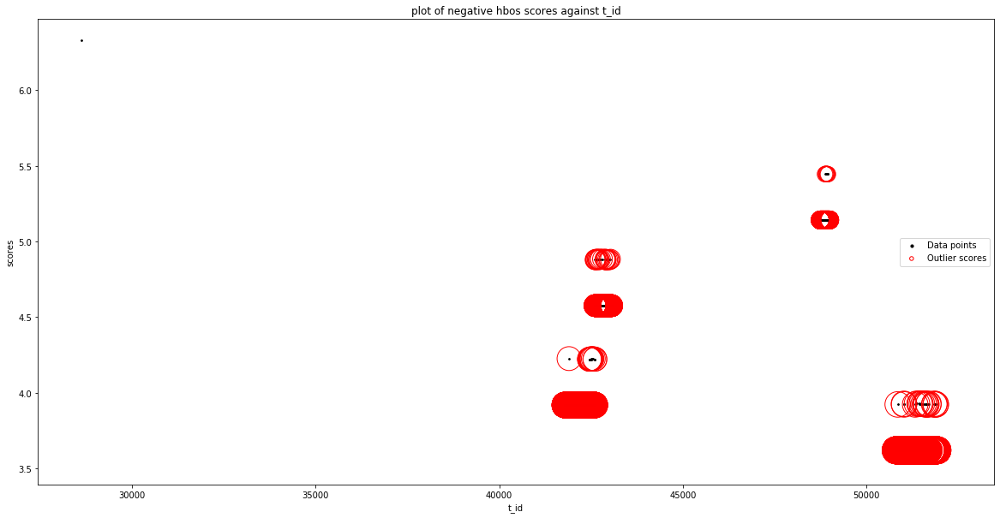

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_bytes_per_sec', 'src_port'], dtype='object')
Number of Inliers :  2361
Number of Outliers :  150
Outlier index: 0
Outlier score: 6.31450738350296
Outlier index: 1363
Outlier score: 4.81504169478521
Outlier index: 1384
Outlier score: 4.81504169478521
Outlier index: 1390
Outlier score: 4.8190916496588265
Outlier index: 1404
Outlier score: 4.81504169478521
Outlier index: 1421
Outlier score: 4.81504169478521
Outlier index: 1436
Outlier score: 4.81504169478521
Outlier index: 2358
Outlier score: 4.675144169278848
Outlier index: 2359
Outlier score: 4.675144169278848
Outlier index: 2360
Outlier score: 4.675144169278848
Outlier index: 2361
Outlier score: 4.675144169278848
Outlier index: 2

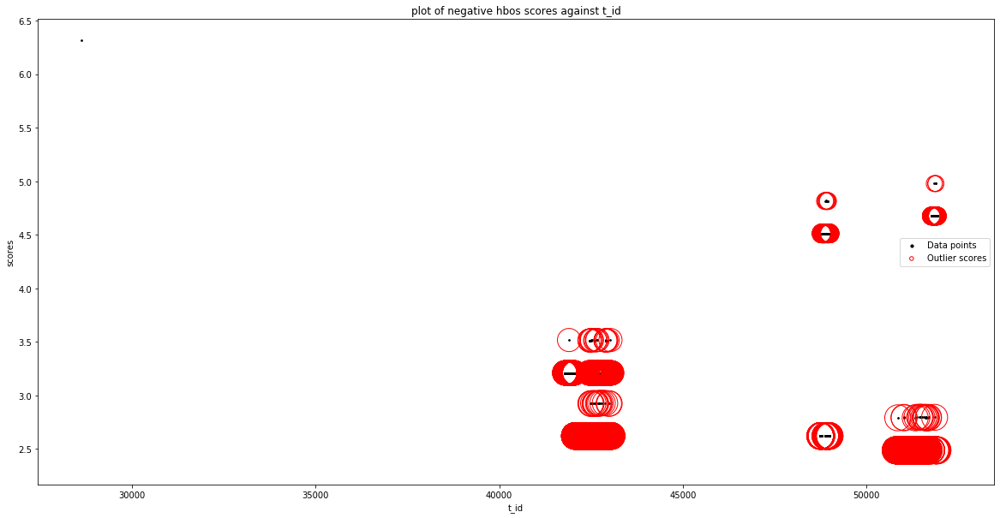

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_bytes_per_sec', 'flow_duration'], dtype='object')
Number of Inliers :  2448
Number of Outliers :  63
Outlier index: 0


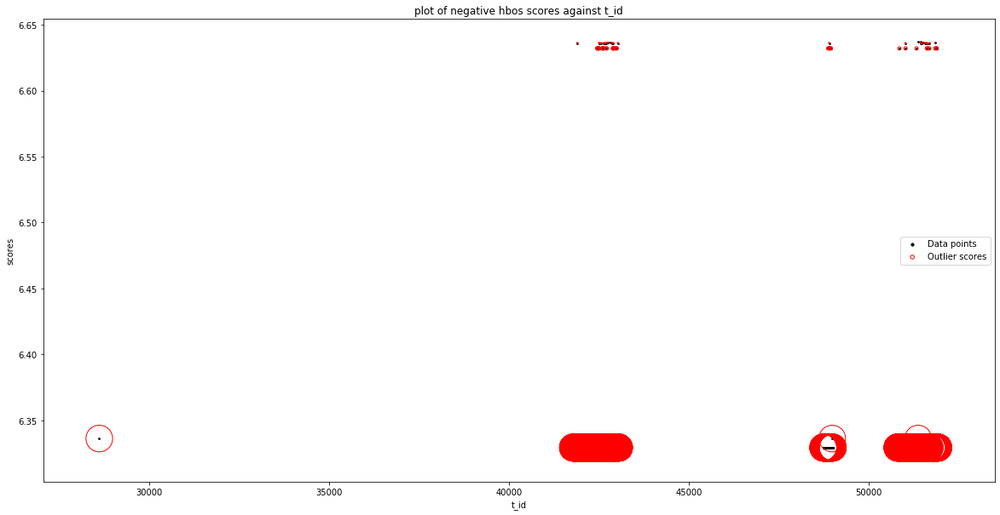

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_bytes_per_sec', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2432
Number of Outliers :  79
Outlier index: 0
Outlier score: 6.335961777462292
Outlier index: 113
Outlier score: 6.6420261942071415
Outlier index: 311
Outlier score: 6.330423623811392
Outlier index: 657
Outlier score: 6.217602881470878
Outlier index: 663
Outlier score: 6.217602881470878
Outlier index: 667
Outlier score: 6.217602881470878
Outlier index: 687
Outlier score: 6.217602881470878
Ou

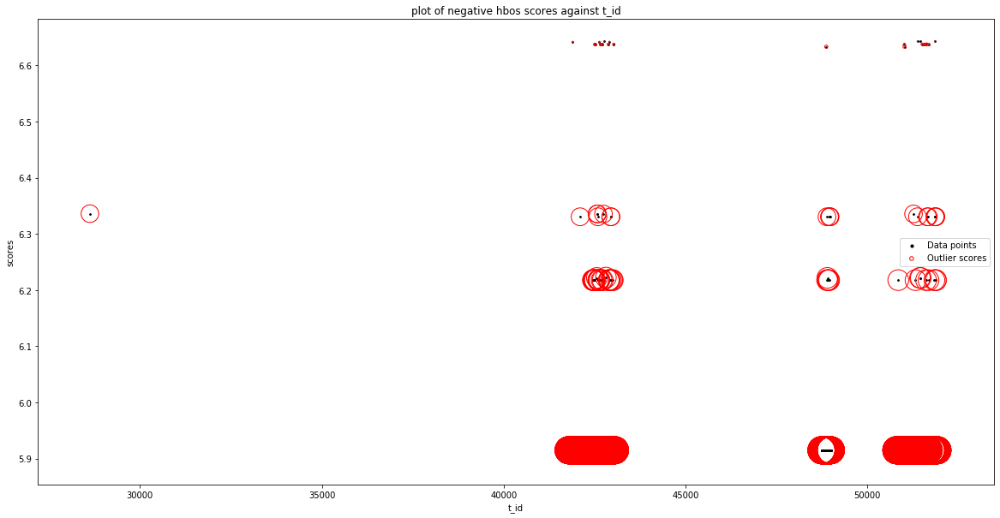

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_bytes_per_sec', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2320
Number of Outliers :  191
Outlier index: 0
Outlier score: 6.104947755344947
Outlier index: 1
Outlier score: 6.104947755344947
Outlier index: 63
Outlier score: 6.148320450990829
Outlier index: 113
Outlier score: 6.411804639696431
Outlier index: 115
Outlier score: 6.104947755344947
Outlier index: 174
Outlier score: 6.311298370887853
Outlier index: 193
Outlier score: 6.148320450990829
Outlier index: 311
Outlier score: 6.104947755344947
Outlier index: 426
Outlier score: 6.286857964837239
Outlier index: 498
Outlier score: 6.104947755344947
Outlier index: 553
Outlier score: 6.1483204

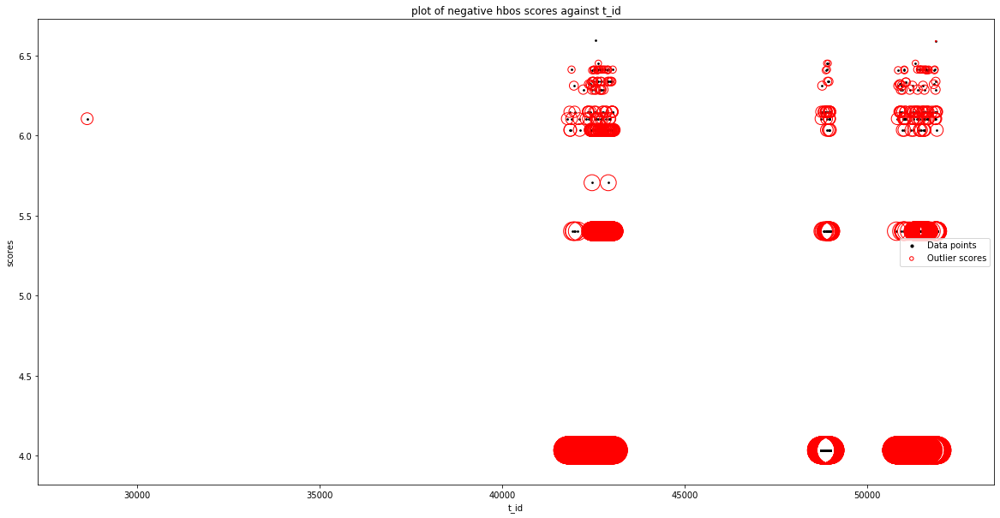

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_bytes_per_sec', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2355
Number of Outliers :  156
Outlier index: 0
Outlier score: 6.2252661511844245
Outlier index: 113
Outlier score: 6.633170485994201
Outlier index: 115
Outlier score: 6.2252661511844245
Outlier index: 174
Outlier score: 6.2252661511844245
Outlier index: 193
Outlier score: 6.2252661511844245
Outlier index: 311
Outlier score: 6.3181593258389075
Outlier index: 498
Outlier score: 6.284405918143019
Outlier index: 564
Outlier score: 6.284405918143019
Outlier index: 574
Outlier score: 6.3181593258389075
Outlier index: 616
Outlier score: 6.2252661511844245
Outlier index: 625
Outlier score: 6.2

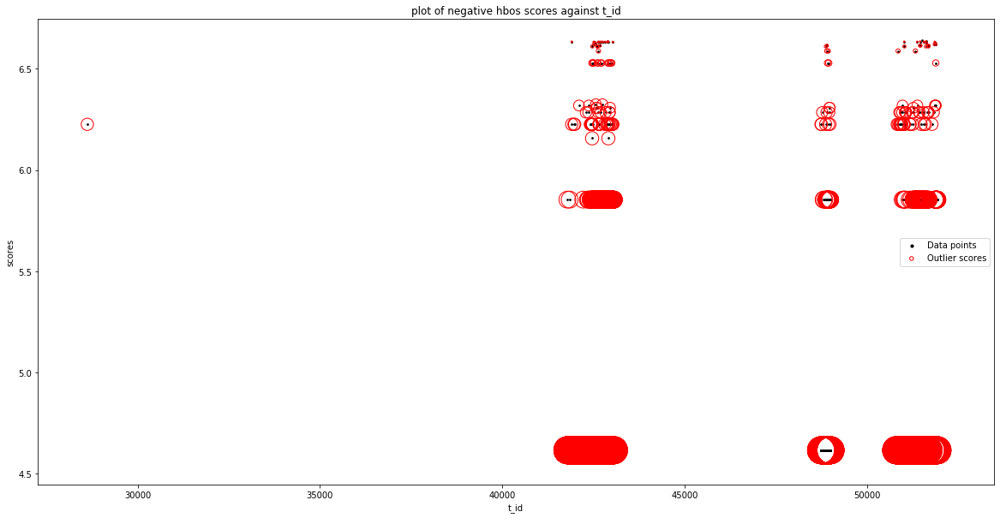

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'bwd_packet_le

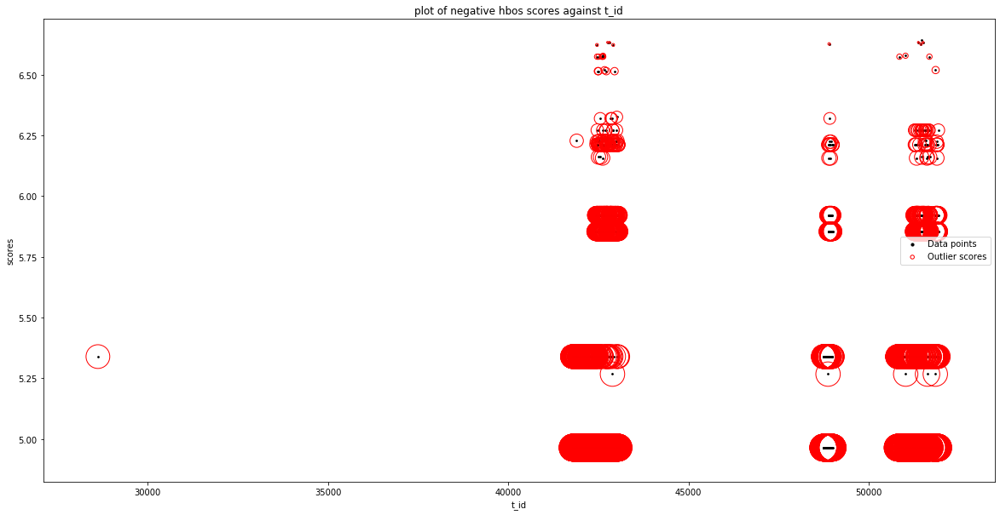

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_bytes_per_sec', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2449
Number of Outliers :  62
Outlier index: 113
Outlier score: 6.61606331375417
Outlier index: 657
Outlier score: 6.612013358880553
Outlier index: 663
Outlier score: 6.612013358880553
Outlier index: 667
Outlier score: 6.612013358880553
Outlier index: 687
Outlier score: 6.612013358880553
Outlier index: 693
Outlier score: 6.612013358880553
Outlier index: 701
Outlier score: 6.612013358880553
Outlier index: 703
Outlier score: 6.61606331375417
Outlier index: 707
Outlier score: 6.612013358880553
Outlier index: 721
Outlier score: 6.61606331375417
Outlier index: 758
Outlier score: 6.615923470713277
Outlier index: 799
Outlier score: 6.612013358880553
Outlier index: 802
Outlier score: 6.612013358880553
Outlier index: 805
Outlier score: 6.612013358880553
Outlier index: 814
Outlier score: 6.6120133588805

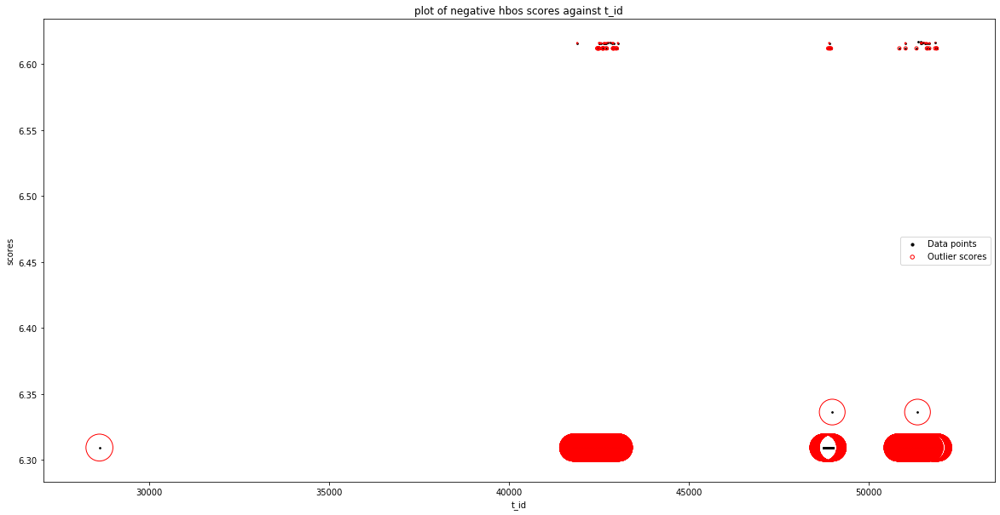

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_bytes_per_sec', 'flow_iat_min'], dtype='object')
Number of Inliers :  2448
Number of Outliers :  63
Outlier index: 113
Outlier score: 6.167999887030918
Outlier index: 199
Outlier score: 6.335487204623927
Outlier index: 631
Outlier score: 6.335487204623927
Outlier index: 657
Outlier score: 6.163949932157301
Outlier index: 663
Outlier score: 6.163949932157301
Outlier index: 667
Outlier score: 6.163949932157301
Outlier index: 687
Outlier score: 6.163949932157301
Outlier index: 693
Outlie

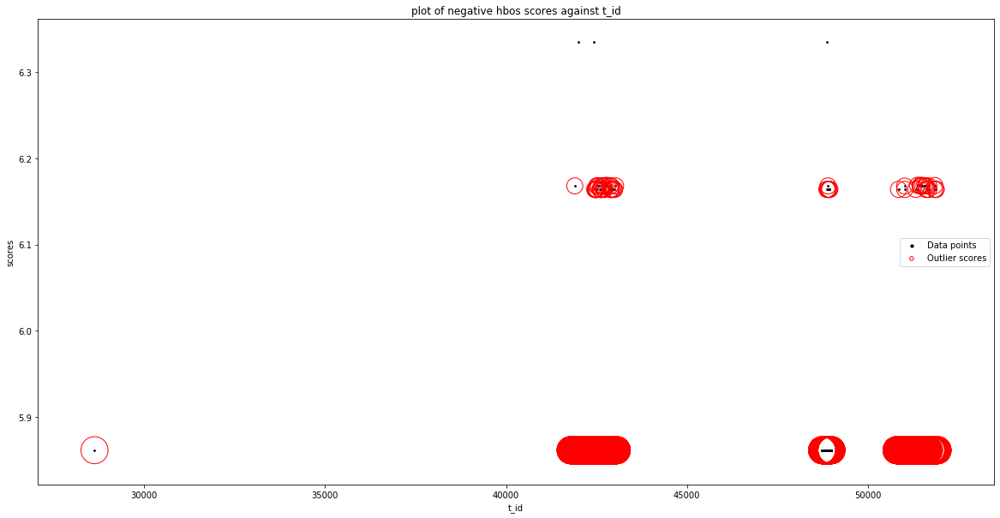

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_bytes_per_sec', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2399
Number of Outliers :  112
Out

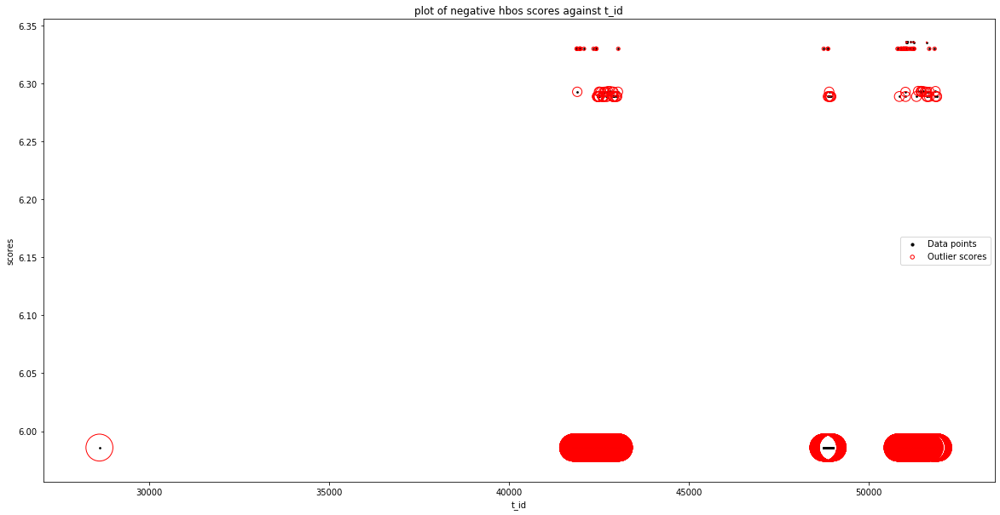

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_bytes_per_sec', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2385
Number of Outliers :  126
Outl

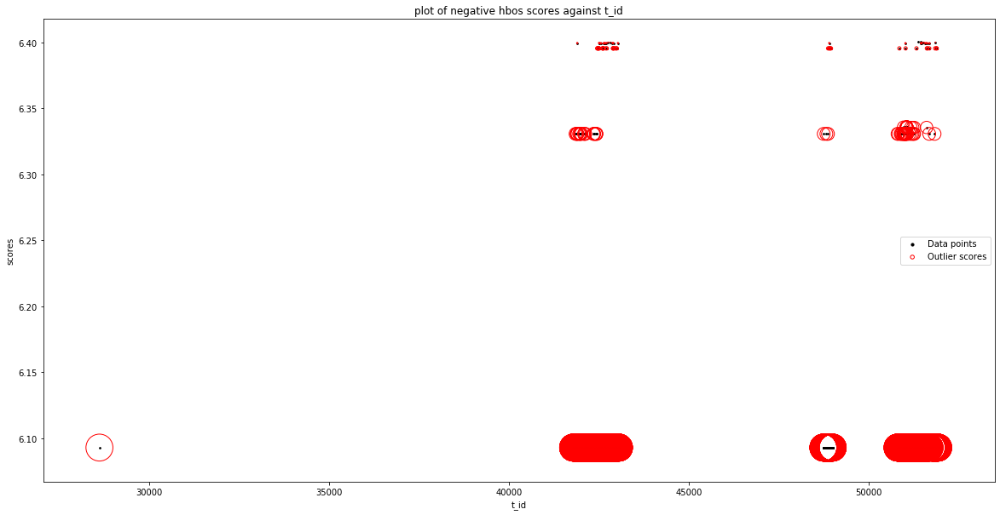

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'fwd_header_length']
input parameters are being

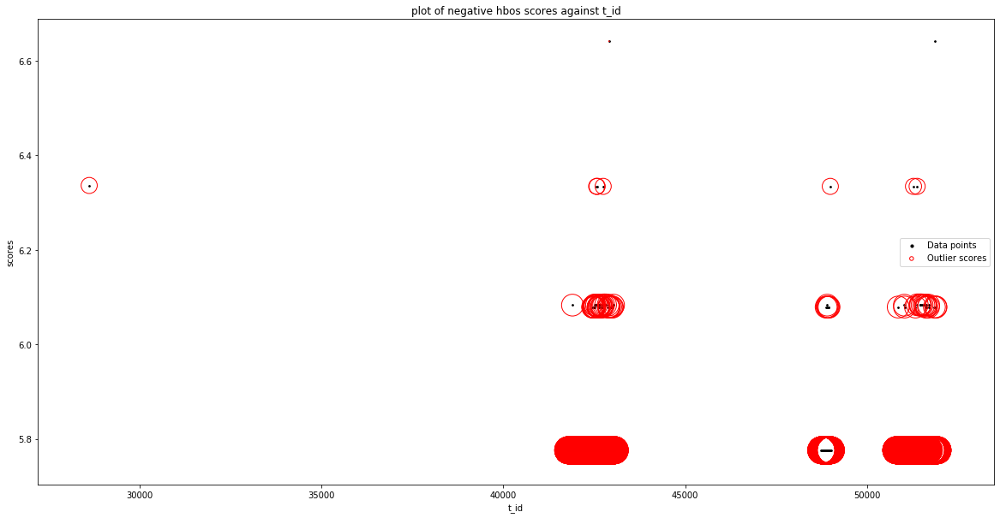

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'packet_length_mean']
input

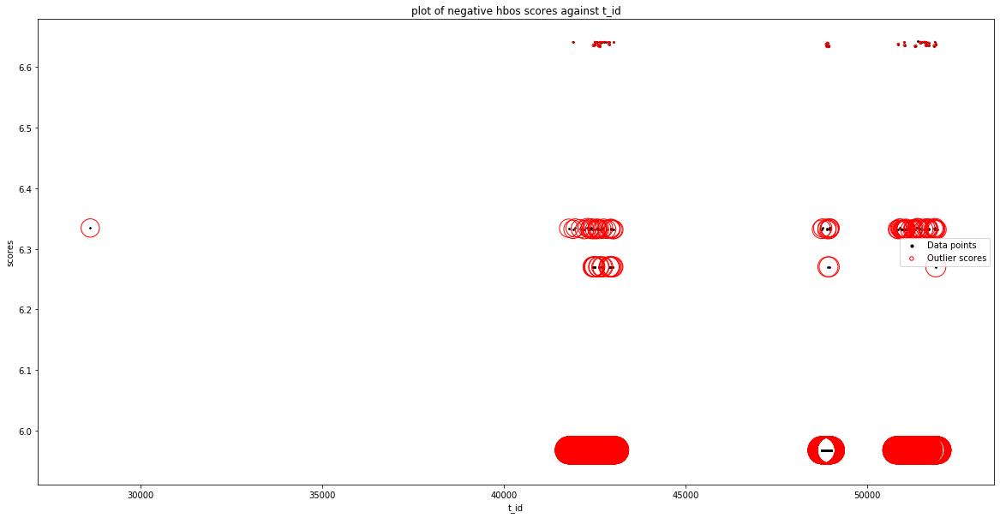

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_bytes_per_sec', 'psh_flag_count'], dtype='object')
Number of Inliers :  2447
Number of Outliers :  64
Outlier index: 0
Outlier score: 6.334792634370256
Outlier index: 113
Outlier score: 4.88761163317007
Outlier index: 657
Outlier score: 4.883561678296453
Outlier index: 663
Outlier score: 4

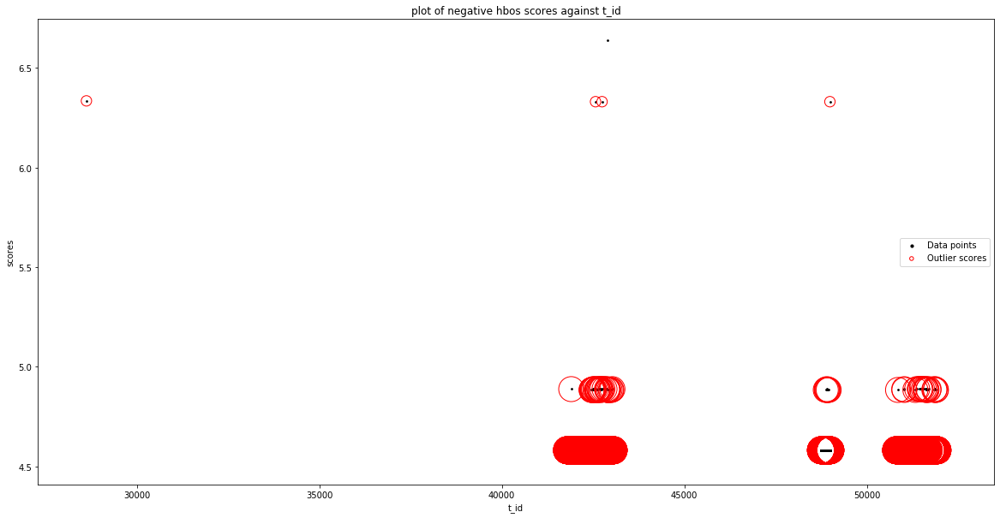

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'down_up_ratio']
input parameters are being

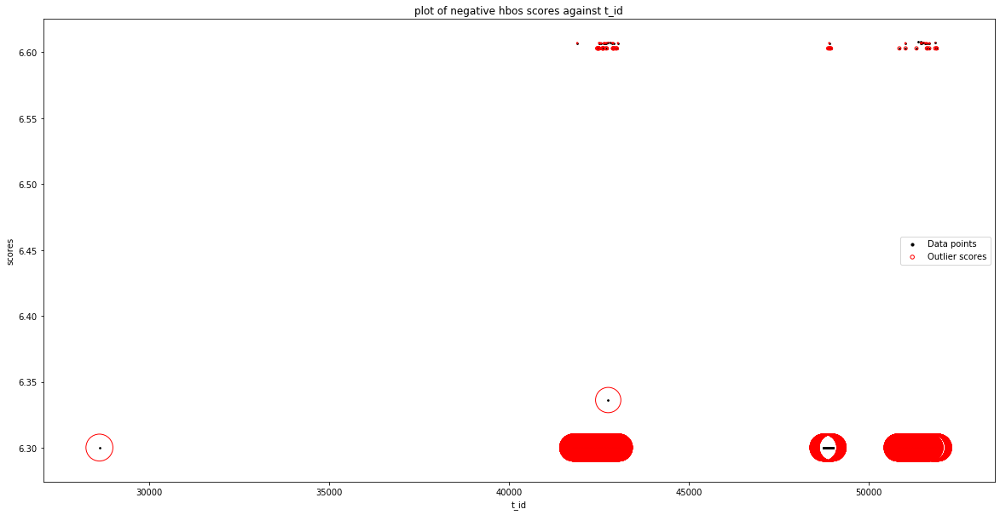

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'active_max']
input parameters are being u

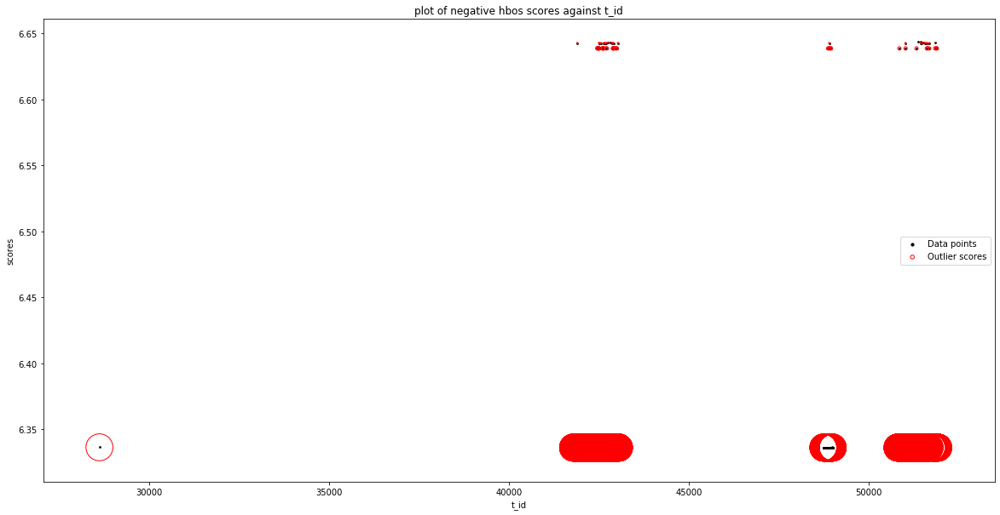

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_bytes_per_sec', 'idle_max'], dtype='object')
Number of Inliers :  2450
Number of Outliers :  61
Outlier index: 0
Outlier score: 6.335962383096166
Outlier index: 113
Outlier score: 6.2167285847290366
Outlier index: 657
Outlier score: 6.21267862985542
Outlier index: 663
Outlier score: 6.21267862985542
Outlier index: 667
Outlier score: 6.21267862985542
Outlier index: 687
Outlier score: 6.21267862985542
Outlier index: 693
Outlier score: 6.21267862985542
Outlier index: 701
Outlier score: 6.21267862985542
Outlier index: 703
Outlier score: 6.2167285847290366
Outlier index: 707
Outlier score: 6.21267862985542
Outlier index: 721
Outlier score: 6.2167285847290366
Outlier index: 758
Outli

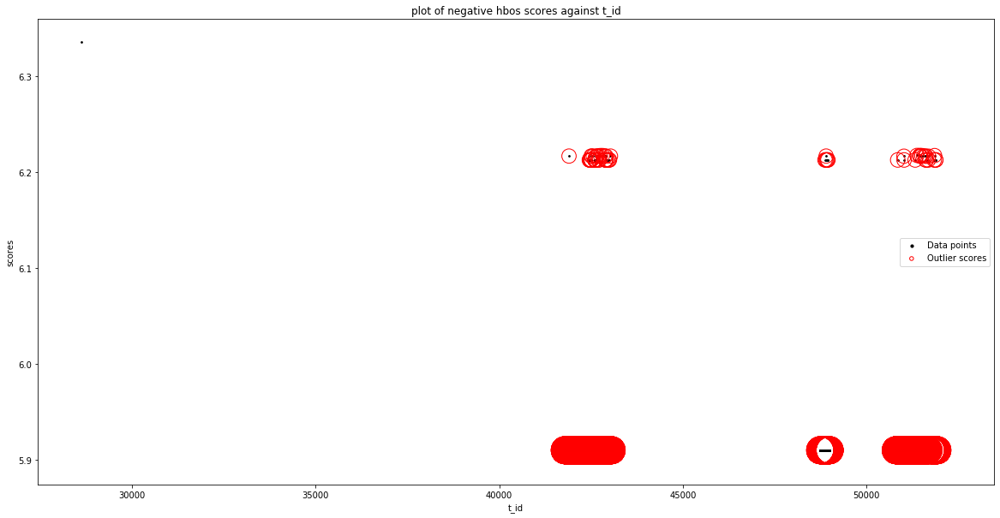

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_bytes_per_sec', 'a_id'], dtype='object')
Number of Inliers :  2490
Number of Outliers :  21
Outlier index: 0
Outlier score: 6.333912486982336
Outlier index: 1535
Outlier score: 5.258094726131913
Outlier index: 1703
Outlier score: 5.262004837964636
Outlier index: 1707
Outlier score: 5.258094726131913
Outlier index: 2001
Outlier score: 5.258094726131913
Outlier index: 2050
Outlier score: 5.262844099610878
Outlier index: 2116
Outlier score: 5.2621446810055295
Outlier index: 2121
Outlier score

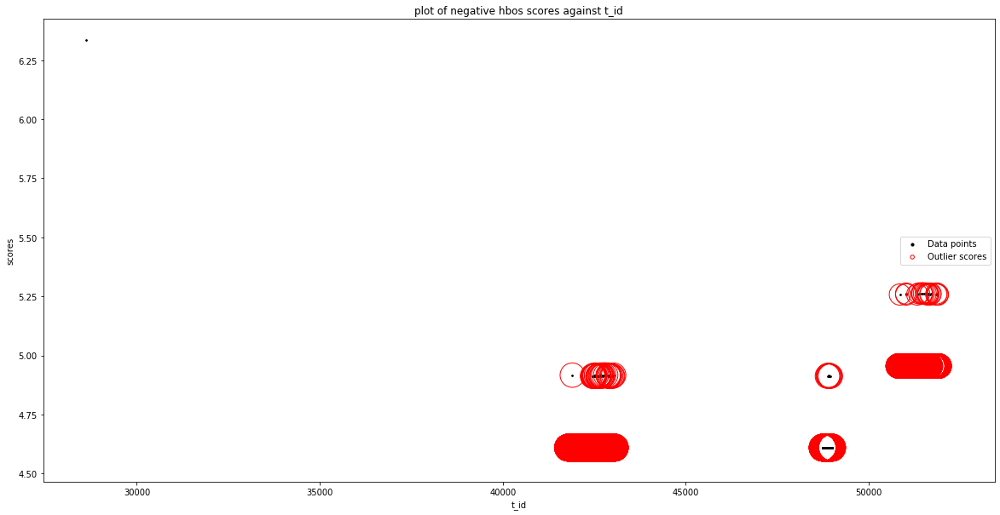

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'service_physical_ip']
input parameters are bei

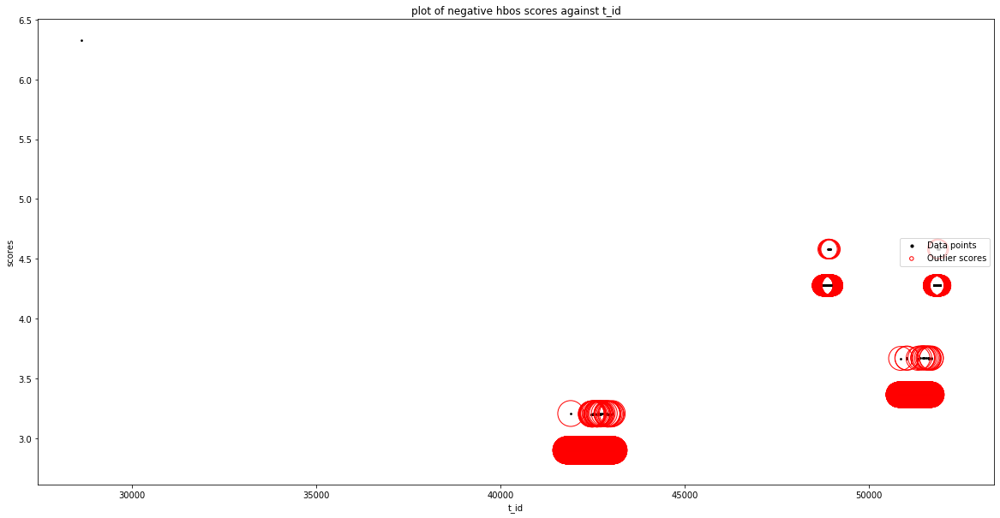

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_bytes_per_sec', 'log_start_time']
input parameters are being used

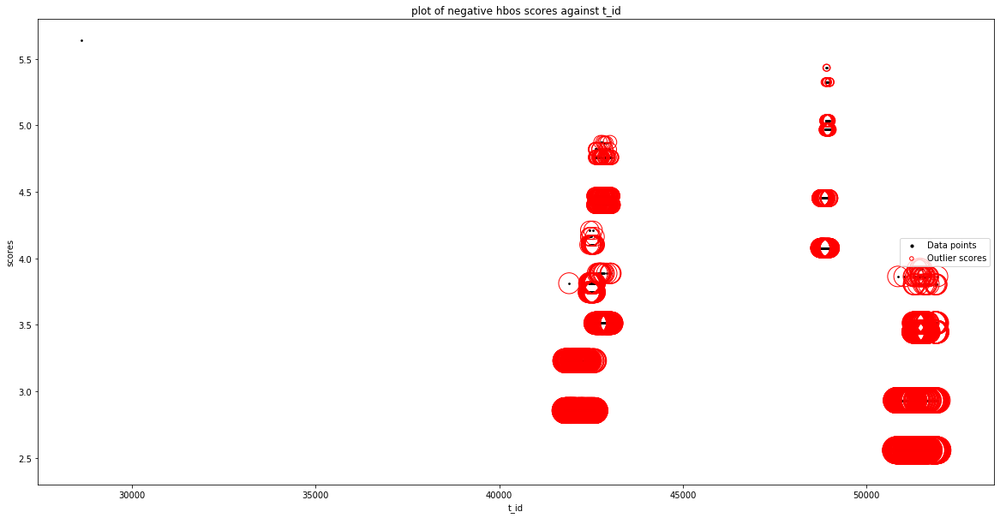

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_pkts_per_sec', 'src_port'], dtype='object')
Number of Inliers :  2266
Number of Outliers :  245
Outlier index: 0
Outlier score: 5.625360857963804
Outlier index: 663
Outlier score: 3.5024959615739437
Outlier index: 749
Outlier score: 3.5024959615739437
Outlier index: 1033
Outlier score: 3.5024959615739437
Outlier index: 1059
Outlier score: 3.5024959615739437
Outlier index: 1098
Outlier score: 3.5024959615739437
Outlier index: 1195
Outlier score: 3.5084194485073437
Outlier index: 1280
Outlier score: 3.823088239768185
Outlier index: 1281
Outlier score: 3.823088239768185
Outlier index: 1282
Outlier score: 3.823088239768185
Outlier index: 1283
Outlier score: 3.823088239768185
Outlier i

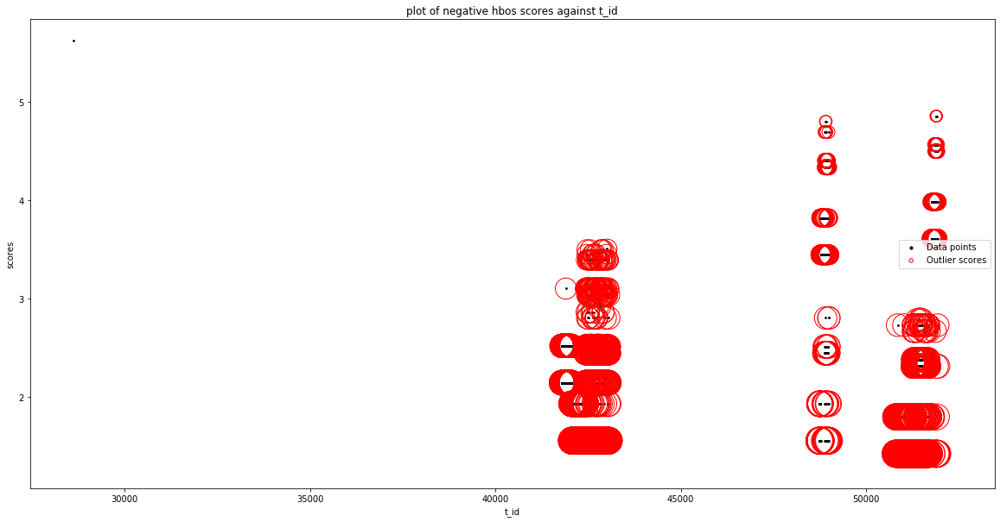

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_pkts_per_sec', 'flow_duration'], dtype='object')
Number of Inliers :  2399
Number of Outliers :  112
Outlier index: 653
Ou

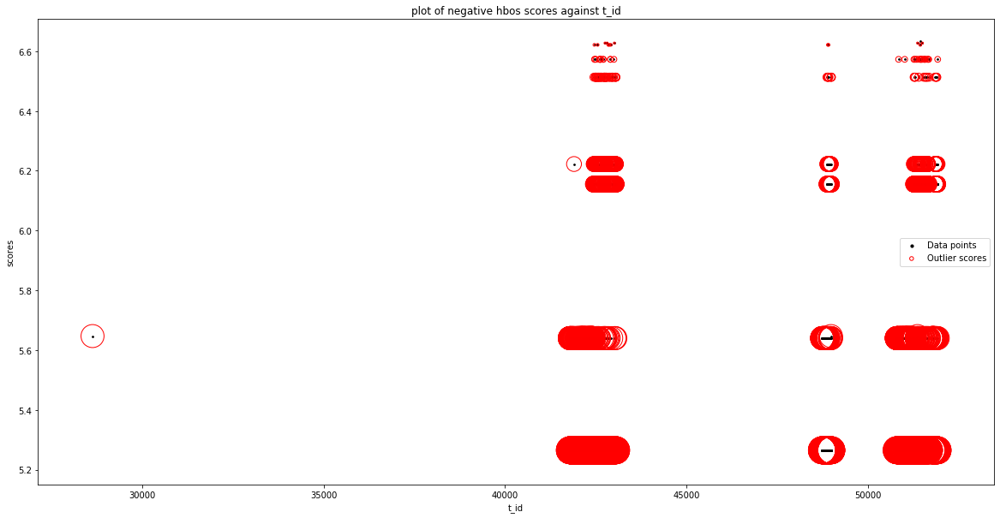

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_pkts_per_sec', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2387
Number of Outliers :  124
Outlier index: 113
Outlier score: 6.228408944529818
Outlier index: 653
Outlier score: 6.098483840691936
Outlier index: 663
Outlier score: 6.206641845036099
Outlier index: 667
Outlier score: 6.158203003378649
Outlier index: 674
Outlier score: 6.158203003378649
Outlier index: 687
Outlier score: 6.098483840691936
Outlier index: 689
Outlier score: 6.098483840691936
Out

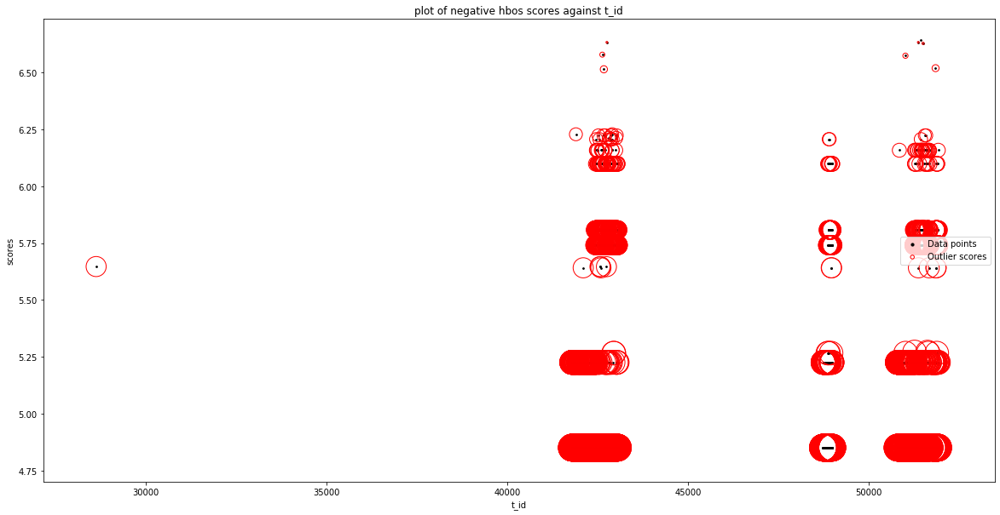

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_pkts_per_sec', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2312
Number of Outliers :  199
Outlier index: 0
Outlier score: 5.41580122980579
Outlier index: 1
Outlier score: 5.41580122980579
Outlier index: 113
Outlier score: 5.9981873900191065
Outlier index: 311
Outlier score: 5.41580122980579
Outlier index: 332
Outlier score: 5.345442936779404
Outlier index: 564
Outlier score: 5.41580122980579
Outlier index: 574
Outlier score: 5.631424807729991
Outlier index: 575
Outlier score: 5.4591739254516725
Outlier index: 621
Outlier score: 5.345442936779404
Outlier index: 629
Outlier score: 5.345442936779404
Outlier index: 634
Outlier score: 5.6221518453

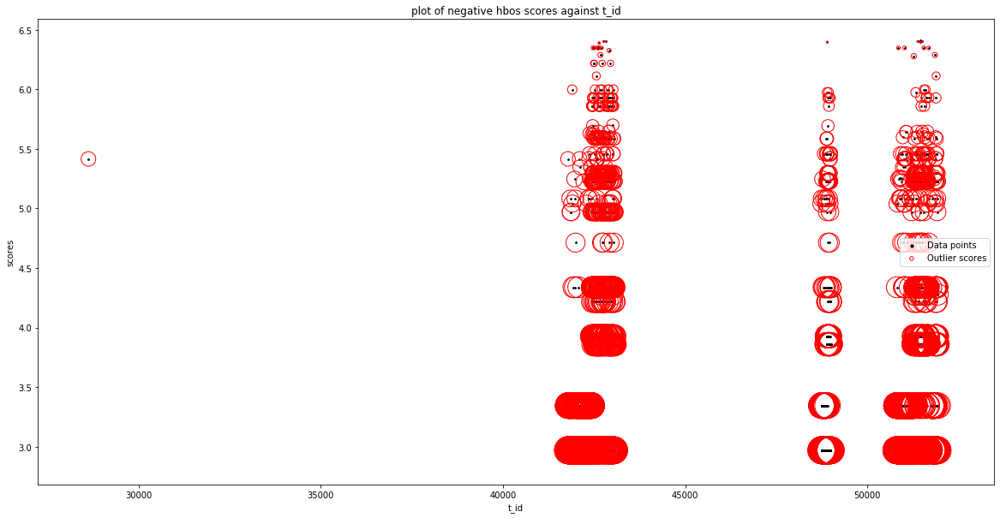

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_pkts_per_sec', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2306
Number of Outliers :  205
Outlier index: 113
Outlier score: 6.219553236316878
Outlier index: 638
Outlier score: 6.051334934009062
Outlier index: 650
Outlier score: 6.051334934009062
Outlier index: 657
Outlier score: 6.118505785858584
Outlier index: 660
Outlier score: 6.118505785858584
Outlier index: 661
Outlier score: 6.051334934009062
Outlier index: 663
Outlier score: 6.145464638561267
Outlier index: 664
Outlier score: 6.051334934009062
Outlier index: 665
Outlier score: 5.7468583801923385
Outlier index: 666
Outlier score: 5.7468583801923385
Outlier index: 667
Outlier score: 6.550227

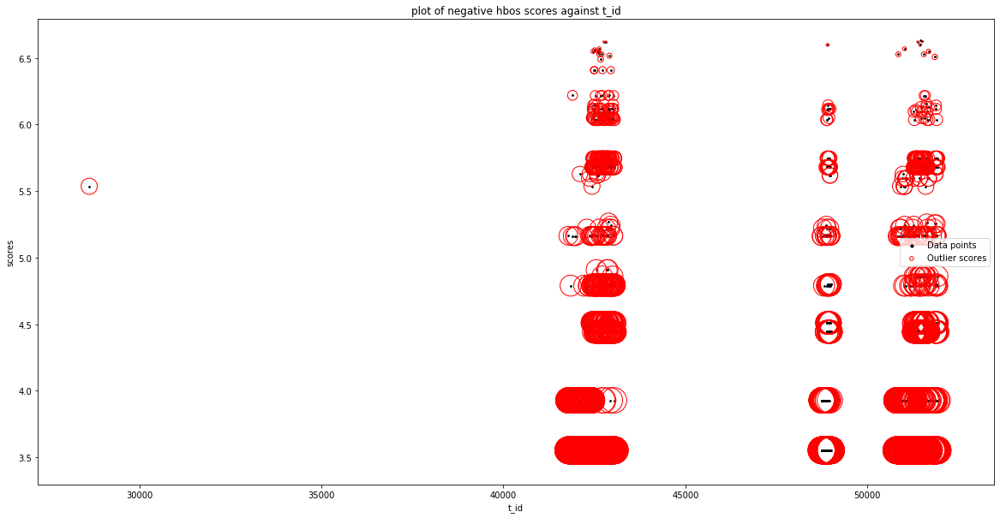

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'bwd_packet_length_

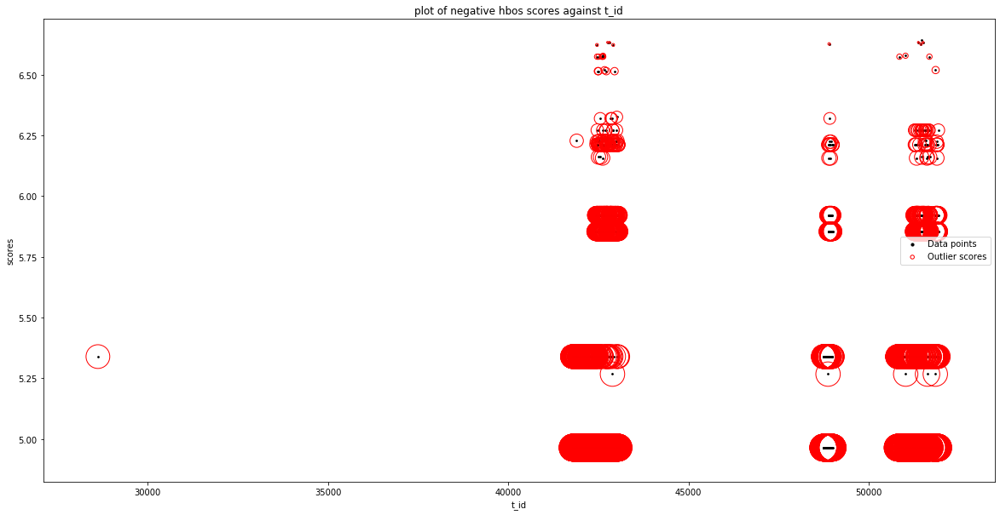

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_pkts_per_sec', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2399
Number of Outliers :  112
Outlier index: 653
Outlier score: 6.492894318101611
Outlier index: 663
Outlier score: 6.601052322445774
Outlier index: 667
Outlier score: 6.552613480788324
Outlier index: 674
Outlier score: 6.552613480788324
Outlier index: 687
Outlier score: 6.492894318101611
Outlier index: 689
Outlier score: 6.492894318101611
Outlier index: 694
Outlier score: 6.492894318101611
Outlier index: 701
Outlier score: 6.492894318101611
Outlier index: 707
Outlier score: 6.552613480788324
Outlier index: 709
Outlier score: 6.492894318101611
Outlier index: 713
Outlier score: 6.492894318101611
Outlier index: 732
Outlier score: 6.492894318101611
Outlier index: 747
Outlier score: 6.492894318101611
Outlier index: 749
Outlier score: 6.601052322445774
Outlier index: 762
Outlier score: 6.4928943181

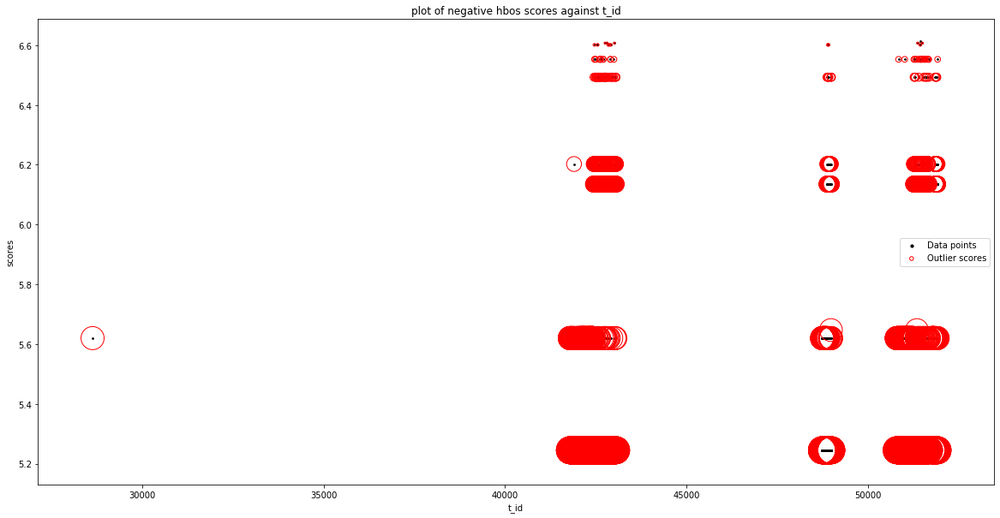

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_pkts_per_sec', 'flow_iat_min'], dtype='object')
Number of Inliers :  2399
Number of Outliers :  112
Outlier index: 653
Outlier score: 6.04483089137836
Outlier index: 663
Outlier score: 6.1529888957225225
Outlier index: 667
Outlier score: 6.104550054065072
Outlier index: 674
Outlier score: 6.104550054065072
Outlier index: 687
Outlier score: 6.04483089137836
Outlier index: 689
Outlier score: 6.04483089137836
Outlier index: 694
Outlier score: 6.04483089137836
Outlier index: 701
Outlier sco

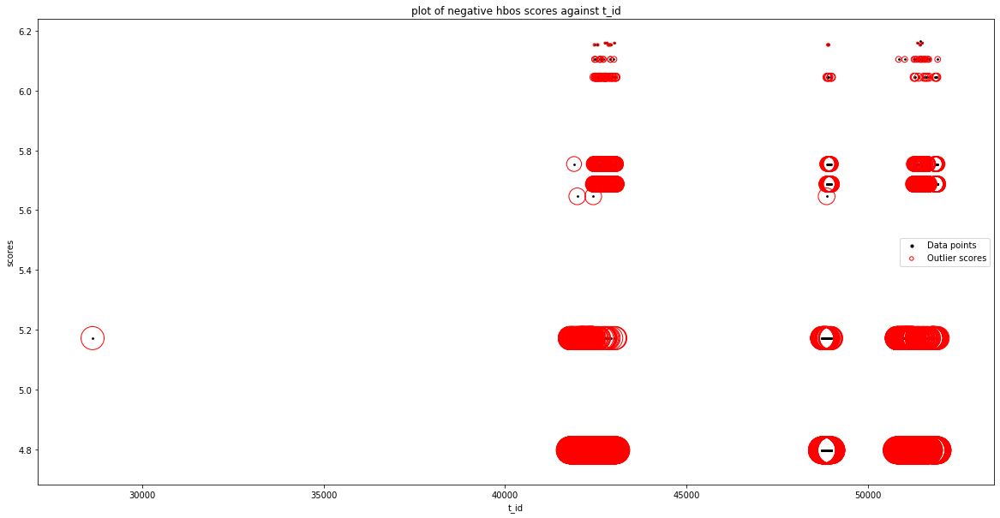

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_pkts_per_sec', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2399
Number of Outliers :  112
Outlier 

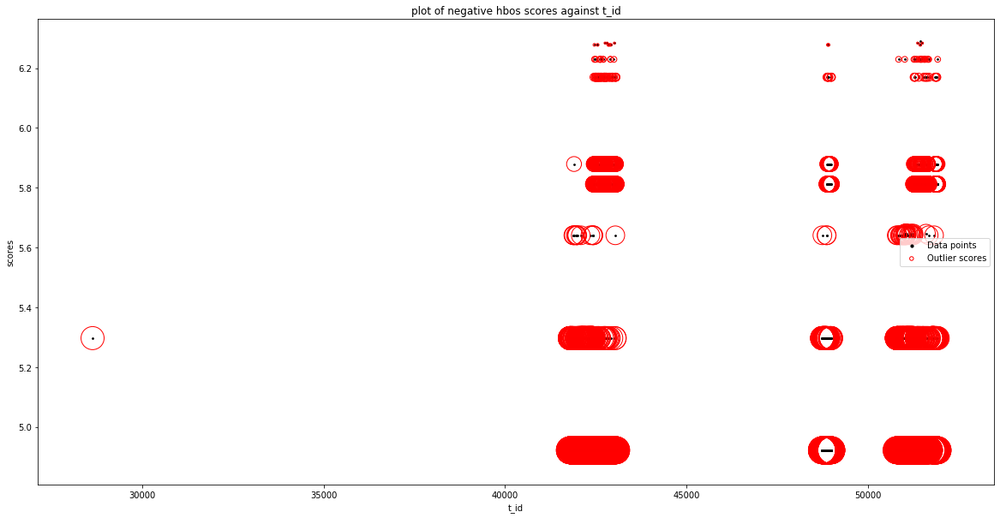

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_pkts_per_sec', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2399
Number of Outliers :  112
Outlier i

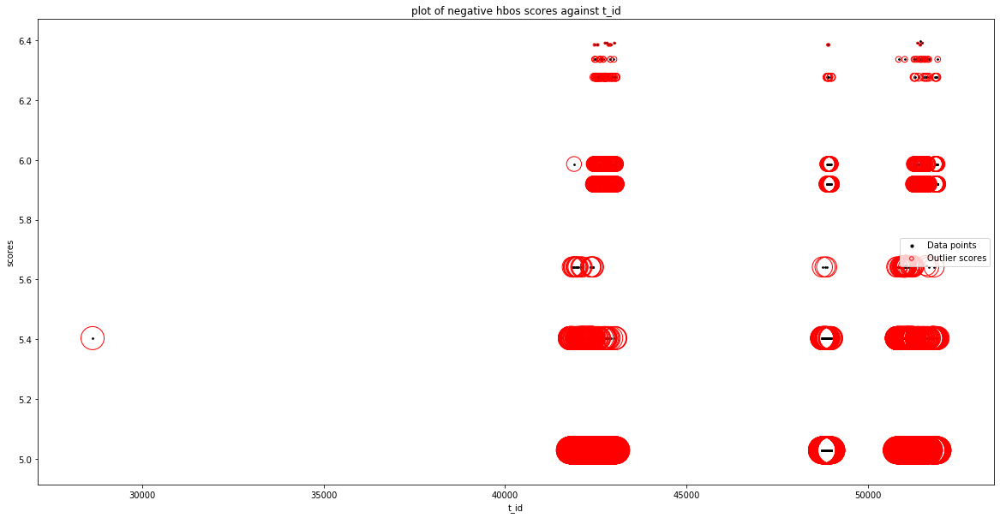

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'fwd_header_length']
input parameters are being used

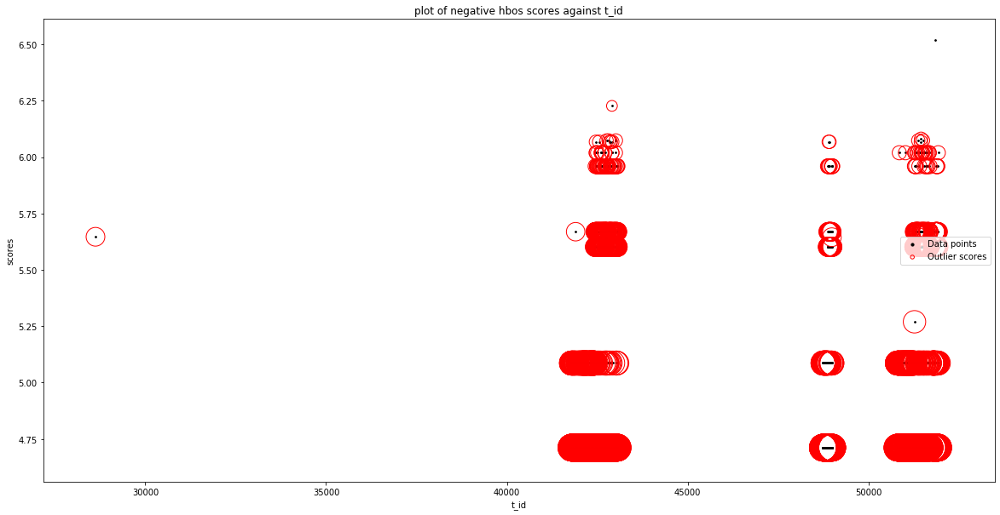

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'packet_length_mean']
input para

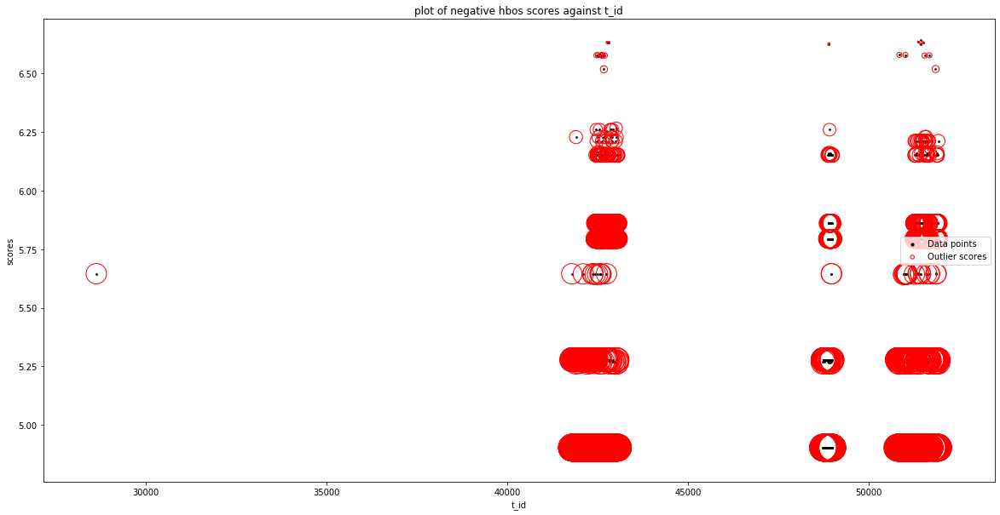

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_pkts_per_sec', 'psh_flag_count'], dtype='object')
Number of Inliers :  2394
Number of Outliers :  117
Outlier index: 0
Outlier score: 5.6456461088311
Outlier index: 653
Outlier score: 4.7644426375175115
Outlier index: 663
Outlier score: 4.872600641861674
Outlier index: 667
Outlier score: 4.82

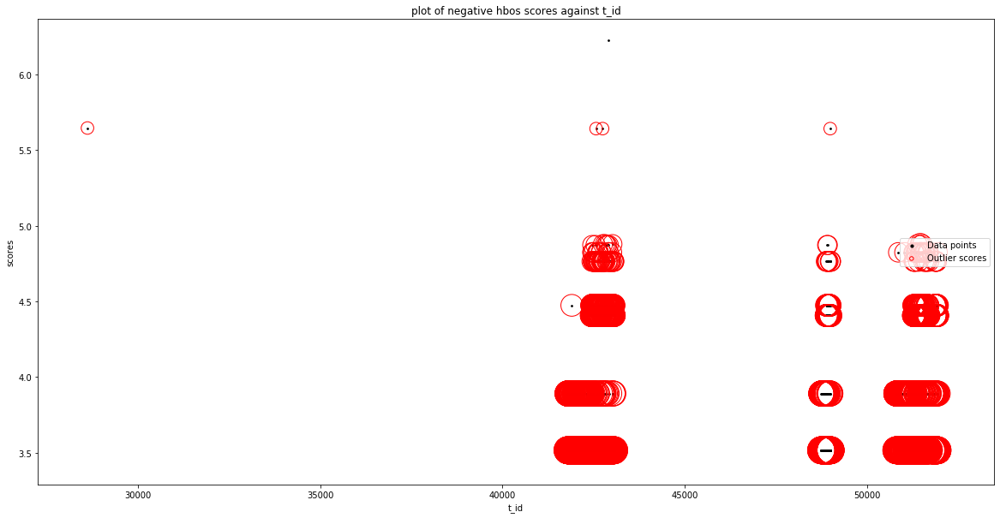

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'down_up_ratio']
input parameters are being used

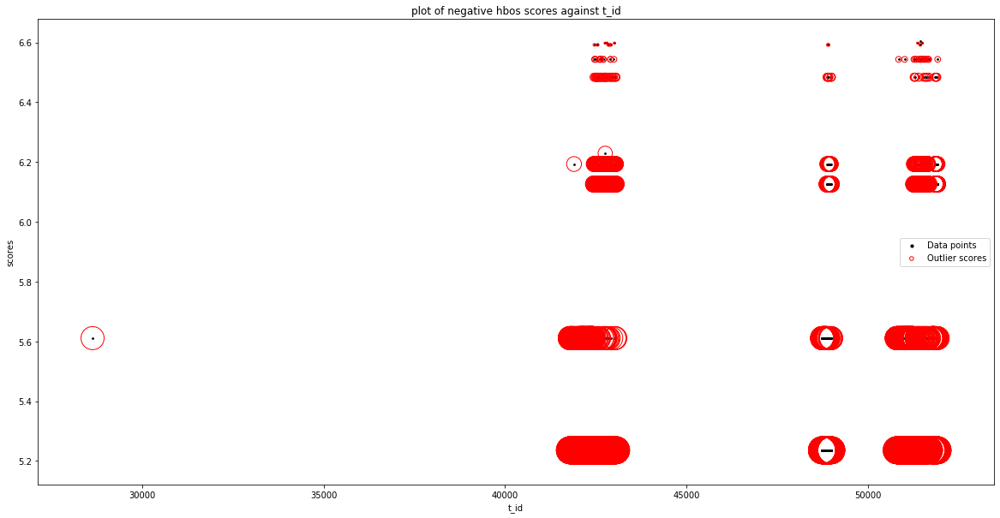

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'active_max']
input parameters are being used i

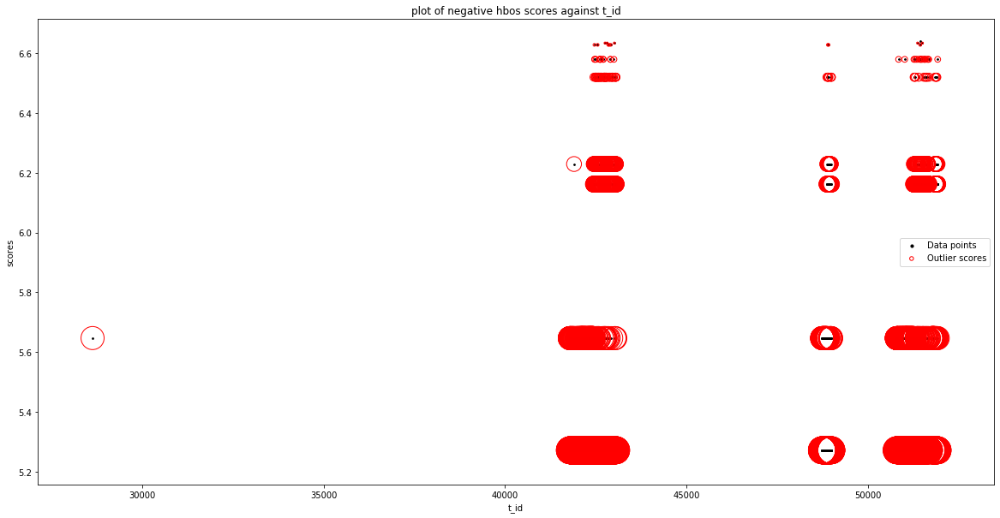

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_pkts_per_sec', 'idle_max'], dtype='object')
Number of Inliers :  2399
Number of Outliers :  112
Outlier index: 653
Outlier score: 6.093559589076477
Outlier index: 663
Outlier score: 6.201717593420641
Outlier index: 667
Outlier score: 6.153278751763191
Outlier index: 674
Outlier score: 6.153278751763191
Outlier index: 687
Outlier score: 6.093559589076477
Outlier index: 689
Outlier score: 6.093559589076477
Outlier index: 694
Outlier score: 6.093559589076477
Outlier index: 701
Outlier score: 6.093559589076477
Outlier index: 707
Outlier score: 6.153278751763191
Outlier index: 709
Outlier score: 6.093559589076477
Outlier index: 713
Outlier score: 6.093559589076477
Outlier index: 732


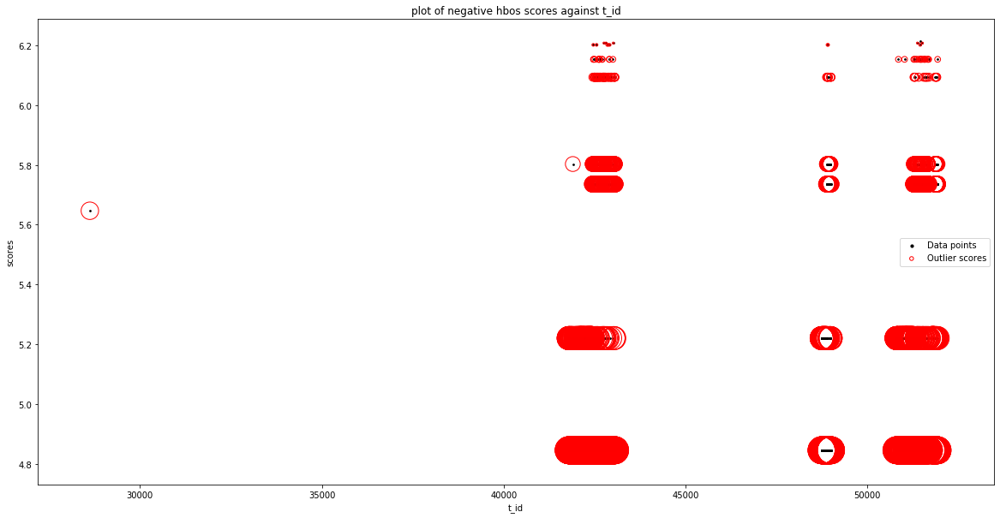

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_pkts_per_sec', 'a_id'], dtype='object')
Number of Inliers :  2315
Number of Outliers :  196
Outlier index: 0
Outlier score: 5.644765961443179
Outlier index: 653
Outlier score: 4.793476065941129
Outlier index: 663
Outlier score: 4.901634070285292
Outlier index: 667
Outlier score: 4.8531952286278415
Outlier index: 674
Outlier score: 4.8531952286278415
Outlier index: 687
Outlier score: 4.793476065941129
Outlier index: 689
Outlier score: 4.793476065941129
Outlier index: 694
Outlier score: 4.7934

Silhouetter Score: 0.382
davies bouldin Score: 1.110
calinski_harabasz Score: 519.877


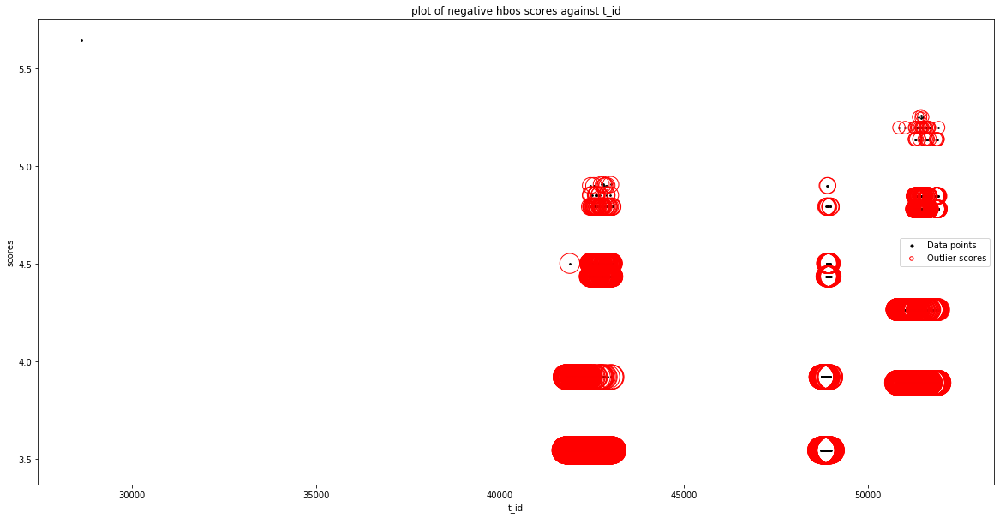

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'service_physical_ip']
input parameters are being us

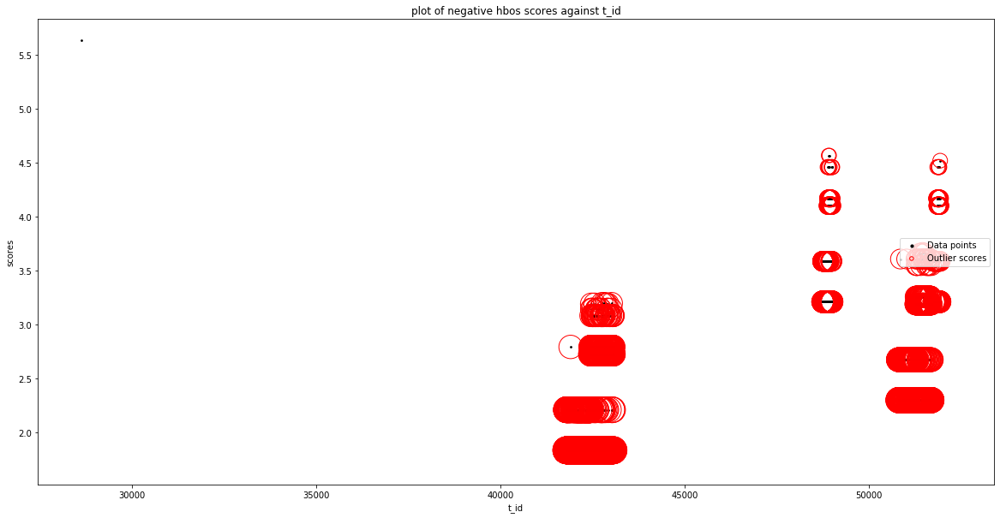

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_pkts_per_sec', 'log_start_time']
input parameters are being used inst

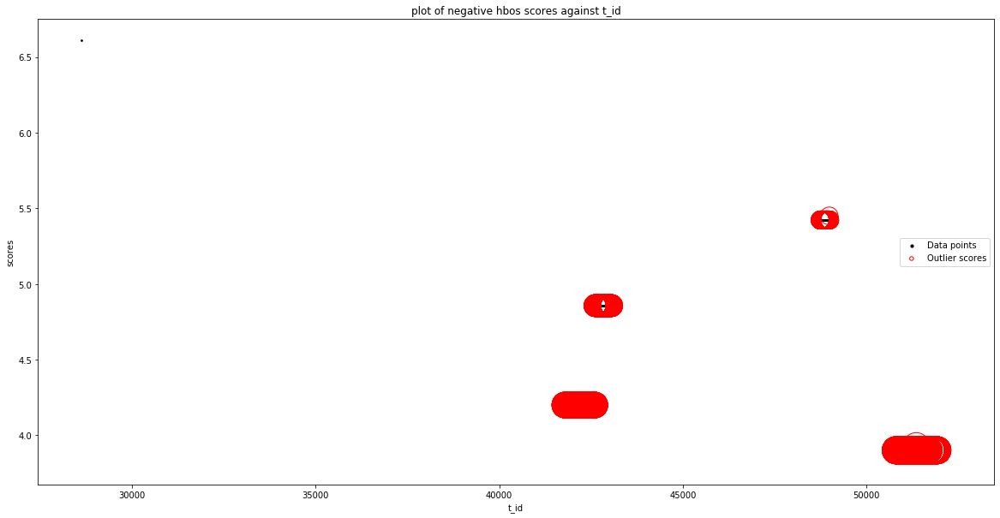

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_mean', 'src_port'], dtype='object')
Number of Inliers :  2366
Number of Outliers :  145
Outlier index: 0
Outlier score: 6.595250077883902
Outlier index: 1468
Outlier score: 4.819920149005327
Outlier index: 2358
Outlier score: 4.955886863659789
Outlier index: 2359
Outlier score: 4.955886863659789
Outlier index: 2360
Outlier score: 4.955886863659789
Outlier index: 2361
Outlier score: 4.955886863659789
Outlier index: 2362
Outlier score: 4.955886863659789
Outlier index: 2363
Outlier score: 4.955886863659789
Outlier index: 2364
Outlier score: 4.955886863659789
Outlier index: 2365
Outlier score: 4.955886863659789
Outlier index: 2366
Outlier score: 4.955886863659789
Outlier index: 2367
O

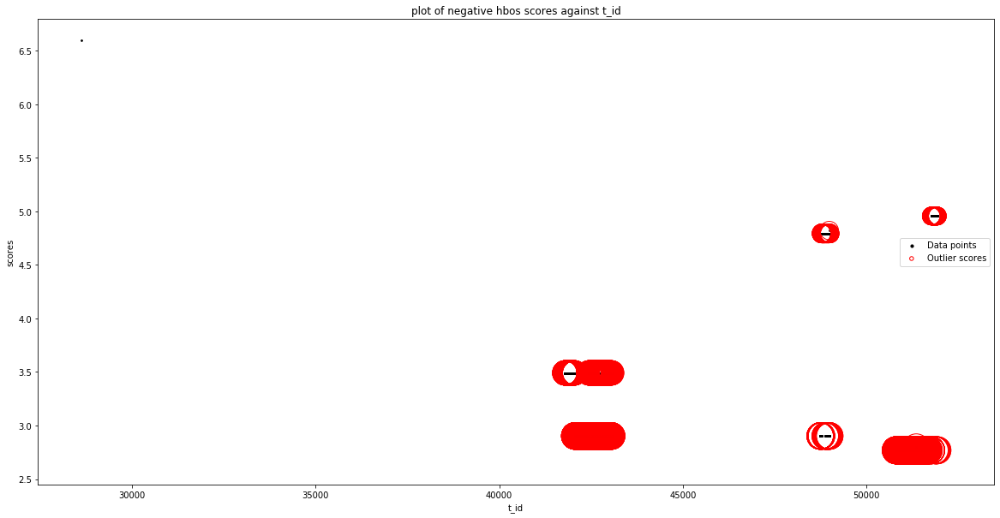

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_mean', 'flow_duration'], dtype='object')
Number of Inliers :  2507
Number of Outliers :  4
Outlier index: 0
Outlier score: 6.616899916

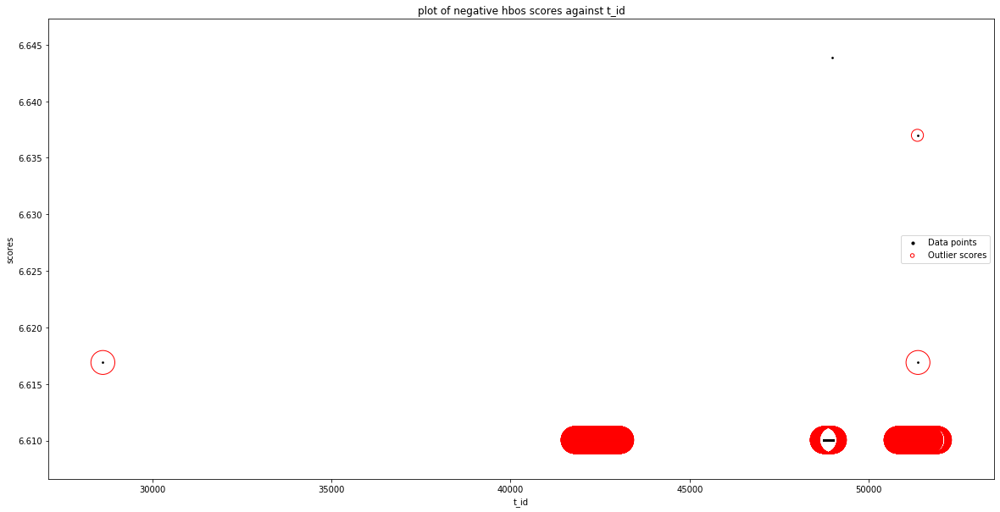

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_mean', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2467
Number of Outliers :  44
Outlier index: 0
Outlier score: 6.616704471843233
Outlier index: 113
Outlier score: 6.615912004236598
Outlier index: 311
Outlier score: 6.611166318192332
Outlier index: 703
Outlier score: 6.611166318192332
Outlier index: 721
Outlier score: 6.611166318192332
Outlier index: 763
Outlier score: 6.616110080332634
Outlier index: 775
Outlier score: 6.616308183627437
Outlier index: 788

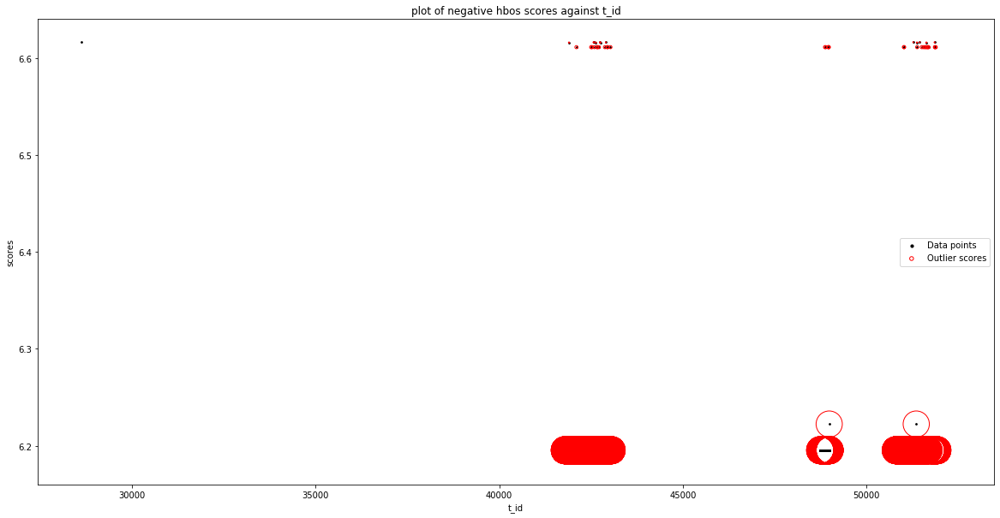

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_mean', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
Outlier index: 0
Outlier score: 6.385690449725887
Outlier index: 1
Outlier score: 6.385690449725887
Outlier index: 63
Outlier score: 6.42906314537177
Outlier index: 113
Outlier score: 6.385690449725887
Outlier index: 115
Outlier score: 6.385690449725887
Outlier index: 174
Outlier score: 6.592041065268794
Outlier index: 193
Outlier score: 6.42906314537177
Outlier index: 311
Outlier score: 6.385690449725887
Outlier index: 426
Outlier score: 6.56760065921818
Outlier index: 498
Outlier score: 6.385690449725887
Outlier index: 553
Outlier score: 6.42906314537177
Outli

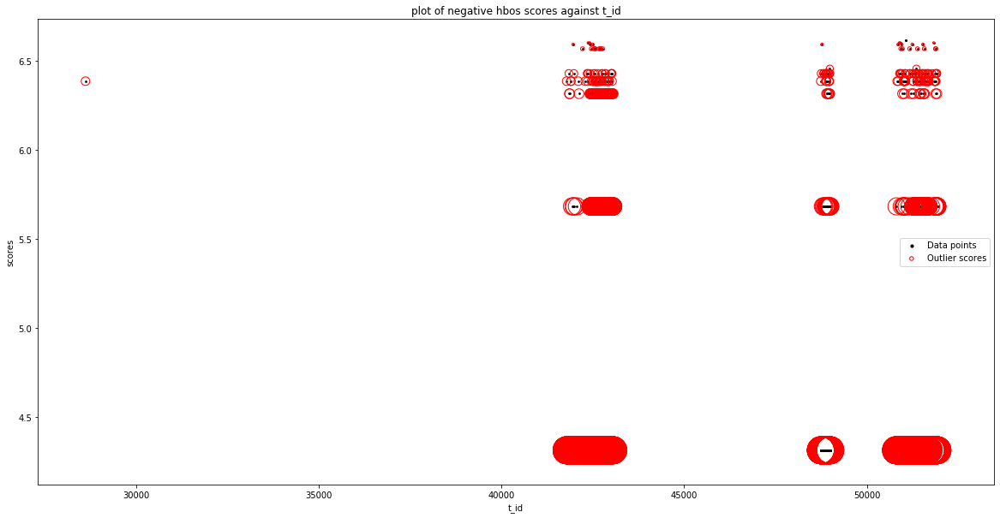

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_mean', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2355
Number of Outliers :  156
Outlier index: 0
Outlier score: 6.506008845565365
Outlier index: 113
Outlier score: 6.607056296023659
Outlier index: 115
Outlier score: 6.506008845565365
Outlier index: 174
Outlier score: 6.506008845565365
Outlier index: 193
Outlier score: 6.506008845565365
Outlier index: 311
Outlier score: 6.598902020219848
Outlier index: 498
Outlier score: 6.565148612523959
Outlier index: 564
Outlier score: 6.565148612523959
Outlier index: 574
Outlier score: 6.598902020219848
Outlier index: 616
Outlier score: 6.506008845565365
Outlier index: 625
Outlier score: 6.506008845565365
Ou

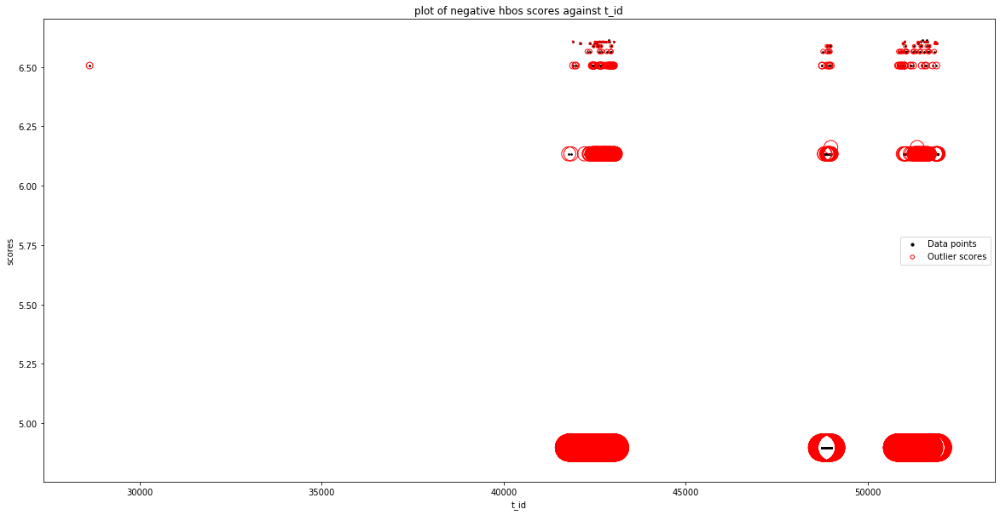

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'bwd_packet_length_std']
input paramete

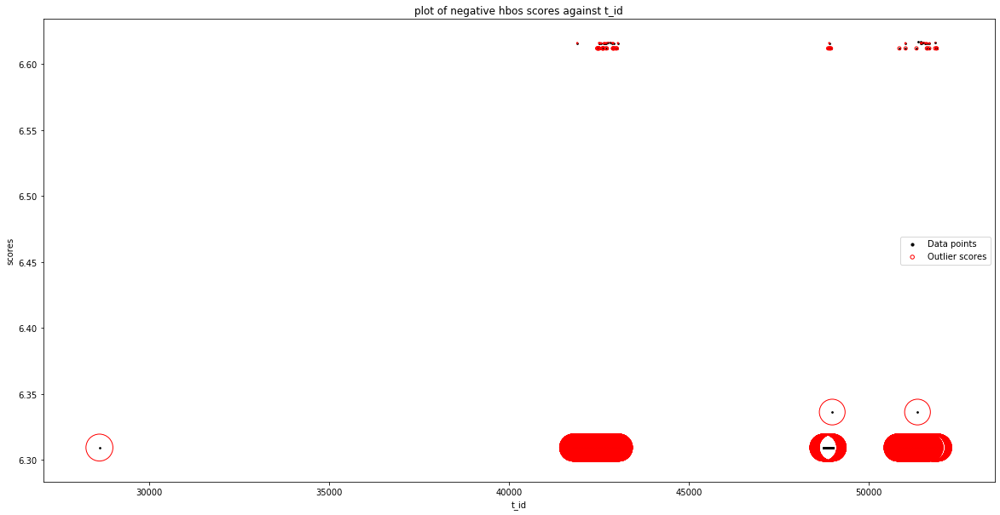

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_mean', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2399
Number of Outliers :  112
Outlier index: 653
Outlier score: 6.492894318101611
Outlier index: 663
Outlier score: 6.601052322445774
Outlier index: 667
Outlier score: 6.552613480788324
Outlier index: 674
Outlier score: 6.552613480788324
Outlier index: 687
Outlier score: 6.492894318101611
Outlier index: 689
Outlier score: 6.492894318101611
Outlier index: 694
Outlier score: 6.492894318101611
Outlier index: 701
Outlier score: 6.492894318101611
Outlier index: 707
Outlier score: 6.552613480788324
Outlier index: 709
Outlier score: 6.492894318101611
Outlier index: 713
Outlier score: 6.492894318101611
Outlier index: 732
Outlier score: 6.492894318101611
Outlier index: 747
Outlier score: 6.492894318101611
Outlier index: 749
Outlier score: 6.601052322445774
Outlier index: 762
Outlier score: 6.4928943181

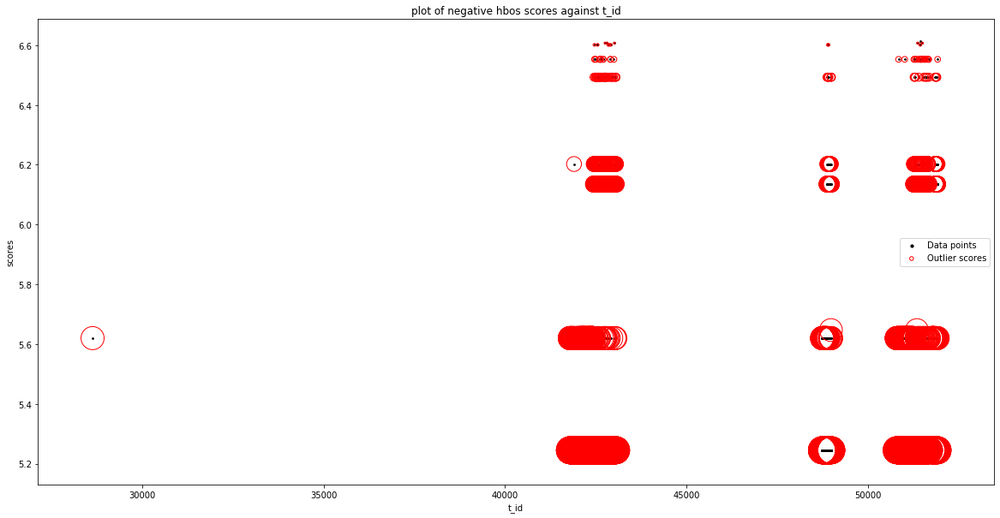

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_mean', 'flow_iat_min'], dtype='object')
Number of Inliers :  2506
Number of Outliers :  5
Outlier index: 199
Outlier score: 6.6162298990048685
Outlier index: 631
Outlier score: 6.6162298990048685
Outlier index: 1359
Outlier score: 6.6162298990048685
Outlier index: 1468
Outlier score: 6.1688283863774185
Outlier index: 2030
Outlier score: 6.1688283863774185
Total number of outliers found: 5
Silhouetter Score: 0.991
davies bouldin Score: 1.248
calinski_harabasz Score: 980.487


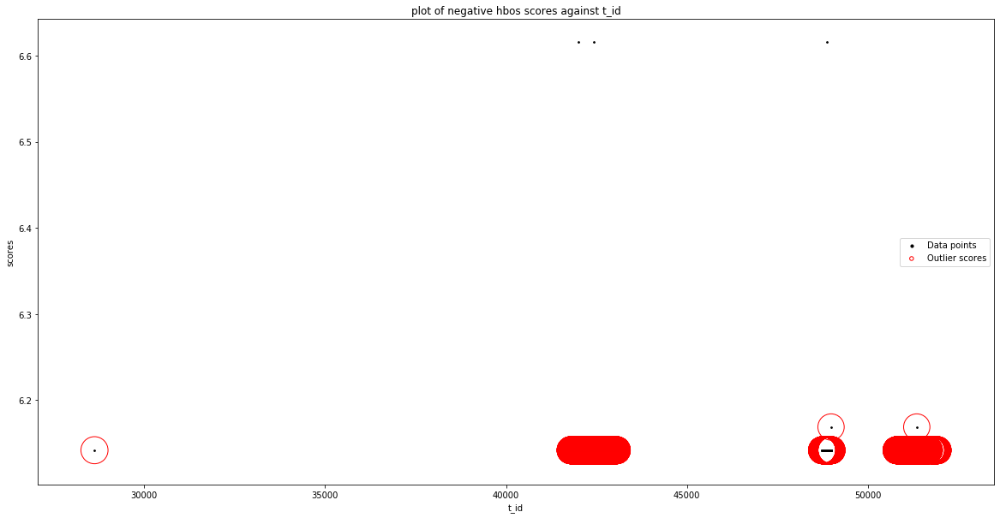

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_mean', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2457
Number of Outliers :  54
Outlier index: 96
Outlier sco

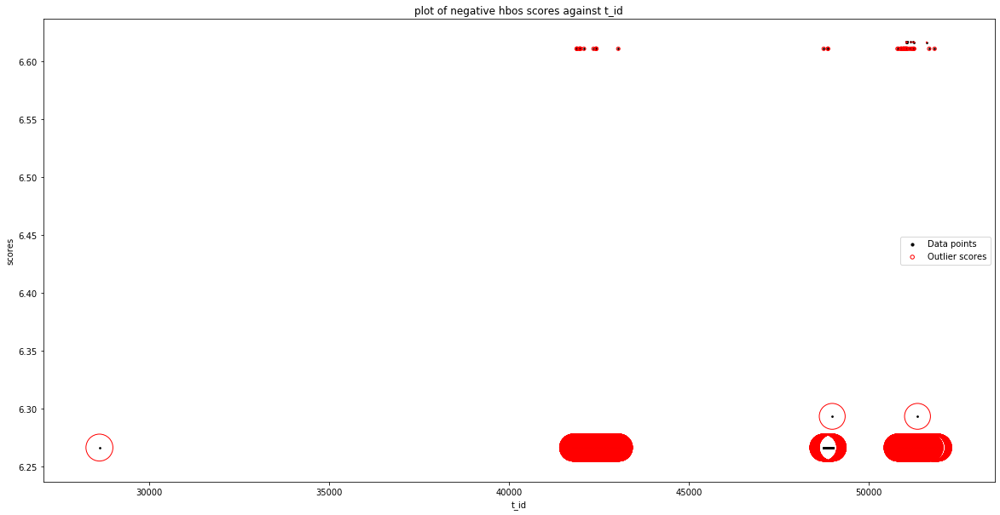

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_mean', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2443
Number of Outliers :  68
Outlier index: 67
Outlier scor

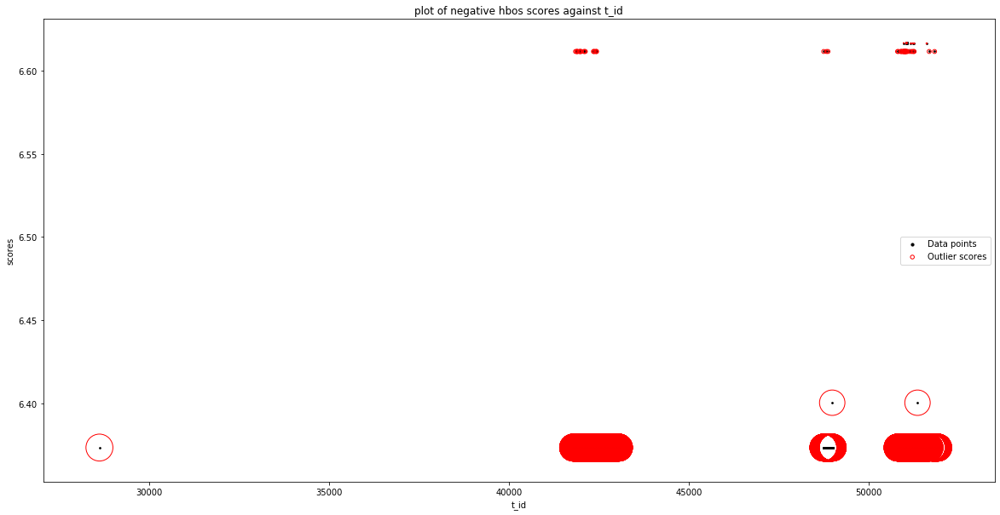

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'fwd_header_length']
input parameters are being used instead of default 

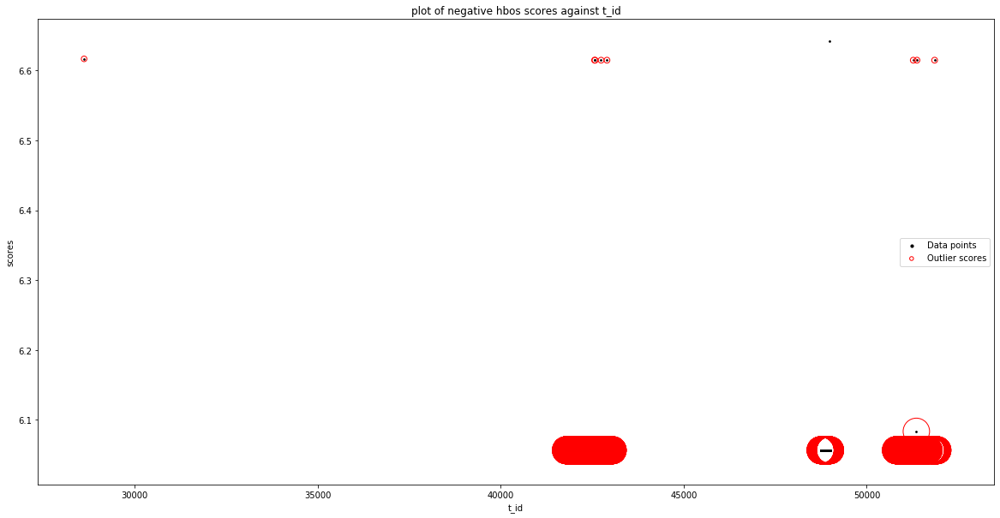

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'packet_length_mean']
input parameters are being use

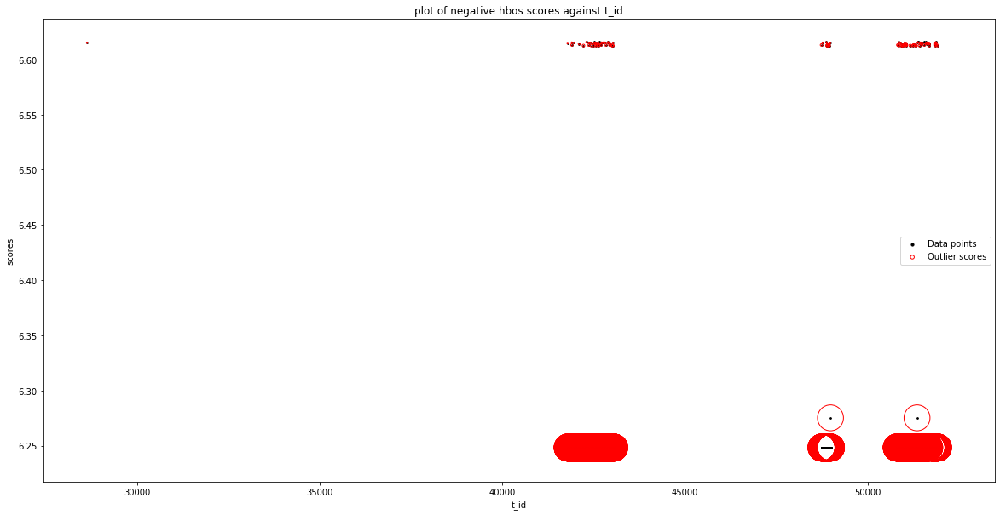

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_mean', 'psh_flag_count'], dtype='object')
Number of Inliers :  2505
Number of Outliers :  6
Outlier index: 0
Outlier score: 6.615535328751197
Outlier index: 763
Outlier score: 6.611441102904161
Outlier index: 937
Outlier score: 6.611441102904161
Outlier index: 1090
Outlier score: 6.611441102904161
Ou

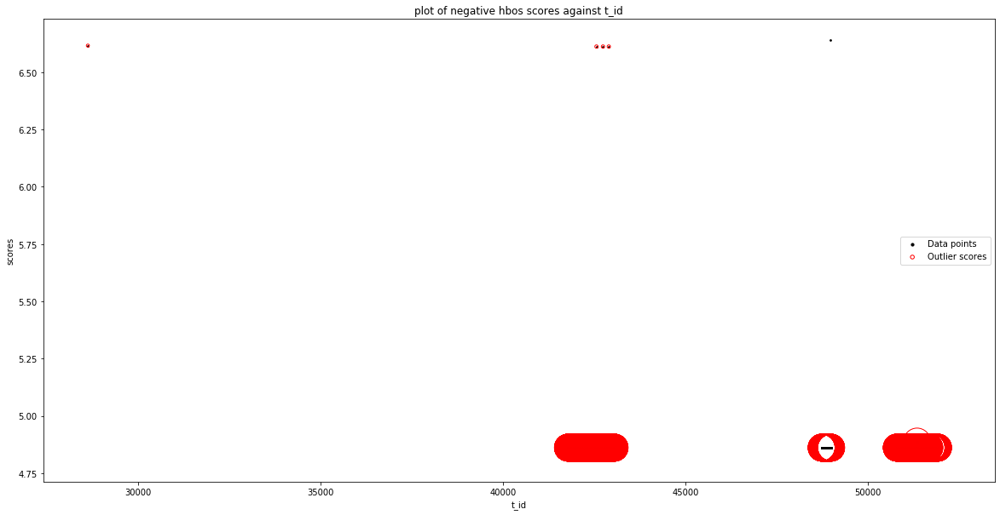

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'down_up_ratio']
input parameters are being used instead of default 

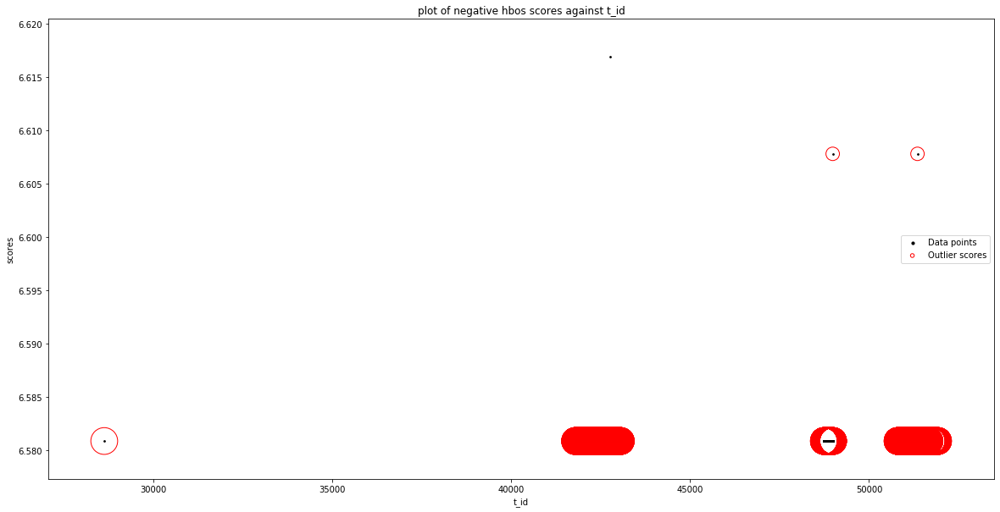

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'active_max']
input parameters are being used instead of default va

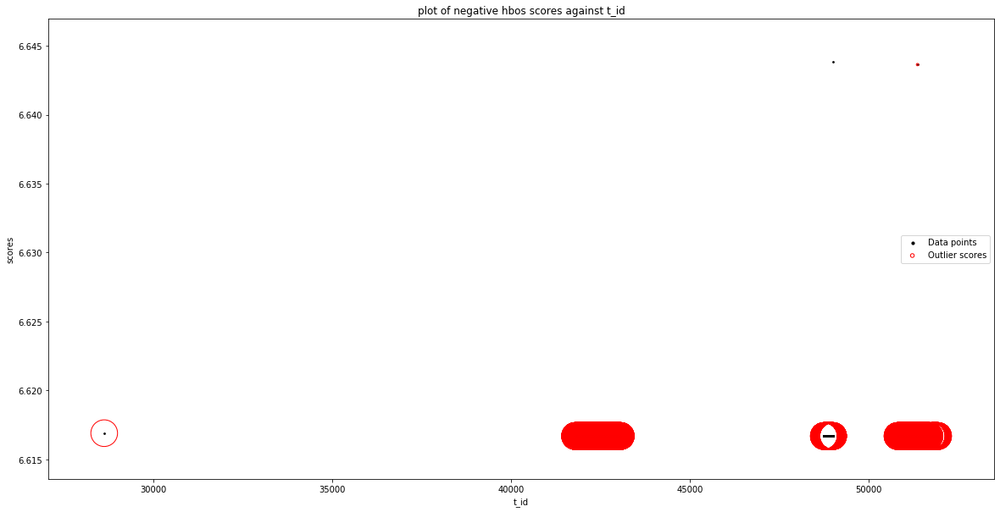

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_mean', 'idle_max'], dtype='object')
Number of Inliers :  2508
Number of Outliers :  3
Outlier index: 0
Outlier score: 6.616705077477107
Outlier index: 1468
Outlier score: 6.217557084075537
Outlier index: 2030
Outlier score: 6.217557084075537
Total number of outliers found: 3
Silhouetter Score: 0.990
davies bouldin Score: 1.023
calinski_harabasz Score: 1977.044


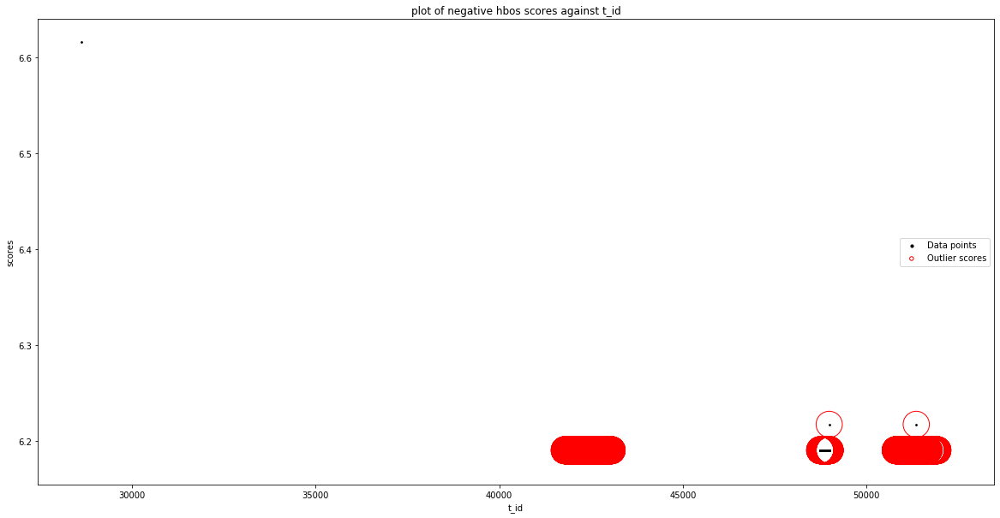

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_mean', 'a_id'], dtype='object')
Number of Inliers :  2509
Number of Outliers :  2
Outlier index: 0
Outlier score: 6.614655181363277
Outlier index: 2030
Outlier score: 5.26297318035203
Total number of outliers found: 2
Silhouetter Score: 0.973
davies bouldin Score: 0.552
calinski_harabasz Score: 42.831


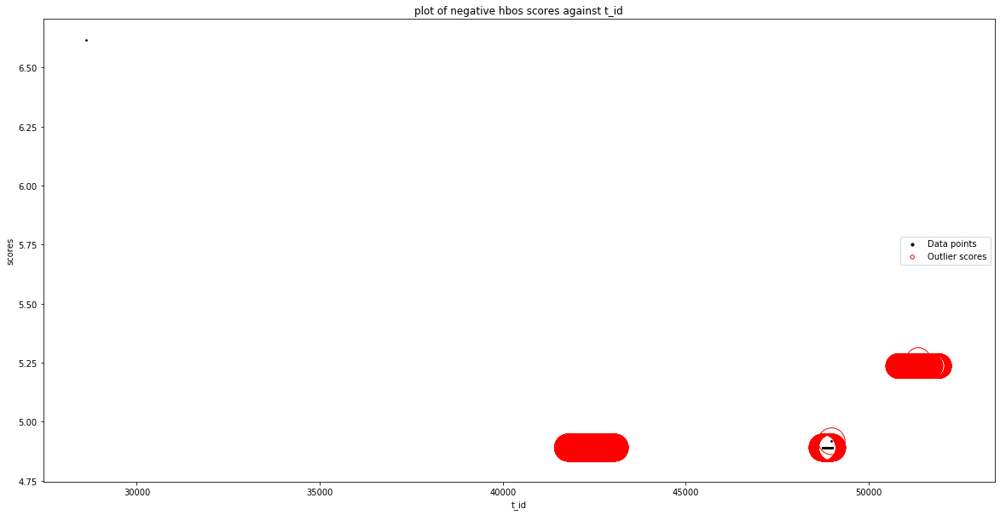

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'service_physical_ip']
input parameters are being used instead of defaul

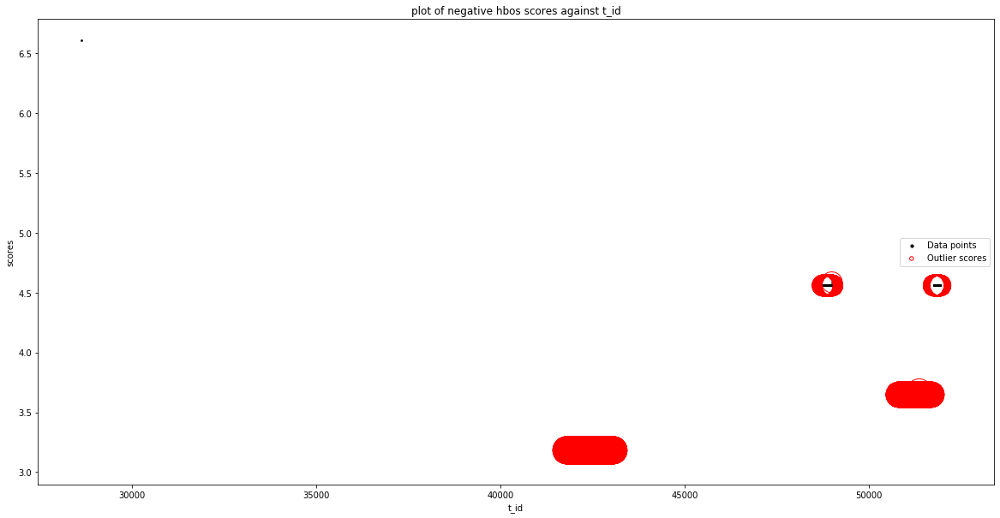

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_mean', 'log_start_time']
input parameters are being used instead of default value

No valid feature
No Valid columns found for combination of  ['flow_iat_std', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_std', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_std', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_std', 'bwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_std', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for co

No valid feature
No Valid columns found for combination of  ['flow_iat_std', 'idle_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_std', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_std', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_std', 'a_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_std', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_std', 'client_p

No valid feature
No Valid columns found for combination of  ['flow_iat_max', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_max', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_max', 'fwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_max', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_max', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_

No valid feature
No Valid columns found for combination of  ['flow_iat_max', 'bwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_max', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_max', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_max', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_max', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combin

Outlier score: 4.974831773824439
Outlier index: 1335
Outlier score: 4.974831773824439
Outlier index: 1336
Outlier score: 4.974831773824439
Outlier index: 1337
Outlier score: 4.974831773824439
Outlier index: 1338
Outlier score: 4.974831773824439
Outlier index: 1339
Outlier score: 4.974831773824439
Outlier index: 1340
Outlier score: 4.974831773824439
Outlier index: 1341
Outlier score: 4.974831773824439
Outlier index: 1342
Outlier score: 4.974831773824439
Outlier index: 1343
Outlier score: 4.974831773824439
Outlier index: 1344
Outlier score: 4.974831773824439
Outlier index: 1345
Outlier score: 4.974831773824439
Outlier index: 1346
Outlier score: 4.974831773824439
Outlier index: 1347
Outlier score: 4.974831773824439
Outlier index: 1348
Outlier score: 4.974831773824439
Outlier index: 1349
Outlier score: 4.974831773824439
Outlier index: 1350
Outlier score: 4.974831773824439
Outlier index: 1351
Outlier score: 4.974831773824439
Outlier index: 1352
Outlier score: 4.974831773824439
Outlier index

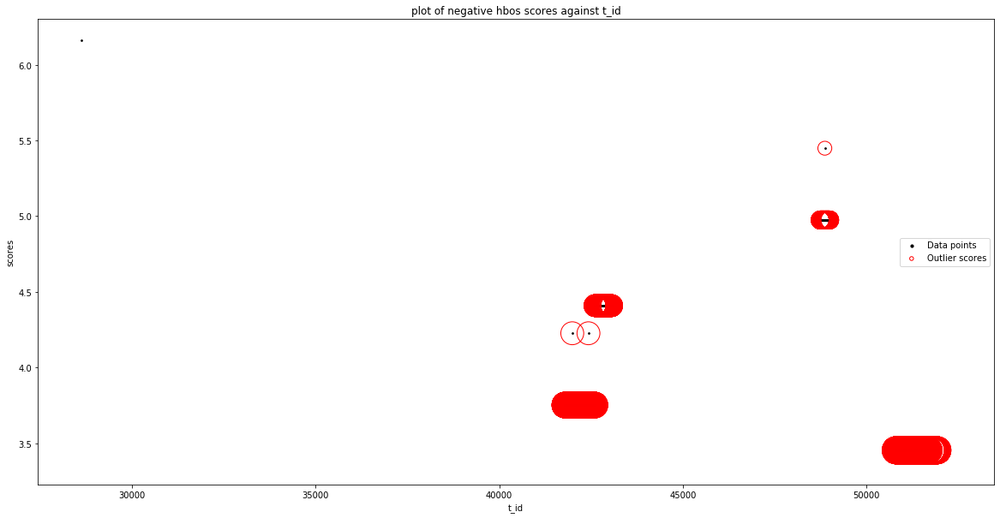

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_min', 'src_port'], dtype='object')
Number of Inliers :  2366
Number of Outliers :  145
Outlier index: 0
Outlier score: 6.14718665116065
Outlier index: 1359
Outlier score: 4.819258234909525
Outlier index: 2358
Outlier score: 4.507823436936537
Outlier index: 2359
Outlier score: 4.507823436936537
Outlier index: 2360
Outlier score: 4.507823436936537
Outlier index: 2361
Outlier score: 4.507823436936537
Outlier index: 2362
Outlier score: 4.507823436936537
Outlier index: 2363
Outlier score: 4.507823436936537
Outlier index: 2364
Outlier score: 4.507823436936537
Outlier index: 2365
Outlier score: 4.507823436936537
Outlier index: 2366
Outlier score: 4.507823436936537
Outlier index: 2367
Outl

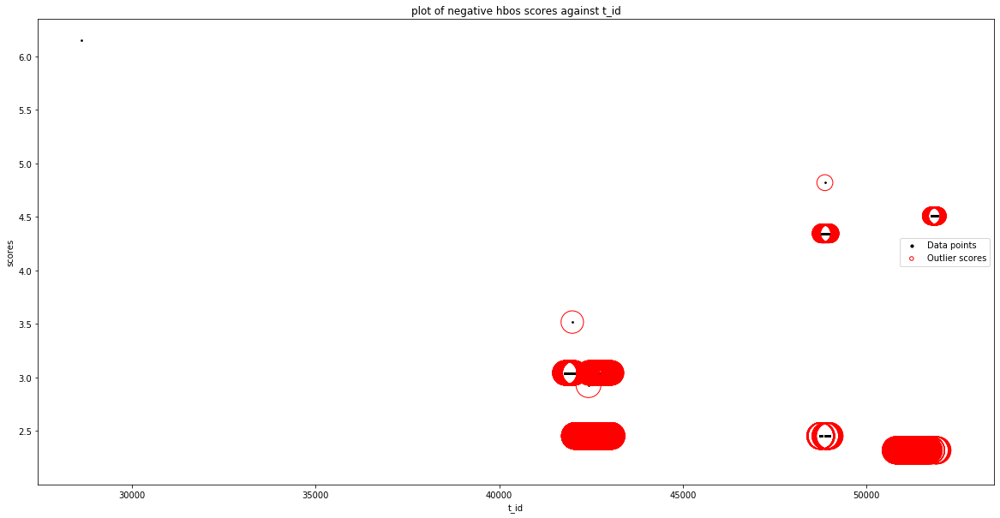

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_min', 'flow_duration'], dtype='object')
Number of Inliers :  2505
Number of Outliers :  6
Outlier index: 0
Outlier score: 6.16883648941877

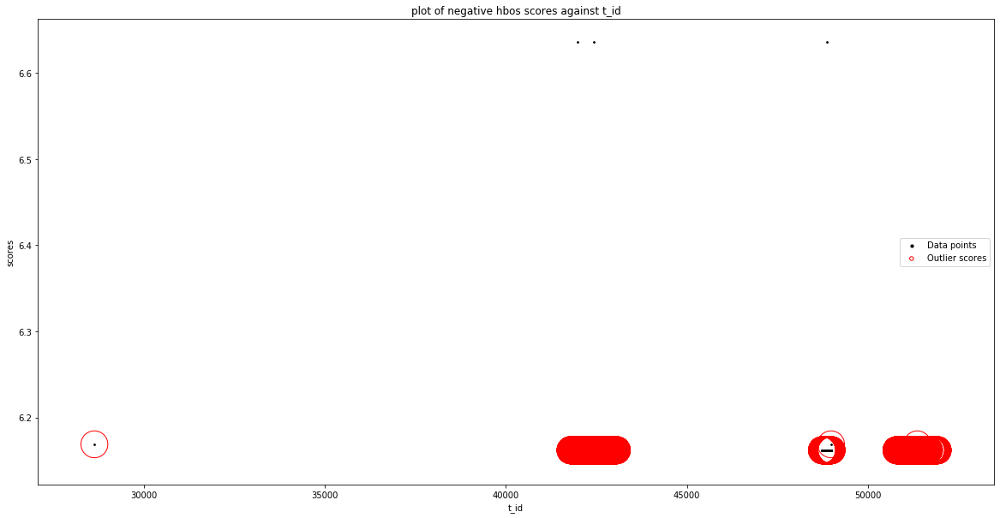

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_min', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2466
Number of Outliers :  45
Outlier index: 0
Outlier score: 6.168641045119982
Outlier index: 113
Outlier score: 6.167848577513347
Outlier index: 199
Outlier score: 6.221819421595193
Outlier index: 311
Outlier score: 6.16310289146908
Outlier index: 631
Outlier score: 6.221819421595193
Outlier index: 703
Outlier score: 6.16310289146908
Outlier index: 721
Outlier score: 6.16310289146908
Outlier index: 763
Outli

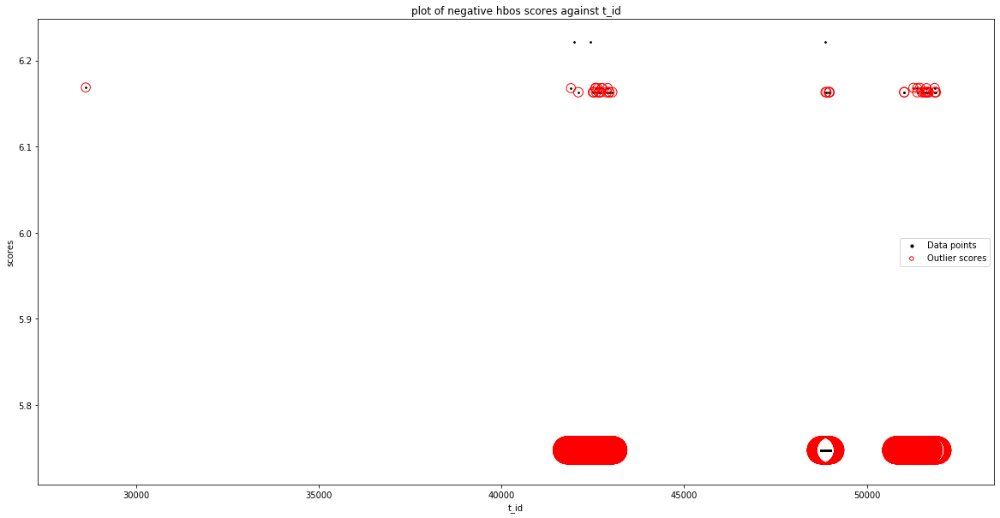

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_min', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
Outlier index: 0
Outlier score: 5.937627023002635
Outlier index: 1
Outlier score: 5.937627023002635
Outlier index: 63
Outlier score: 5.980999718648518
Outlier index: 113
Outlier score: 5.937627023002635
Outlier index: 115
Outlier score: 5.937627023002635
Outlier index: 174
Outlier score: 6.143977638545542
Outlier index: 193
Outlier score: 5.980999718648518
Outlier index: 311
Outlier score: 5.937627023002635
Outlier index: 426
Outlier score: 6.119537232494928
Outlier index: 498
Outlier score: 5.937627023002635
Outlier index: 553
Outlier score: 5.980999718648518
Out

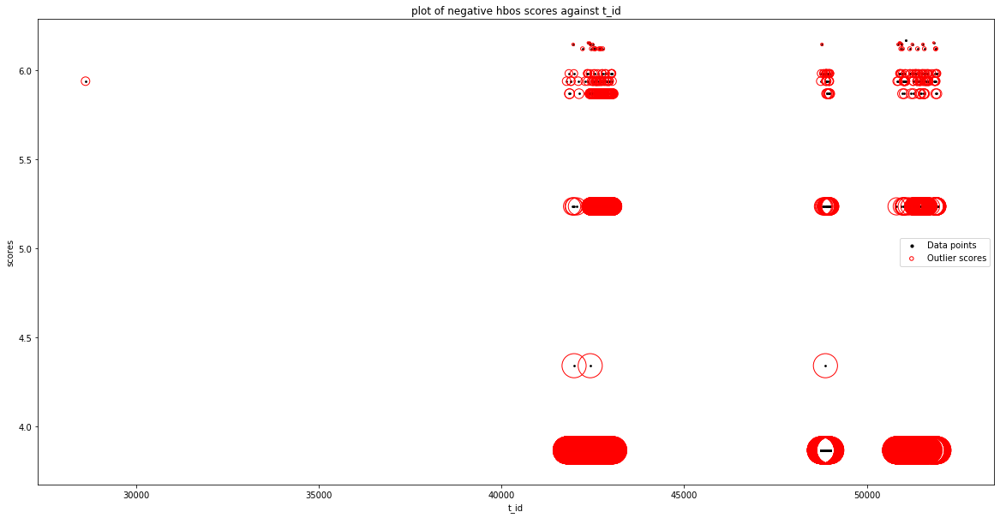

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_min', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2357
Number of Outliers :  154
Outlier index: 0
Outlier score: 6.057945418842113
Outlier index: 113
Outlier score: 6.158992869300407
Outlier index: 115
Outlier score: 6.057945418842113
Outlier index: 174
Outlier score: 6.057945418842113
Outlier index: 193
Outlier score: 6.057945418842113
Outlier index: 311
Outlier score: 6.150838593496596
Outlier index: 498
Outlier score: 6.117085185800708
Outlier index: 564
Outlier score: 6.117085185800708
Outlier index: 574
Outlier score: 6.150838593496596
Outlier index: 616
Outlier score: 6.057945418842113
Outlier index: 625
Outlier score: 6.057945418842113
Outl

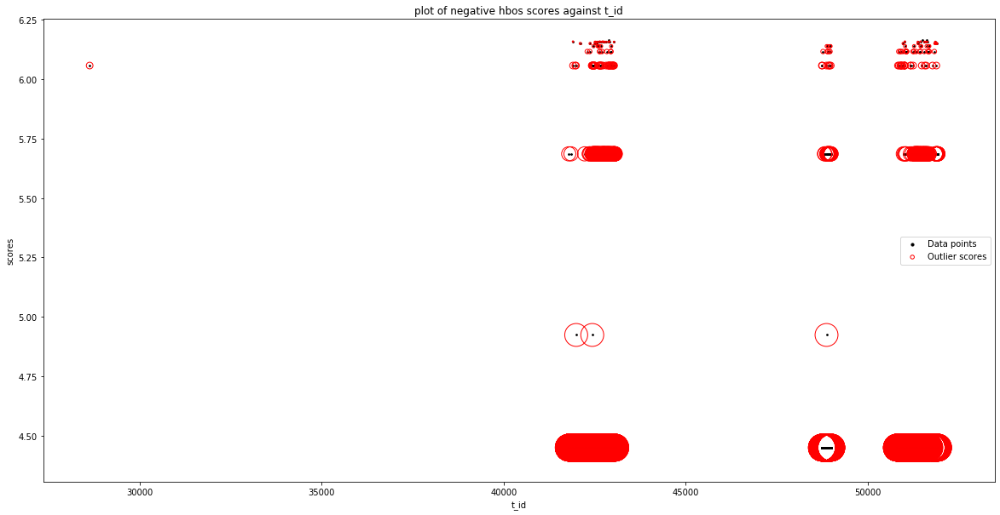

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'bwd_packet_length_std']
input parameters ar

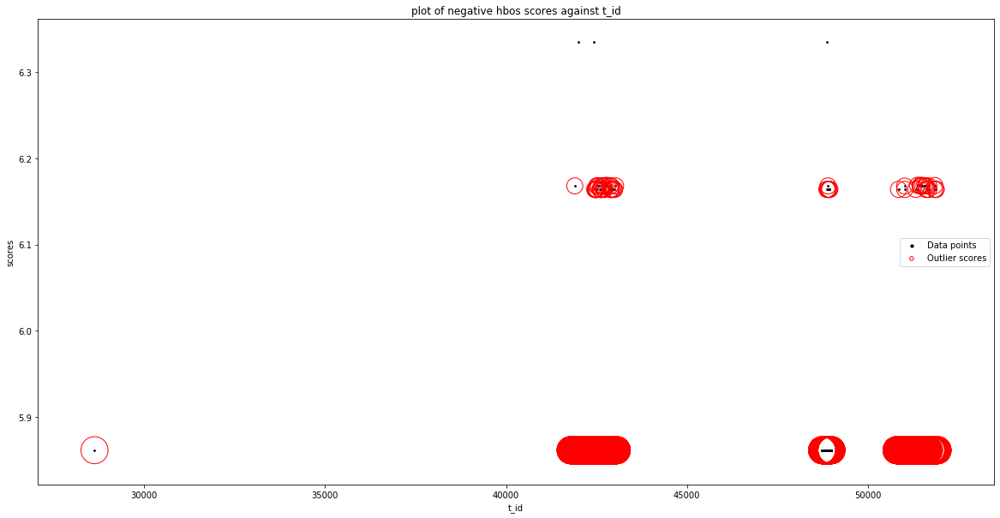

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_min', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2399
Number of Outliers :  112
Outlier index: 653
Outlier score: 6.04483089137836
Outlier index: 663
Outlier score: 6.1529888957225225
Outlier index: 667
Outlier score: 6.104550054065072
Outlier index: 674
Outlier score: 6.104550054065072
Outlier index: 687
Outlier score: 6.04483089137836
Outlier index: 689
Outlier score: 6.04483089137836
Outlier index: 694
Outlier score: 6.04483089137836
Outlier index: 701
Outlier score: 6.04483089137836
Outlier index: 707
Outlier score: 6.104550054065072
Outlier index: 709
Outlier score: 6.04483089137836
Outlier index: 713
Outlier score: 6.04483089137836
Outlier index: 732
Outlier score: 6.04483089137836
Outlier index: 747
Outlier score: 6.04483089137836
Outlier index: 749
Outlier score: 6.1529888957225225
Outlier index: 762
Outlier score: 6.04483089137836
Out

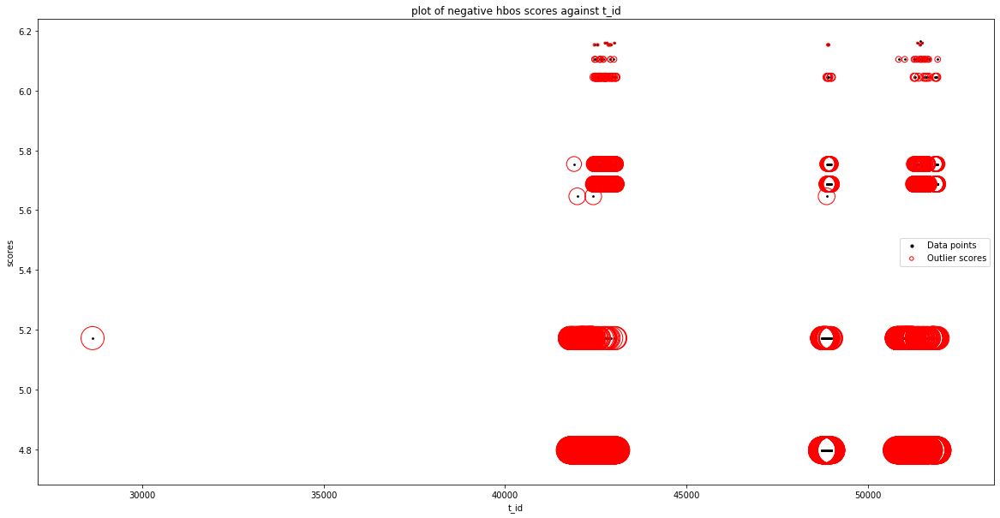

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_min', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2506
Number of Outliers :  5
Outlier index: 199
Outlier score: 6.6162298990048685
Outlier index: 631
Outlier score: 6.6162298990048685
Outlier index: 1359
Outlier score: 6.6162298990048685
Outlier index: 1468
Outlier score: 6.1688283863774185
Outlier index: 2030
Outlier score: 6.1688283863774185
Total number of outliers found: 5
Silhouetter Score: 0.991
davies bouldin Score: 1.248
calinski_harabasz Score: 980.487


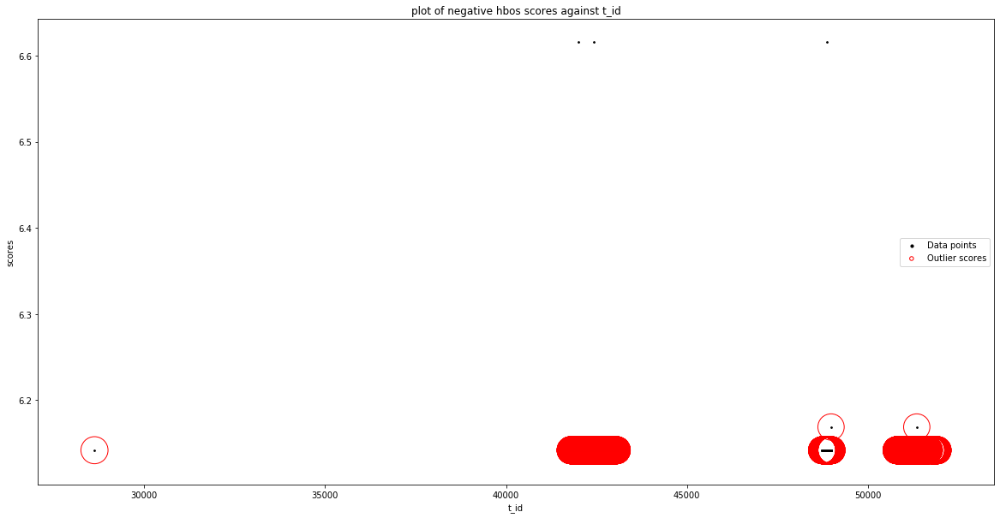

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'fwd_iat_std']
input parameters are being used instead of default values
contam

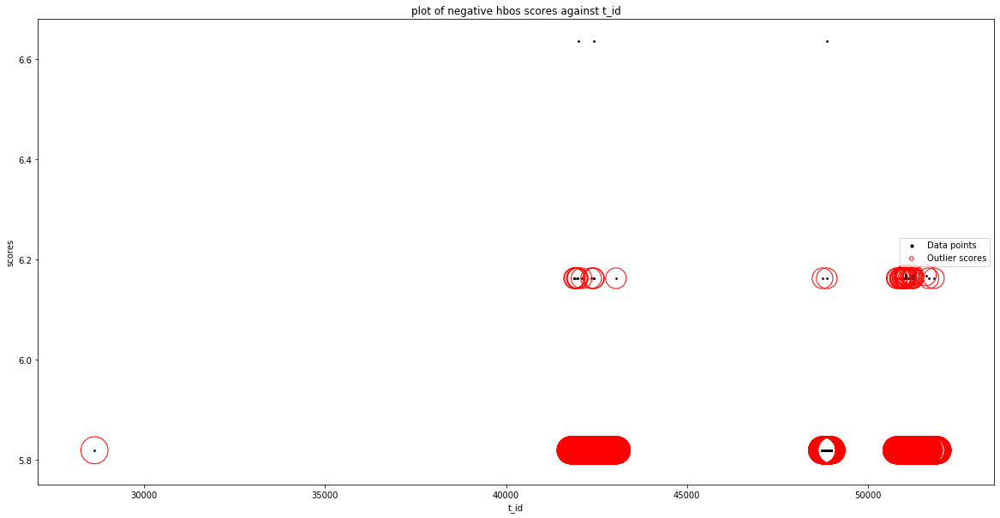

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_min', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2442
Number of Outliers :  69
Outlier index: 67
Outlier score: 6.

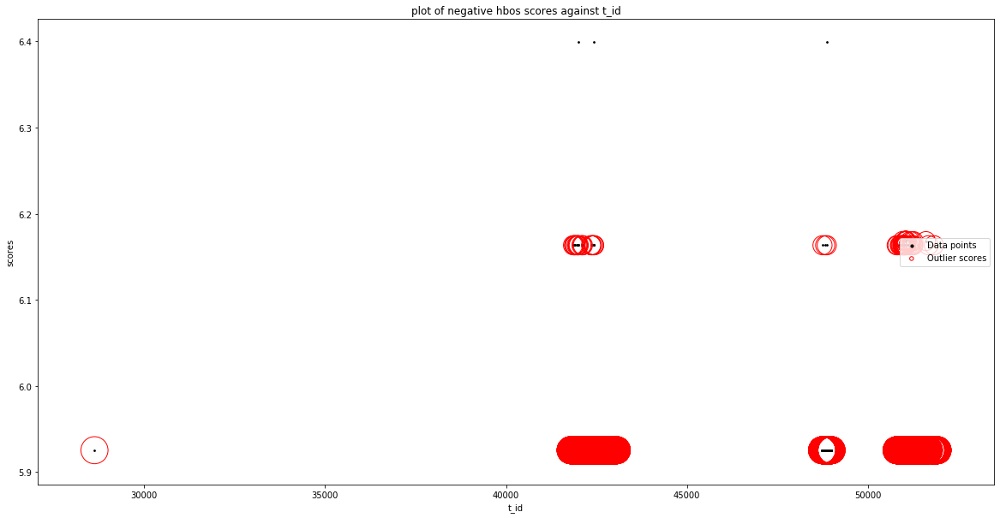

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'fwd_header_length']
input parameters are being used instead of default value

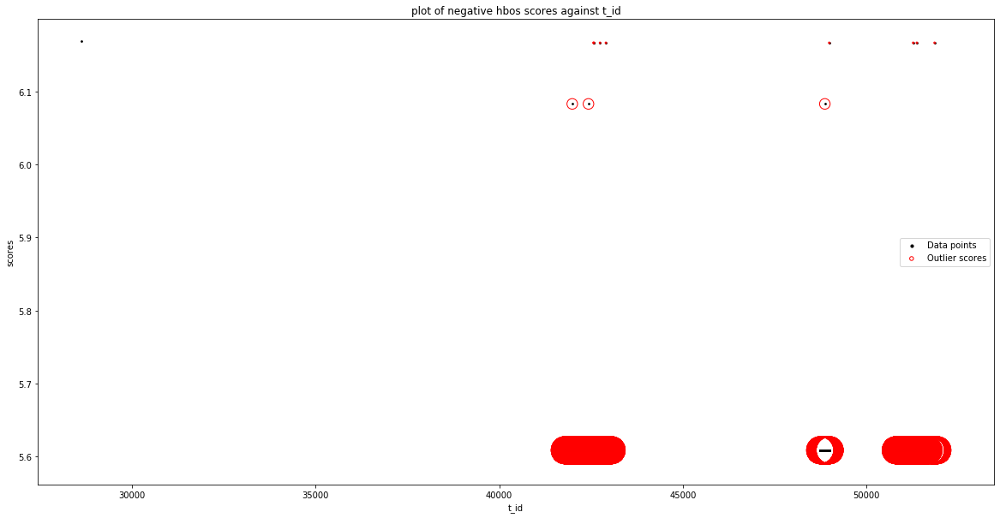

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'packet_length_mean']
input parameters are being used ins

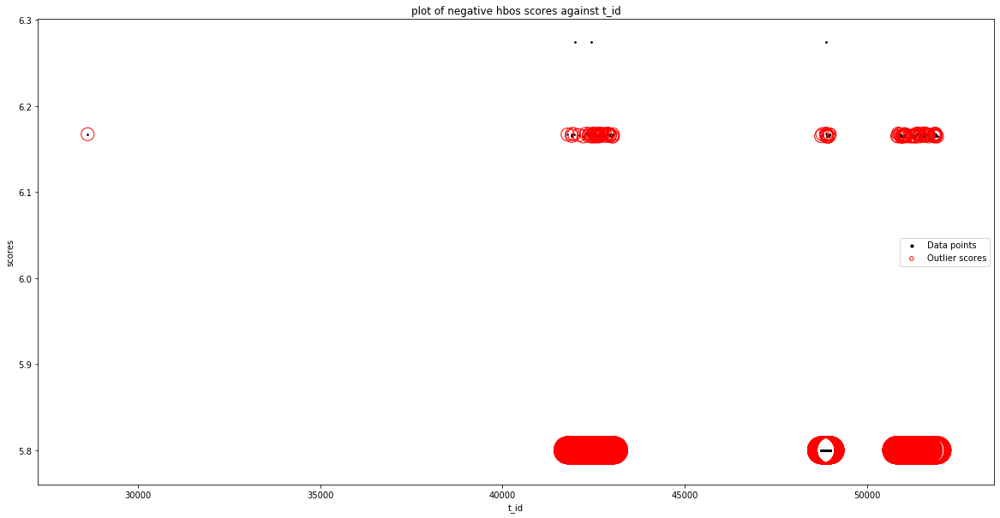

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_min', 'psh_flag_count'], dtype='object')
Number of Inliers :  2503
Number of Outliers :  8
Outlier index: 0
Outlier score: 6.167471902027946
Outlier index: 199
Outlier score: 4.8877782184207685
Outlier index: 631
Outlier score: 4.8877782184207685
Outlier index: 763
Outlier score: 6.163377676180909
Outli

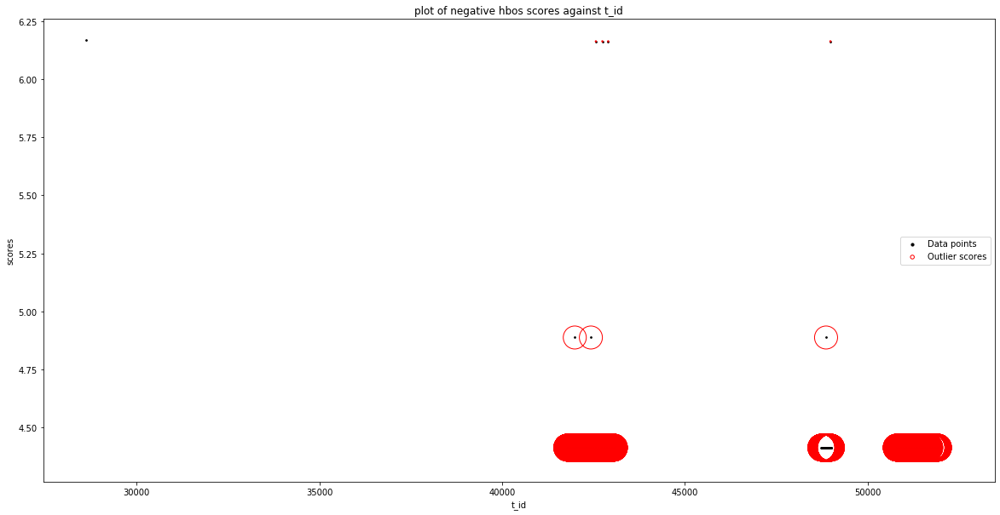

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'down_up_ratio']
input parameters are being used instead of default value

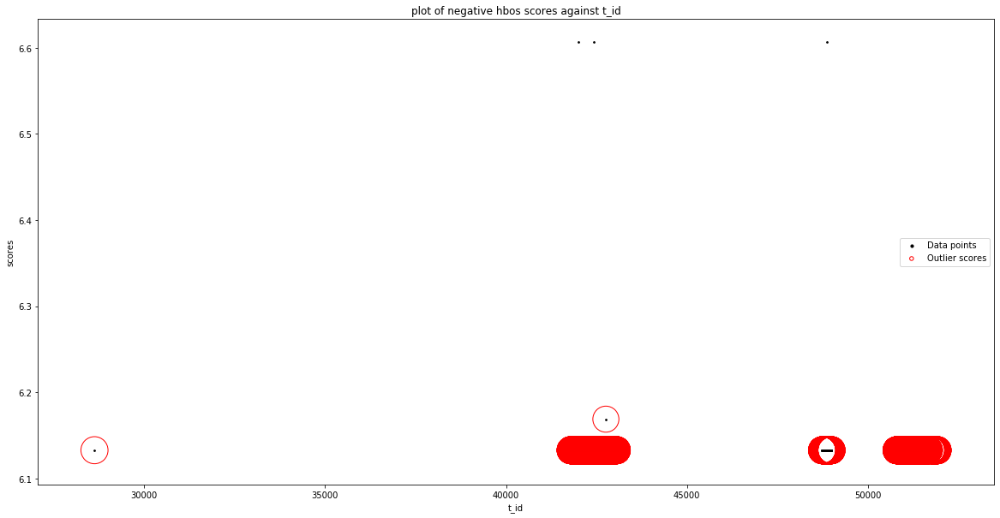

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'active_max']
input parameters are being used instead of default values


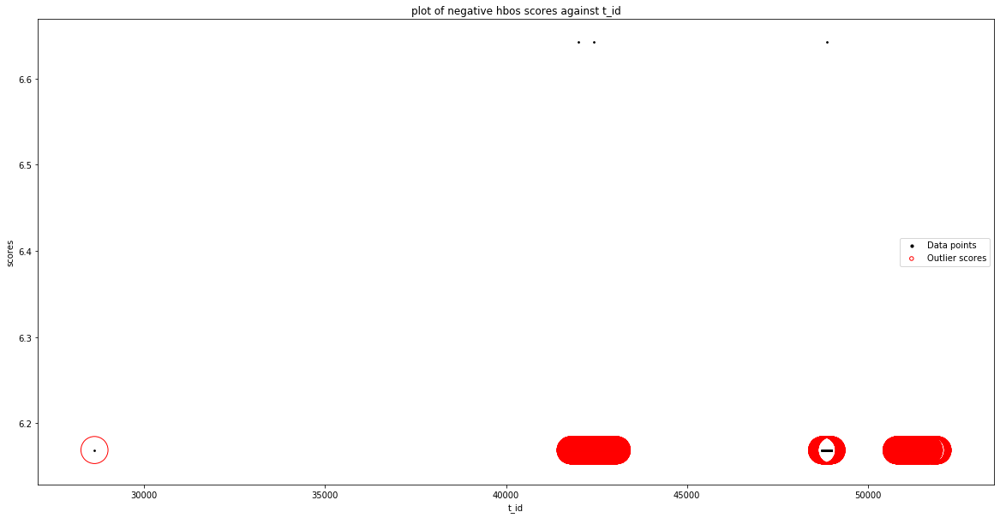

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_min', 'idle_max'], dtype='object')
Number of Inliers :  2507
Number of Outliers :  4
Outlier index: 0
Outlier score: 6.168641650753855
Outlier index: 199
Outlier score: 6.216895169979734
Outlier index: 631
Outlier score: 6.216895169979734
Outlier index: 1359
Outlier score: 6.216895169979734
Total number of outliers found: 4
Silhouetter Score: 0.950
davies bouldin Score: 0.805
calinski_harabasz Score: 830.268


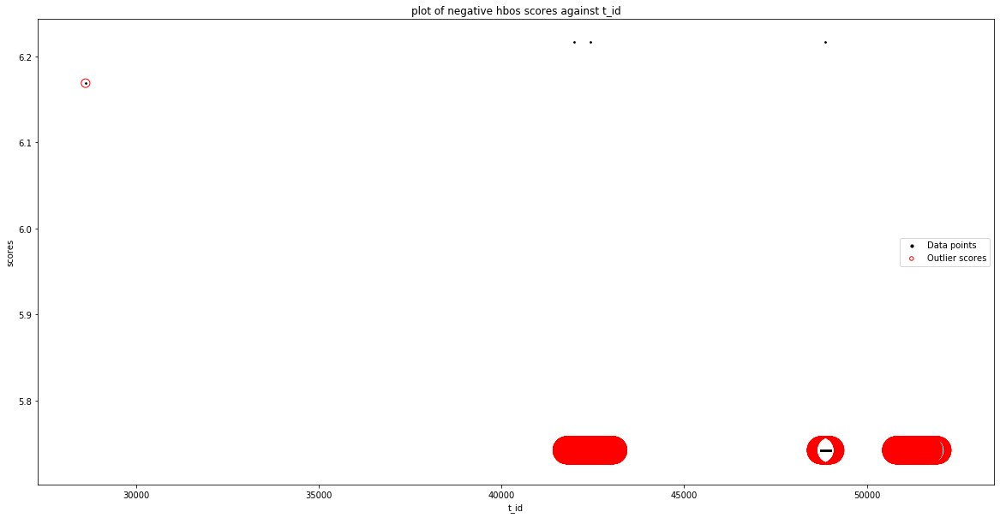

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['flow_iat_min', 'a_id'], dtype='object')
Number of Inliers :  2507
Number of Outliers :  4
Outlier index: 0
Outlier score: 6.1665917546400255
Outlier index: 199
Outlier score: 4.916811646844386
Outlier index: 631
Outlier score: 4.916811646844386
Outlier index: 1359
Outlier score: 4.916811646844386
Total number of outliers found: 4
Silhouetter Score: 0.973
davies bouldin Score: 0.534
calinski_harabasz Score: 3691.881


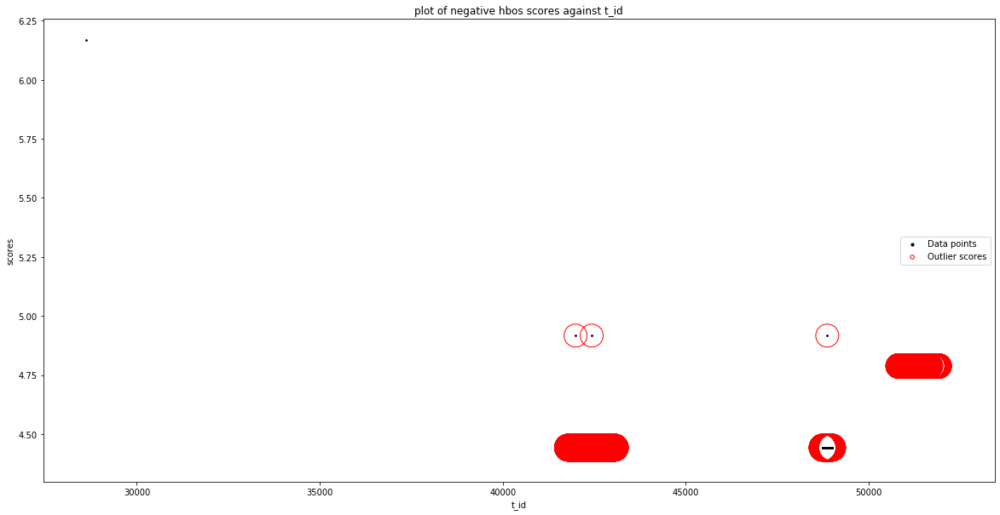

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'service_physical_ip']
input parameters are being used instead of default val

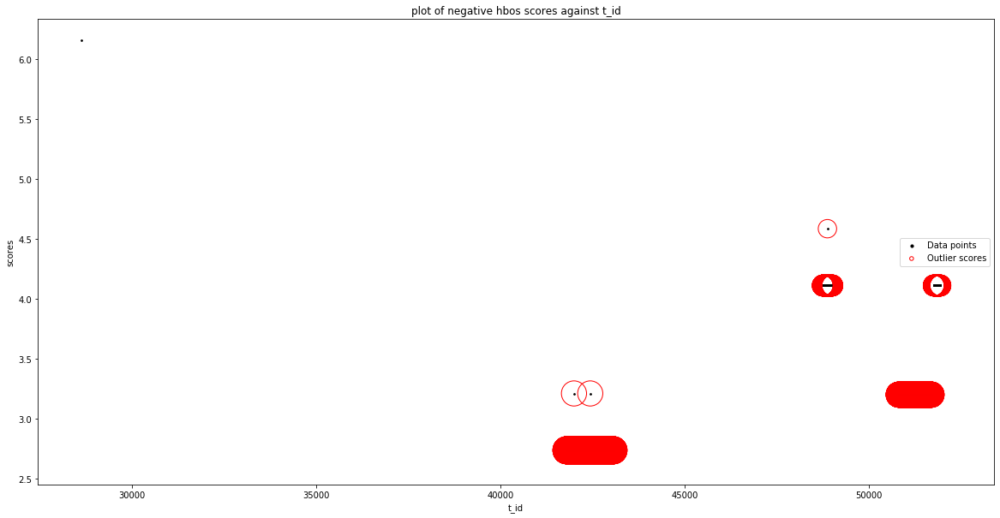

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_min', 'log_start_time']
input parameters are being used instead of default values
con

No valid feature
No Valid columns found for combination of  ['flow_iat_total', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_total', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_total', 'bwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_total', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_total', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid colu

No valid feature
No Valid columns found for combination of  ['flow_iat_total', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_total', 'a_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_total', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_total', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['flow_iat_total', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of

No valid feature
No Valid columns found for combination of  ['fwd_iat_mean', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_mean', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_mean', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_mean', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_mean', 'bwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_i

No valid feature
No Valid columns found for combination of  ['fwd_iat_mean', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_mean', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_mean', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_mean', 'active_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_mean', 'active_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_ia

No valid feature
No Valid columns found for combination of  ['fwd_iat_std', 'flow_pkts_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_std', 'flow_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_std', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_std', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_std', 'flow_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fw

No valid feature
No Valid columns found for combination of  ['fwd_iat_std', 'subflow_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_std', 'subflow_fwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_std', 'subflow_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_std', 'subflow_bwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_std', 'fwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found 

No valid feature
No Valid columns found for combination of  ['fwd_iat_max', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_max', 'fwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_max', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_max', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_max', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Vali

No valid feature
No Valid columns found for combination of  ['fwd_iat_max', 'fwd_segment_size_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_max', 'bwd_segment_size_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_max', 'fwd_bytes_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_max', 'fwd_packet_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_max', 'fwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid co

Outlier index: 1397
Outlier score: 5.099583783595538
Outlier index: 1398
Outlier score: 5.099583783595538
Outlier index: 1399
Outlier score: 5.099583783595538
Outlier index: 1400
Outlier score: 5.099583783595538
Outlier index: 1401
Outlier score: 5.099583783595538
Outlier index: 1402
Outlier score: 5.099583783595538
Outlier index: 1403
Outlier score: 5.099583783595538
Outlier index: 1404
Outlier score: 5.099583783595538
Outlier index: 1405
Outlier score: 5.099583783595538
Outlier index: 1406
Outlier score: 5.099583783595538
Outlier index: 1407
Outlier score: 5.099583783595538
Outlier index: 1408
Outlier score: 5.099583783595538
Outlier index: 1409
Outlier score: 5.099583783595538
Outlier index: 1410
Outlier score: 5.099583783595538
Outlier index: 1411
Outlier score: 5.099583783595538
Outlier index: 1412
Outlier score: 5.099583783595538
Outlier index: 1413
Outlier score: 5.099583783595538
Outlier index: 1414
Outlier score: 5.099583783595538
Outlier index: 1415
Outlier score: 5.099583783

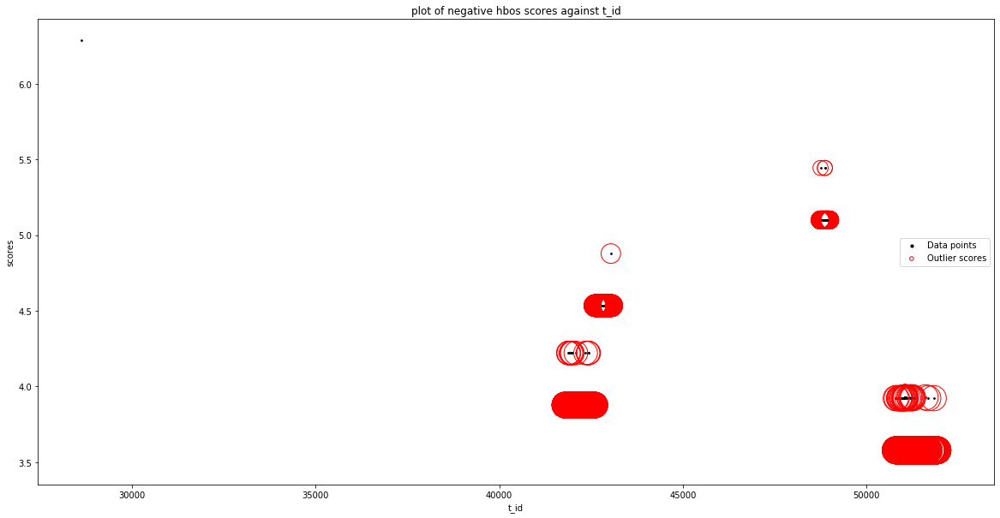

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_iat_min', 'src_port'], dtype='object')
Number of Inliers :  2365
Number of Outliers :  146
Outlier index: 0
Outlier score: 6.271938660931749
Outlier index: 1359
Outlier score: 4.813656995351878
Outlier index: 1360
Outlier score: 4.813656995351878
Outlier index: 2358
Outlier score: 4.632575446707635
Outlier index: 2359
Outlier score: 4.632575446707635
Outlier index: 2360
Outlier score: 4.632575446707635
Outlier index: 2361
Outlier score: 4.632575446707635
Outlier index: 2362
Outlier score: 4.632575446707635
Outlier index: 2363
Outlier score: 4.632575446707635
Outlier index: 2364
Outlier score: 4.632575446707635
Outlier index: 2365
Outlier score: 4.632575446707635
Outlier index: 2366
Outli

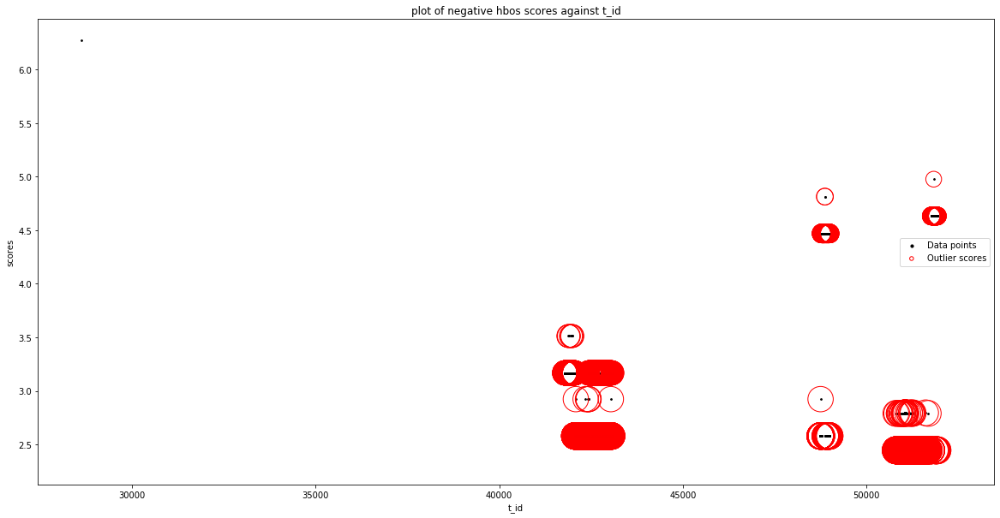

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_iat_min', 'flow_duration'], dtype='object')
Number of Inliers :  2456
Number of Outliers :  55
Outlier index: 0
Outlier score: 6.293588499189877
Ou

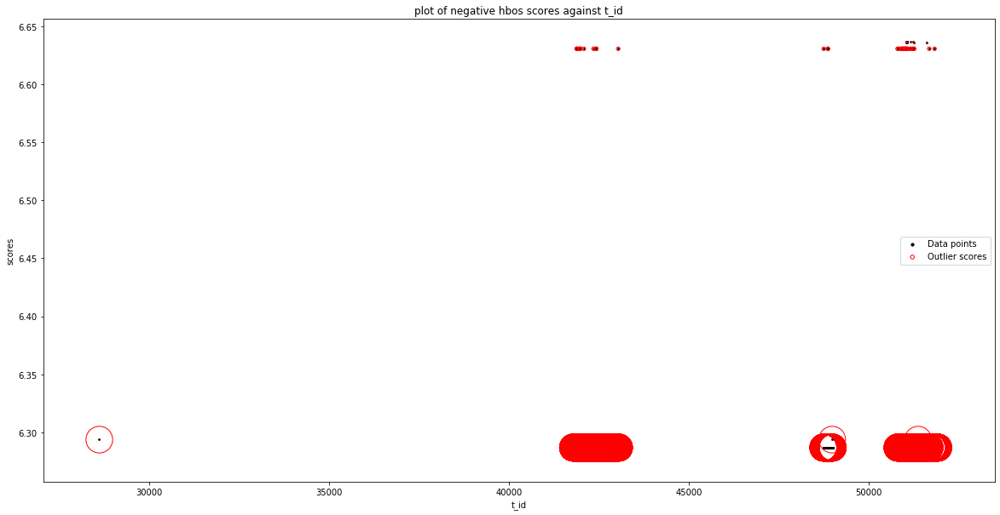

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_iat_min', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2417
Number of Outliers :  94
Outlier index: 0
Outlier score: 6.29339305489108
Outlier index: 96
Outlier score: 6.216218182037547
Outlier index: 103
Outlier score: 6.216218182037547
Outlier index: 107
Outlier score: 6.216218182037547
Outlier index: 113
Outlier score: 6.292600587284445
Outlier index: 161
Outlier score: 6.216218182037547
Outlier index: 187
Outlier score: 6.216218182037547
Outlier index: 191
Outlier

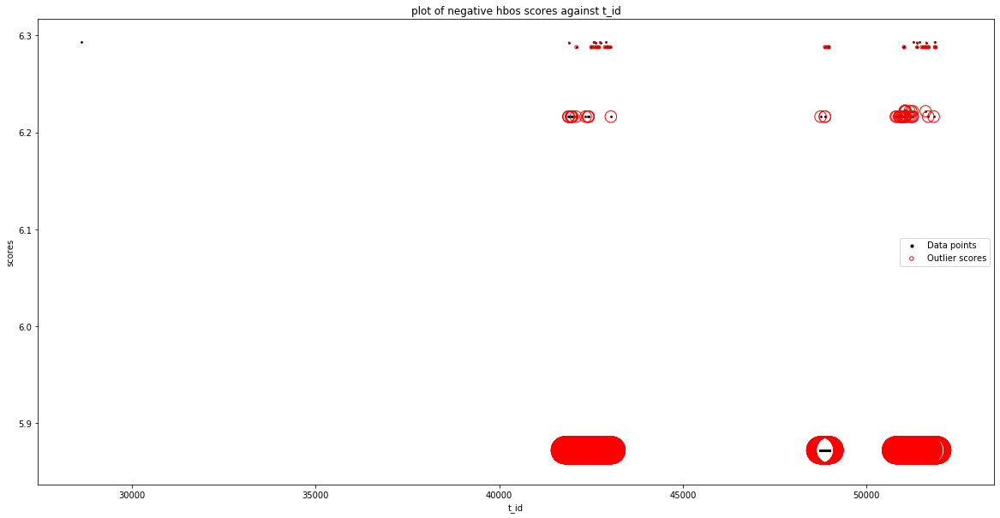

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_iat_min', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
Outlier index: 0
Outlier score: 6.062379032773734
Outlier index: 1
Outlier score: 6.062379032773734
Outlier index: 63
Outlier score: 6.105751728419617
Outlier index: 113
Outlier score: 6.062379032773734
Outlier index: 115
Outlier score: 6.062379032773734
Outlier index: 174
Outlier score: 6.268729648316641
Outlier index: 193
Outlier score: 6.105751728419617
Outlier index: 311
Outlier score: 6.062379032773734
Outlier index: 426
Outlier score: 6.244289242266027
Outlier index: 498
Outlier score: 6.062379032773734
Outlier index: 553
Outlier score: 6.105751728419617
Outli

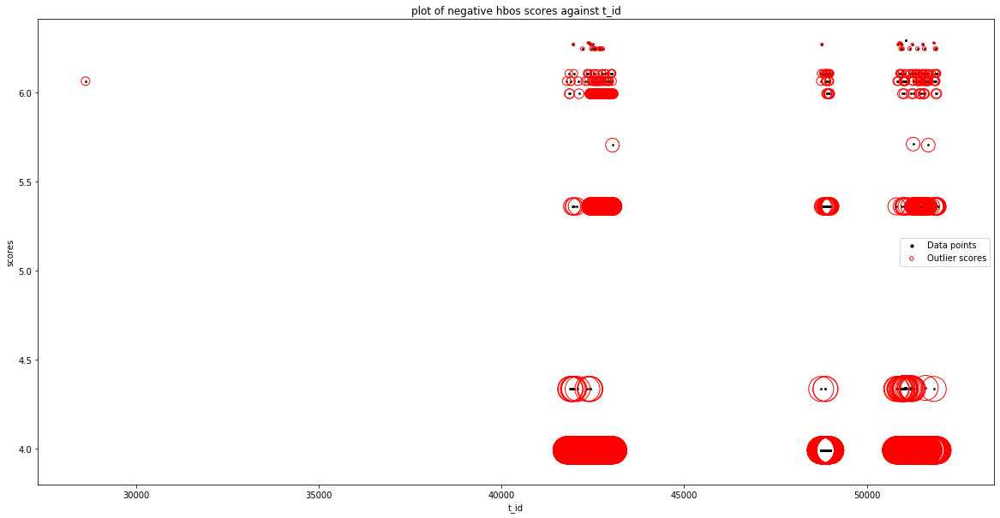

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_iat_min', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2357
Number of Outliers :  154
Outlier index: 0
Outlier score: 6.182697428613212
Outlier index: 113
Outlier score: 6.283744879071506
Outlier index: 115
Outlier score: 6.182697428613212
Outlier index: 174
Outlier score: 6.182697428613212
Outlier index: 193
Outlier score: 6.182697428613212
Outlier index: 311
Outlier score: 6.275590603267695
Outlier index: 498
Outlier score: 6.241837195571806
Outlier index: 564
Outlier score: 6.241837195571806
Outlier index: 574
Outlier score: 6.275590603267695
Outlier index: 616
Outlier score: 6.182697428613212
Outlier index: 625
Outlier score: 6.182697428613212
Outlie

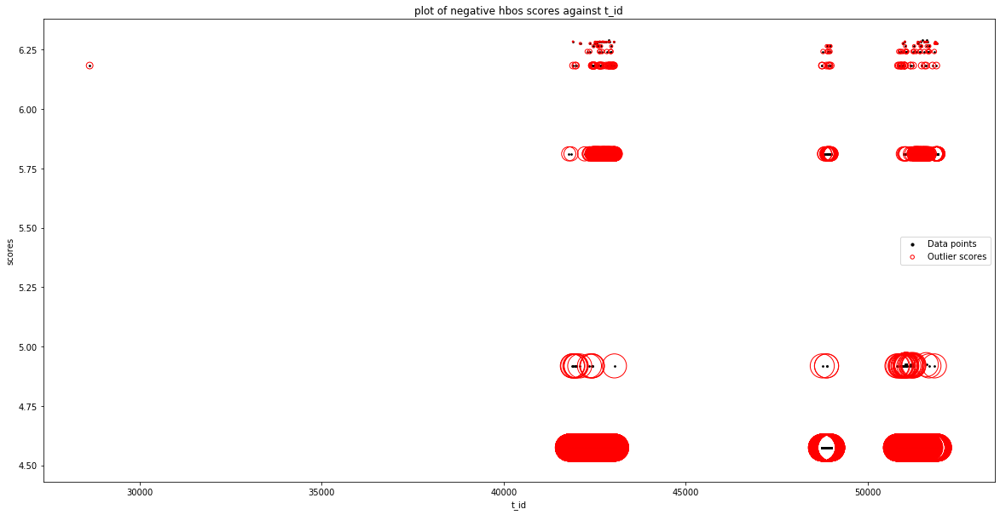

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'bwd_packet_length_std']
input parameters are bei

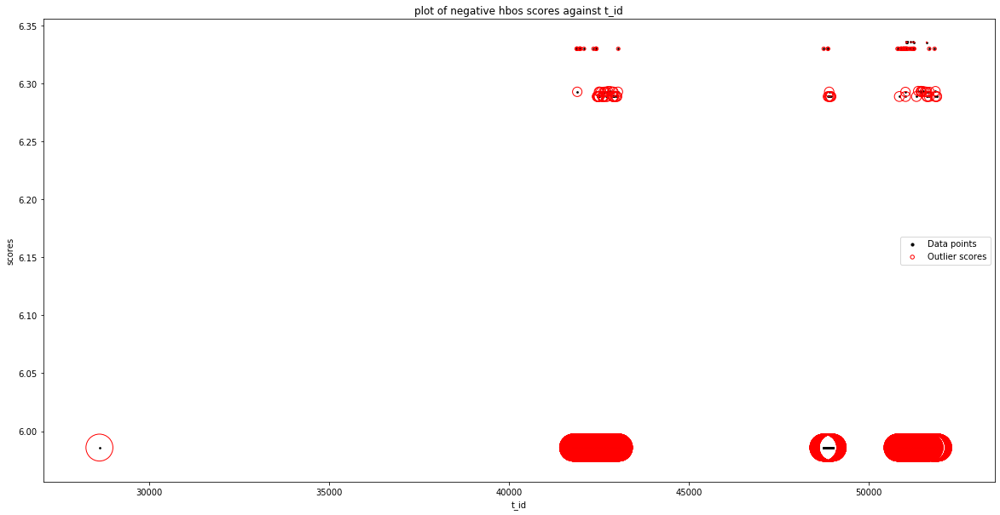

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_iat_min', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2399
Number of Outliers :  112
Outlier index: 653
Outlier score: 6.169582901149458
Outlier index: 663
Outlier score: 6.277740905493621
Outlier index: 667
Outlier score: 6.229302063836171
Outlier index: 674
Outlier score: 6.229302063836171
Outlier index: 687
Outlier score: 6.169582901149458
Outlier index: 689
Outlier score: 6.169582901149458
Outlier index: 694
Outlier score: 6.169582901149458
Outlier index: 701
Outlier score: 6.169582901149458
Outlier index: 707
Outlier score: 6.229302063836171
Outlier index: 709
Outlier score: 6.169582901149458
Outlier index: 713
Outlier score: 6.169582901149458
Outlier index: 732
Outlier score: 6.169582901149458
Outlier index: 747
Outlier score: 6.169582901149458
Outlier index: 749
Outlier score: 6.277740905493621
Outlier index: 762
Outlier score: 6.169582901149

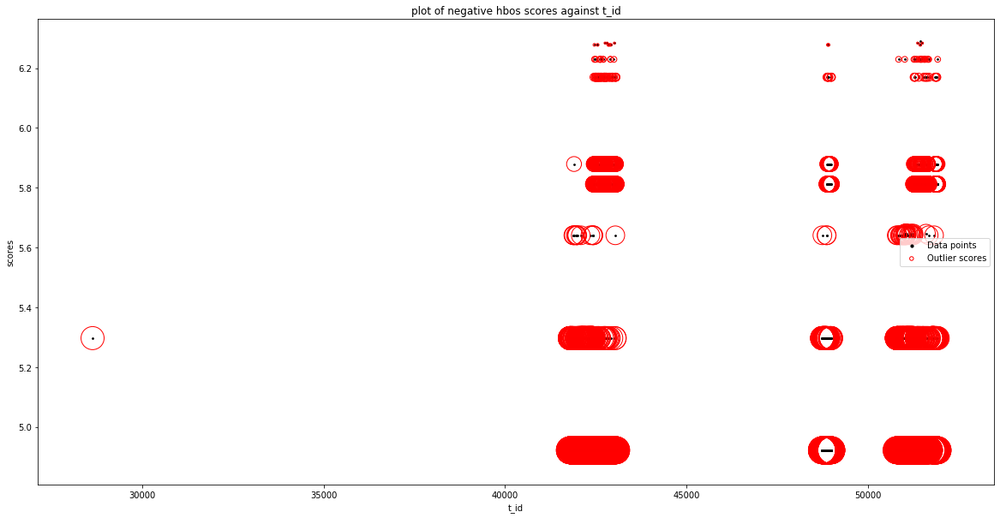

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_iat_min', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2457
Number of Outliers :  54
Outlier index: 96
Outlier score: 6.610628659447222
Outlier index: 103
Outlier score: 6.610628659447222
Outlier index: 107
Outlier score: 6.610628659447222
Outlier index: 161
Outlier score: 6.610628659447222
Outlier index: 187
Outlier score: 6.610628659447222
Outlier index: 191
Outlier score: 6.610628659447222
Outlier index: 199
Outlier score: 6.610628659447222
Outlier index: 295
Outlier score: 6.610628659447222
Outlier index: 555
Outlier score: 6.610628659447222
Outlier index: 617
Outlier score: 6.610628659447222
Outlier index: 631
Outlier score: 6.610628659447222
Outlier index: 632
Outlier score: 6.610628659447222
Outlier index: 1221
Outlier score: 6.610628659447222
Outlier index: 1255
Outlier score: 6.610628659447222
Outlier index: 1359
Outlier score: 6.610628659447222

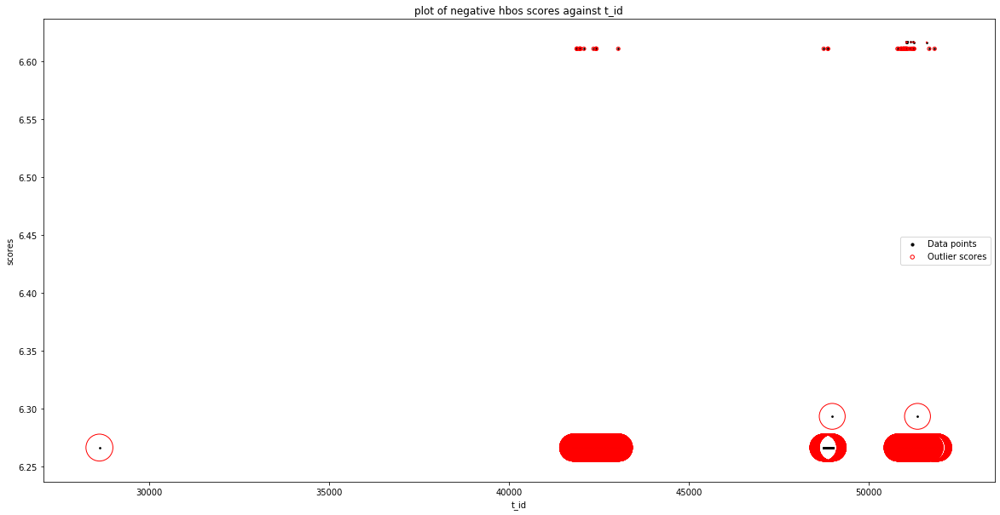

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_iat_min', 'flow_iat_min'], dtype='object')
Number of Inliers :  2459
Number of Outliers :  52
Outlier index: 96
Outlier score: 6.162565232723971
Outlier index: 103
Outlier score: 6.162565232723971
Outlier index: 107
Outlier score: 6.162565232723971
Outlier index: 161
Outlier score: 6.162565232723971
Outlier index: 187
Outlier score: 6.162565232723971
Outlier index: 191
Outlier score: 6.162565232723971
Outlier index: 199
Outlier score: 6.636909434668464
Outlier index: 295
Outlier score: 6.16256523272

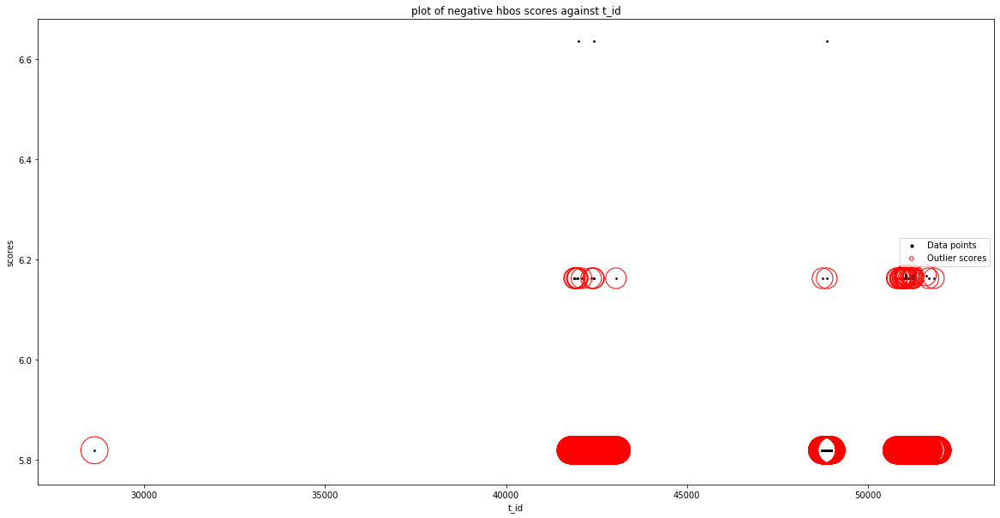

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'bwd_iat_total']
input parameters are being used instead of default values
contaminati

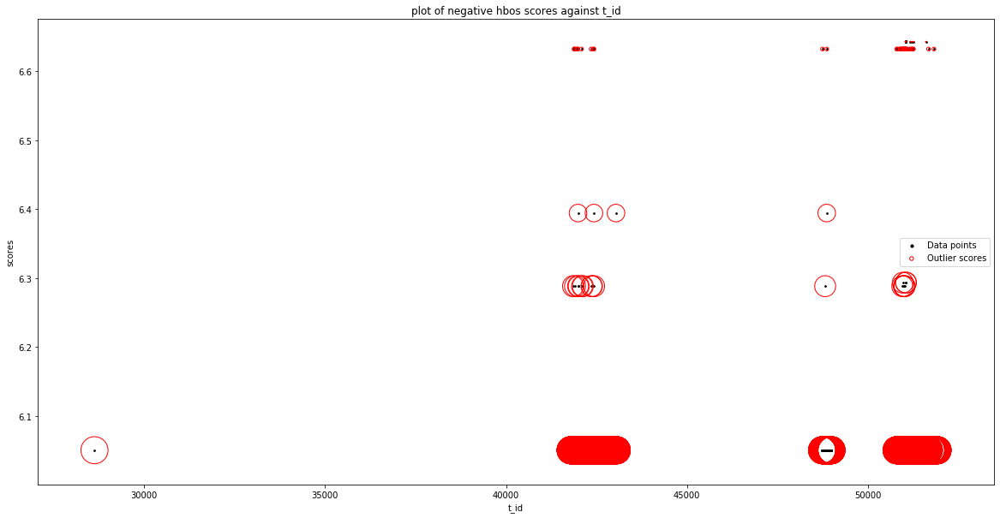

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'fwd_header_length']
input parameters are being used instead of default values
con

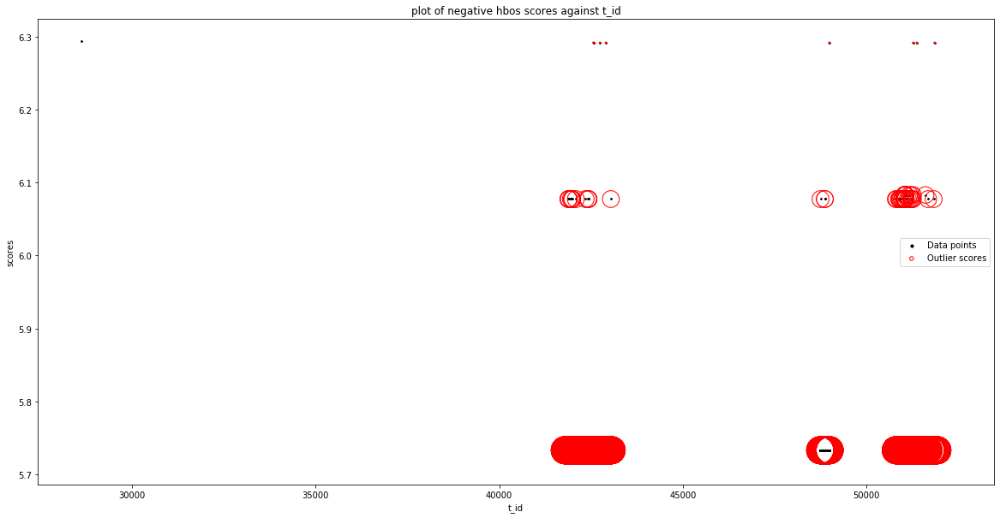

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'packet_length_mean']
input parameters are being used instead 

Silhouetter Score: 0.888
davies bouldin Score: 0.956
calinski_harabasz Score: 2025.461


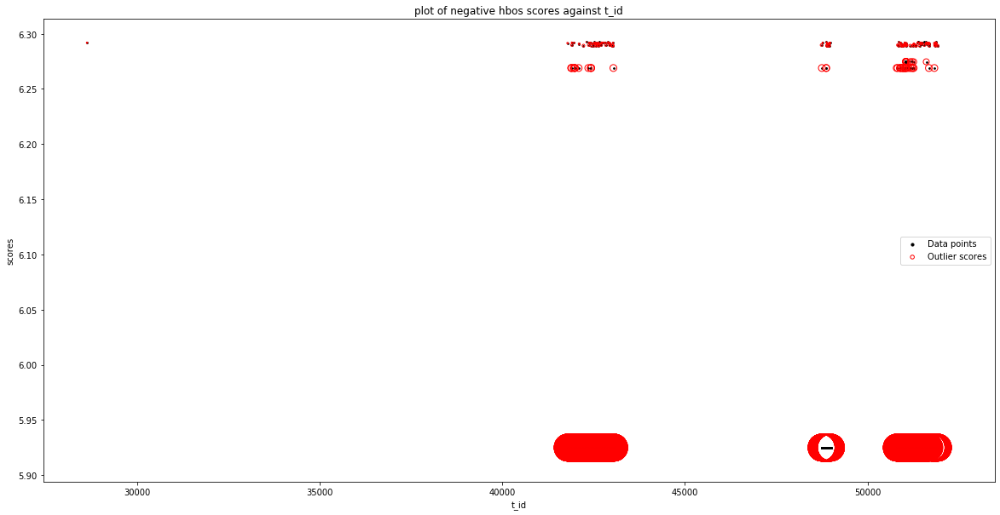

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_iat_min', 'psh_flag_count'], dtype='object')
Number of Inliers :  2454
Number of Outliers :  57
Outlier index: 0
Outlier score: 6.292223911799044
Outlier index: 96
Outlier score: 4.8821769788631215
Outlier index: 103
Outlier score: 4.8821769788631215
Outlier index: 107
Outlier score: 4.8821769788631215
Outlier 

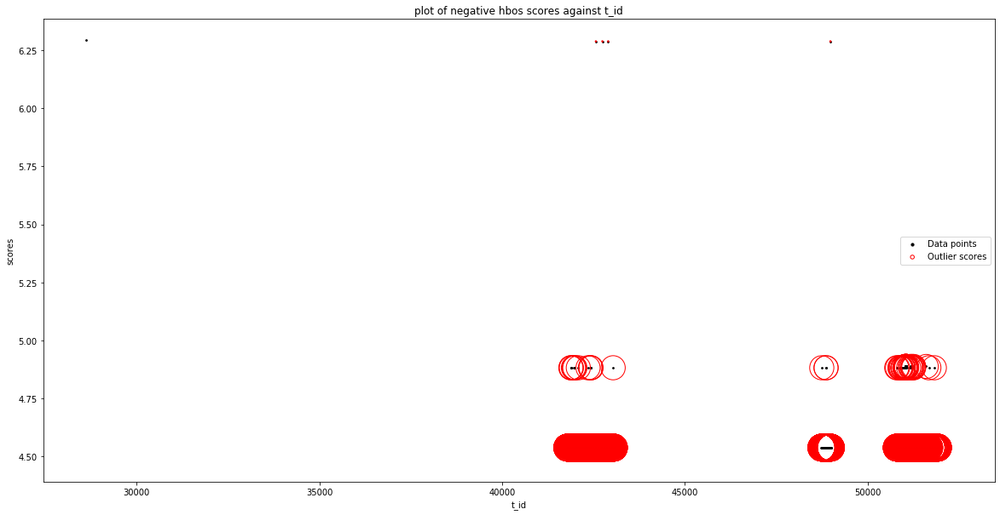

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'down_up_ratio']
input parameters are being used instead of default values
con

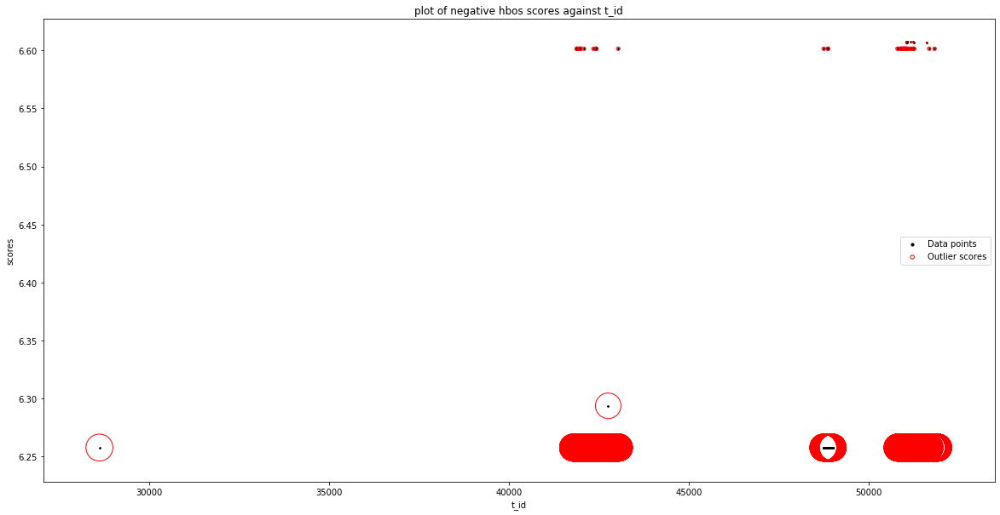

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'active_max']
input parameters are being used instead of default values
conta

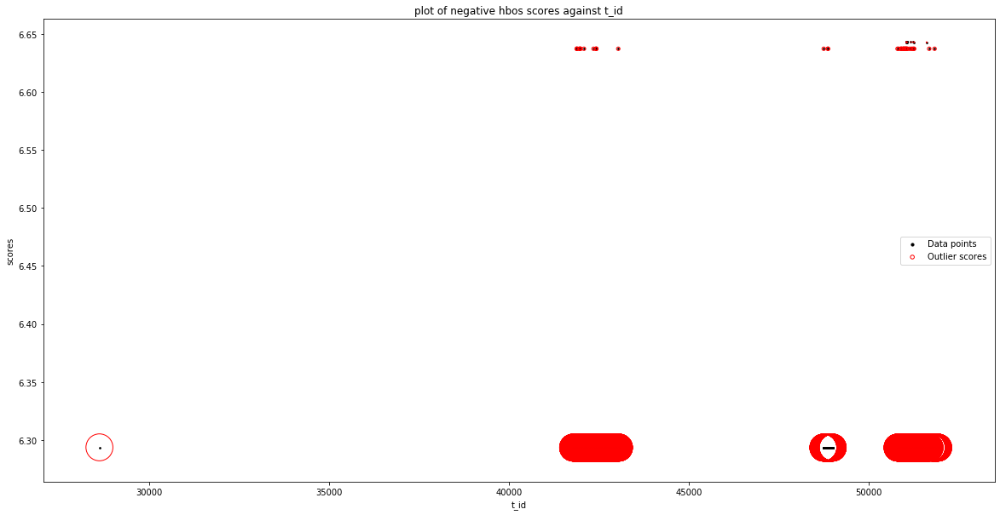

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_iat_min', 'idle_max'], dtype='object')
Number of Inliers :  2458
Number of Outliers :  53
Outlier index: 0
Outlier score: 6.293393660524954
Outlier index: 96
Outlier score: 6.211293930422088
Outlier index: 103
Outlier score: 6.211293930422088
Outlier index: 107
Outlier score: 6.211293930422088
Outlier index: 161
Outlier score: 6.211293930422088
Outlier index: 187
Outlier score: 6.211293930422088
Outlier index: 191
Outlier score: 6.211293930422088
Outlier index: 199
Outlier score: 6.211293930422088
Outlier index: 295
Outlier score: 6.211293930422088
Outlier index: 555
Outlier score: 6.211293930422088
Outlier index: 617
Outlier score: 6.211293930422088
Outlier index: 631
Outlier score: 6

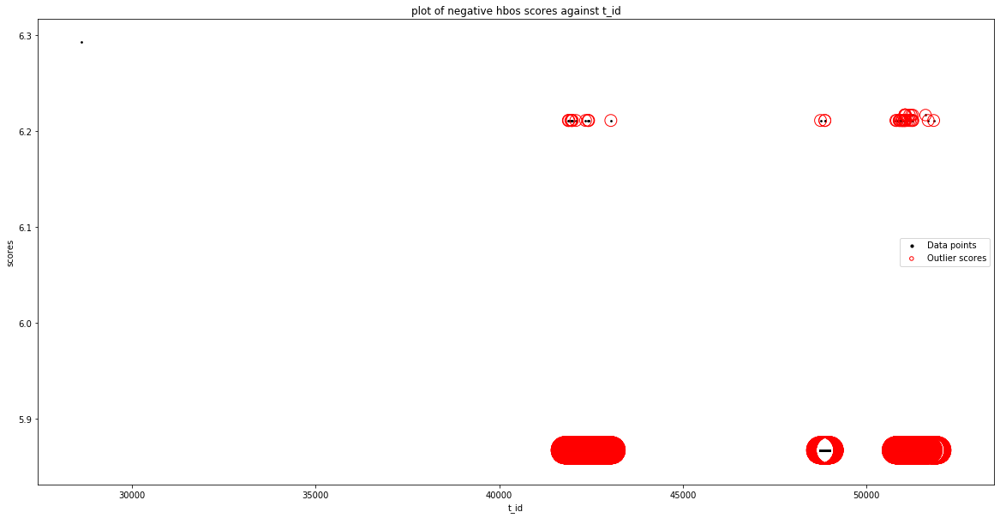

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['fwd_iat_min', 'a_id'], dtype='object')
Number of Inliers :  2474
Number of Outliers :  37
Outlier index: 0
Outlier score: 6.291343764411124
Outlier index: 1484
Outlier score: 5.256710026698581
Outlier index: 1508
Outlier score: 5.256710026698581
Outlier index: 1573
Outlier score: 5.256710026698581
Outlier index: 1576
Outlier score: 5.256710026698581
Outlier index: 1598
Outlier score: 5.256710026698581
Outlier index: 1615
Outlier score: 5.256710026698581
Outlier index: 1652
Outlier score: 5.256710026698581
Ou

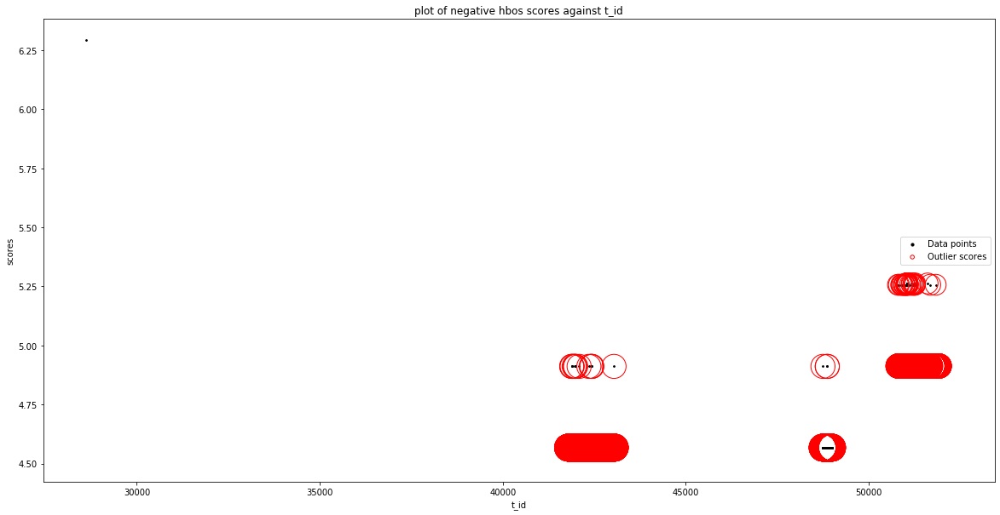

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'service_physical_ip']
input parameters are being used instead of default values
c

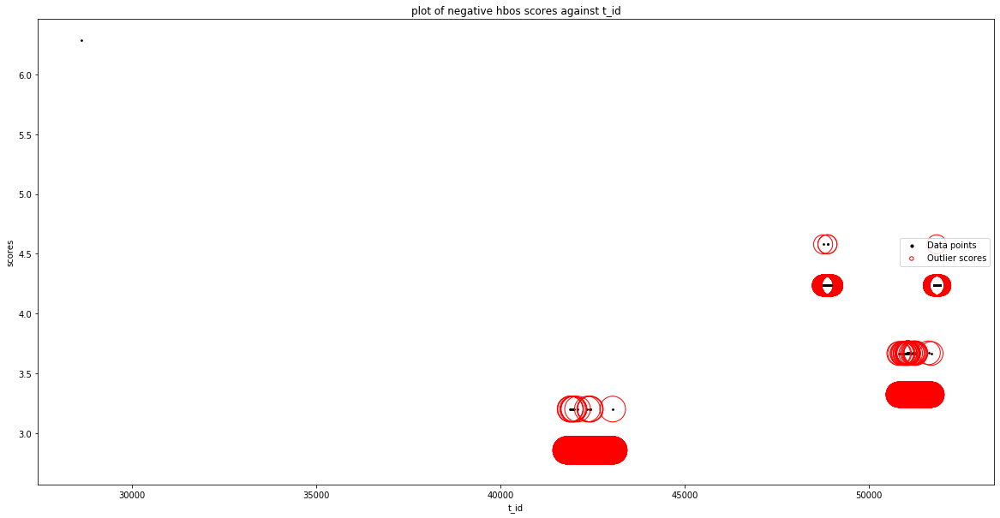

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_iat_min', 'log_start_time']
input parameters are being used instead of default values
contamin

No valid feature
No Valid columns found for combination of  ['bwd_iat_total', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_total', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_total', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_total', 'bwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_total', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found f

No valid feature
No Valid columns found for combination of  ['bwd_iat_total', 'idle_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_total', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_total', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_total', 'a_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_total', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_total', 'cl

No valid feature
No Valid columns found for combination of  ['bwd_iat_mean', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_mean', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_mean', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_mean', 'fwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_mean', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_i

No valid feature
No Valid columns found for combination of  ['bwd_iat_mean', 'fwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_mean', 'bwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_mean', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_mean', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_mean', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found fo

No valid feature
No Valid columns found for combination of  ['bwd_iat_std', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_std', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_std', 'bwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_std', 'flow_bytes_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_std', 'flow_pkts_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid colum

No valid feature
No Valid columns found for combination of  ['bwd_iat_std', 'fwd_packet_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_std', 'fwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_std', 'bwd_bytes_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_std', 'bwd_packet_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_std', 'bwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid co

No valid feature
No Valid columns found for combination of  ['bwd_iat_max', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_max', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_max', 'total_length_of_fwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_max', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_max', 'fwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Val

No valid feature
No Valid columns found for combination of  ['bwd_iat_max', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_max', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_max', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_max', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_max', 'down_up_ratio']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  [

Features Used ::  Index(['bwd_iat_min', 't_id'], dtype='object')
Number of Inliers :  2272
Number of Outliers :  239
Outlier index: 0
Outlier score: 6.392702907079082
Outlier index: 1244
Outlier score: 5.206481165565128
Outlier index: 1245
Outlier score: 5.206481165565128
Outlier index: 1246
Outlier score: 5.206481165565128
Outlier index: 1247
Outlier score: 5.206481165565128
Outlier index: 1248
Outlier score: 5.206481165565128
Outlier index: 1249
Outlier score: 5.206481165565128
Outlier index: 1250
Outlier score: 5.206481165565128
Outlier index: 1251
Outlier score: 5.206481165565128
Outlier index: 1252
Outlier score: 5.206481165565128
Outlier index: 1253
Outlier score: 5.206481165565128
Outlier index: 1254
Outlier score: 5.206481165565128
Outlier index: 1255
Outlier score: 5.4444376477816485
Outlier index: 1256
Outlier score: 5.206481165565128
Outlier index: 1257
Outlier score: 5.206481165565128
Outlier index: 1258
Outlier score: 5.206481165565128
Outlier index: 1259
Outlier score: 5.

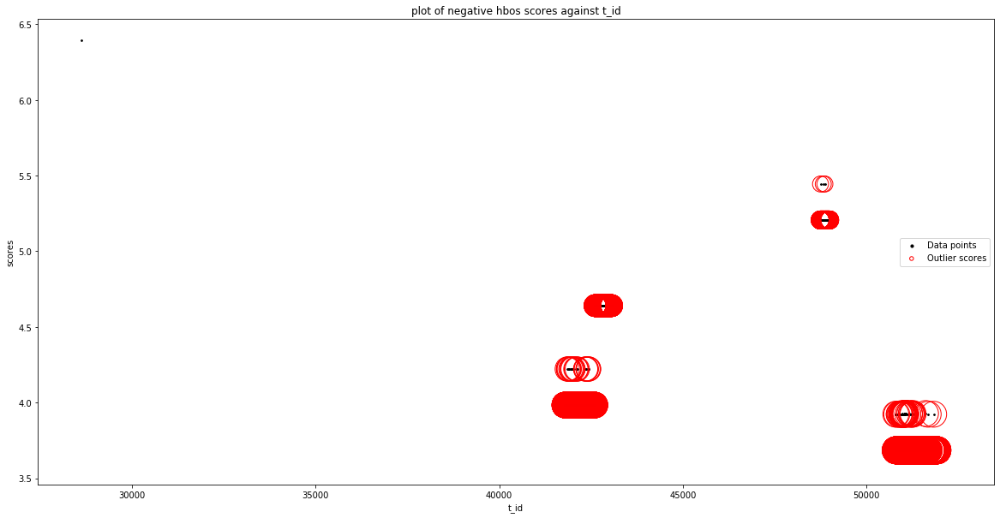

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_iat_min', 'src_port'], dtype='object')
Number of Inliers :  2365
Number of Outliers :  146
Outlier index: 0
Outlier score: 6.378836042901338
Outlier index: 1322
Outlier score: 4.81451990692224
Outlier index: 1360
Outlier score: 4.81451990692224
Outlier index: 2358
Outlier score: 4.739472828677226
Outlier index: 2359
Outlier score: 4.739472828677226
Outlier index: 2360
Outlier score: 4.739472828677226
Outlier index: 2361
Outlier score: 4.739472828677226
Outlier index: 2362
Outlier score: 4.739472828677226
Outlier index: 2363
Outlier score: 4.739472828677226
Outlier index: 2364
Outlier score: 4.739472828677226
Outlier index: 2365
Outlier score: 4.739472828677226
Outlier index: 2366
Outlier

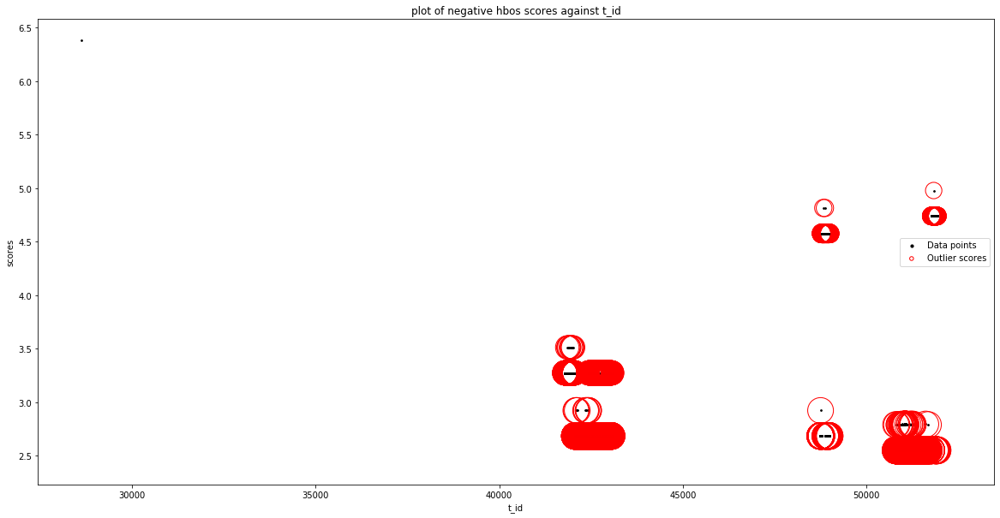

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_iat_min', 'flow_duration'], dtype='object')
Number of Inliers :  2442
Number of Outliers :  69
Outlier index: 0
Outlier score: 6.400485881159466
Ou

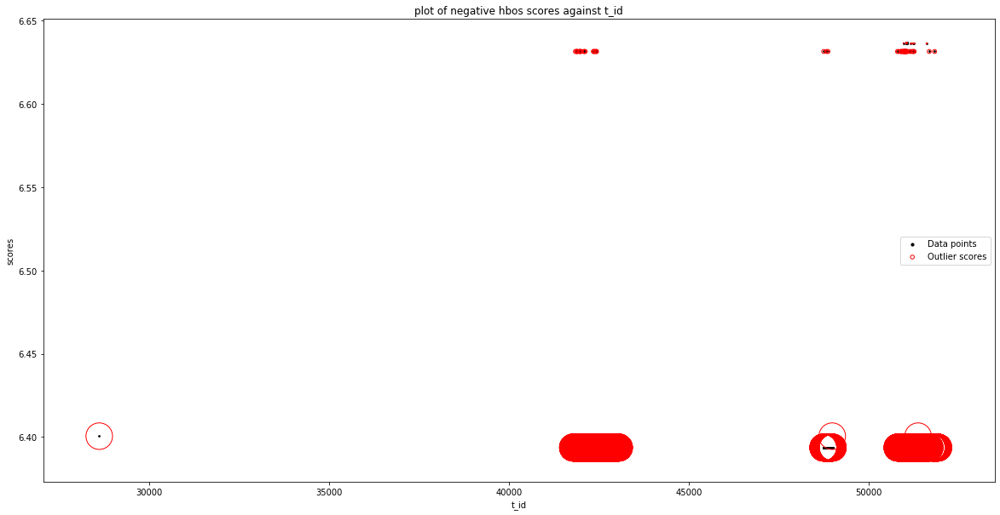

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_iat_min', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2404
Number of Outliers :  107
Outlier index: 0
Outlier score: 6.40029043686067
Outlier index: 67
Outlier score: 6.217081093607909
Outlier index: 96
Outlier score: 6.217081093607909
Outlier index: 103
Outlier score: 6.217081093607909
Outlier index: 107
Outlier score: 6.217081093607909
Outlier index: 113
Outlier score: 6.3994979692540355
Outlier index: 118
Outlier score: 6.217081093607909
Outlier index: 161
Outlie

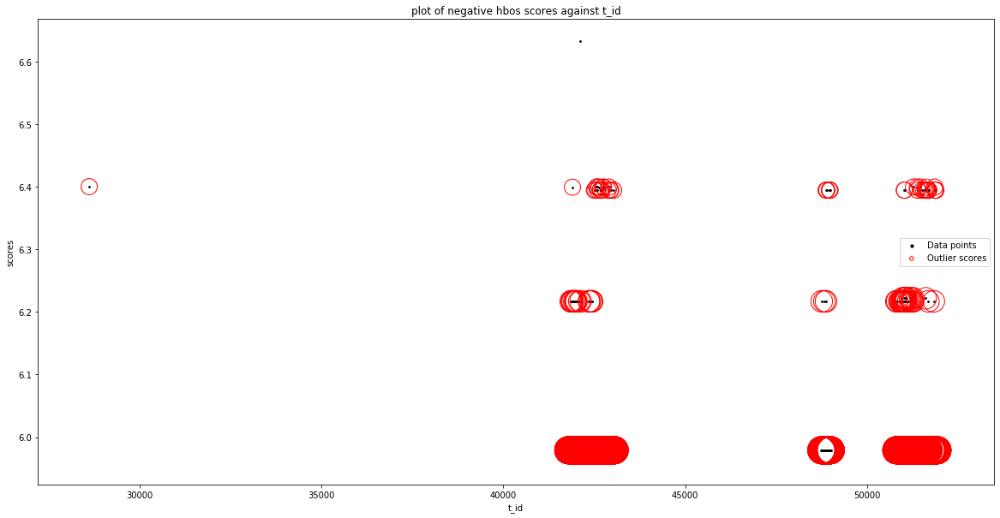

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_iat_min', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2335
Number of Outliers :  176
Outlier index: 0
Outlier score: 6.169276414743324
Outlier index: 1
Outlier score: 6.169276414743324
Outlier index: 63
Outlier score: 6.212649110389206
Outlier index: 113
Outlier score: 6.169276414743324
Outlier index: 115
Outlier score: 6.169276414743324
Outlier index: 174
Outlier score: 6.37562703028623
Outlier index: 193
Outlier score: 6.212649110389206
Outlier index: 311
Outlier score: 6.407232896959845
Outlier index: 332
Outlier score: 6.336874603933459
Outlier index: 426
Outlier score: 6.351186624235616
Outlier index: 498
Outlier score: 6.169276414743324
Outlie

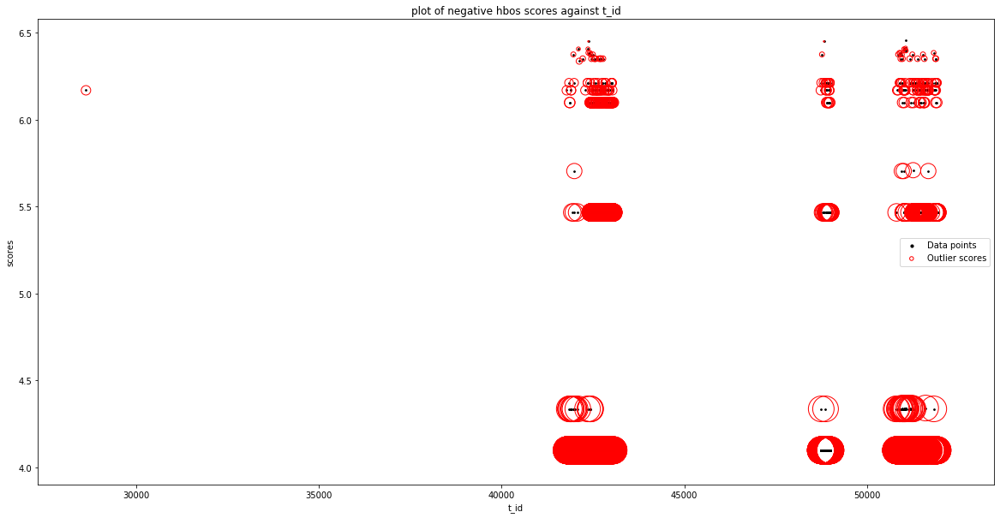

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_iat_min', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2354
Number of Outliers :  157
Outlier index: 0
Outlier score: 6.289594810582802
Outlier index: 113
Outlier score: 6.390642261041095
Outlier index: 115
Outlier score: 6.289594810582802
Outlier index: 174
Outlier score: 6.289594810582802
Outlier index: 193
Outlier score: 6.289594810582802
Outlier index: 311
Outlier score: 6.620444467453805
Outlier index: 498
Outlier score: 6.348734577541396
Outlier index: 564
Outlier score: 6.586691059757917
Outlier index: 574
Outlier score: 6.382487985237285
Outlier index: 575
Outlier score: 6.155903887133077
Outlier index: 616
Outlier score: 6.289594810582802
Outlie

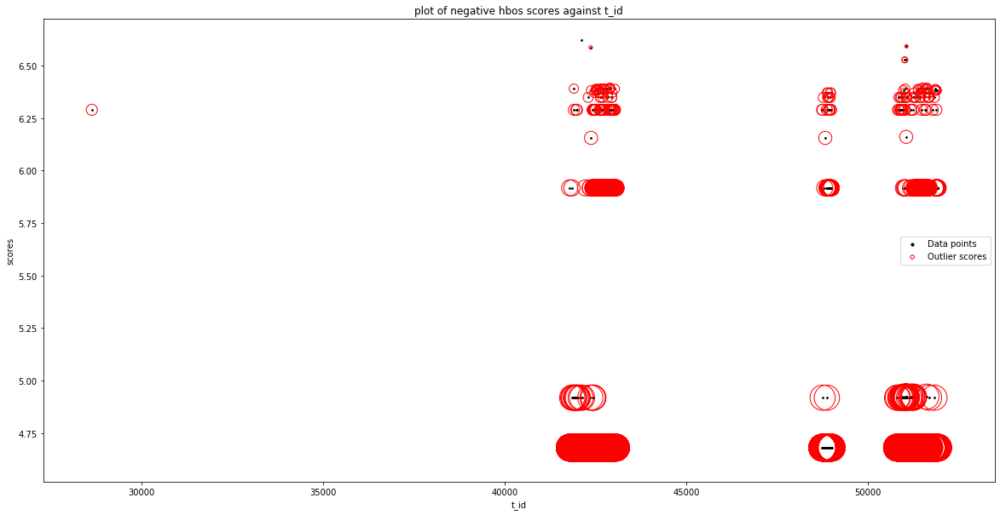

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'bwd_packet_length_std']
input parameters are bei

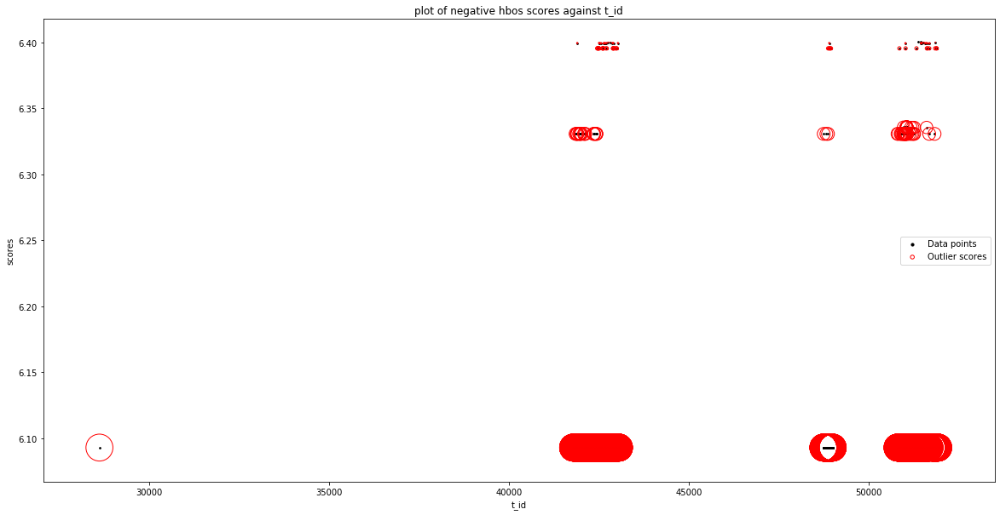

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_iat_min', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2399
Number of Outliers :  112
Outlier index: 653
Outlier score: 6.276480283119048
Outlier index: 663
Outlier score: 6.384638287463211
Outlier index: 667
Outlier score: 6.336199445805761
Outlier index: 674
Outlier score: 6.336199445805761
Outlier index: 687
Outlier score: 6.276480283119048
Outlier index: 689
Outlier score: 6.276480283119048
Outlier index: 694
Outlier score: 6.276480283119048
Outlier index: 701
Outlier score: 6.276480283119048
Outlier index: 707
Outlier score: 6.336199445805761
Outlier index: 709
Outlier score: 6.276480283119048
Outlier index: 713
Outlier score: 6.276480283119048
Outlier index: 732
Outlier score: 6.276480283119048
Outlier index: 747
Outlier score: 6.276480283119048
Outlier index: 749
Outlier score: 6.384638287463211
Outlier index: 762
Outlier score: 6.276480283119

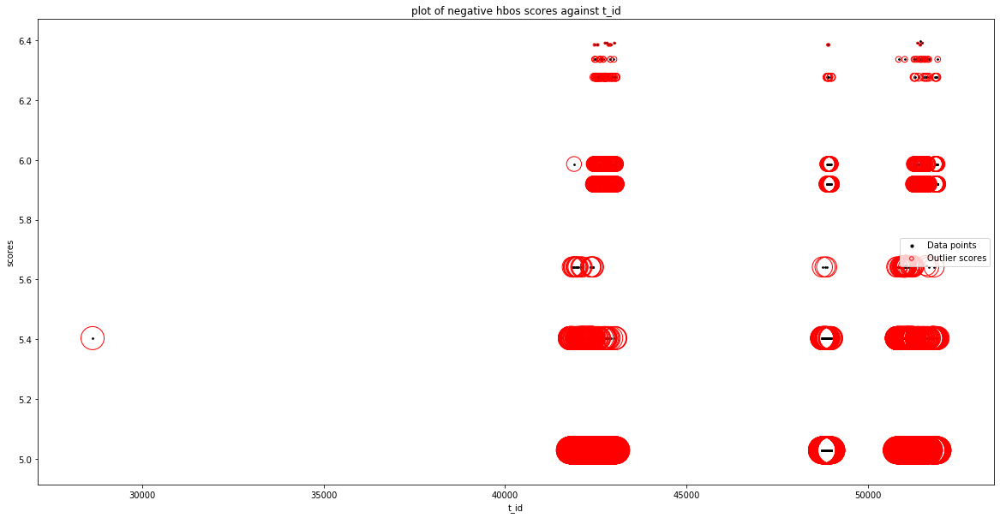

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_iat_min', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2443
Number of Outliers :  68
Outlier index: 67
Outlier score: 6.611491571017584
Outlier index: 96
Outlier score: 6.611491571017584
Outlier index: 103
Outlier score: 6.611491571017584
Outlier index: 107
Outlier score: 6.611491571017584
Outlier index: 118
Outlier score: 6.611491571017584
Outlier index: 161
Outlier score: 6.611491571017584
Outlier index: 187
Outlier score: 6.611491571017584
Outlier index: 191
Outlier score: 6.611491571017584
Outlier index: 200
Outlier score: 6.611491571017584
Outlier index: 221
Outlier score: 6.611491571017584
Outlier index: 295
Outlier score: 6.611491571017584
Outlier index: 311
Outlier score: 6.611491571017584
Outlier index: 332
Outlier score: 6.611491571017584
Outlier index: 555
Outlier score: 6.611491571017584
Outlier index: 564
Outlier score: 6.611491571017584
Out

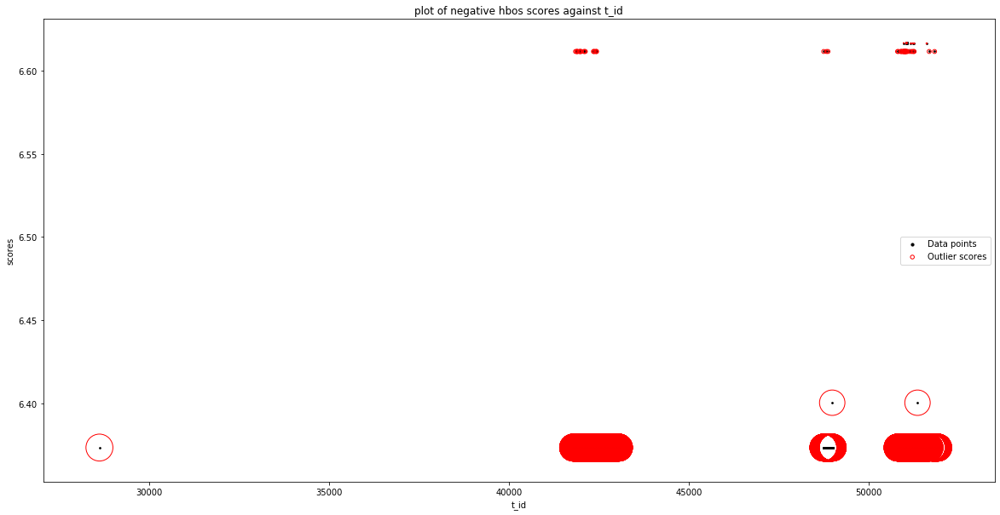

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_iat_min', 'flow_iat_min'], dtype='object')
Number of Inliers :  2442
Number of Outliers :  69
Outlier index: 67
Outlier score: 6.163428144294333
Outlier index: 96
Outlier score: 6.163428144294333
Outlier index: 103
Outlier score: 6.163428144294333
Outlier index: 107
Outlier score: 6.163428144294333
Outlier index: 118
Outlier score: 6.163428144294333
Outlier index: 161
Outlier score: 6.163428144294333
Outlier index: 187
Outlier score: 6.163428144294333
Outlier index: 191
Outlier score: 6.163428144294

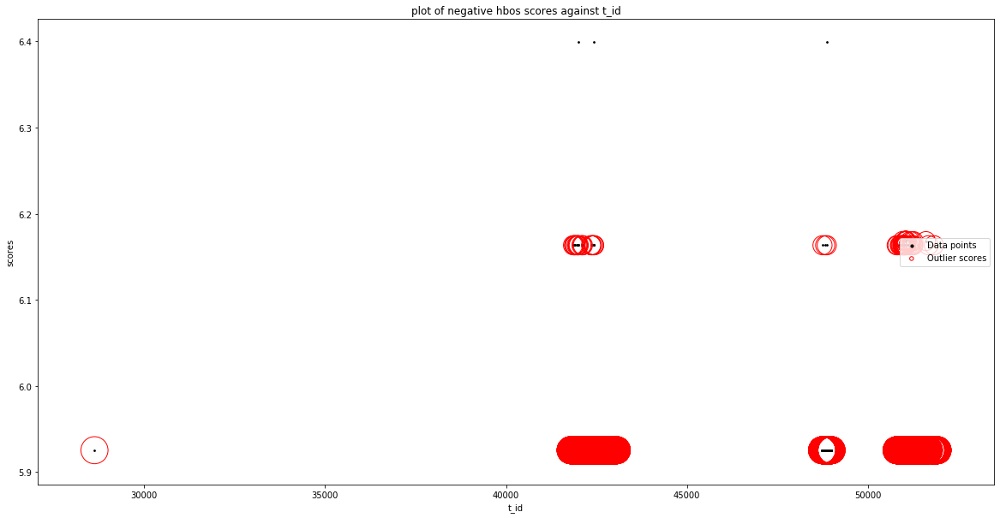

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_iat_min', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2441
Number of Outliers :  70
Outlier index: 67
Outlier score: 6.2881

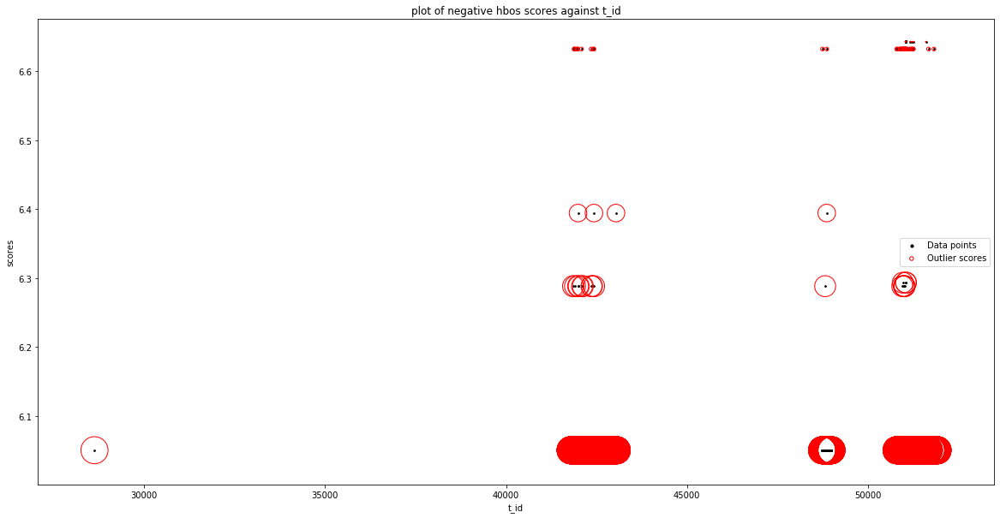

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'fwd_psh_flags']
input parameters are being used instead of default values
contaminatio

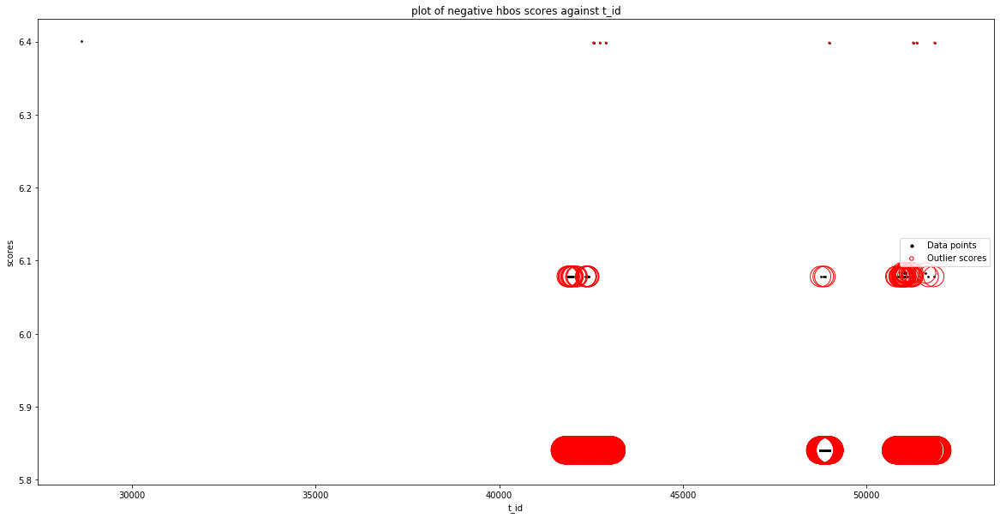

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'packet_length_mean']
input parameters are being used instead 

Outlier score: 6.274668891128471
Outlier index: 1945
Outlier score: 6.396635495229475
Outlier index: 1949
Outlier score: 6.397685327760753
Outlier index: 2000
Outlier score: 6.396110865306557
Outlier index: 2001
Outlier score: 6.396110865306557
Outlier index: 2046
Outlier score: 6.398735924799405
Outlier index: 2050
Outlier score: 6.39961200713412
Outlier index: 2055
Outlier score: 6.399436748101648
Outlier index: 2094
Outlier score: 6.396110865306557
Outlier index: 2098
Outlier score: 6.398385640772526
Outlier index: 2106
Outlier score: 6.398385640772526
Outlier index: 2116
Outlier score: 6.397685327760753
Outlier index: 2121
Outlier score: 6.3989110987111575
Outlier index: 2135
Outlier score: 6.397685327760753
Outlier index: 2172
Outlier score: 6.398560772154916
Outlier index: 2213
Outlier score: 6.396635495229475
Outlier index: 2220
Outlier score: 6.39961200713412
Outlier index: 2256
Outlier score: 6.39961200713412
Outlier index: 2266
Outlier score: 6.398735924799405
Outlier index: 

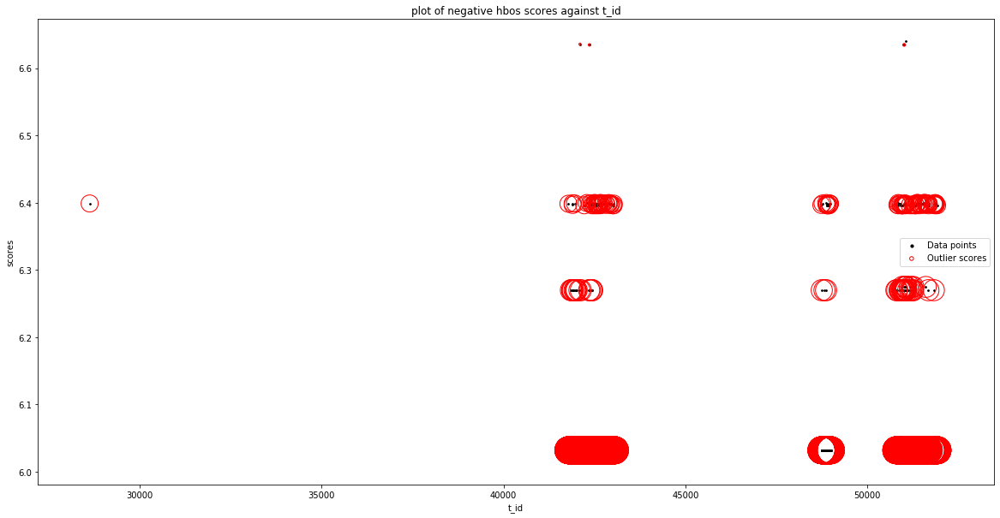

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_iat_min', 'psh_flag_count'], dtype='object')
Number of Inliers :  2440
Number of Outliers :  71
Outlier index: 0
Outlier score: 6.3991212937686335
Outlier index: 67
Outlier score: 4.8830398904334835
Outlier index: 96
Outlier score: 4.8830398904334835
Outlier index: 103
Outlier score: 4.8830398904334835
Outlier 

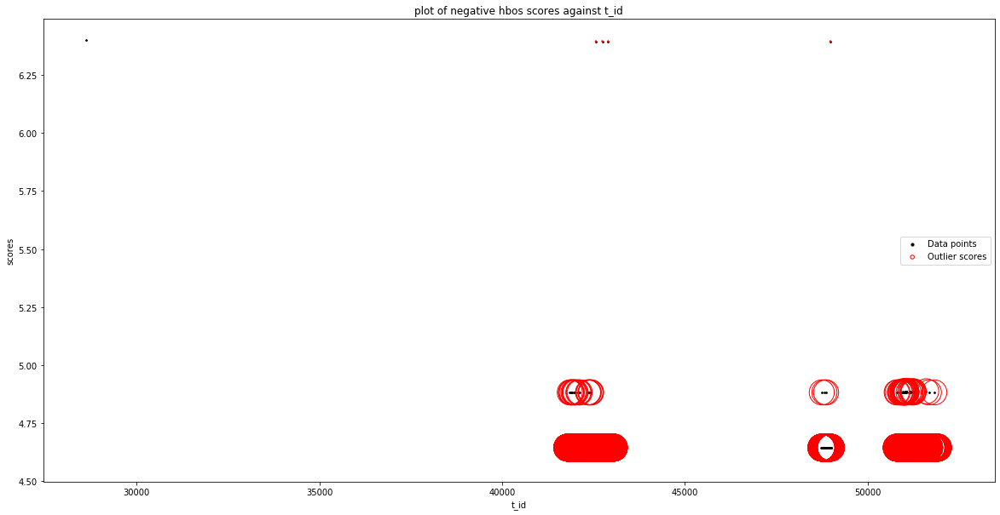

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'down_up_ratio']
input parameters are being used instead of default values
con

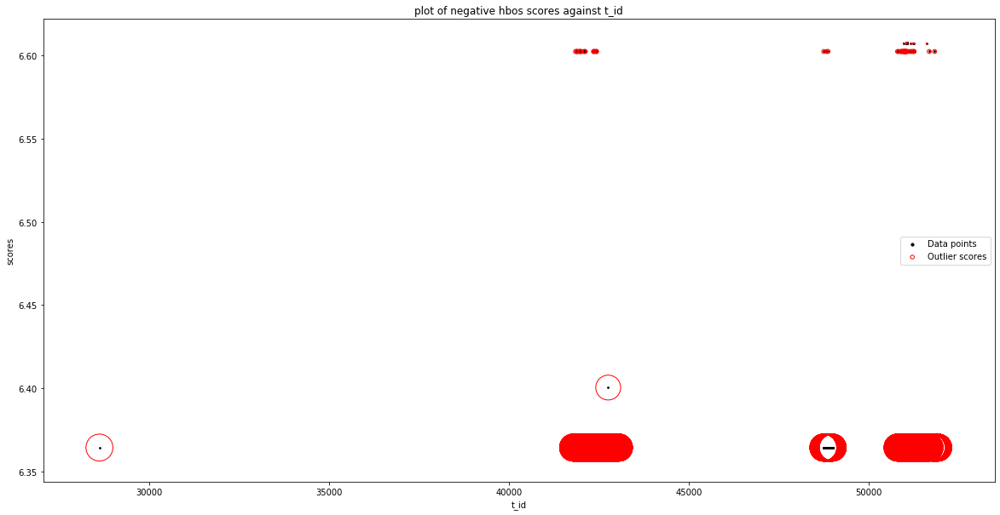

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'active_max']
input parameters are being used instead of default values
conta

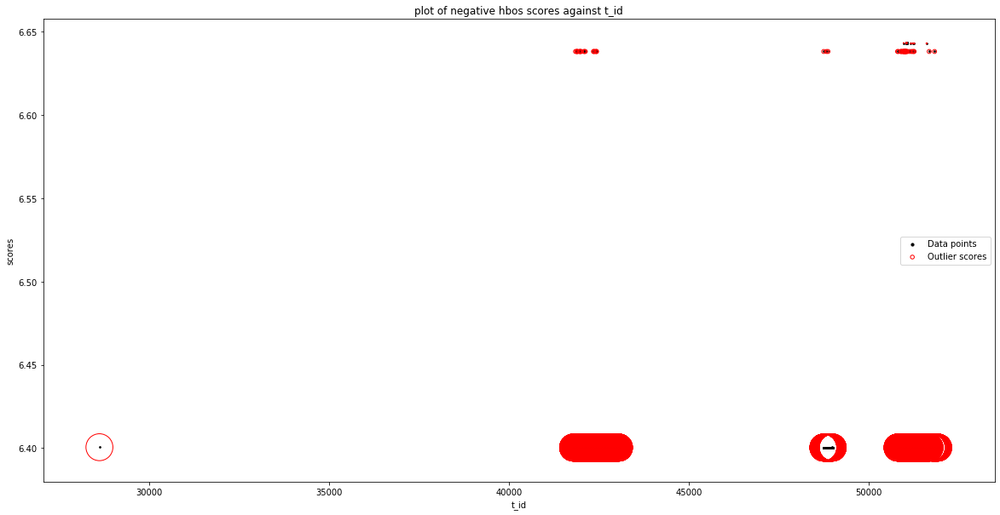

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_iat_min', 'idle_max'], dtype='object')
Number of Inliers :  2444
Number of Outliers :  67
Outlier index: 0
Outlier score: 6.400291042494544
Outlier index: 67
Outlier score: 6.21215684199245
Outlier index: 96
Outlier score: 6.21215684199245
Outlier index: 103
Outlier score: 6.21215684199245
Outlier index: 107
Outlier score: 6.21215684199245
Outlier index: 118
Outlier score: 6.21215684199245
Outlier index: 161
Outlier score: 6.21215684199245
Outlier index: 187
Outlier score: 6.21215684199245
Outlier index: 191
Outlier score: 6.21215684199245
Outlier index: 200
Outlier score: 6.21215684199245
Outlier index: 221
Outlier score: 6.21215684199245
Outlier index: 295
Outlier score: 6.2121568419

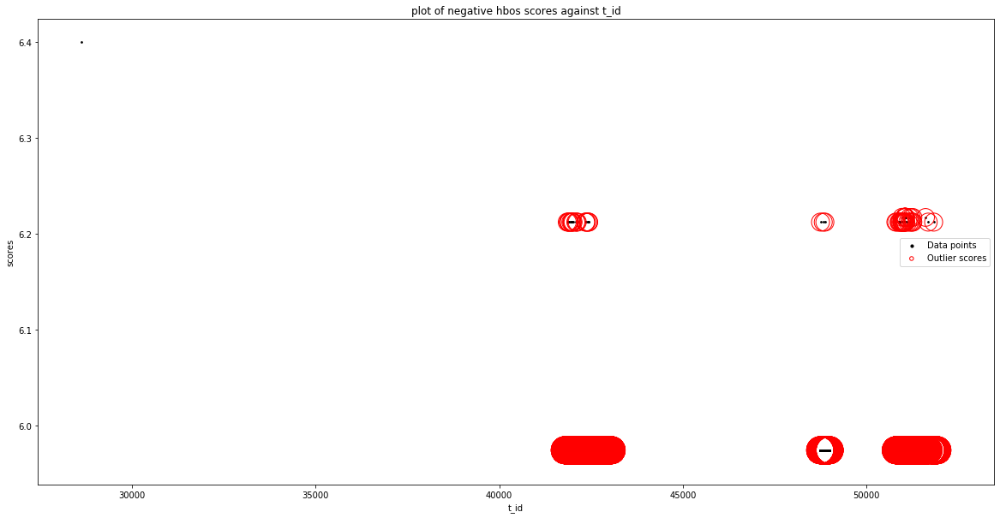

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_iat_min', 'a_id'], dtype='object')
Number of Inliers :  2466
Number of Outliers :  45
Outlier index: 0
Outlier score: 6.398241146380714
Outlier index: 1484
Outlier score: 5.257572938268943
Outlier index: 1508
Outlier score: 5.257572938268943
Outlier index: 1573
Outlier score: 5.257572938268943
Outlier index: 1576
Outlier score: 5.257572938268943
Outlier index: 1598
Outlier score: 5.257572938268943
Outlier index: 1615
Outlier score: 5.257572938268943
Outlier index: 1639
Outlier score: 5.257572938268943
Ou

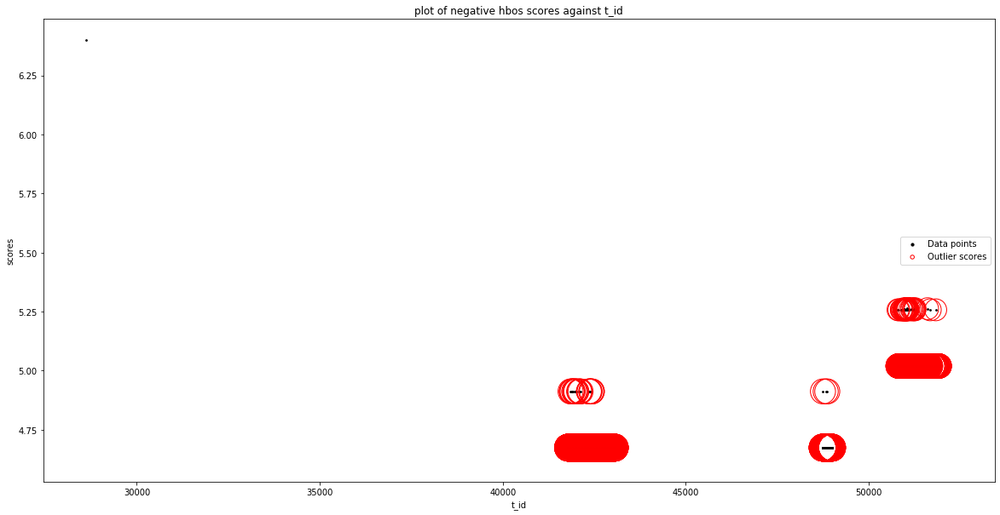

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'service_physical_ip']
input parameters are being used instead of default values
c

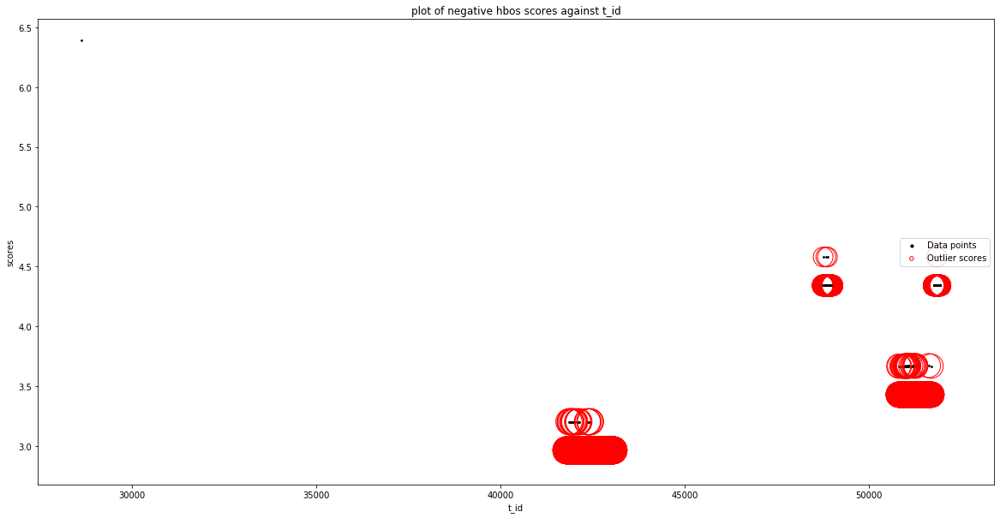

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_iat_min', 'log_start_time']
input parameters are being used instead of default values
contamin

No valid feature
No Valid columns found for combination of  ['fwd_psh_flags', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_psh_flags', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_psh_flags', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_psh_flags', 'bwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_psh_flags', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found f

No valid feature
No Valid columns found for combination of  ['fwd_psh_flags', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_psh_flags', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_psh_flags', 'a_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_psh_flags', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_psh_flags', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_psh_f

No valid feature
No Valid columns found for combination of  ['bwd_psh_flags', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_psh_flags', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_psh_flags', 'fwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_psh_flags', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_psh_flags', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['

No valid feature
No Valid columns found for combination of  ['bwd_psh_flags', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_psh_flags', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_psh_flags', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_psh_flags', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_psh_flags', 'active_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combinati

No valid feature
No Valid columns found for combination of  ['fwd_urg_flags', 'flow_bytes_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_urg_flags', 'flow_pkts_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_urg_flags', 'flow_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_urg_flags', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_urg_flags', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for comb

No valid feature
No Valid columns found for combination of  ['fwd_urg_flags', 'bwd_packet_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_urg_flags', 'bwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_urg_flags', 'subflow_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_urg_flags', 'subflow_fwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_urg_flags', 'subflow_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid

No valid feature
No Valid columns found for combination of  ['bwd_urg_flags', 'fwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_urg_flags', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_urg_flags', 'fwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_urg_flags', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_urg_flags', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid featu

No valid feature
No Valid columns found for combination of  ['bwd_urg_flags', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_urg_flags', 'down_up_ratio']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_urg_flags', 'avg_packet_size']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_urg_flags', 'fwd_segment_size_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_urg_flags', 'bwd_segment_size_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns foun

No valid feature
No Valid columns found for combination of  ['fwd_header_length', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_header_length', 'src_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_header_length', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_header_length', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_header_length', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['

No valid feature
No Valid columns found for combination of  ['fwd_header_length', 'packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_header_length', 'packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_header_length', 'packet_length_variance']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_header_length', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_header_length', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid featur

No valid feature
No Valid columns found for combination of  ['fwd_header_length', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_header_length', 'service_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_header_length', 'service_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_header_length', 'client_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_header_length', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Val

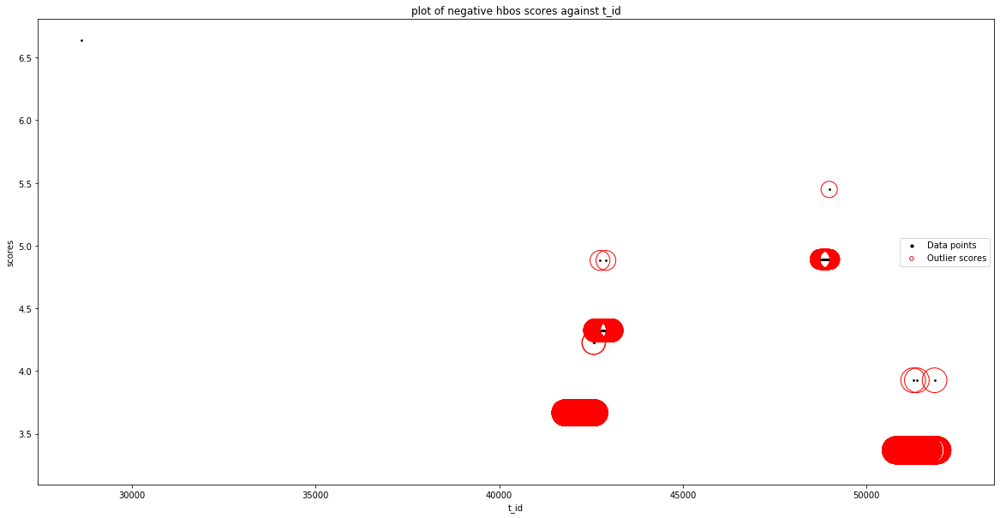

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_header_length', 'src_port'], dtype='object')
Number of Inliers :  2366
Number of Outliers :  145
Outlier index: 0
Outlier score: 6.621930041582345
Outlier index: 1468
Outlier score: 4.8177438894382005
Outlier index: 2358
Outlier score: 4.422630522469009
Outlier index: 2359
Outlier score: 4.422630522469009
Outlier index: 2360
Outlier score: 4.422630522469009
Outlier index: 2361
Outlier score: 4.422630522469009
Outlier index: 2362
Outlier score: 4.422630522469009
Outlier index: 2363
Outlier score: 4.422630522469009
Outlier index: 2364
Outlier score: 4.422630522469009
Outlier index: 2365
Outlier score: 4.422630522469009
Outlier index: 2366
Outlier score: 4.422630522469009
Outlier inde

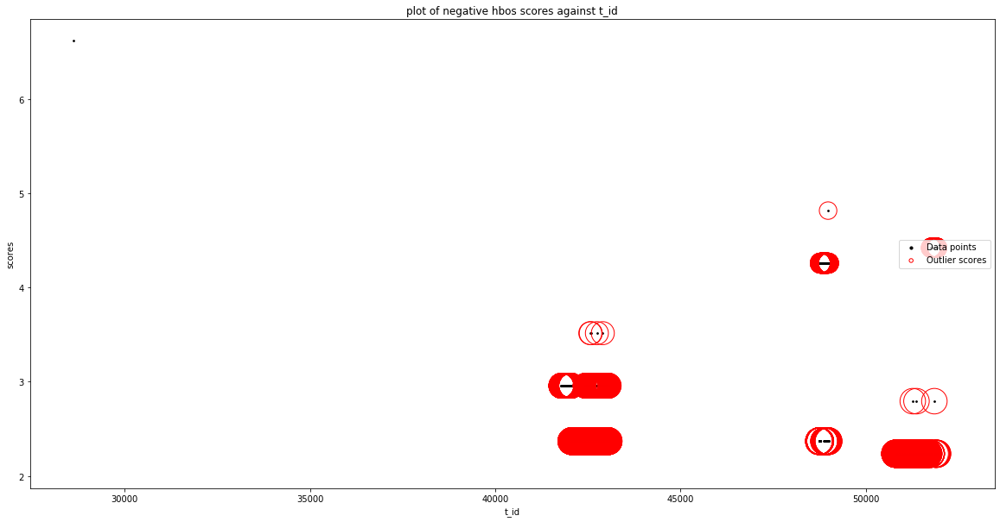

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_header_length', 'flow_duration'], dtype='object')
Number of Inliers :  2502
Number of Outliers :  9
Outlier index: 0
Outlie

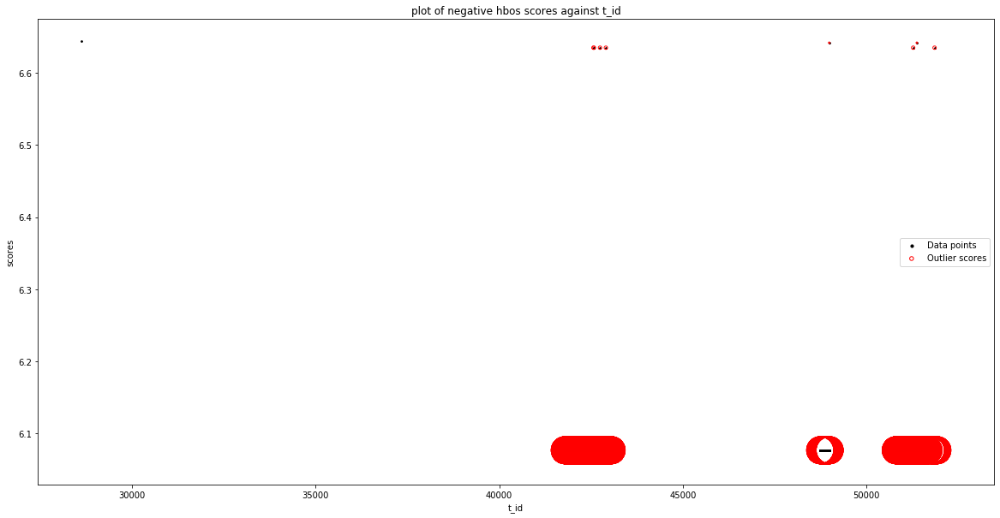

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_header_length', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2467
Number of Outliers :  44
Outlier index: 0
Outlier score: 6.643384435541678
Outlier index: 113
Outlier score: 6.082655663045818
Outlier index: 311
Outlier score: 6.0779099770015526
Outlier index: 703
Outlier score: 6.0779099770015526
Outlier index: 721
Outlier score: 6.0779099770015526
Outlier index: 763
Outlier score: 6.640876510082552
Outlier index: 775
Outlier score: 6.641074613377355
Out

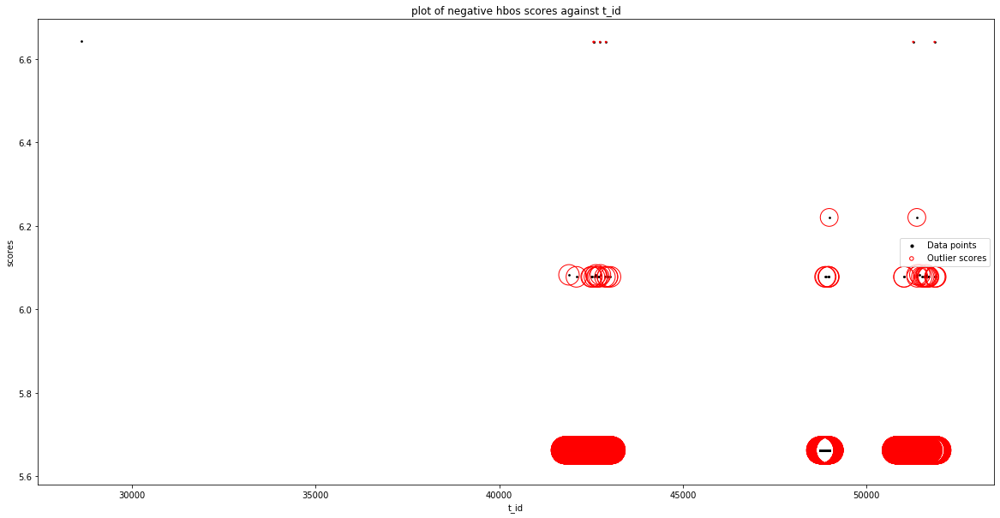

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_header_length', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
Outlier index: 0
Outlier score: 6.412370413424332
Outlier index: 1
Outlier score: 5.852434108535108
Outlier index: 63
Outlier score: 5.895806804180991
Outlier index: 113
Outlier score: 5.852434108535108
Outlier index: 115
Outlier score: 5.852434108535108
Outlier index: 174
Outlier score: 6.058784724078015
Outlier index: 193
Outlier score: 5.895806804180991
Outlier index: 311
Outlier score: 5.852434108535108
Outlier index: 426
Outlier score: 6.034344318027401
Outlier index: 498
Outlier score: 5.852434108535108
Outlier index: 553
Outlier score: 5.895806804

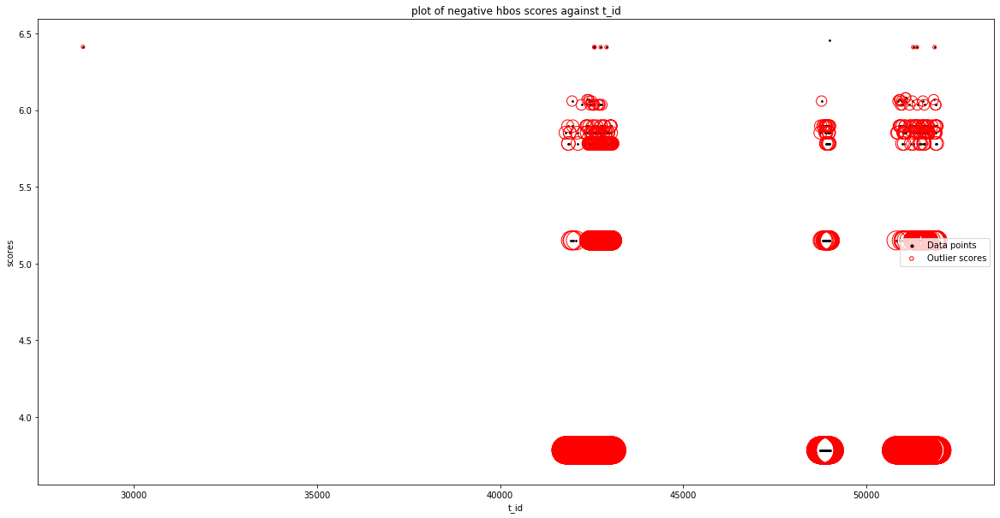

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_header_length', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2355
Number of Outliers :  156
Outlier index: 0
Outlier score: 6.53268880926381
Outlier index: 113
Outlier score: 6.073799954832879
Outlier index: 115
Outlier score: 5.9727525043745855
Outlier index: 174
Outlier score: 5.9727525043745855
Outlier index: 193
Outlier score: 5.9727525043745855
Outlier index: 311
Outlier score: 6.0656456790290685
Outlier index: 498
Outlier score: 6.03189227133318
Outlier index: 564
Outlier score: 6.03189227133318
Outlier index: 574
Outlier score: 6.0656456790290685
Outlier index: 616
Outlier score: 5.9727525043745855
Outlier index: 625
Outlier score: 5.9727525

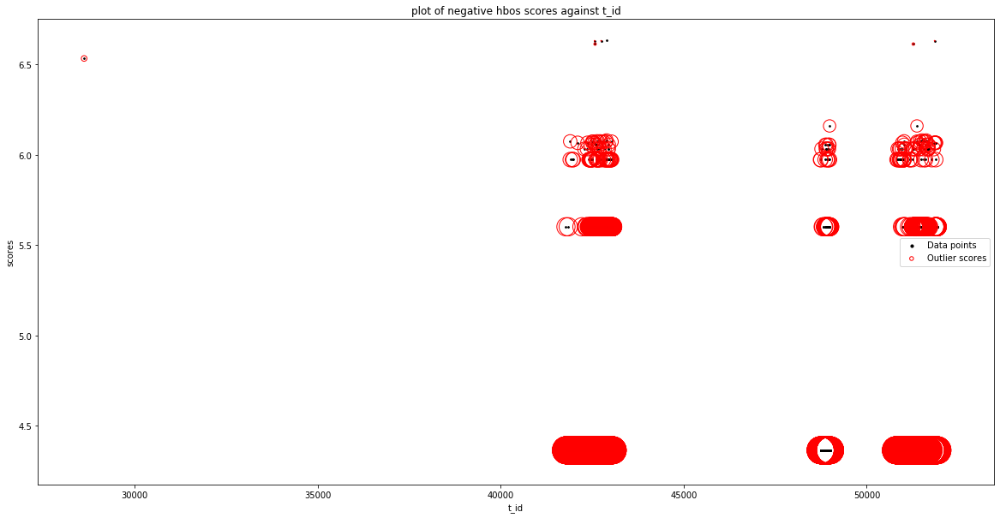

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'bwd_packet_length_

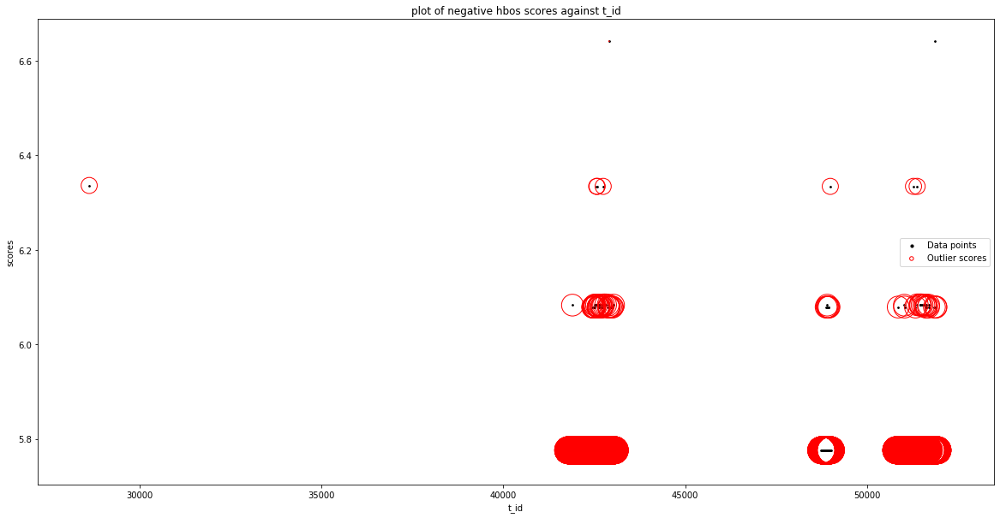

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_header_length', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2398
Number of Outliers :  113
Outlier index: 653
Outlier score: 5.959637976910832
Outlier index: 663
Outlier score: 6.067795981254994
Outlier index: 667
Outlier score: 6.0193571395975445
Outlier index: 674
Outlier score: 6.0193571395975445
Outlier index: 687
Outlier score: 5.959637976910832
Outlier index: 689
Outlier score: 5.959637976910832
Outlier index: 694
Outlier score: 5.959637976910832
Outlier index: 701
Outlier score: 5.959637976910832
Outlier index: 707
Outlier score: 6.0193571395975445
Outlier index: 709
Outlier score: 5.959637976910832
Outlier index: 713
Outlier score: 5.959637976910832
Outlier index: 732
Outlier score: 5.959637976910832
Outlier index: 747
Outlier score: 5.959637976910832
Outlier index: 749
Outlier score: 6.067795981254994
Outlier index: 762
Outlier score: 5.959

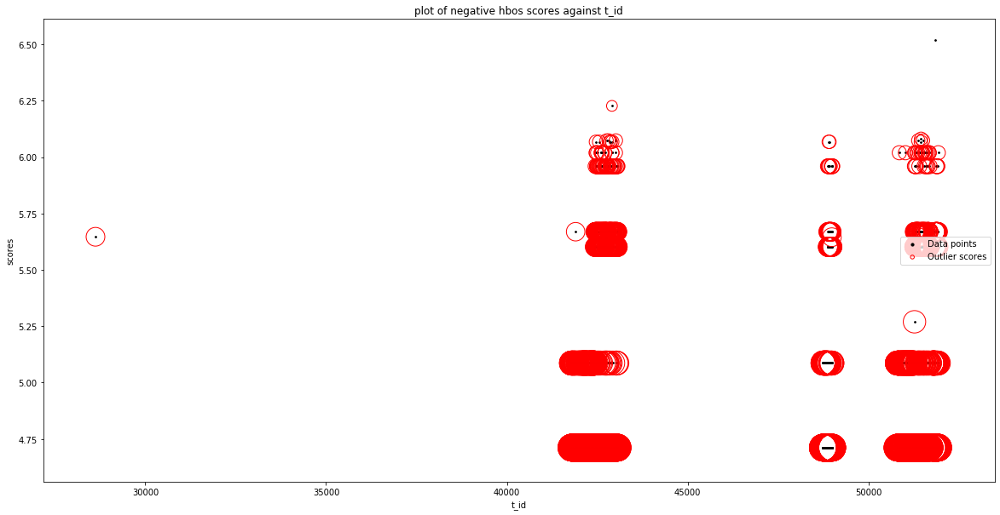

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_header_length', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2501
Number of Outliers :  10
Outlier index: 0
Outlier score: 6.616629087482071
Outlier index: 763
Outlier score: 6.614715553533545
Outlier index: 775
Outlier score: 6.614715553533545
Outlier index: 937
Outlier score: 6.614715553533545
Outlier index: 1090
Outlier score: 6.614715553533545
Outlier index: 1468
Outlier score: 6.641658242850588
Outlier index: 1949
Outlier score: 6.614715553533545
Outlier index: 2030
Outlier score: 6.083635471909891
Outlier index: 2046
Outlier score: 6.614715553533545
Outlier index: 2437
Outlier score: 6.614715553533545
Total number of outliers found: 10
Silhouetter Score: 0.981
davies bouldin Score: 1.401
calinski_harabasz Score: 458.941


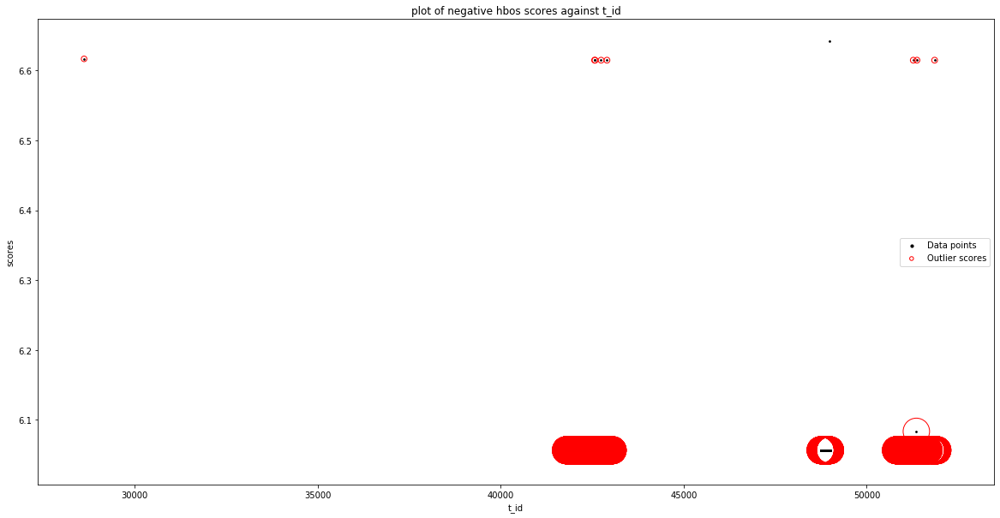

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_header_length', 'flow_iat_min'], dtype='object')
Number of Inliers :  2499
Number of Outliers :  12
Outlier index: 0
Outlier score: 6.168565660758819
Outlier index: 199
Outlier score: 6.082973557814089
Outlier index: 631
Outlier score: 6.082973557814089
Outlier index: 763
Outlier score: 6.166652126810293
Outlier index: 775
Outlier score: 6.166652126810293
Outlier index: 937
Outlier score: 6.166652126810293
Outlier index: 1090
Outlier score: 6.166652126810293
Outlier index: 1359
Outlier s

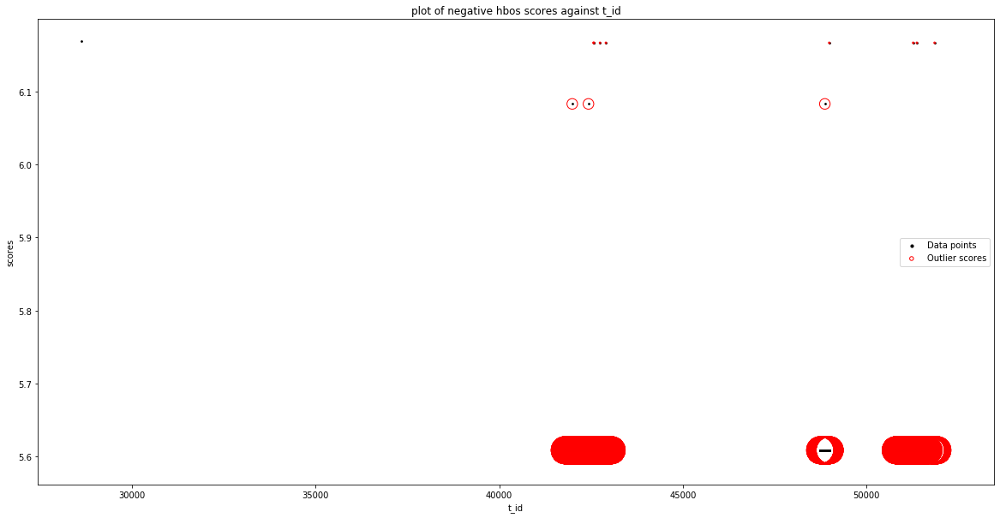

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_header_length', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2450
Number of Outliers :  61
Outlier i

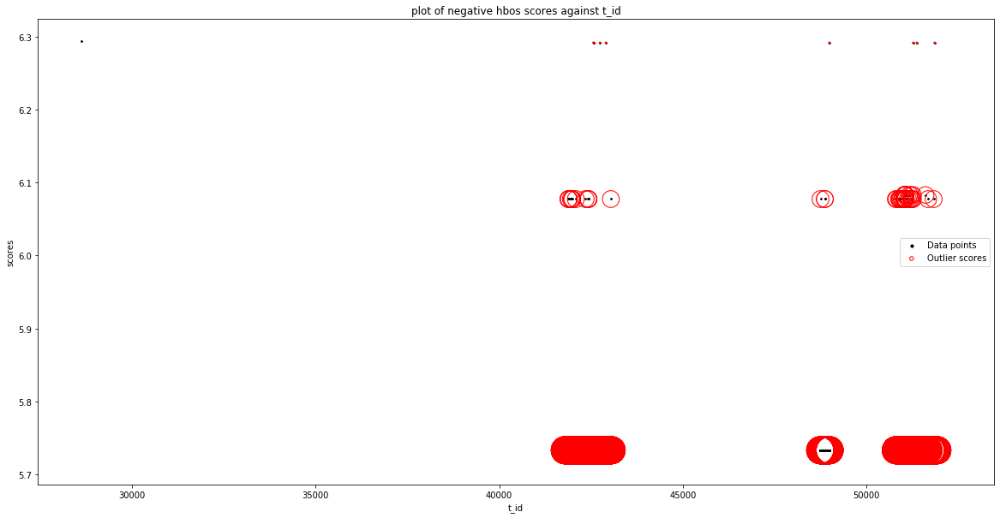

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_header_length', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2436
Number of Outliers :  75
Outlier in

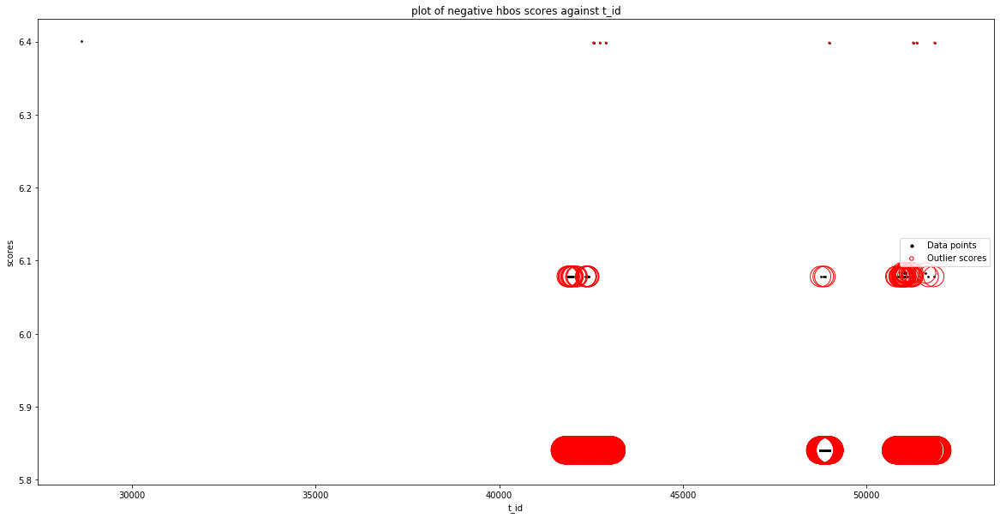

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'fwd_header_length']
input parameters are being used

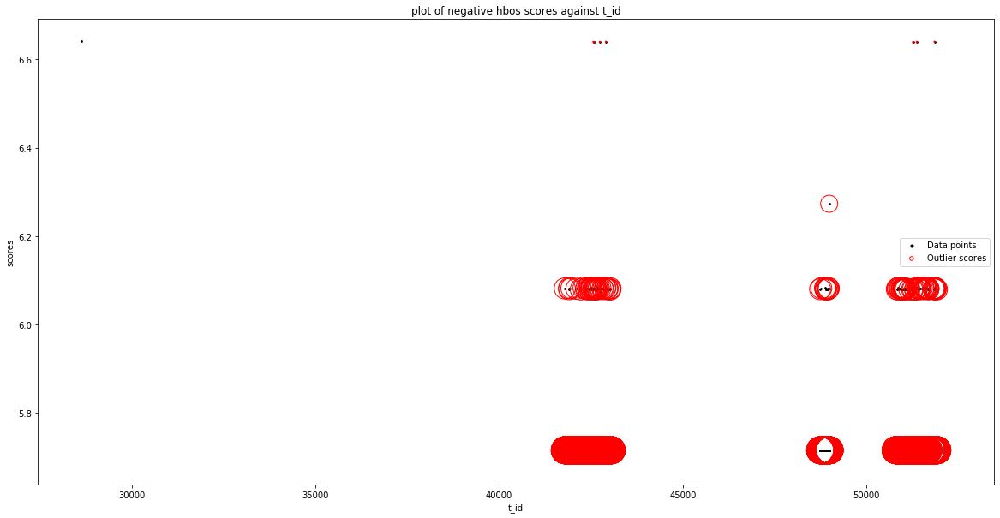

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_header_length', 'psh_flag_count'], dtype='object')
Number of Inliers :  2502
Number of Outliers :  9
Outlier index: 0
Outlier score: 6.642215292449642
Outlier index: 763
Outlier score: 6.636207532654079
Outlier index: 775
Outlier score: 4.886263872949444
Outlier index: 937
Outlier score: 6.636

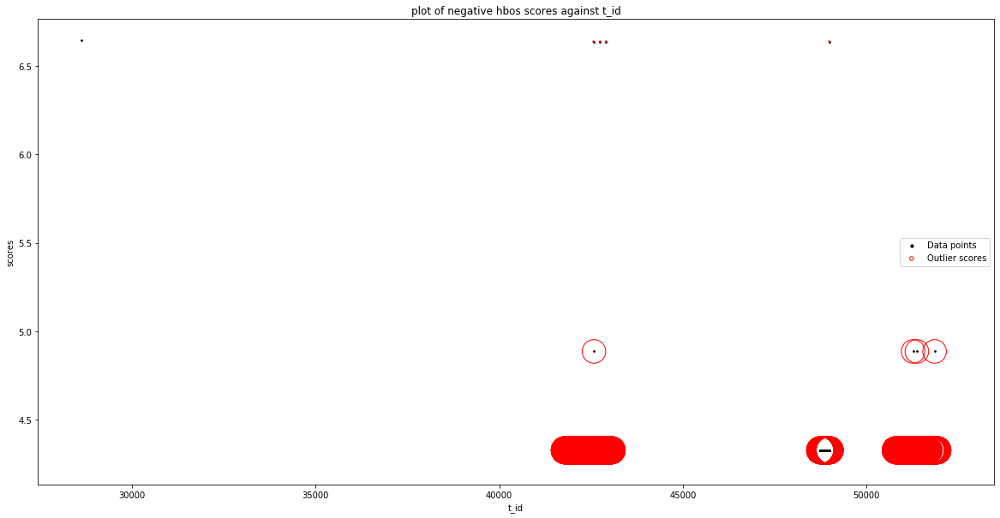

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'down_up_ratio']
input parameters are being used

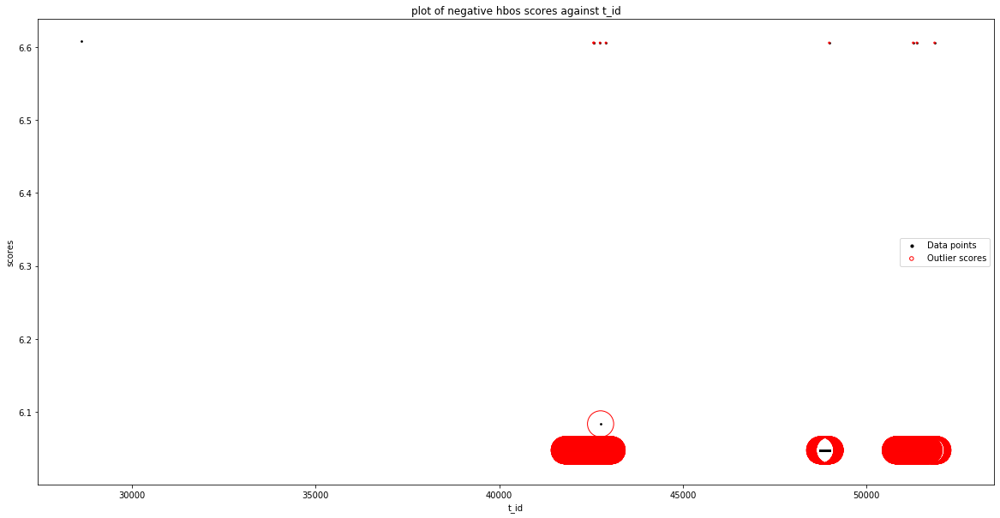

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'active_max']
input parameters are being used i

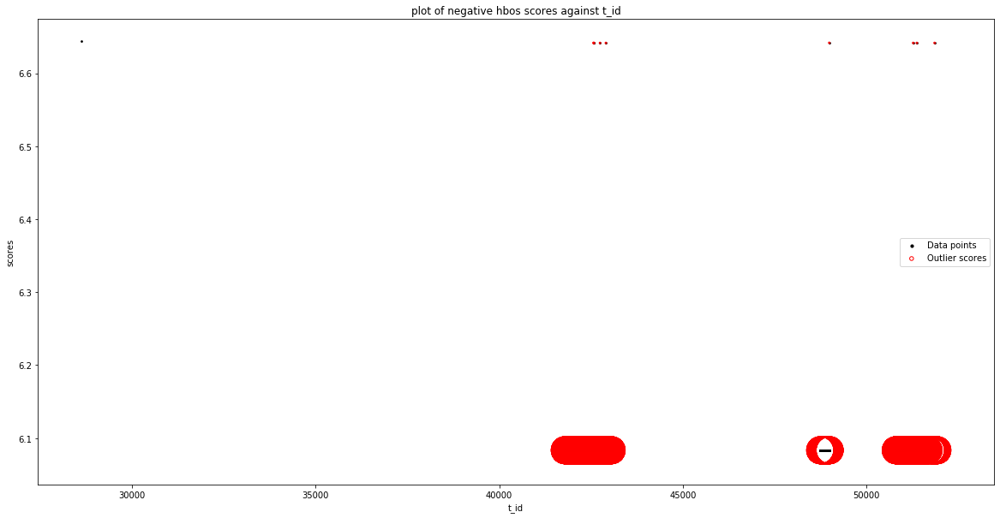

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_header_length', 'idle_max'], dtype='object')
Number of Inliers :  2502
Number of Outliers :  9
Outlier index: 0
Outlier score: 6.643385041175551
Outlier index: 763
Outlier score: 6.215380824508411
Outlier index: 775
Outlier score: 6.215380824508411
Outlier index: 937
Outlier score: 6.215380824508411
Outlier index: 1090
Outlier score: 6.215380824508411
Outlier index: 1468
Outlier score: 6.215380824508411
Outlier index: 1949
Outlier score: 6.215380824508411
Outlier index: 2046
Outlier score: 6.215380824508411
Outlier index: 2437
Outlier score: 6.215380824508411
Total number of outliers found: 9
Silhouetter Score: 0.779
davies bouldin Score: 1.550
calinski_harabasz Score: 128.203


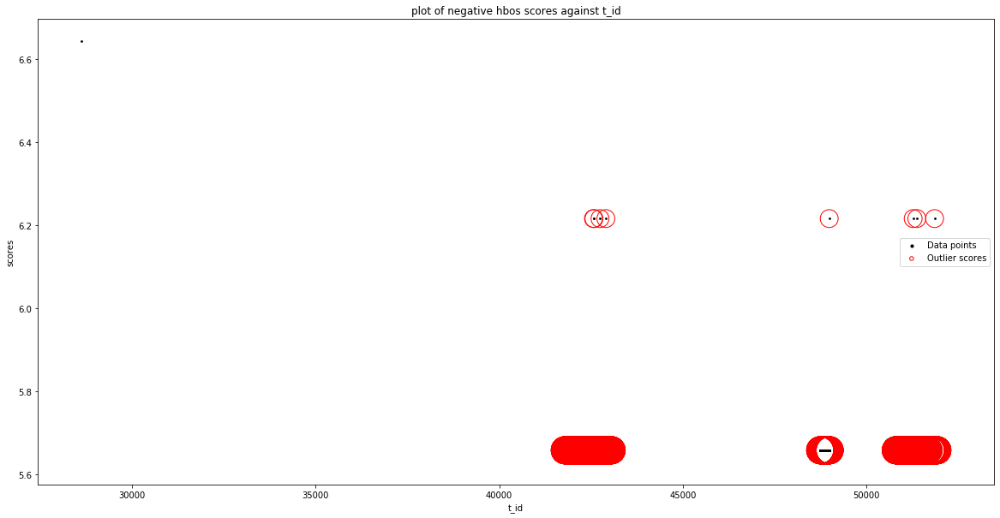

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_header_length', 'a_id'], dtype='object')
Number of Inliers :  2502
Number of Outliers :  9
Outlier index: 0
Outlier score: 6.6413351450617215
Outlier index: 763
Outlier score: 4.915297301373061
Outlier index: 775
Outlier score: 4.915297301373061
Outlier index: 937
Outlier score: 4.915297301373061
Outlier index: 1090
Outlier score: 4.915297301373061
Outlier index: 1468
Outlier score: 4.915297301373061
Outlier index: 1949
Outlier score: 5.2607969207849035
Outlier index: 2046
Outlier score: 5.26

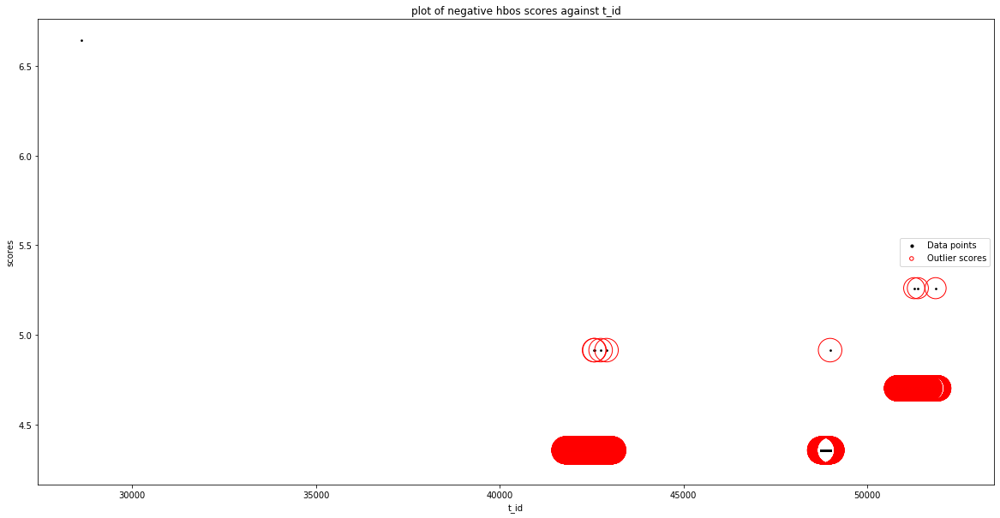

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'service_physical_ip']
input parameters are being us

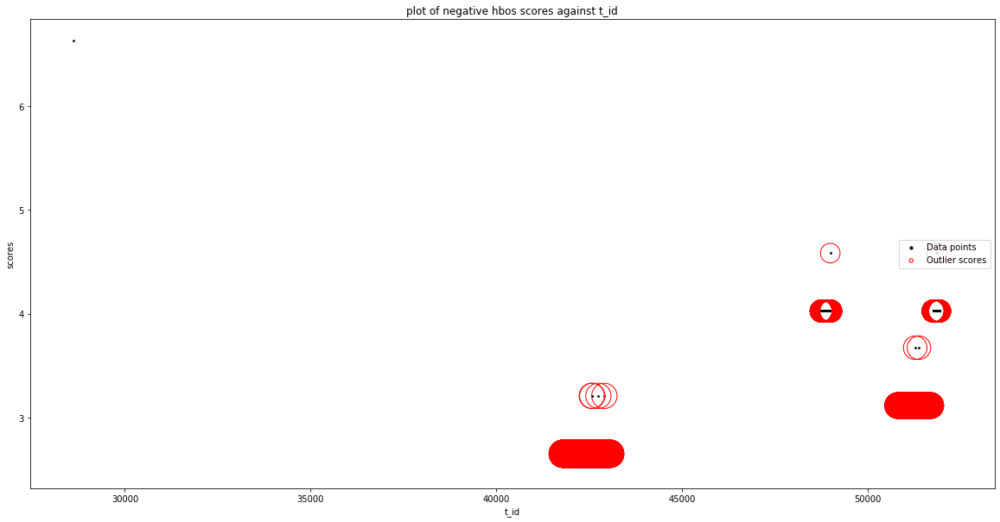

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_header_length', 'log_start_time']
input parameters are being used inst

No valid feature
No Valid columns found for combination of  ['fwd_packets_per_sec', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packets_per_sec', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packets_per_sec', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packets_per_sec', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packets_per_sec', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No V

No valid feature
No Valid columns found for combination of  ['fwd_packets_per_sec', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packets_per_sec', 'idle_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packets_per_sec', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packets_per_sec', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packets_per_sec', 'a_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combina

No valid feature
No Valid columns found for combination of  ['bwd_packets_per_sec', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packets_per_sec', 'flow_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packets_per_sec', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packets_per_sec', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packets_per_sec', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid col

No valid feature
No Valid columns found for combination of  ['bwd_packets_per_sec', 'subflow_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packets_per_sec', 'subflow_fwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packets_per_sec', 'subflow_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packets_per_sec', 'subflow_bwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packets_per_sec', 'fwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30


No valid feature
No Valid columns found for combination of  ['packet_length_min', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_min', 'fwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_min', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_min', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_min', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbor

No valid feature
No Valid columns found for combination of  ['packet_length_min', 'down_up_ratio']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_min', 'avg_packet_size']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_min', 'fwd_segment_size_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_min', 'bwd_segment_size_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_min', 'fwd_bytes_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid f

No valid feature
No Valid columns found for combination of  ['packet_length_max', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_max', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_max', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_max', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_max', 'flow_duration']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combinatio

No valid feature
No Valid columns found for combination of  ['packet_length_max', 'packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_max', 'packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_max', 'packet_length_variance']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_max', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_max', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid featur

No valid feature
No Valid columns found for combination of  ['packet_length_max', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_max', 'service_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_max', 'service_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_max', 'client_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_max', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Val

No valid feature
No Valid columns found for combination of  ['packet_length_mean', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_mean', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_mean', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_mean', 'bwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_mean', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns fou

No valid feature
No Valid columns found for combination of  ['packet_length_mean', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_mean', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_mean', 'active_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_mean', 'active_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_mean', 'idle_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for c

No valid feature
No Valid columns found for combination of  ['packet_length_std', 'flow_pkts_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_std', 'flow_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_std', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_std', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_std', 'flow_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns 

No valid feature
No Valid columns found for combination of  ['packet_length_std', 'bwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_std', 'subflow_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_std', 'subflow_fwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_std', 'subflow_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_std', 'subflow_bwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid fe

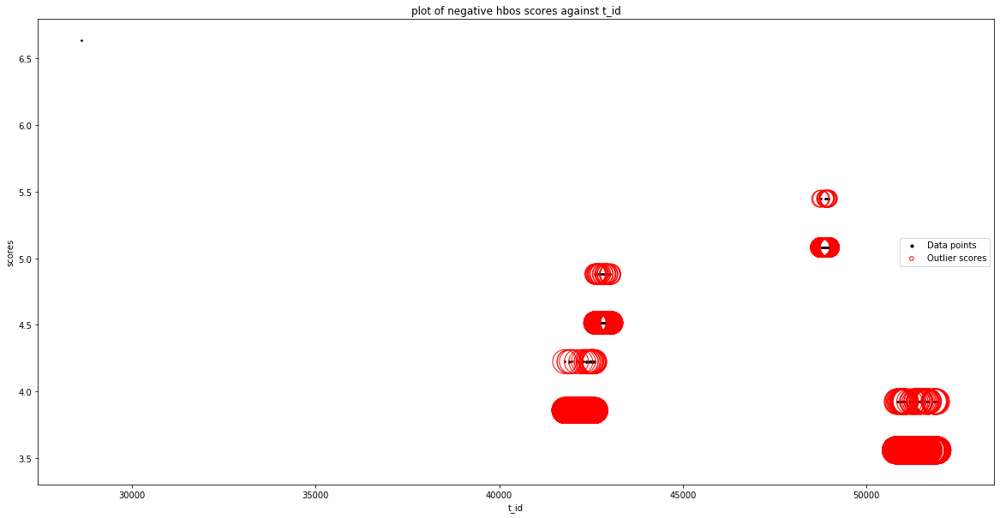

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['packet_length_variance', 'src_port'], dtype='object')
Number of Inliers :  2357
Number of Outliers :  154
Outlier index: 0
Outlier score: 6.6204509138822445
Outlier index: 1363
Outlier score: 4.8188791189888684
Outlier index: 1377
Outlier score: 4.815553236193777
Outlier index: 1380
Outlier score: 4.817828011659746
Outlier index: 1384
Outlier score: 4.815553236193777
Outlier index: 1390
Outlier score: 4.817127698647973
Outlier index: 1421
Outlier score: 4.815553236193777
Outlier index: 1433
Outlier score: 4.815553236193777
Outlier index: 1446
Outlier score: 4.817828011659746
Outlier index: 1452
Outlier score: 4.818003143042136
Outlier index: 1459
Outlier score: 4.818003143042136
O

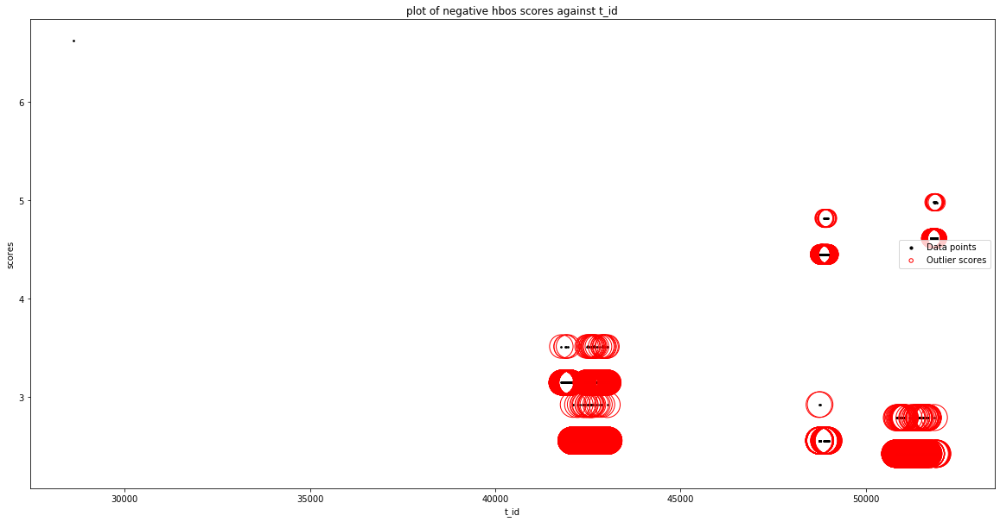

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['packet_length_variance', 'flow_duration'], dtype='object')
Number of Inliers :  2394
Number of Outliers :  

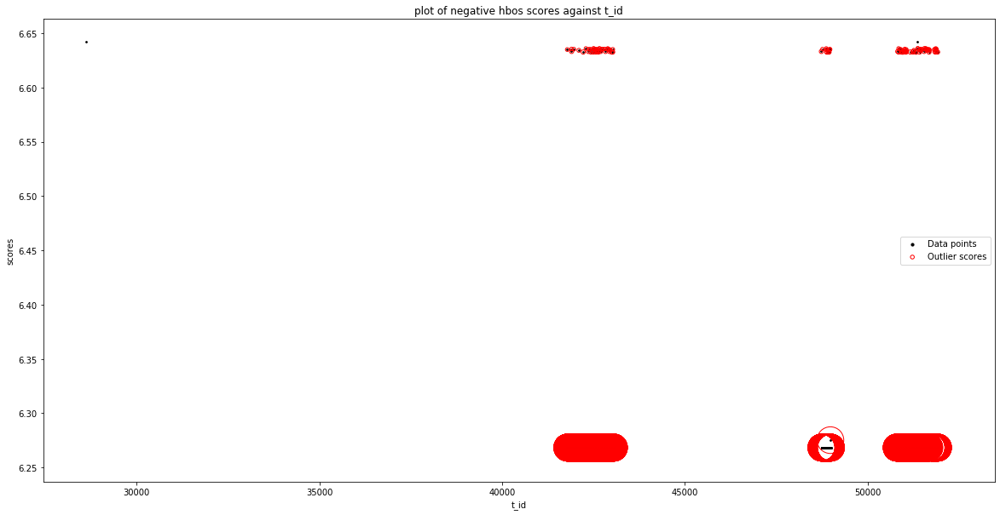

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['packet_length_variance', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2395
Number of Outliers :  116
Outlier index: 0
Outlier score: 6.641905307841576
Outlier index: 1
Outlier score: 6.220389198345414
Outlier index: 113
Outlier score: 6.641288014146692
Outlier index: 115
Outlier score: 6.218639052802363
Outlier index: 174
Outlier score: 6.220739482372294
Outlier index: 311
Outlier score: 6.635316557152022
Outlier index: 426
Outlier score: 6.21811442

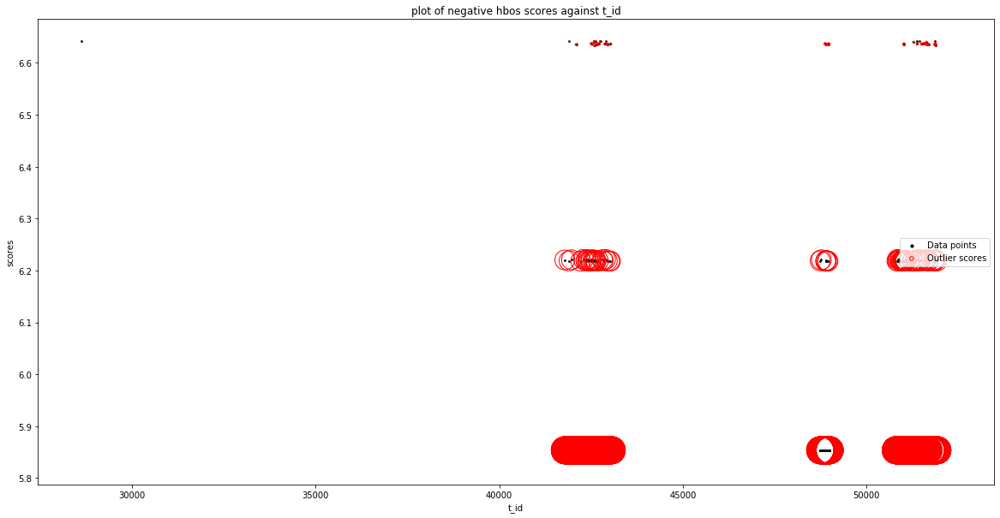

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['packet_length_variance', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
Outlier index: 0
Outlier score: 6.4108912857242295
Outlier index: 1
Outlier score: 6.41054100169735
Outlier index: 63
Outlier score: 6.087371402497187
Outlier index: 113
Outlier score: 6.411066459635982
Outlier index: 115
Outlier score: 6.408790856154299
Outlier index: 174
Outlier score: 6.617241901267136
Outlier index: 193
Outlier score: 6.087371402497187
Outlier index: 311
Outlier score: 6.409840688685577
Outlier index: 426
Outlier score: 6.590176435723674
Outlier index: 498
Outlier score: 6.411592109026472
Outlier index: 553
Outlier score: 6

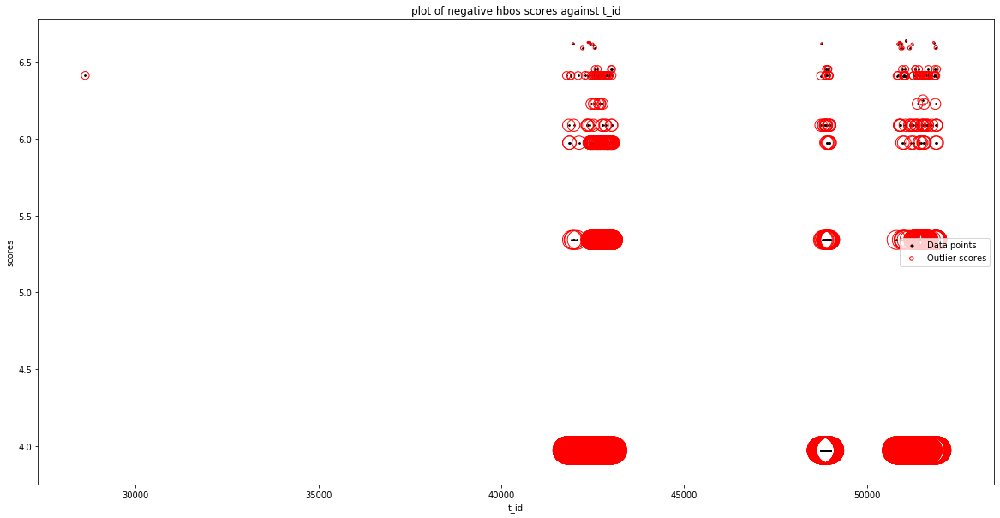

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['packet_length_variance', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2341
Number of Outliers :  170
Outlier index: 0
Outlier score: 6.531209681563707
Outlier index: 1
Outlier score: 6.159211991870581
Outlier index: 113
Outlier score: 6.632432305933753
Outlier index: 115
Outlier score: 6.529109251993777
Outlier index: 174
Outlier score: 6.531209681563707
Outlier index: 193
Outlier score: 6.164317102690782
Outlier index: 311
Outlier score: 6.623052259179538
Outlier index: 426
Outlier score: 6.156937216404613
Outlier index: 498
Outlier score: 6.591050271824544
Outlier index: 564
Outlier score: 6.5882490189523715
Outlier index: 574
Outlier score: 6.6

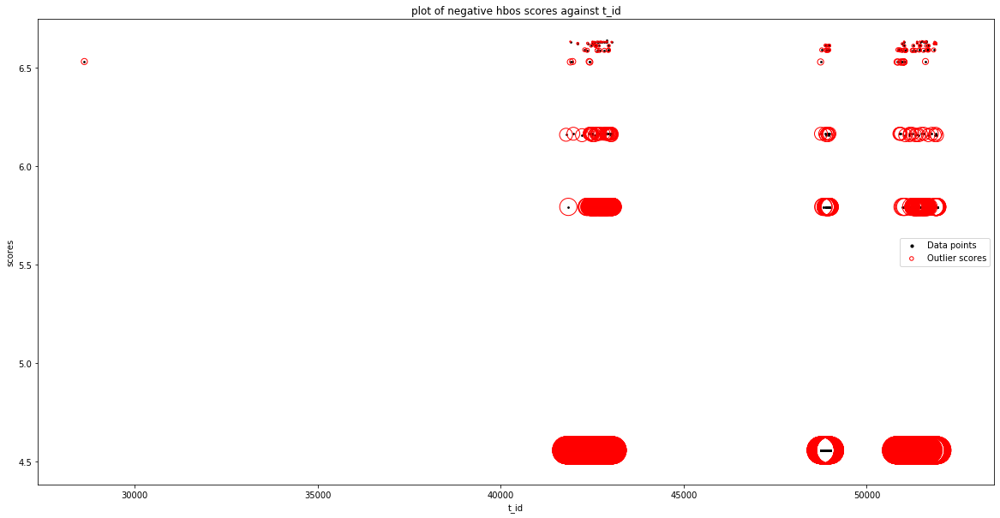

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_varia

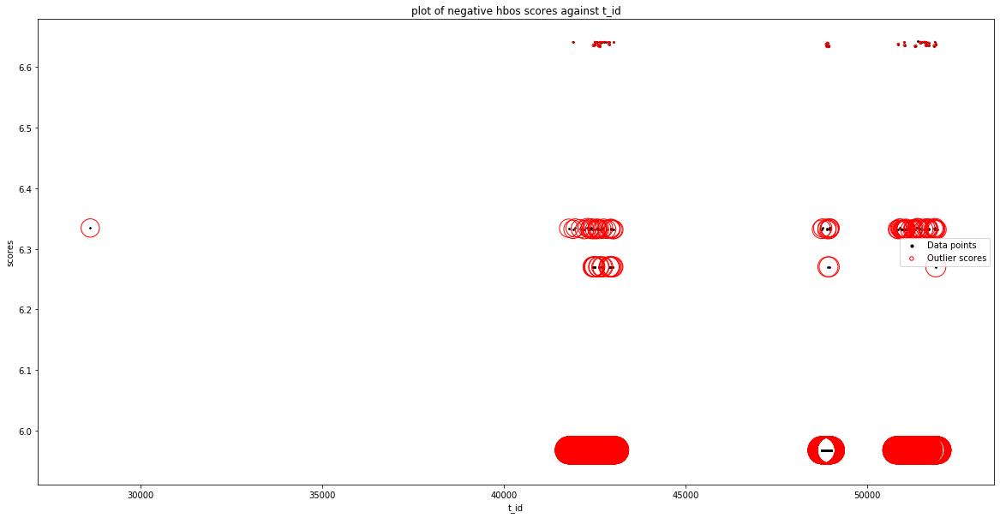

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['packet_length_variance', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2380
Number of Outliers :  131
Outlier index: 113
Outlier score: 6.227822073986941
Outlier index: 653
Outlier score: 6.151202575227028
Outlier index: 663
Outlier score: 6.25936057957119
Outlier index: 667
Outlier score: 6.576763719748014
Outlier index: 674
Outlier score: 6.210921737913741
Outlier index: 687
Outlier score: 6.151202575227028
Outlier index: 689
Outlier score: 6.151202575227028
Outlier index: 694
Outlier score: 6.151202575227028
Outlier index: 701
Outlier score: 6.151202575227028
Outlier index: 703
Outlier score: 6.16135213056038
Outlier index: 707
Outlier score: 6.577639164142177
Outlier index: 709
Outlier score: 6.151202575227028
Outlier index: 713
Outlier score: 6.151202575227028
Outlier index: 721
Outlier score: 6.227471747430699
Outlier index: 732
Outlier score: 6.151

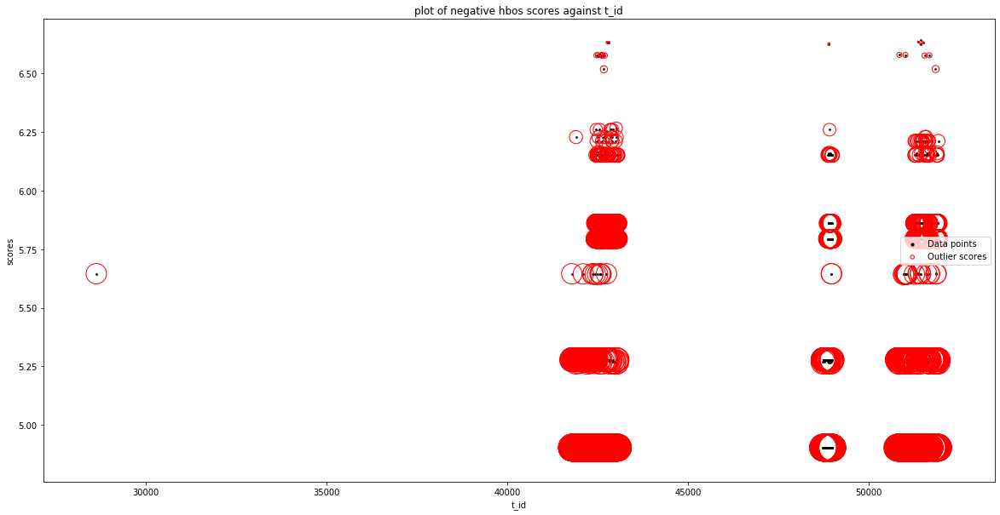

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['packet_length_variance', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2393
Number of Outliers :  118
Outlier index: 0
Outlier score: 6.615149959781969
Outlier index: 1
Outlier score: 6.614799675755089
Outlier index: 113
Outlier score: 6.615325133693721
Outlier index: 115
Outlier score: 6.613049530212038
Outlier index: 174
Outlier score: 6.615149959781969
Outlier index: 311
Outlier score: 6.614099362743317
Outlier index: 426
Outlier score: 6.61252490028912
Outlier index: 498
Outlier score: 6.615850783084212
Outlier index: 564
Outlier score: 6.613049530212038
Outlier index: 574
Outlier score: 6.615149959781969
Outlier index: 616
Outlier score: 6.615149959781969
Outlier index: 634
Outlier score: 6.61252490028912
Outlier index: 667
Outlier score: 6.614099362743317
Outlier index: 697
Outlier score: 6.61252490028912
Outlier index: 703
Outlier score: 6.616026042116

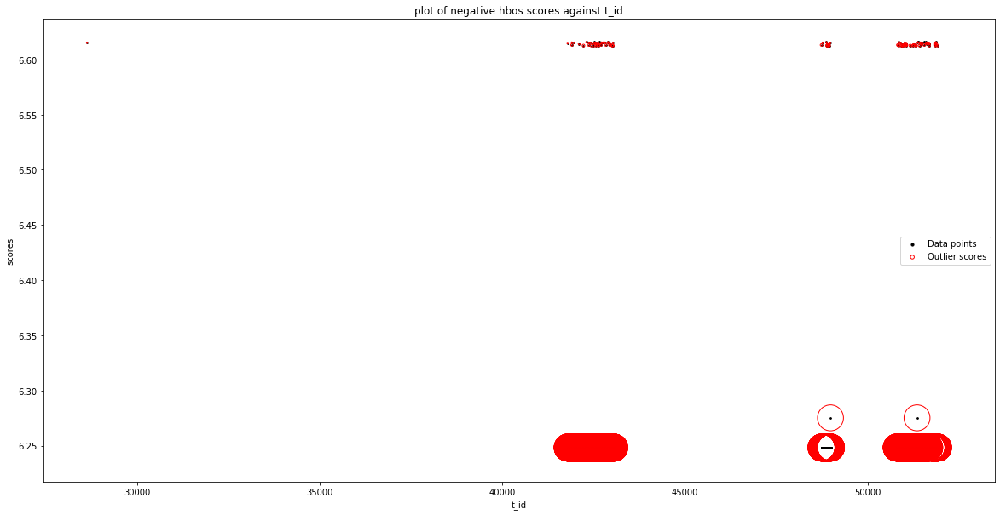

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['packet_length_variance', 'flow_iat_min'], dtype='object')
Number of Inliers :  2392
Number of Outliers :  119
Outlier index: 0
Outlier score: 6.1670865330587175
Outlier index: 1
Outlier score: 6.166736249031837
Outlier index: 113
Outlier score: 6.16726170697047
Outlier index: 115
Outlier score: 6.164986103488786
Outlier index: 174
Outlier score: 6.1670865330587175
Outlier index: 199
Outlier score: 6.274538156130285
Outlier index: 311
Outlier score: 6.166035936020065
Outlier index: 

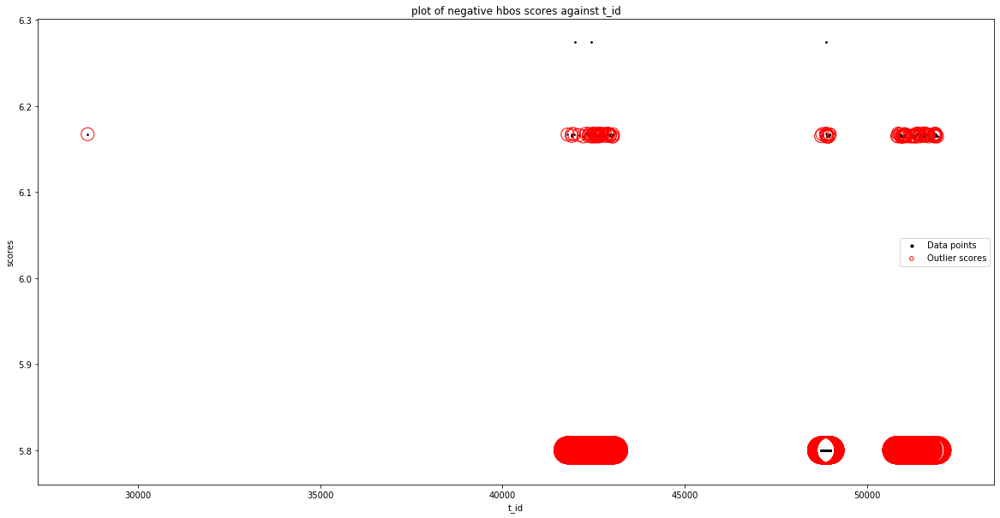

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['packet_length_variance', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2343
Number of

Silhouetter Score: 0.888
davies bouldin Score: 0.956
calinski_harabasz Score: 2025.461


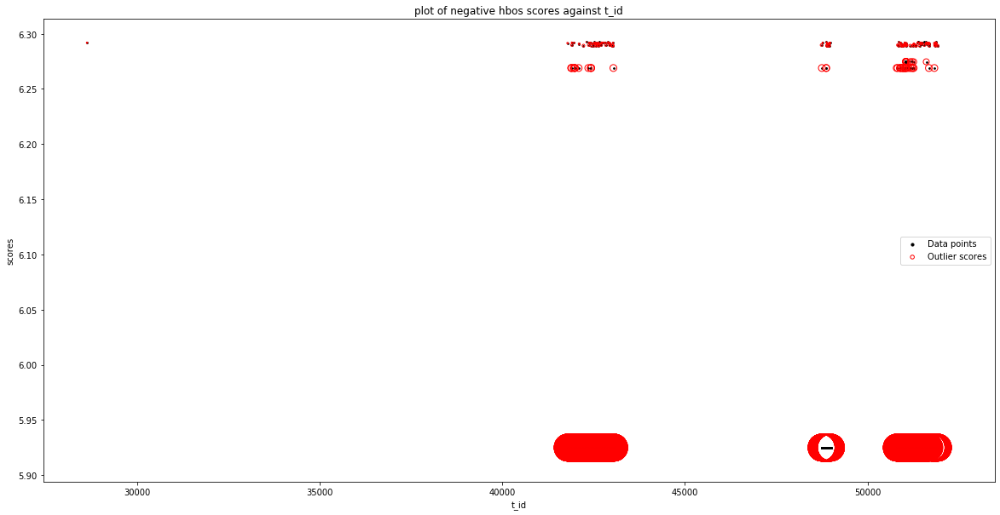

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['packet_length_variance', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2334
Number of 

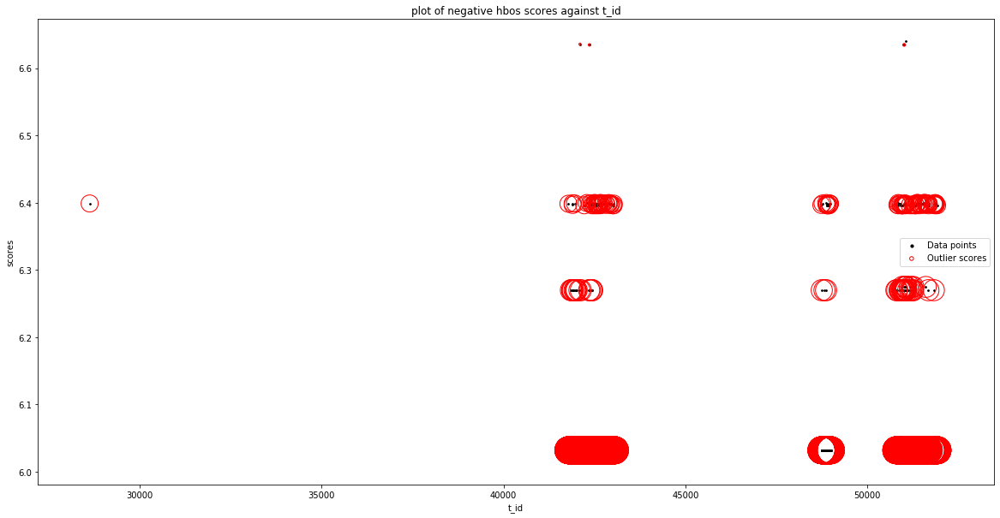

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'fwd_header_length']
input 

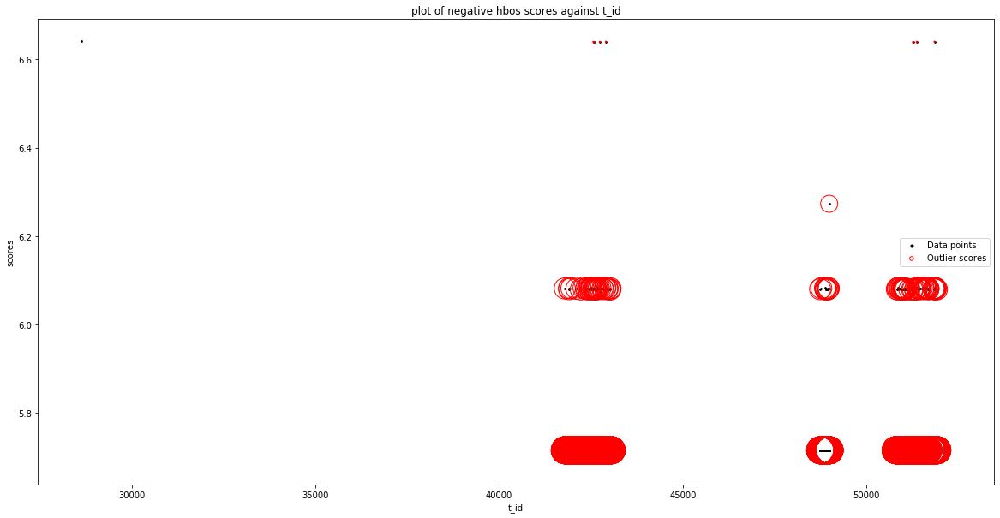

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'packet

Silhouetter Score: 0.936
davies bouldin Score: 0.480
calinski_harabasz Score: 7382.067


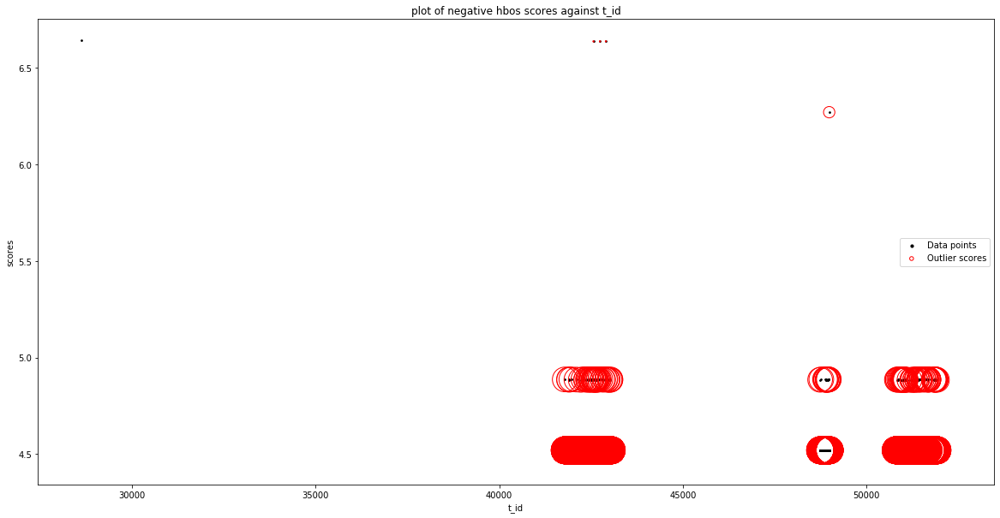

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'down_up_ratio']
input 

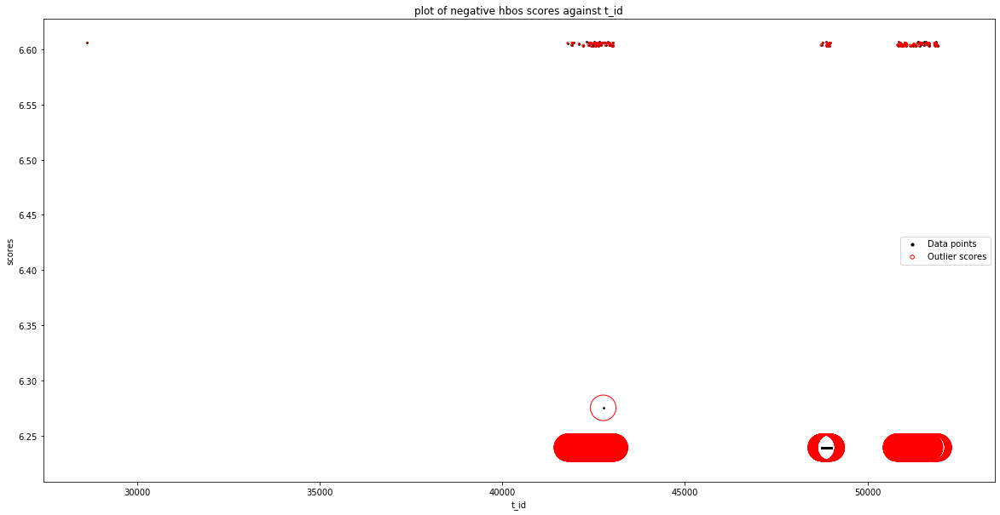

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'active_max']
input pa

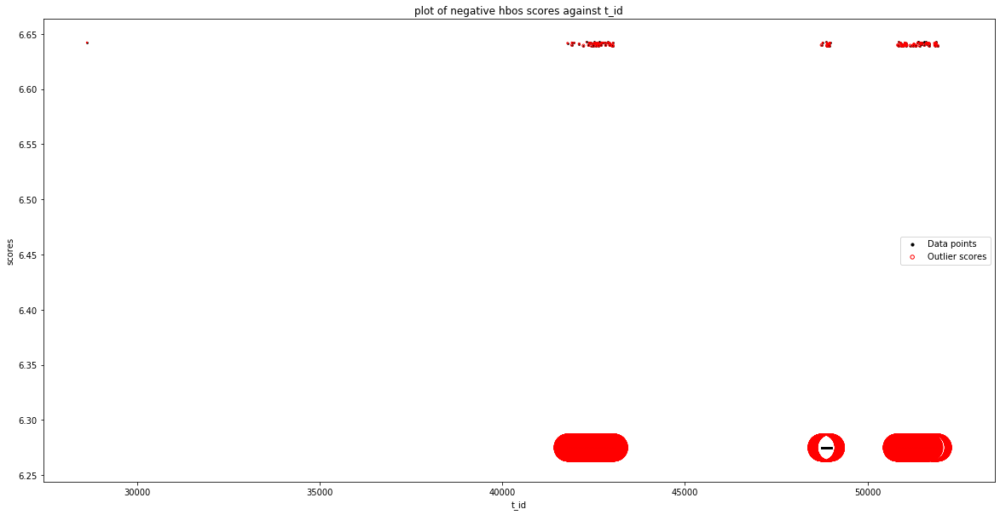

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['packet_length_variance', 'idle_max'], dtype='object')
Number of Inliers :  2395
Number of Outliers :  116
Outlier index: 0
Outlier score: 6.6419059134754495
Outlier index: 1
Outlier score: 6.215464946729956
Outlier index: 113
Outlier score: 6.215990404668587
Outlier index: 115
Outlier score: 6.213714801186905
Outlier index: 174
Outlier score: 6.215815230756835
Outlier index: 311
Outlier score: 6.2147646337181826
Outlier index: 426
Outlier score: 6.213190171263987
Outlier index: 498
Outlier score: 6.216516054059078
Outlier index: 564
Outlier score: 6.213714801186905
Outlier index: 574
Outlier score: 6.215815230756835
Outlier index: 616
Outlier score: 6.215815230756835
Outlier ind

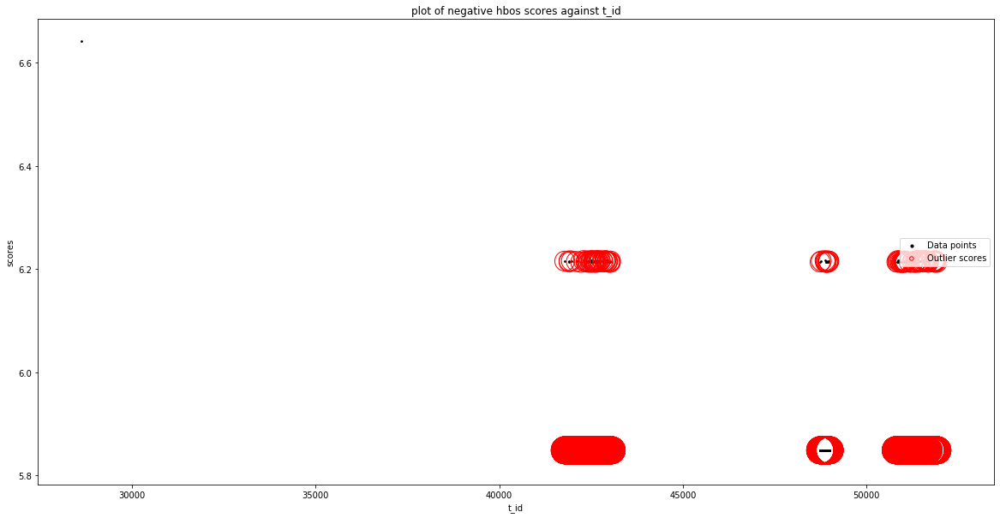

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['packet_length_variance', 'a_id'], dtype='object')
Number of Inliers :  2395
Number of Outliers :  116
Outlier index: 0
Outlier score: 6.63985601736162
Outlier index: 1
Outlier score: 4.9153814235946065
Outlier index: 113
Outlier score: 4.915906881533238
Outlier index: 115
Outlier score: 4.913631278051556
Outlier index: 174
Outlier score: 4.915731707621487
Outlier index: 311
Outlier score: 4.914681110582834
Outlier index: 426
Outlier score: 4.913106648128638
Outlier index: 498
Outlier sc

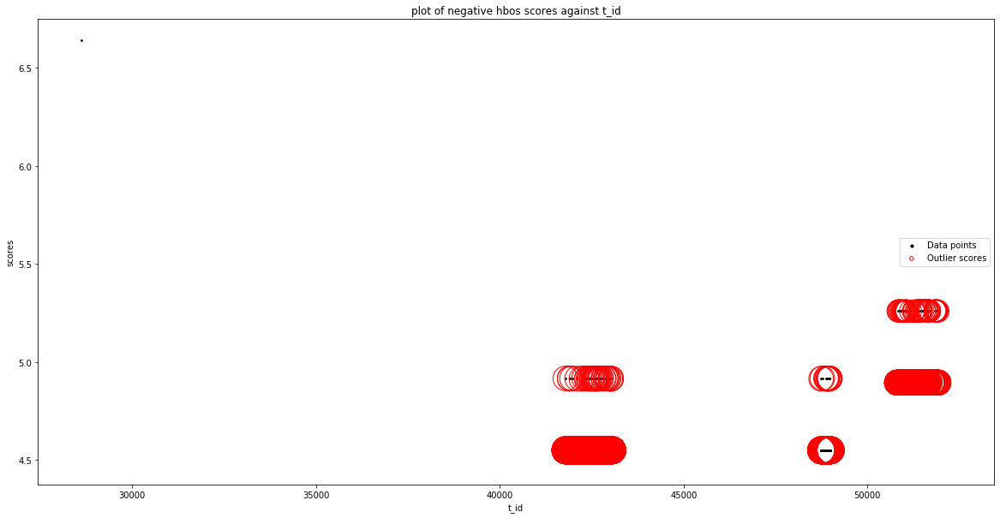

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'service_physical_ip']
inpu

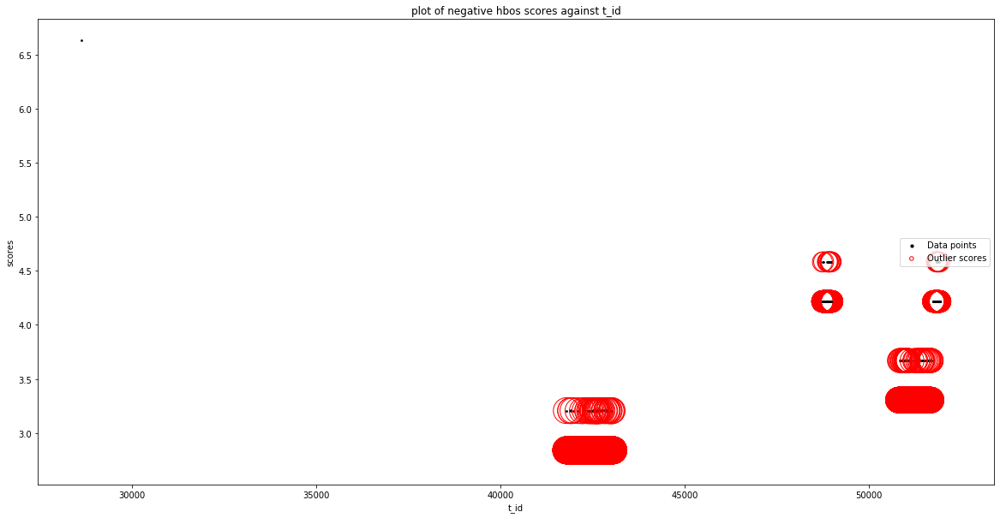

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['packet_length_variance', 'log_start_time']
input param

No valid feature
No Valid columns found for combination of  ['fin_flag_count', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fin_flag_count', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fin_flag_count', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fin_flag_count', 'bwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fin_flag_count', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns fo

No valid feature
No Valid columns found for combination of  ['fin_flag_count', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fin_flag_count', 'a_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fin_flag_count', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fin_flag_count', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fin_flag_count', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of

No valid feature
No Valid columns found for combination of  ['syn_flag_count', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['syn_flag_count', 'fwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['syn_flag_count', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['syn_flag_count', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['syn_flag_count', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination o

No valid feature
No Valid columns found for combination of  ['syn_flag_count', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['syn_flag_count', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['syn_flag_count', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['syn_flag_count', 'active_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['syn_flag_count', 'active_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of

No valid feature
No Valid columns found for combination of  ['rst_flag_count', 'flow_bytes_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['rst_flag_count', 'flow_pkts_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['rst_flag_count', 'flow_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['rst_flag_count', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['rst_flag_count', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for

No valid feature
No Valid columns found for combination of  ['rst_flag_count', 'bwd_packet_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['rst_flag_count', 'bwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['rst_flag_count', 'subflow_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['rst_flag_count', 'subflow_fwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['rst_flag_count', 'subflow_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No 

Outlier index: 1478
Outlier score: 3.694443519963591
Outlier index: 1479
Outlier score: 3.694443519963591
Outlier index: 1480
Outlier score: 3.694443519963591
Outlier index: 1481
Outlier score: 3.694443519963591
Total number of outliers found: 242
Silhouetter Score: 0.076
davies bouldin Score: 3.002
calinski_harabasz Score: 44.218


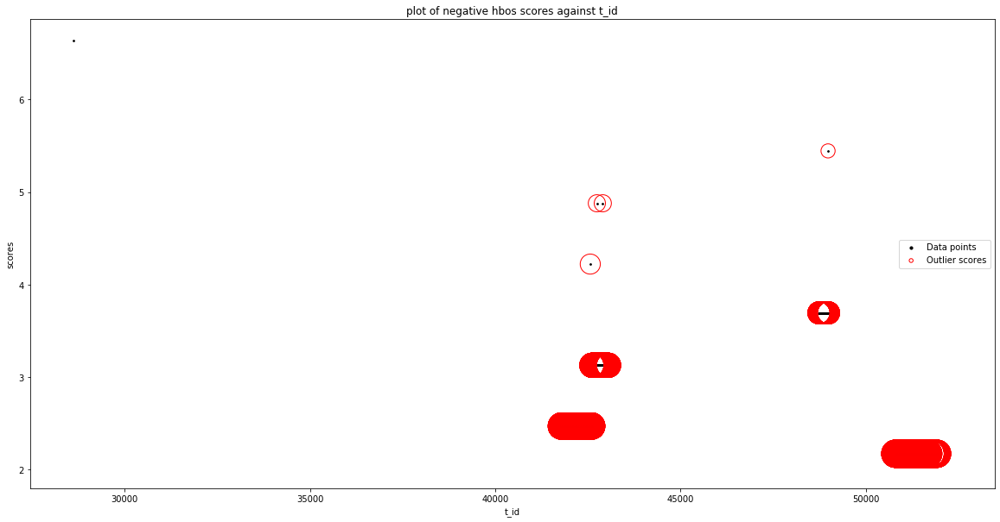

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['psh_flag_count', 'src_port'], dtype='object')
Number of Inliers :  2363
Number of Outliers :  148
Outlier index: 0
Outlier score: 6.620836282851473
Outlier index: 763
Outlier score: 3.512884742032331
Outlier index: 937
Outlier score: 3.512884742032331
Outlier index: 1090
Outlier score: 3.512884742032331
Outlier index: 1468
Outlier score: 4.814469438808818
Outlier index: 2358
Outlier score: 3.2274351830756887
Outlier index: 2359
Outlier score: 3.2274351830756887
Outlier index: 2360
Outlier score: 3.2274351830756887
Outlier index: 2361
Outlier score: 3.2274351830756887
Outlier index: 2362
Outlier score: 3.2274351830756887
Outlier index: 2363
Outlier score: 3.2274351830756887
Outlier index: 

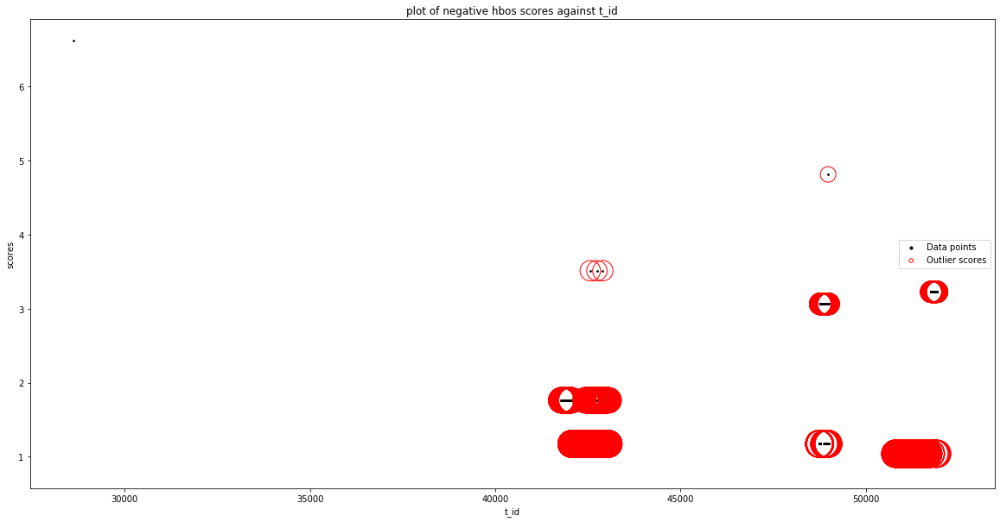

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['psh_flag_count', 'flow_duration'], dtype='object')
Number of Inliers :  2505
Number of Outliers :  6
Outlier index: 0
Outlier score: 6.6424

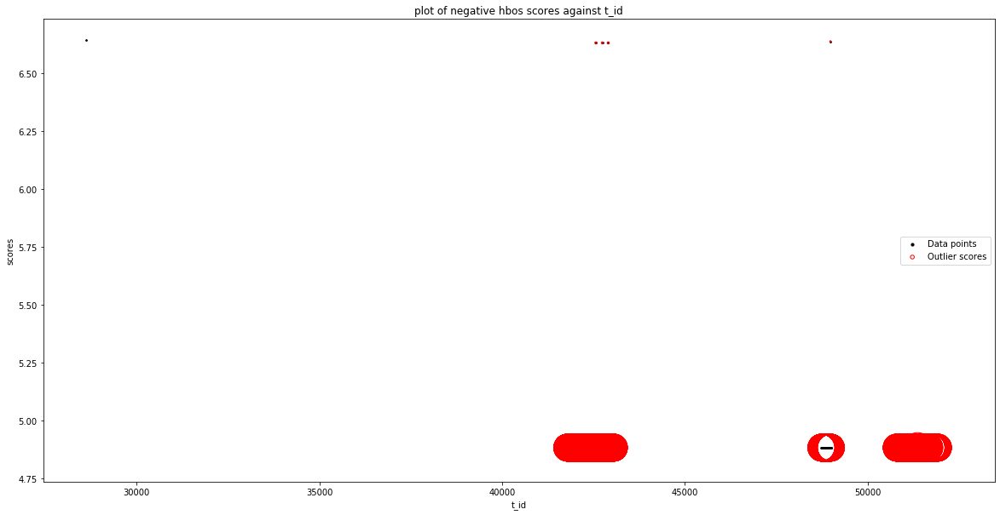

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['psh_flag_count', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2468
Number of Outliers :  43
Outlier index: 0
Outlier score: 6.642290676810804
Outlier index: 113
Outlier score: 4.8874603236524985
Outlier index: 311
Outlier score: 4.882714637608232
Outlier index: 703
Outlier score: 4.882714637608232
Outlier index: 721
Outlier score: 4.882714637608232
Outlier index: 763
Outlier score: 6.637602059453169
Outlier index: 775
Outlier score: 4.887856503043337
Outlier index:

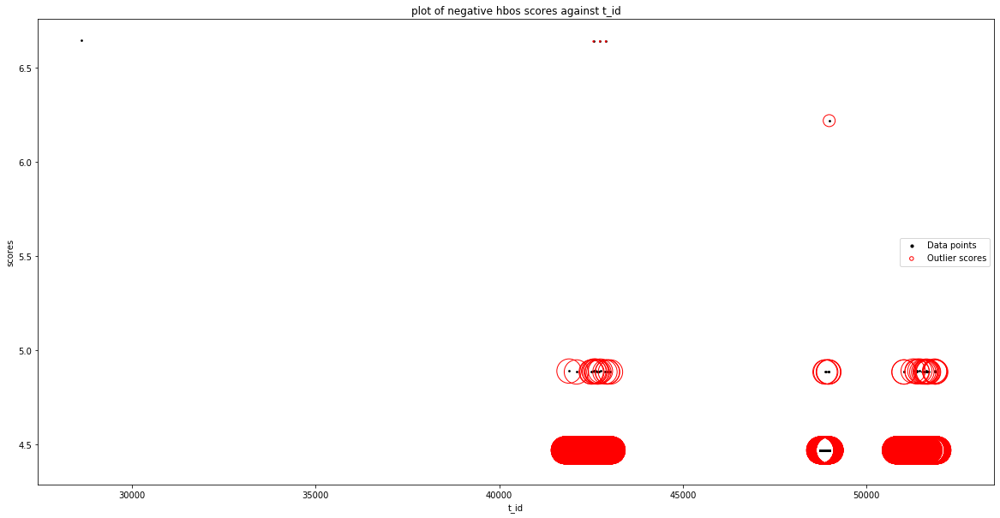

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['psh_flag_count', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
Outlier index: 0
Outlier score: 6.411276654693458
Outlier index: 1
Outlier score: 4.657238769141787
Outlier index: 63
Outlier score: 4.70061146478767
Outlier index: 113
Outlier score: 4.657238769141787
Outlier index: 115
Outlier score: 4.657238769141787
Outlier index: 174
Outlier score: 4.863589384684694
Outlier index: 193
Outlier score: 4.70061146478767
Outlier index: 311
Outlier score: 4.657238769141787
Outlier index: 426
Outlier score: 4.83914897863408
Outlier index: 498
Outlier score: 4.657238769141787
Outlier index: 553
Outlier score: 4.70061146478767
Out

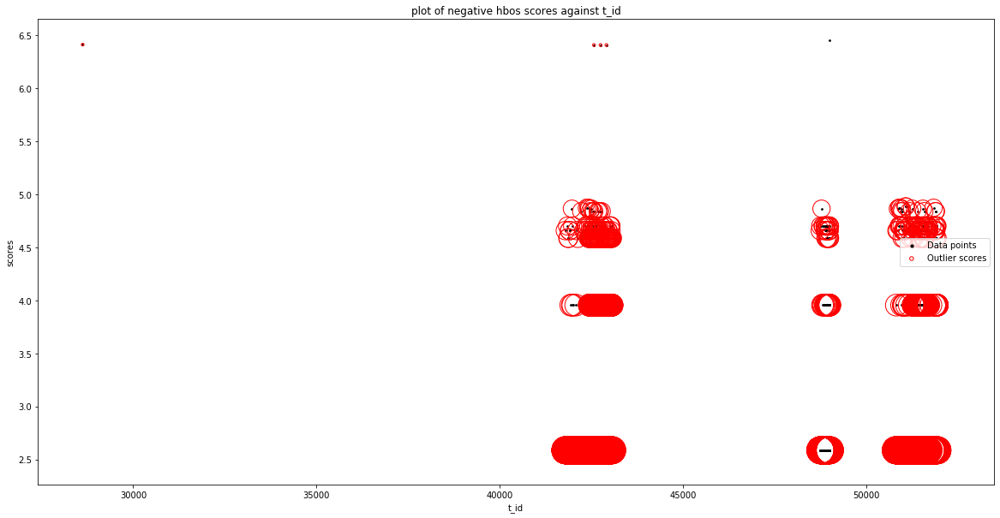

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['psh_flag_count', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2356
Number of Outliers :  155
Outlier index: 0
Outlier score: 6.531595050532935
Outlier index: 113
Outlier score: 4.878604615439558
Outlier index: 115
Outlier score: 4.777557164981265
Outlier index: 174
Outlier score: 4.777557164981265
Outlier index: 193
Outlier score: 4.777557164981265
Outlier index: 311
Outlier score: 4.870450339635748
Outlier index: 498
Outlier score: 4.836696931939859
Outlier index: 564
Outlier score: 4.836696931939859
Outlier index: 574
Outlier score: 4.870450339635748
Outlier index: 616
Outlier score: 4.777557164981265
Outlier index: 625
Outlier score: 4.777557164981265


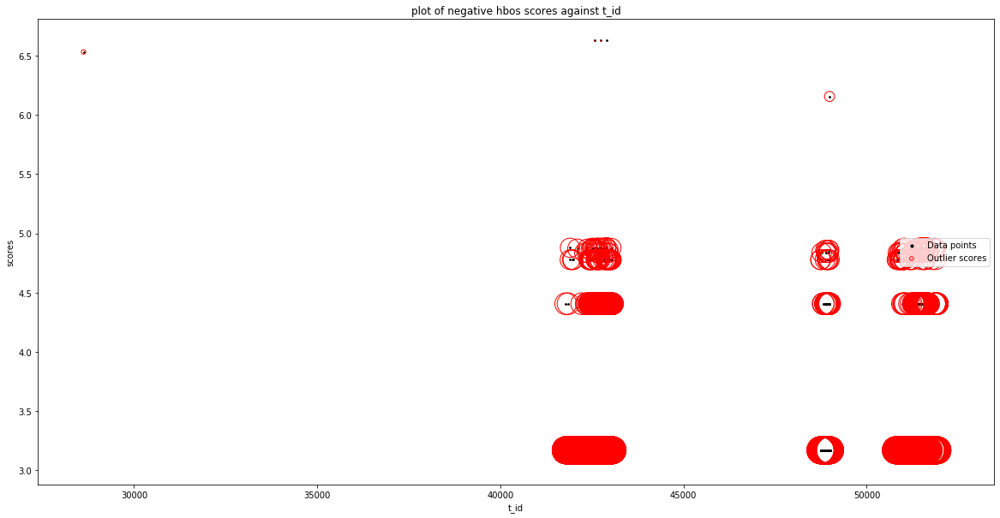

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'bwd_packet_length_std']
input par

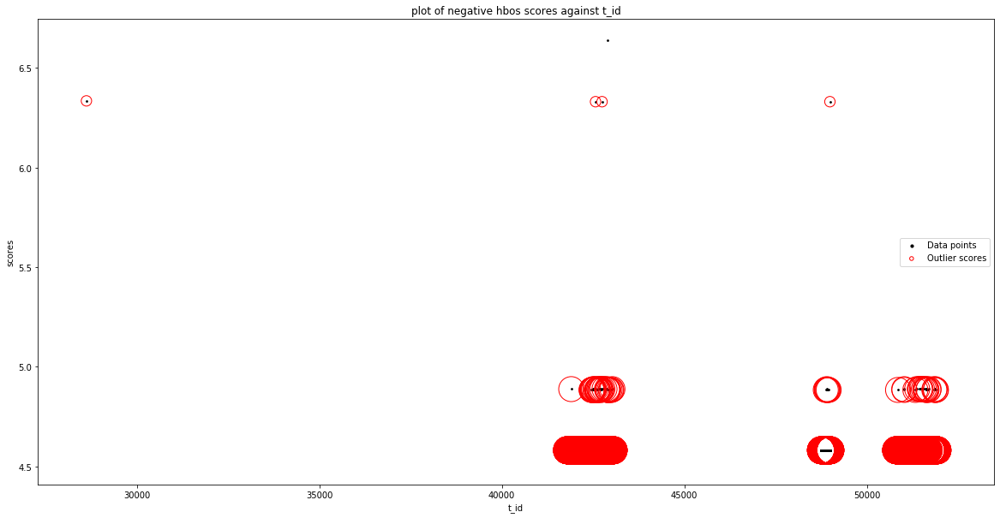

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['psh_flag_count', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2394
Number of Outliers :  117
Outlier index: 0
Outlier score: 5.6456461088311
Outlier index: 653
Outlier score: 4.7644426375175115
Outlier index: 663
Outlier score: 4.872600641861674
Outlier index: 667
Outlier score: 4.824161800204224
Outlier index: 674
Outlier score: 4.824161800204224
Outlier index: 687
Outlier score: 4.7644426375175115
Outlier index: 689
Outlier score: 4.7644426375175115
Outlier index: 694
Outlier score: 4.7644426375175115
Outlier index: 701
Outlier score: 4.7644426375175115
Outlier index: 707
Outlier score: 4.824161800204224
Outlier index: 709
Outlier score: 4.7644426375175115
Outlier index: 713
Outlier score: 4.7644426375175115
Outlier index: 732
Outlier score: 4.7644426375175115
Outlier index: 747
Outlier score: 4.7644426375175115
Outlier index: 749
Outlier score: 4.8726

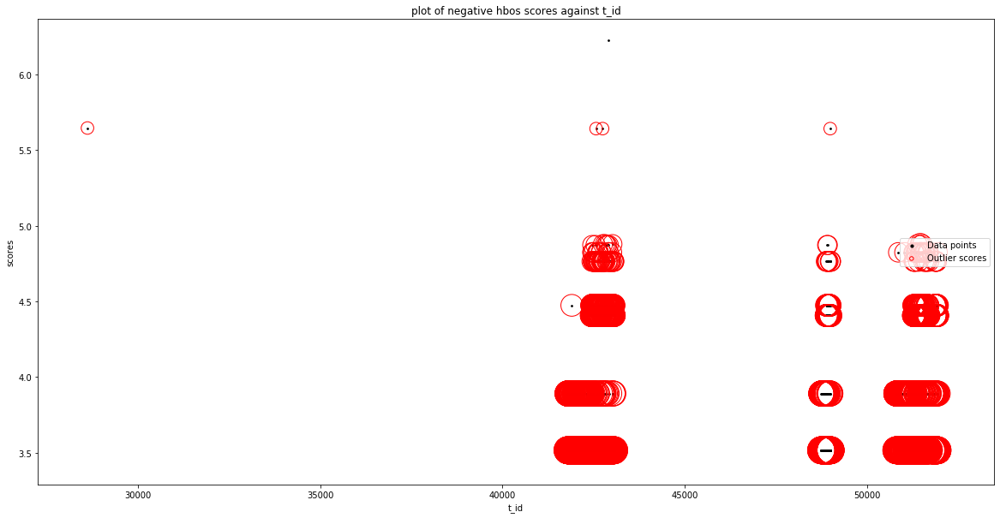

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['psh_flag_count', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2505
Number of Outliers :  6
Outlier index: 0
Outlier score: 6.615535328751197
Outlier index: 763
Outlier score: 6.611441102904161
Outlier index: 937
Outlier score: 6.611441102904161
Outlier index: 1090
Outlier score: 6.611441102904161
Outlier index: 1468
Outlier score: 6.638383792221205
Outlier index: 2030
Outlier score: 4.88844013251657
Total number of outliers found: 6
Silhouetter Score: 0.989
davies bouldin Score: 1.355
calinski_harabasz Score: 717.447


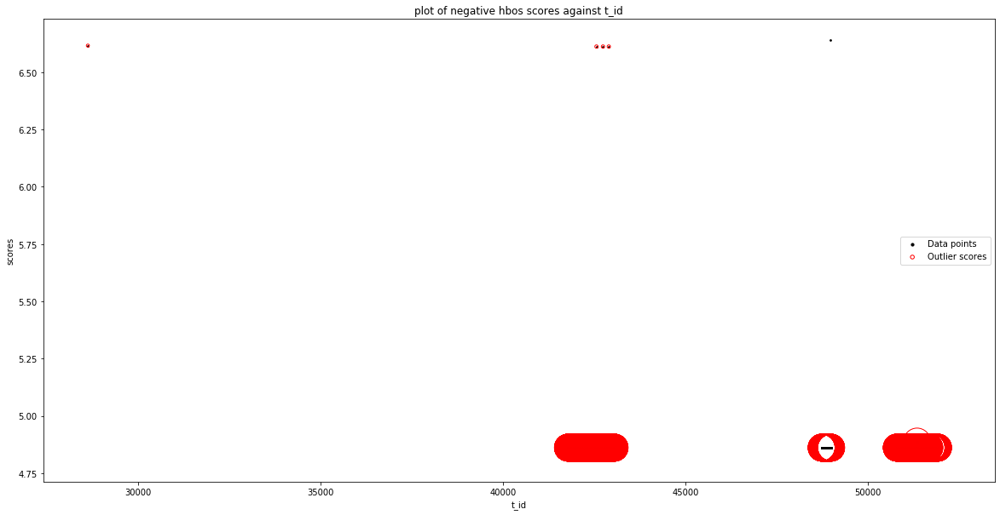

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['psh_flag_count', 'flow_iat_min'], dtype='object')
Number of Inliers :  2503
Number of Outliers :  8
Outlier index: 0
Outlier score: 6.167471902027946
Outlier index: 199
Outlier score: 4.8877782184207685
Outlier index: 631
Outlier score: 4.8877782184207685
Outlier index: 763
Outlier score: 6.163377676180909
Outlier index: 937
Outlier score: 6.163377676180909
Outlier index: 1090
Outlier score: 6.163377676180909
Outlier index: 1359
Outlier score: 4.8877782184207685
Outlier index: 1468
Outlier score: 

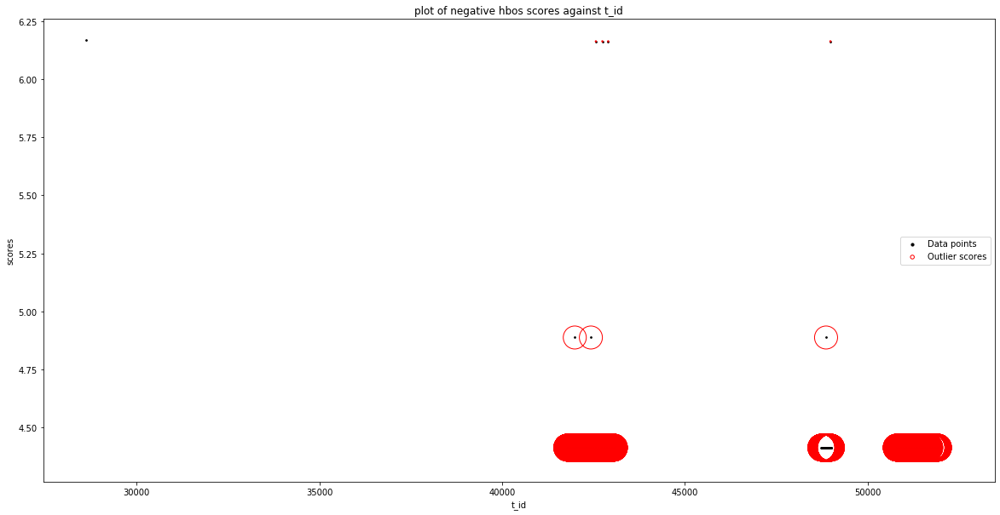

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['psh_flag_count', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2454
Number of Outliers :  57
Outlier index: 0
Outlier

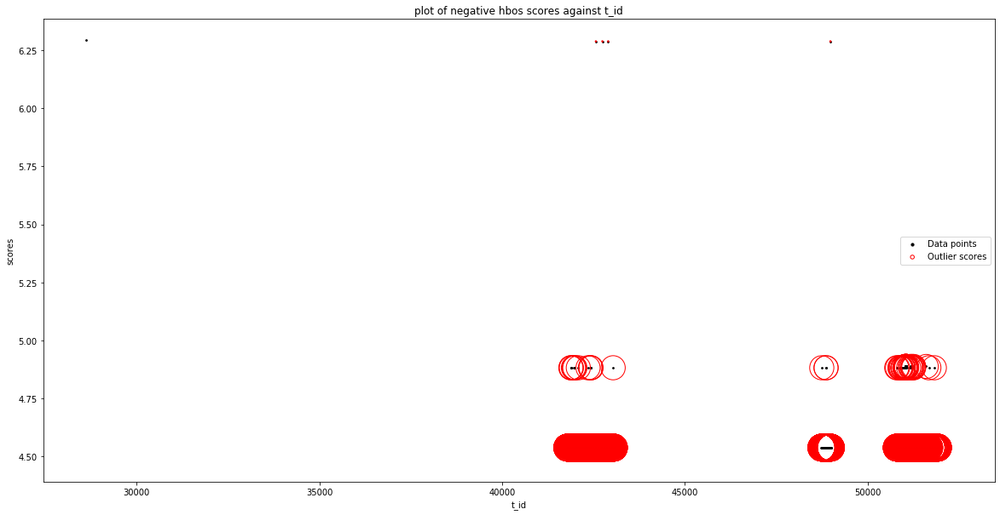

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['psh_flag_count', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2440
Number of Outliers :  71
Outlier index: 0
Outlier 

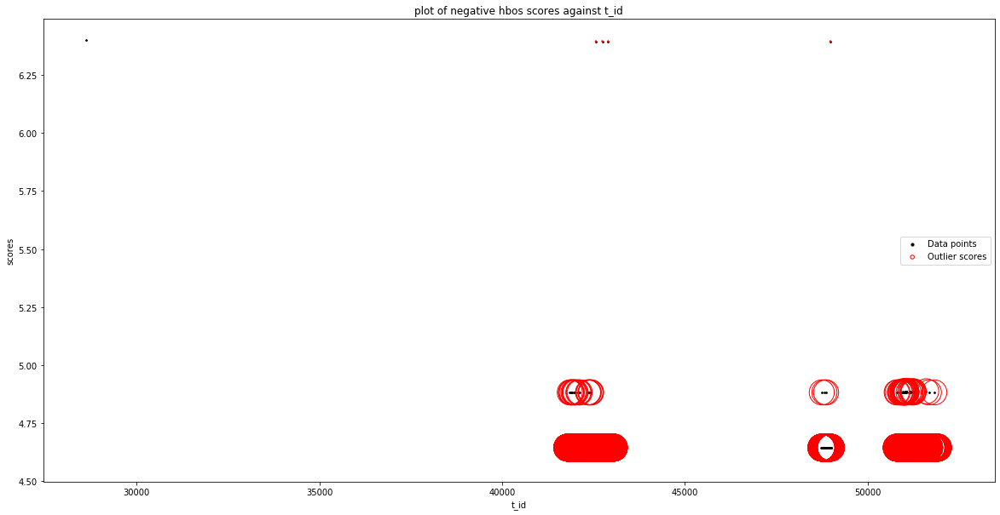

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'fwd_header_length']
input parameters are being used instead of def

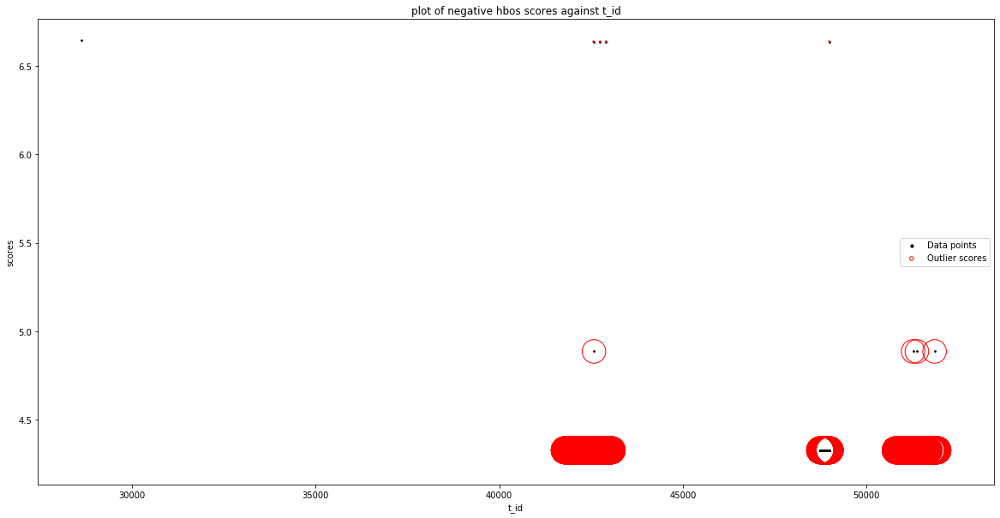

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'packet_length_mean']
input parameters are bein

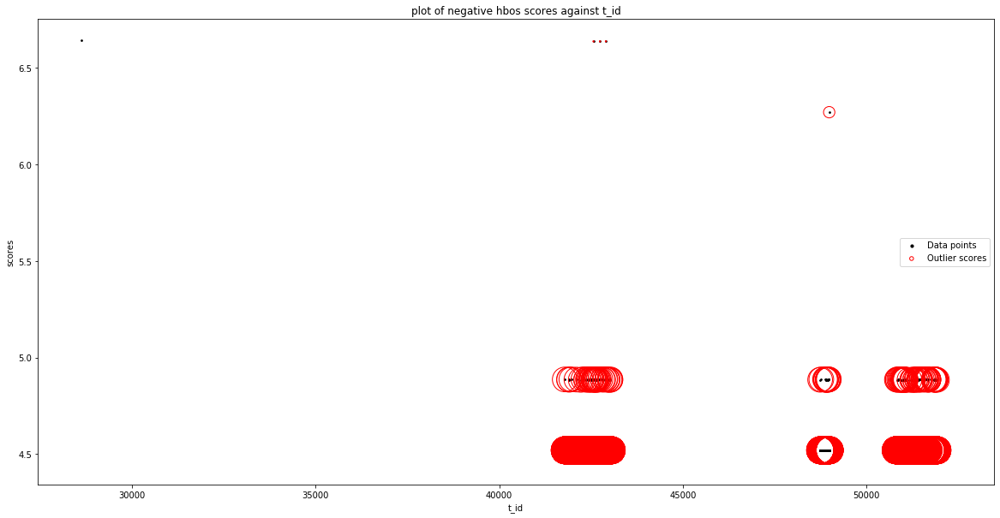

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'urg_flag_count']
input parameters are being used instead of de

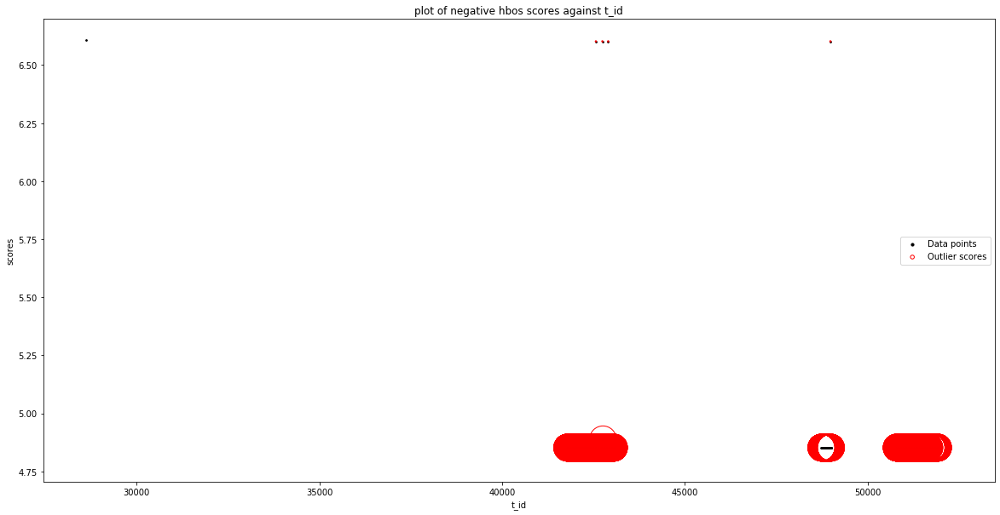

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'active_max']
input parameters are being used instead of defau

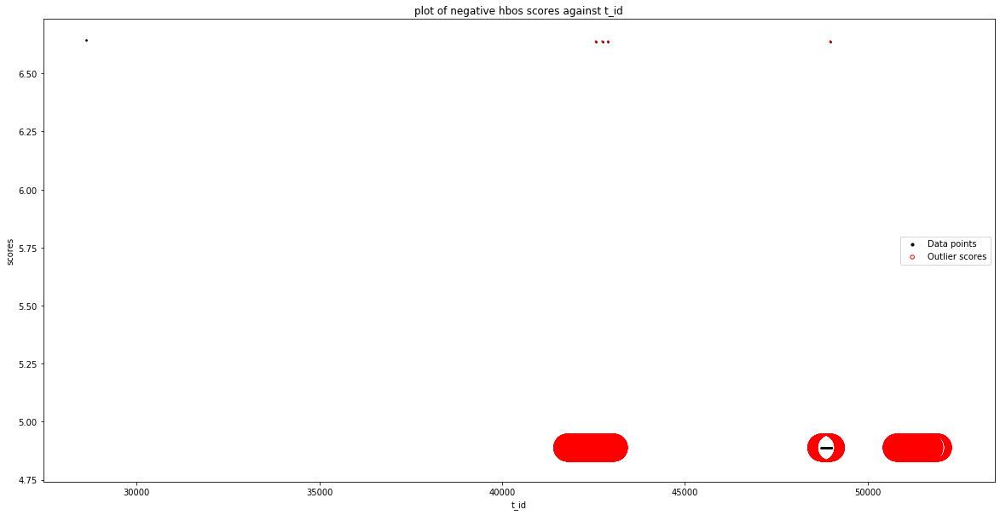

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['psh_flag_count', 'idle_max'], dtype='object')
Number of Inliers :  2506
Number of Outliers :  5
Outlier index: 0
Outlier score: 6.642291282444678
Outlier index: 763
Outlier score: 6.212106373879028
Outlier index: 937
Outlier score: 6.212106373879028
Outlier index: 1090
Outlier score: 6.212106373879028
Outlier index: 1468
Outlier score: 6.212106373879028
Total number of outliers found: 5
Silhouetter Score: 0.822
davies bouldin Score: 2.106
calinski_harabasz Score: 77.781


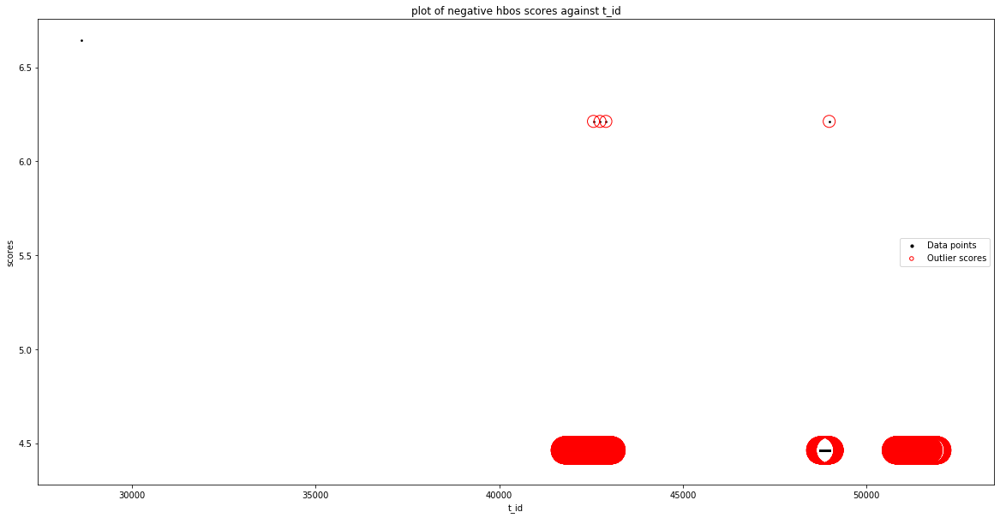

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['psh_flag_count', 'a_id'], dtype='object')
Number of Inliers :  2506
Number of Outliers :  5
Outlier index: 0
Outlier score: 6.640241386330848
Outlier index: 763
Outlier score: 4.9120228507436785
Outlier index: 937
Outlier score: 4.9120228507436785
Outlier index: 1090
Outlier score: 4.9120228507436785
Outlier index: 1468
Outlier score: 4.9120228507436785
Total number of outliers found: 5
Silhouetter Score: 0.712
davies bouldin Score: 1.484
calinski_harabasz Score: 46.418


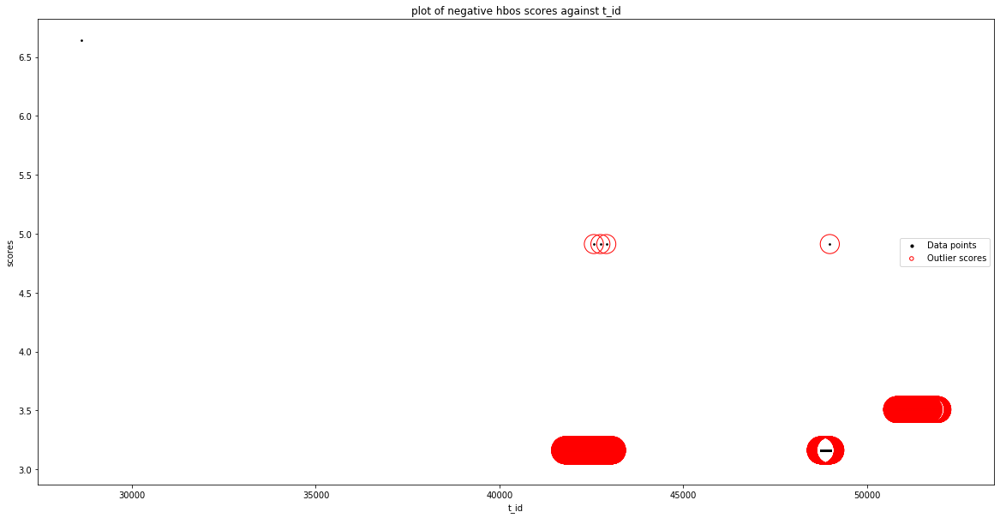

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'service_physical_ip']
input parameters are being used instead of d

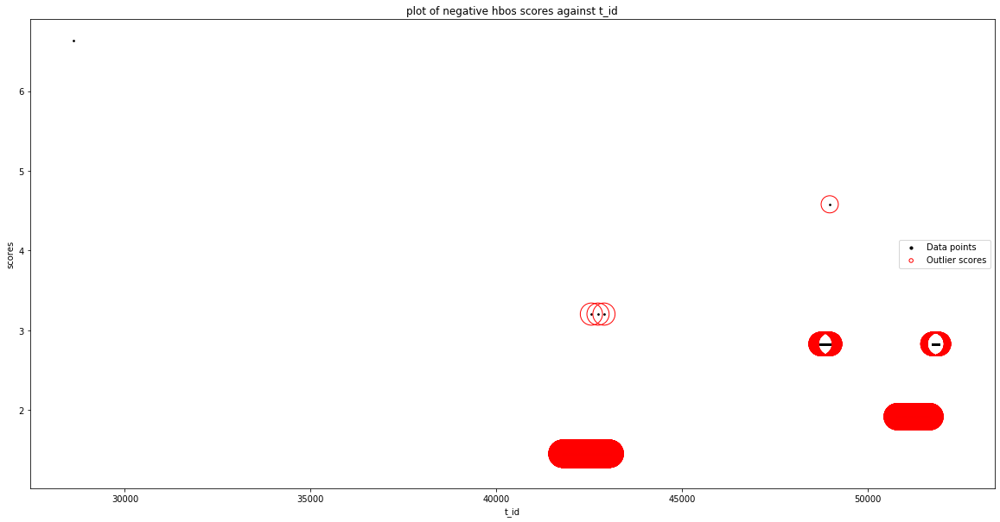

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['psh_flag_count', 'log_start_time']
input parameters are being used instead of default 

No valid feature
No Valid columns found for combination of  ['ack_flag_count', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['ack_flag_count', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['ack_flag_count', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['ack_flag_count', 'bwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['ack_flag_count', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns fo

No valid feature
No Valid columns found for combination of  ['ack_flag_count', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['ack_flag_count', 'a_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['ack_flag_count', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['ack_flag_count', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['ack_flag_count', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of

No valid feature
No Valid columns found for combination of  ['urg_flag_count', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['urg_flag_count', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['urg_flag_count', 'fwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['urg_flag_count', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['urg_flag_count', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination o

No valid feature
No Valid columns found for combination of  ['urg_flag_count', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['urg_flag_count', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['urg_flag_count', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['urg_flag_count', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['urg_flag_count', 'active_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for comb

No valid feature
No Valid columns found for combination of  ['cwr_flag_count', 'bwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['cwr_flag_count', 'flow_bytes_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['cwr_flag_count', 'flow_pkts_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['cwr_flag_count', 'flow_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['cwr_flag_count', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns 

No valid feature
No Valid columns found for combination of  ['cwr_flag_count', 'bwd_bytes_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['cwr_flag_count', 'bwd_packet_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['cwr_flag_count', 'bwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['cwr_flag_count', 'subflow_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['cwr_flag_count', 'subflow_fwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature


No valid feature
No Valid columns found for combination of  ['ece_flag_count', 'total_length_of_fwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['ece_flag_count', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['ece_flag_count', 'fwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['ece_flag_count', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['ece_flag_count', 'fwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30

No valid feature
No Valid columns found for combination of  ['ece_flag_count', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['ece_flag_count', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['ece_flag_count', 'down_up_ratio']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['ece_flag_count', 'avg_packet_size']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['ece_flag_count', 'fwd_segment_size_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found

No valid feature
No Valid columns found for combination of  ['down_up_ratio', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['down_up_ratio', 'src_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['down_up_ratio', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['down_up_ratio', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['down_up_ratio', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['down_up_ratio', 'tim

No valid feature
No Valid columns found for combination of  ['down_up_ratio', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['down_up_ratio', 'packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['down_up_ratio', 'packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['down_up_ratio', 'packet_length_variance']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['down_up_ratio', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid column

No valid feature
No Valid columns found for combination of  ['down_up_ratio', 'service_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['down_up_ratio', 'service_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['down_up_ratio', 'client_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['down_up_ratio', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['down_up_ratio', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns fou

No valid feature
No Valid columns found for combination of  ['avg_packet_size', 'bwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['avg_packet_size', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['avg_packet_size', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['avg_packet_size', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['avg_packet_size', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for com

No valid feature
No Valid columns found for combination of  ['avg_packet_size', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['avg_packet_size', 'idle_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['avg_packet_size', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['avg_packet_size', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['avg_packet_size', 'a_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['avg_packe

No valid feature
No Valid columns found for combination of  ['fwd_segment_size_avg', 'flow_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_segment_size_avg', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_segment_size_avg', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_segment_size_avg', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_segment_size_avg', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid

No valid feature
No Valid columns found for combination of  ['fwd_segment_size_avg', 'subflow_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_segment_size_avg', 'subflow_bwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_segment_size_avg', 'fwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_segment_size_avg', 'bwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_segment_size_avg', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbo

No valid feature
No Valid columns found for combination of  ['bwd_segment_size_avg', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_segment_size_avg', 'fwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_segment_size_avg', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_segment_size_avg', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_segment_size_avg', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 

No valid feature
No Valid columns found for combination of  ['bwd_segment_size_avg', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_segment_size_avg', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_segment_size_avg', 'down_up_ratio']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_segment_size_avg', 'avg_packet_size']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_segment_size_avg', 'fwd_segment_size_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid 

No valid feature
No Valid columns found for combination of  ['fwd_bytes_per_bulk_avg', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bytes_per_bulk_avg', 'src_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bytes_per_bulk_avg', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bytes_per_bulk_avg', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bytes_per_bulk_avg', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns fou

No valid feature
No Valid columns found for combination of  ['fwd_bytes_per_bulk_avg', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bytes_per_bulk_avg', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bytes_per_bulk_avg', 'packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bytes_per_bulk_avg', 'packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bytes_per_bulk_avg', 'packet_length_variance']
input parameters are being used instead of default values
contamination: 0.27


No valid feature
No Valid columns found for combination of  ['fwd_bytes_per_bulk_avg', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bytes_per_bulk_avg', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bytes_per_bulk_avg', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bytes_per_bulk_avg', 'service_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bytes_per_bulk_avg', 'service_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors

No valid feature
No Valid columns found for combination of  ['fwd_packet_per_bulk_avg', 'fwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_per_bulk_avg', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_per_bulk_avg', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_per_bulk_avg', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_per_bulk_avg', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid fea

No valid feature
No Valid columns found for combination of  ['fwd_packet_per_bulk_avg', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_per_bulk_avg', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_per_bulk_avg', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_per_bulk_avg', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_packet_per_bulk_avg', 'active_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No 

No valid feature
No Valid columns found for combination of  ['fwd_bulk_rate_avg', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bulk_rate_avg', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bulk_rate_avg', 'bwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bulk_rate_avg', 'flow_bytes_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bulk_rate_avg', 'flow_pkts_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
N

No valid feature
No Valid columns found for combination of  ['fwd_bulk_rate_avg', 'fwd_bytes_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bulk_rate_avg', 'fwd_packet_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bulk_rate_avg', 'bwd_bytes_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bulk_rate_avg', 'bwd_packet_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_bulk_rate_avg', 'bwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbo

No valid feature
No Valid columns found for combination of  ['bwd_bytes_per_bulk_avg', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bytes_per_bulk_avg', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bytes_per_bulk_avg', 'total_length_of_fwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bytes_per_bulk_avg', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bytes_per_bulk_avg', 'fwd_packet_length_max']
input parameters are being used instead of default values
cont

No valid feature
No Valid columns found for combination of  ['bwd_bytes_per_bulk_avg', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bytes_per_bulk_avg', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bytes_per_bulk_avg', 'psh_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bytes_per_bulk_avg', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bytes_per_bulk_avg', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No va

No valid feature
No Valid columns found for combination of  ['bwd_bytes_per_bulk_avg', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bytes_per_bulk_avg', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bytes_per_bulk_avg', 'log_start_time']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bytes_per_bulk_avg', 'log_end_time']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_per_bulk_avg', 't_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid 

No valid feature
No Valid columns found for combination of  ['bwd_packet_per_bulk_avg', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_per_bulk_avg', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_per_bulk_avg', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_per_bulk_avg', 'bwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_per_bulk_avg', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neigh

No valid feature
No Valid columns found for combination of  ['bwd_packet_per_bulk_avg', 'idle_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_per_bulk_avg', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_per_bulk_avg', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_per_bulk_avg', 'a_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_packet_per_bulk_avg', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid colum

No valid feature
No Valid columns found for combination of  ['bwd_bulk_rate_avg', 'flow_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bulk_rate_avg', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bulk_rate_avg', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bulk_rate_avg', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bulk_rate_avg', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found 

No valid feature
No Valid columns found for combination of  ['bwd_bulk_rate_avg', 'subflow_fwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bulk_rate_avg', 'subflow_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bulk_rate_avg', 'subflow_bwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bulk_rate_avg', 'fwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_bulk_rate_avg', 'bwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid fe

No valid feature
No Valid columns found for combination of  ['subflow_fwd_packets', 'fwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_packets', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_packets', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_packets', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_packets', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27

No valid feature
No Valid columns found for combination of  ['subflow_fwd_packets', 'down_up_ratio']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_packets', 'avg_packet_size']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_packets', 'fwd_segment_size_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_packets', 'bwd_segment_size_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_packets', 'fwd_bytes_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30


No valid feature
No Valid columns found for combination of  ['subflow_fwd_bytes', 'src_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_bytes', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_bytes', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_bytes', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_bytes', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of 

No valid feature
No Valid columns found for combination of  ['subflow_fwd_bytes', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_bytes', 'packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_bytes', 'packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_bytes', 'packet_length_variance']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_bytes', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid fea

No valid feature
No Valid columns found for combination of  ['subflow_fwd_bytes', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_bytes', 'service_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_bytes', 'service_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_bytes', 'client_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_fwd_bytes', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Val

No valid feature
No Valid columns found for combination of  ['subflow_bwd_packets', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_bwd_packets', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_bwd_packets', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_bwd_packets', 'bwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_bwd_packets', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid column

No valid feature
No Valid columns found for combination of  ['subflow_bwd_packets', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_bwd_packets', 'active_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_bwd_packets', 'active_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_bwd_packets', 'idle_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_bwd_packets', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for

No valid feature
No Valid columns found for combination of  ['subflow_bwd_bytes', 'flow_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_bwd_bytes', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_bwd_bytes', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_bwd_bytes', 'flow_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_bwd_bytes', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns fou

No valid feature
No Valid columns found for combination of  ['subflow_bwd_bytes', 'bwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_bwd_bytes', 'subflow_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_bwd_bytes', 'subflow_fwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_bwd_bytes', 'subflow_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['subflow_bwd_bytes', 'fwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid f

No valid feature
No Valid columns found for combination of  ['fwd_init_win_bytes', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_init_win_bytes', 'fwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_init_win_bytes', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_init_win_bytes', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_init_win_bytes', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_nei

No valid feature
No Valid columns found for combination of  ['fwd_init_win_bytes', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_init_win_bytes', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_init_win_bytes', 'down_up_ratio']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_init_win_bytes', 'avg_packet_size']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_init_win_bytes', 'fwd_segment_size_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No

Features Used ::  Index(['bwd_init_win_bytes', 't_id'], dtype='object')
Number of Inliers :  2271
Number of Outliers :  240
Outlier index: 0
Outlier score: 6.600007209748307
Outlier index: 953
Outlier score: 4.884108699708068
Outlier index: 1244
Outlier score: 5.413785468234353
Outlier index: 1245
Outlier score: 5.413785468234353
Outlier index: 1246
Outlier score: 5.413785468234353
Outlier index: 1247
Outlier score: 5.413785468234353
Outlier index: 1248
Outlier score: 5.413785468234353
Outlier index: 1249
Outlier score: 5.413785468234353
Outlier index: 1250
Outlier score: 5.413785468234353
Outlier index: 1251
Outlier score: 5.413785468234353
Outlier index: 1252
Outlier score: 5.413785468234353
Outlier index: 1253
Outlier score: 5.413785468234353
Outlier index: 1254
Outlier score: 5.413785468234353
Outlier index: 1255
Outlier score: 5.413785468234353
Outlier index: 1256
Outlier score: 5.413785468234353
Outlier index: 1257
Outlier score: 5.413785468234353
Outlier index: 1258
Outlier scor

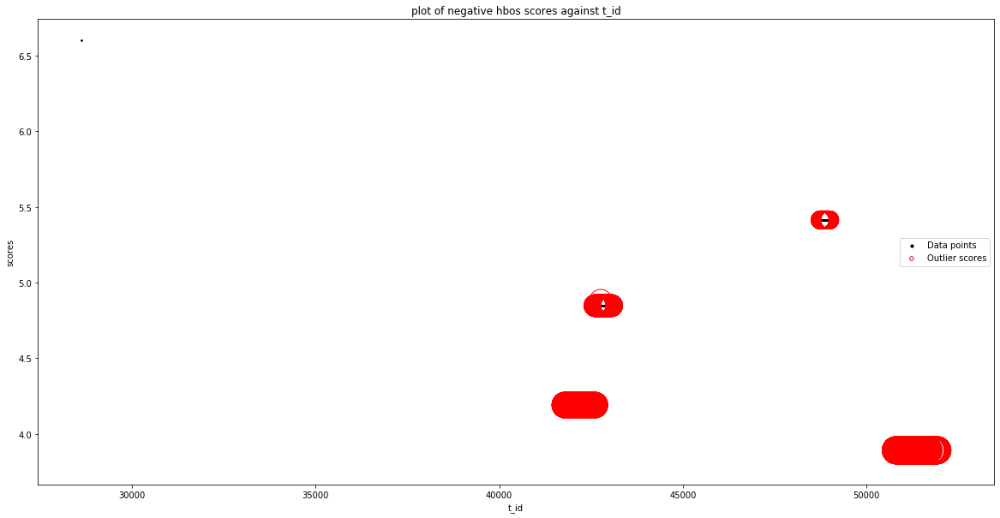

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_init_win_bytes', 'src_port'], dtype='object')
Number of Inliers :  2367
Number of Outliers :  144
Outlier index: 0
Outlier score: 6.586140345570564
Outlier index: 2358
Outlier score: 4.946777131346451
Outlier index: 2359
Outlier score: 4.946777131346451
Outlier index: 2360
Outlier score: 4.946777131346451
Outlier index: 2361
Outlier score: 4.946777131346451
Outlier index: 2362
Outlier score: 4.946777131346451
Outlier index: 2363
Outlier score: 4.946777131346451
Outlier index: 2364
Outlier score: 4.946777131346451
Outlier index: 2365
Outlier score: 4.946777131346451
Outlier index: 2366
Outlier score: 4.946777131346451
Outlier index: 2367
Outlier score: 4.946777131346451
Outlier ind

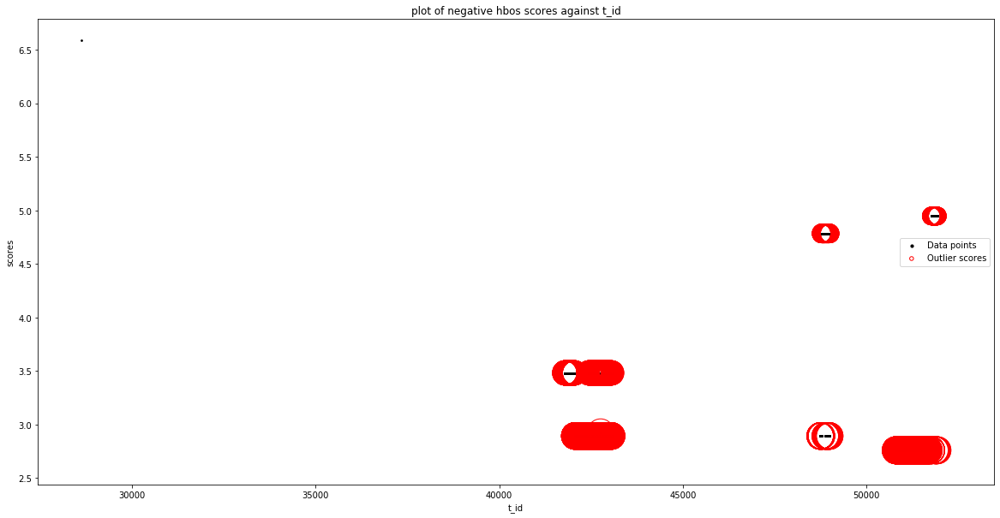

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_init_win_bytes', 'flow_duration'], dtype='object')
Number of Inliers :  2507
Number of Outliers :  4
Outlier index: 0
O

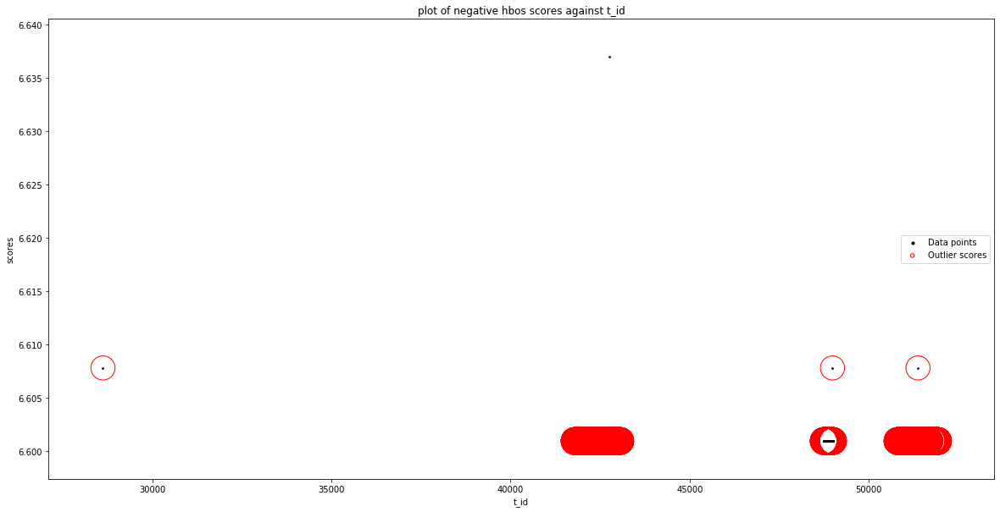

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_init_win_bytes', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2468
Number of Outliers :  43
Outlier index: 0
Outlier score: 6.607594739529896
Outlier index: 113
Outlier score: 6.606802271923261
Outlier index: 311
Outlier score: 6.602056585878994
Outlier index: 703
Outlier score: 6.602056585878994
Outlier index: 721
Outlier score: 6.602056585878994
Outlier index: 763
Outlier score: 6.607000348019296
Outlier index: 775
Outlier score: 6.607198451314099
Out

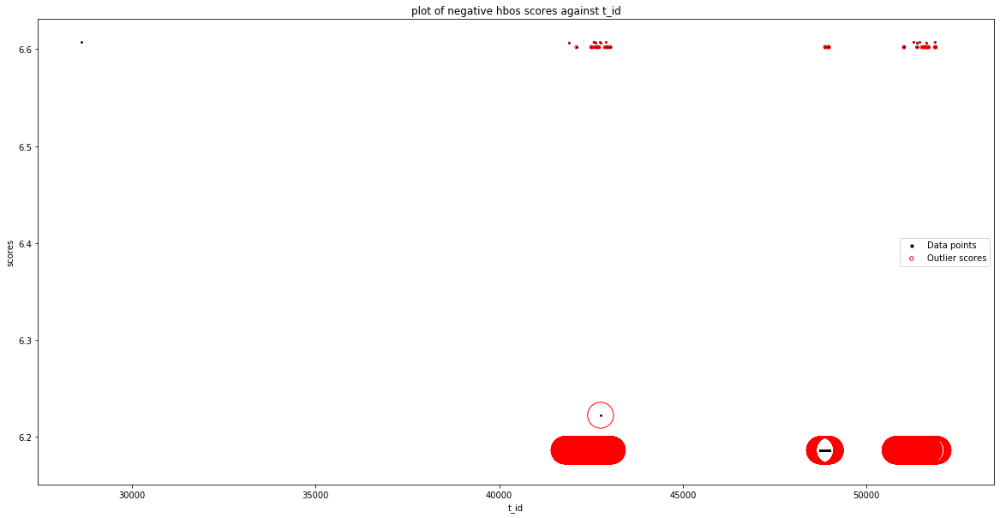

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_init_win_bytes', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
Outlier index: 0
Outlier score: 6.3765807174125495
Outlier index: 1
Outlier score: 6.3765807174125495
Outlier index: 63
Outlier score: 6.4199534130584315
Outlier index: 113
Outlier score: 6.3765807174125495
Outlier index: 115
Outlier score: 6.3765807174125495
Outlier index: 174
Outlier score: 6.5829313329554555
Outlier index: 193
Outlier score: 6.4199534130584315
Outlier index: 311
Outlier score: 6.3765807174125495
Outlier index: 426
Outlier score: 6.558490926904842
Outlier index: 498
Outlier score: 6.3765807174125495
Outlier index: 553
Outlier score: 

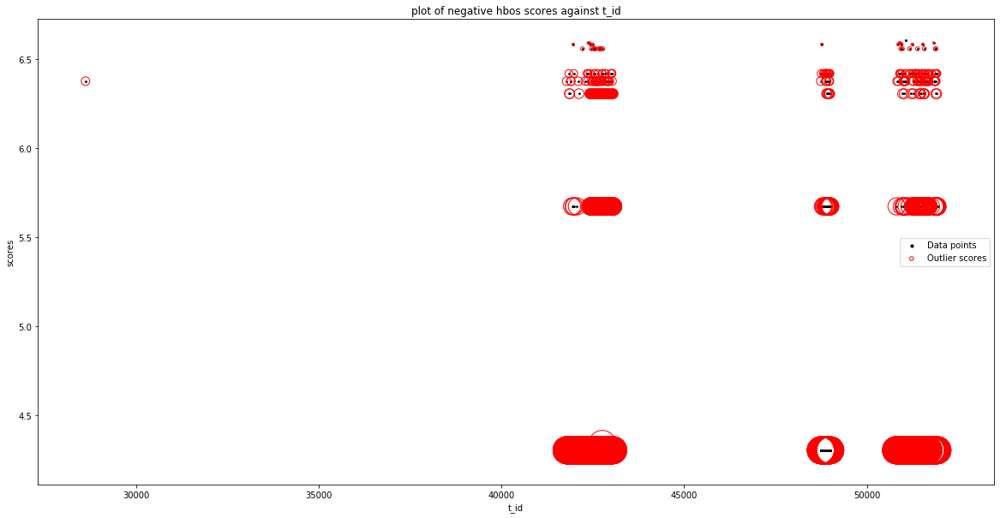

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_init_win_bytes', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2357
Number of Outliers :  154
Outlier index: 0
Outlier score: 6.496899113252027
Outlier index: 113
Outlier score: 6.5979465637103205
Outlier index: 115
Outlier score: 6.496899113252027
Outlier index: 174
Outlier score: 6.496899113252027
Outlier index: 193
Outlier score: 6.496899113252027
Outlier index: 311
Outlier score: 6.58979228790651
Outlier index: 498
Outlier score: 6.556038880210622
Outlier index: 564
Outlier score: 6.556038880210622
Outlier index: 574
Outlier score: 6.58979228790651
Outlier index: 616
Outlier score: 6.496899113252027
Outlier index: 625
Outlier score: 6.496899113

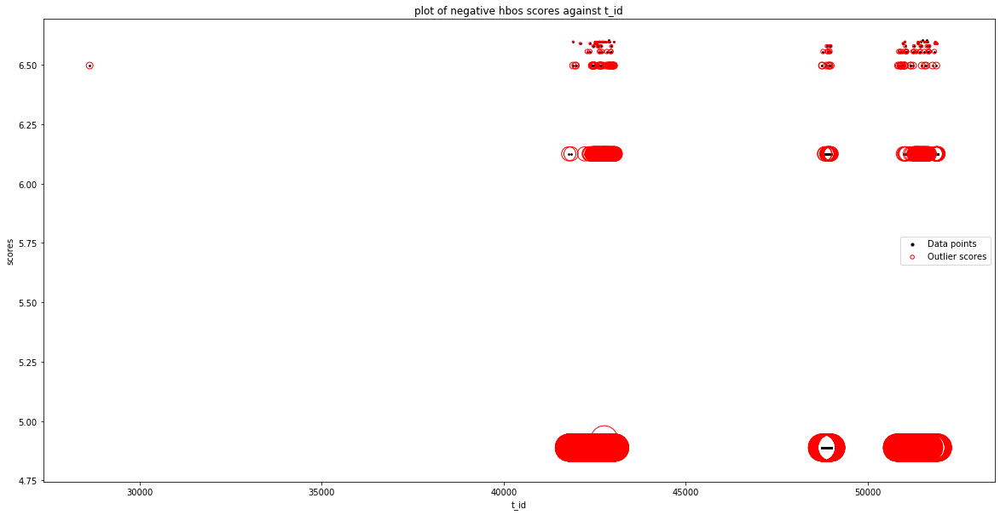

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'bwd_packet_le

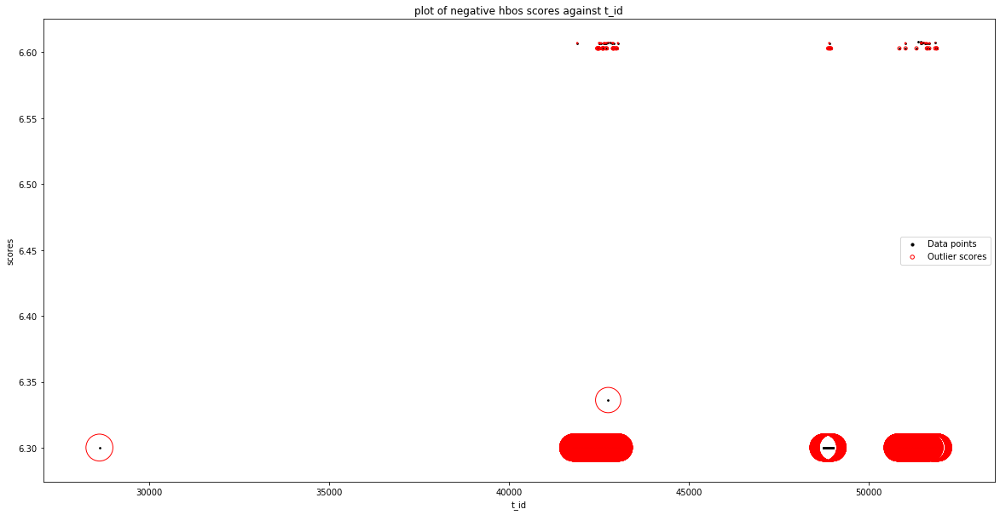

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_init_win_bytes', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2398
Number of Outliers :  113
Outlier index: 653
Outlier score: 6.483784585788273
Outlier index: 663
Outlier score: 6.591942590132437
Outlier index: 667
Outlier score: 6.543503748474986
Outlier index: 674
Outlier score: 6.543503748474986
Outlier index: 687
Outlier score: 6.483784585788273
Outlier index: 689
Outlier score: 6.483784585788273
Outlier index: 694
Outlier score: 6.483784585788273
Outlier index: 701
Outlier score: 6.483784585788273
Outlier index: 707
Outlier score: 6.543503748474986
Outlier index: 709
Outlier score: 6.483784585788273
Outlier index: 713
Outlier score: 6.483784585788273
Outlier index: 732
Outlier score: 6.483784585788273
Outlier index: 747
Outlier score: 6.483784585788273
Outlier index: 749
Outlier score: 6.591942590132437
Outlier index: 762
Outlier score: 6.48378

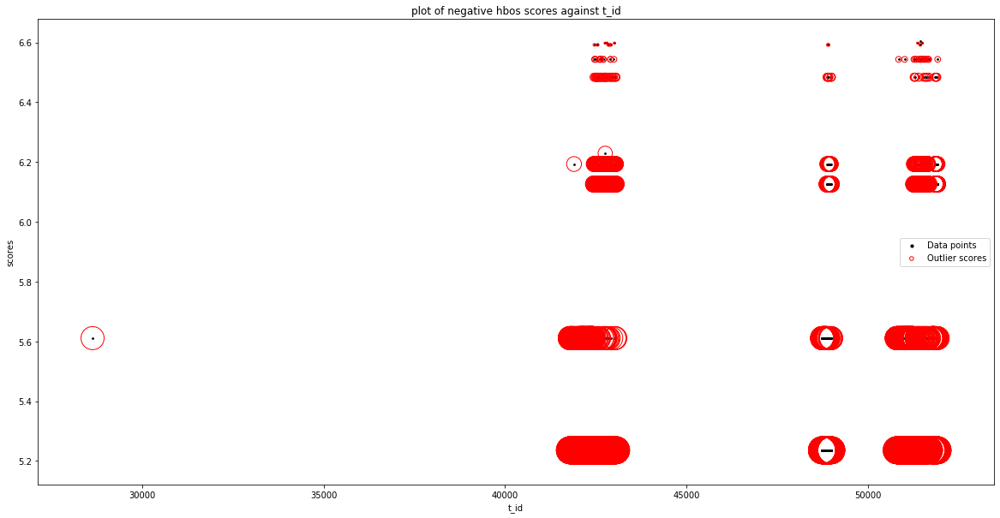

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_init_win_bytes', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2508
Number of Outliers :  3
Outlier index: 953
Outlier score: 6.616888107934579
Outlier index: 1468
Outlier score: 6.607782080787333
Outlier index: 2030
Outlier score: 6.607782080787333
Total number of outliers found: 3
Silhouetter Score: 0.996
davies bouldin Score: 1.202
calinski_harabasz Score: 1570.404


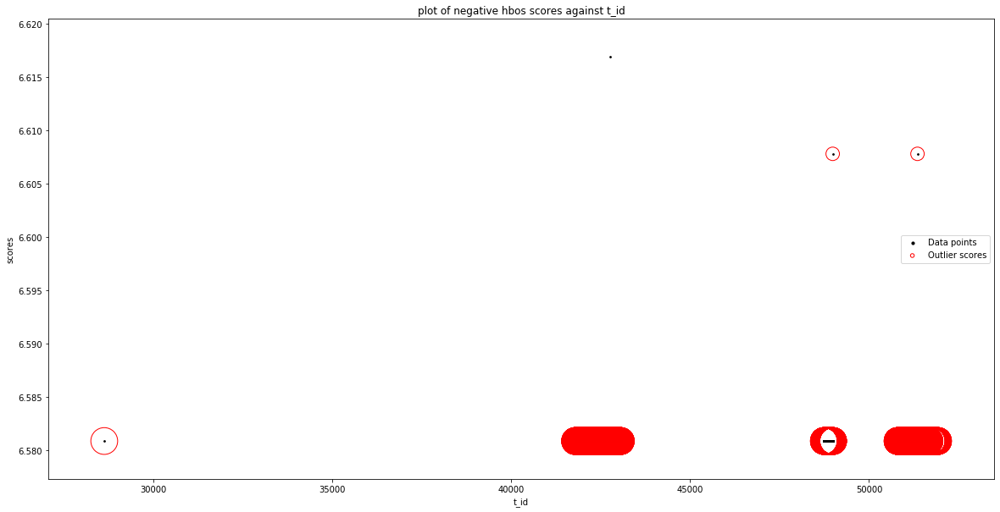

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_init_win_bytes', 'flow_iat_min'], dtype='object')
Number of Inliers :  2507
Number of Outliers :  4
Outlier index: 199
Outlier score: 6.60712016669153
Outlier index: 631
Outlier score: 6.60712016669153
Outlier index: 953
Outlier score: 6.168824681211327
Outlier index: 1359
Outlier score: 6.60712016669153
Total number of outliers found: 4
Silhouetter Score: 0.996
davies bouldin Score: 1.480
calinski_harabasz Score: 858.338


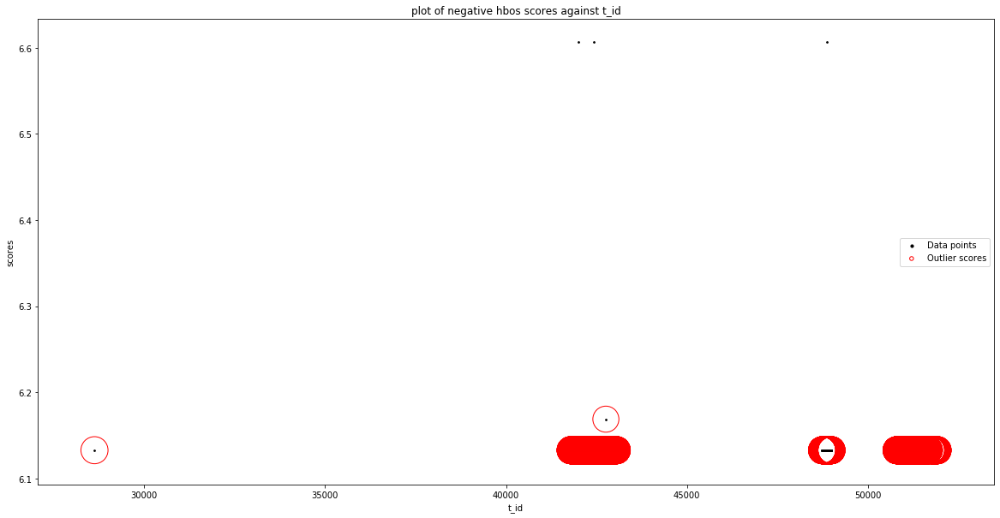

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_init_win_bytes', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2458
Number of Outliers :  53
Outl

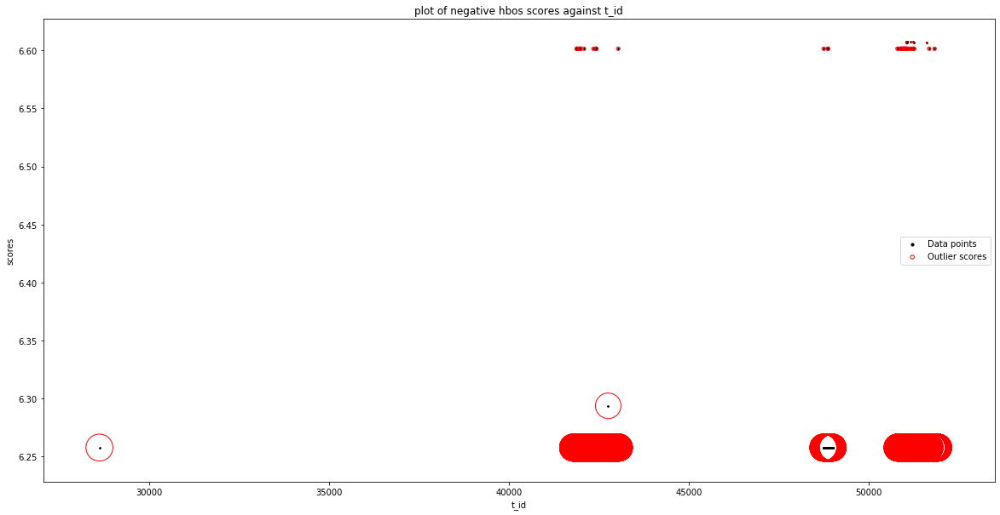

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_init_win_bytes', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2444
Number of Outliers :  67
Outli

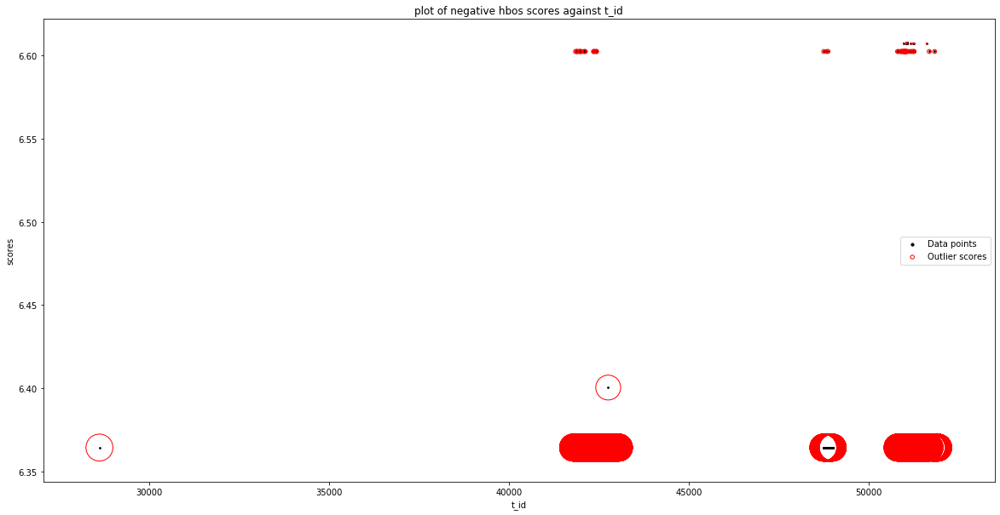

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'fwd_header_length']
input parameters are being

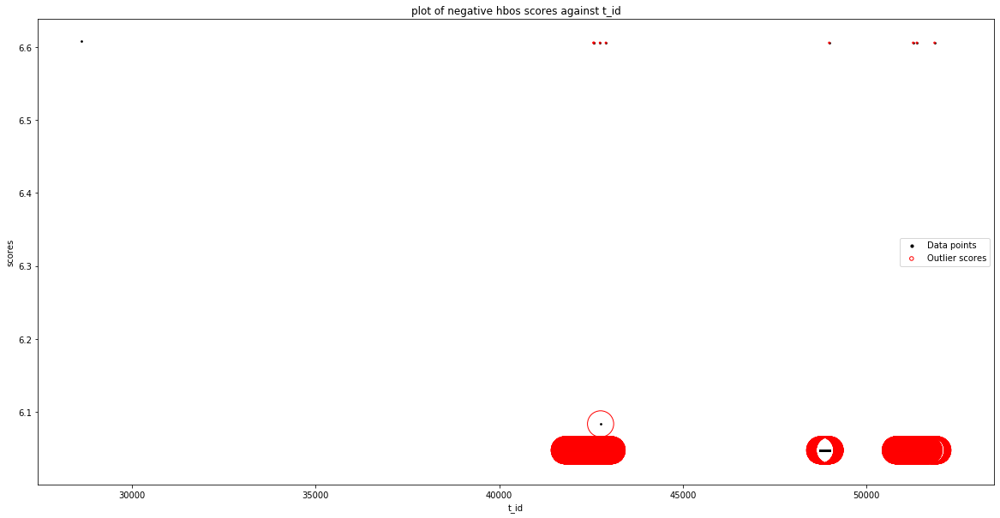

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'packet_length_mean']
input

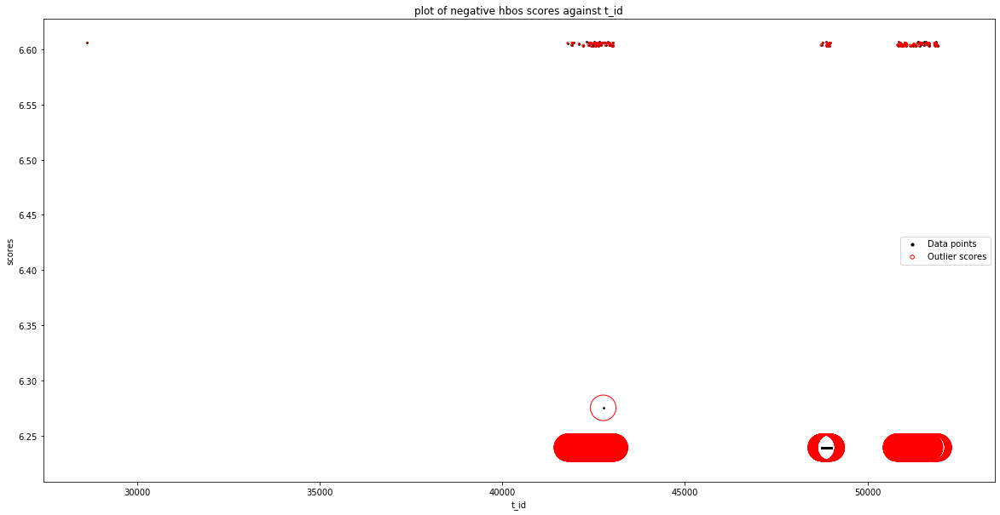

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_init_win_bytes', 'psh_flag_count'], dtype='object')
Number of Inliers :  2505
Number of Outliers :  6
Outlier index: 0
Outlier score: 6.606425596437859
Outlier index: 763
Outlier score: 6.602331370590823
Outlier index: 937
Outlier score: 6.602331370590823
Outlier index: 953
Outlier score: 4

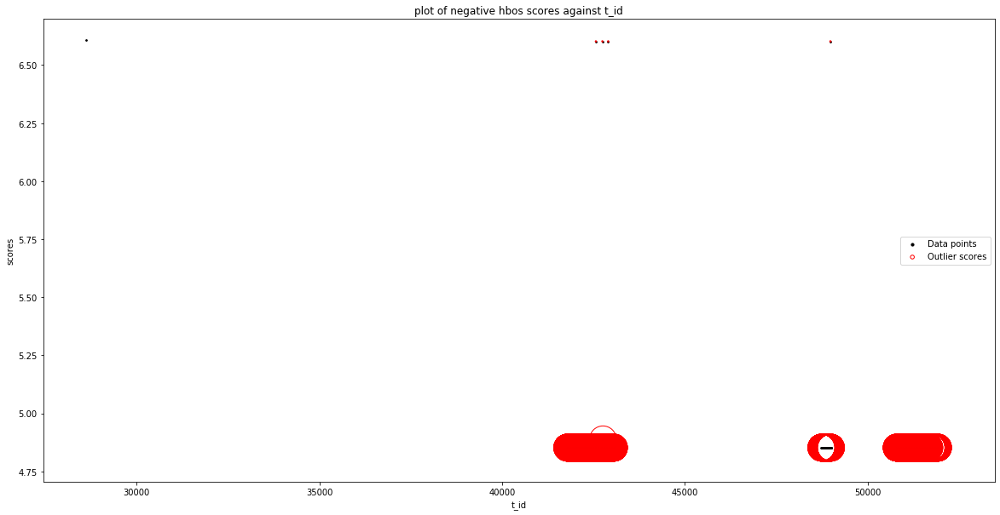

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'down_up_ratio']
input parameters are being

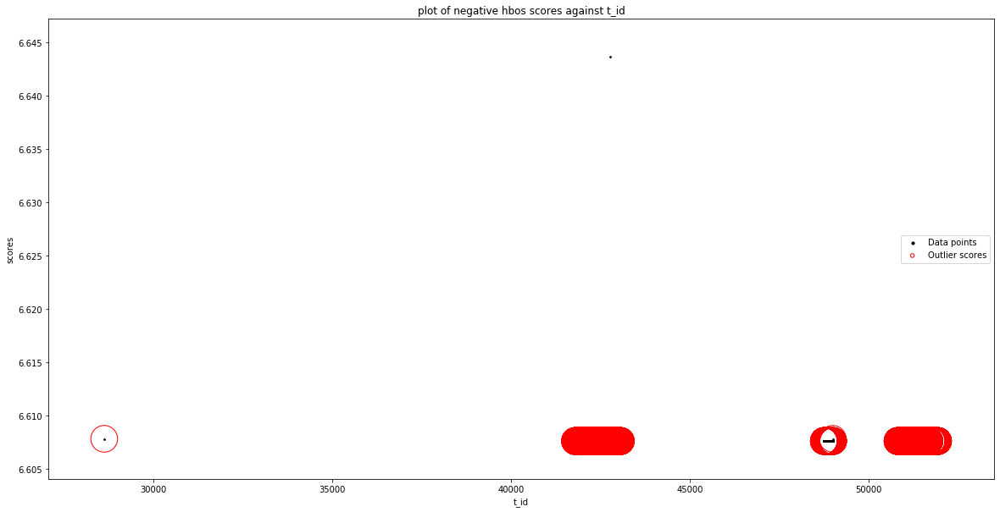

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_init_win_bytes', 'idle_max'], dtype='object')
Number of Inliers :  2509
Number of Outliers :  2
Outlier index: 0
Outlier score: 6.6075953451637695
Outlier index: 953
Outlier score: 6.217553378909445
Total number of outliers found: 2
Silhouetter Score: 0.993
davies bouldin Score: 1.005
calinski_harabasz Score: 2409.634


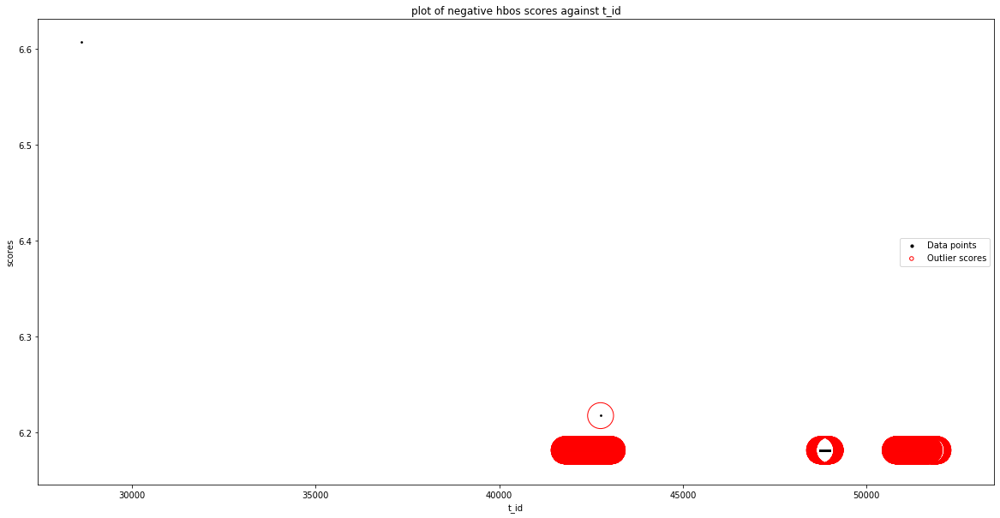

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['bwd_init_win_bytes', 'a_id'], dtype='object')
Number of Inliers :  2510
Number of Outliers :  1
Outlier index: 0
Outlier score: 6.60554544904994
Total number of outliers found: 1
Silhouetter Score: 0.720
davies bouldin Score: 0.265
calinski_harabasz Score: 0.074


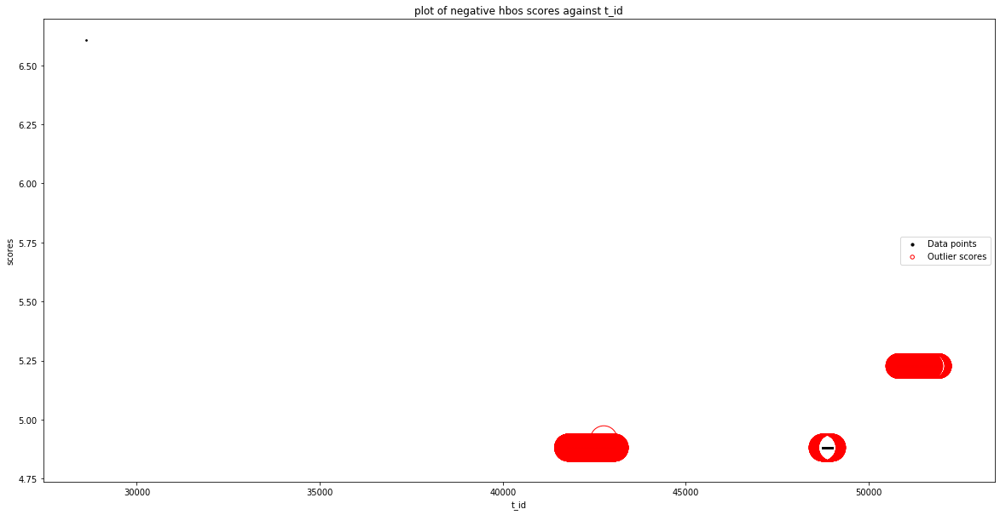

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'service_physical_ip']
input parameters are bei

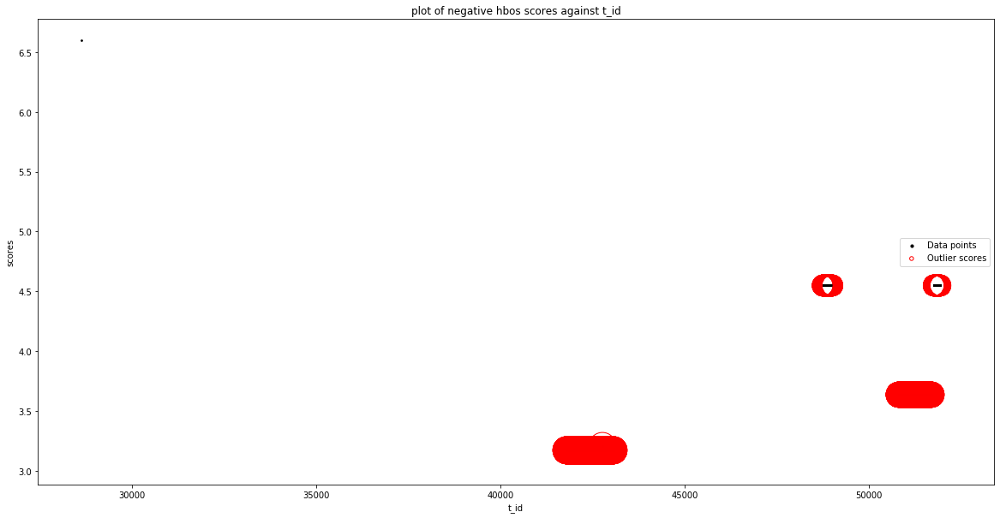

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['bwd_init_win_bytes', 'log_start_time']
input parameters are being used

No valid feature
No Valid columns found for combination of  ['fwd_act_data_packets', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_act_data_packets', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_act_data_packets', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_act_data_packets', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_act_data_packets', 'bwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid fea

No valid feature
No Valid columns found for combination of  ['fwd_act_data_packets', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_act_data_packets', 'idle_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_act_data_packets', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_act_data_packets', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_act_data_packets', 'a_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for co

No valid feature
No Valid columns found for combination of  ['fwd_seg_size_min', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_seg_size_min', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_seg_size_min', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_seg_size_min', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_seg_size_min', 'fwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for co

No valid feature
No Valid columns found for combination of  ['fwd_seg_size_min', 'subflow_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_seg_size_min', 'subflow_bwd_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_seg_size_min', 'fwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_seg_size_min', 'bwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['fwd_seg_size_min', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feat

No valid feature
No Valid columns found for combination of  ['active_mean', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_mean', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_mean', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_mean', 'bwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_mean', 'flow_bytes_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid c

No valid feature
No Valid columns found for combination of  ['active_mean', 'bwd_segment_size_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_mean', 'fwd_bytes_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_mean', 'fwd_packet_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_mean', 'fwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_mean', 'bwd_bytes_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid 

No valid feature
No Valid columns found for combination of  ['active_std', 'flow_duration']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_std', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_std', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_std', 'total_length_of_fwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_std', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns fo

No valid feature
No Valid columns found for combination of  ['active_std', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_std', 'psh_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_std', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_std', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_std', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['act

No valid feature
No Valid columns found for combination of  ['active_std', 'log_start_time']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_std', 'log_end_time']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_max', 't_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_max', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_max', 'src_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_max', 'dest_ip']
input

No valid feature
No Valid columns found for combination of  ['active_max', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_max', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_max', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_max', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_max', 'packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for c

No valid feature
No Valid columns found for combination of  ['active_max', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_max', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_max', 'service_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_max', 'service_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_max', 'client_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of

No valid feature
No Valid columns found for combination of  ['active_min', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_min', 'bwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_min', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_min', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_min', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_min',

No valid feature
No Valid columns found for combination of  ['active_min', 'idle_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_min', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_min', 'idle_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_min', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_min', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['active_min', 'a_id']
input pa

Outlier index: 1416
Outlier score: 5.449640793266537
Outlier index: 1417
Outlier score: 5.449640793266537
Outlier index: 1418
Outlier score: 5.449640793266537
Outlier index: 1419
Outlier score: 5.449640793266537
Outlier index: 1420
Outlier score: 5.449640793266537
Outlier index: 1421
Outlier score: 5.449640793266537
Outlier index: 1422
Outlier score: 5.449640793266537
Outlier index: 1423
Outlier score: 5.449640793266537
Outlier index: 1424
Outlier score: 5.449640793266537
Outlier index: 1425
Outlier score: 5.449640793266537
Outlier index: 1426
Outlier score: 5.449640793266537
Outlier index: 1427
Outlier score: 5.449640793266537
Outlier index: 1428
Outlier score: 5.449640793266537
Outlier index: 1429
Outlier score: 5.449640793266537
Outlier index: 1430
Outlier score: 5.449640793266537
Outlier index: 1431
Outlier score: 5.449640793266537
Outlier index: 1432
Outlier score: 5.449640793266537
Outlier index: 1433
Outlier score: 5.449640793266537
Outlier index: 1434
Outlier score: 5.449640793

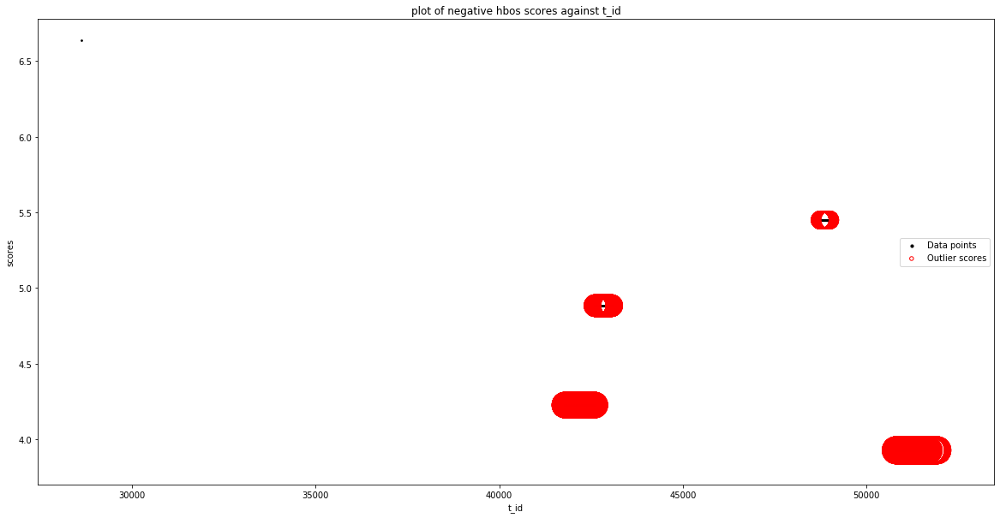

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_mean', 'src_port'], dtype='object')
Number of Inliers :  2366
Number of Outliers :  145
Outlier index: 0
Outlier score: 6.622203445112012
Outlier index: 1468
Outlier score: 4.819930826916394
Outlier index: 2358
Outlier score: 4.982632456378635
Outlier index: 2359
Outlier score: 4.982632456378635
Outlier index: 2360
Outlier score: 4.982632456378635
Outlier index: 2361
Outlier score: 4.982632456378635
Outlier index: 2362
Outlier score: 4.982632456378635
Outlier index: 2363
Outlier score: 4.982632456378635
Outlier index: 2364
Outlier score: 4.982632456378635
Outlier index: 2365
Outlier score: 4.982632456378635
Outlier index: 2366
Outlier score: 4.982632456378635
Outlier index: 2367
Outlier s

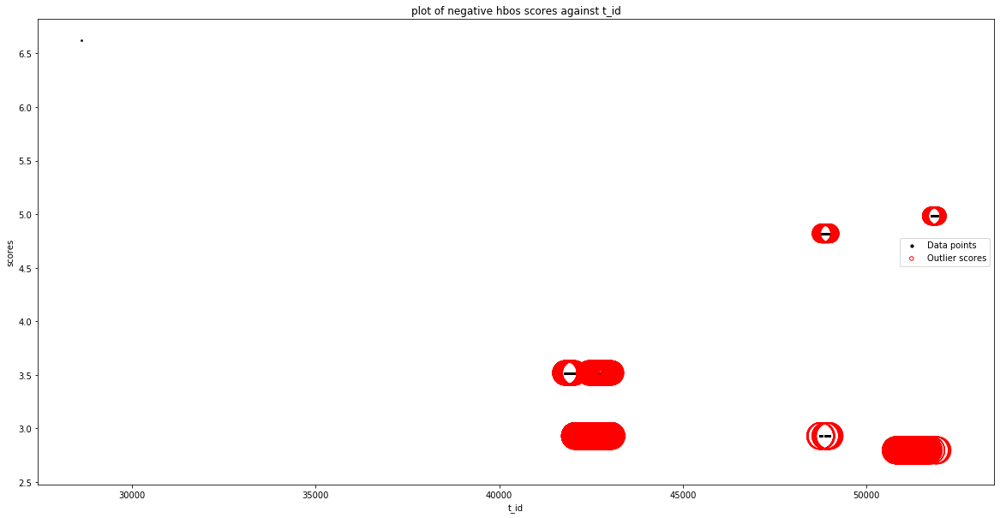

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_mean', 'flow_duration'], dtype='object')
Number of Inliers :  2508
Number of Outliers :  3
Outlier index: 0
Outlier score: 6.64385328337014
Outlier index:

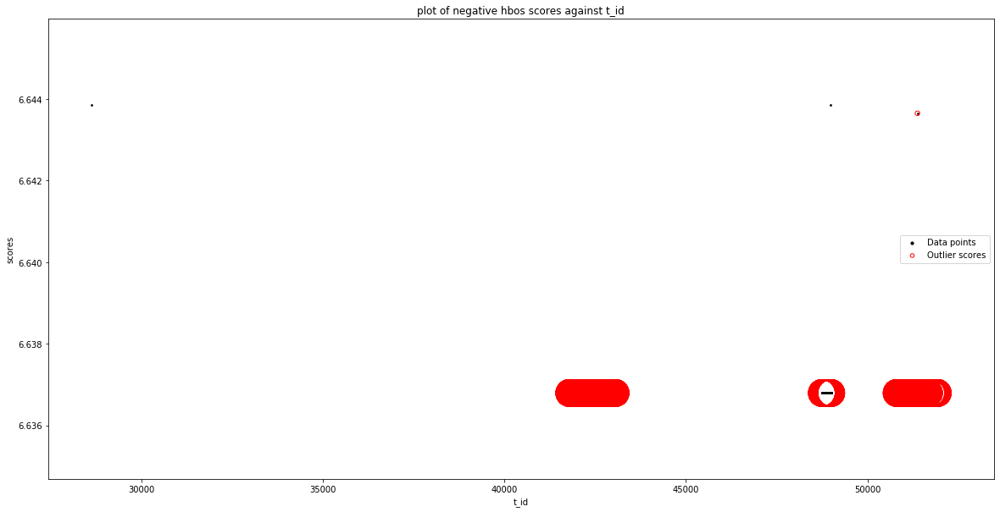

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_mean', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2468
Number of Outliers :  43
Outlier index: 0
Outlier score: 6.643657839071344
Outlier index: 113
Outlier score: 6.642657596955445
Outlier index: 311
Outlier score: 6.637911910911178
Outlier index: 703
Outlier score: 6.637911910911178
Outlier index: 721
Outlier score: 6.637911910911178
Outlier index: 763
Outlier score: 6.64285567305148
Outlier index: 775
Outlier score: 6.643053776346283
Outlier index: 788
Outlier scor

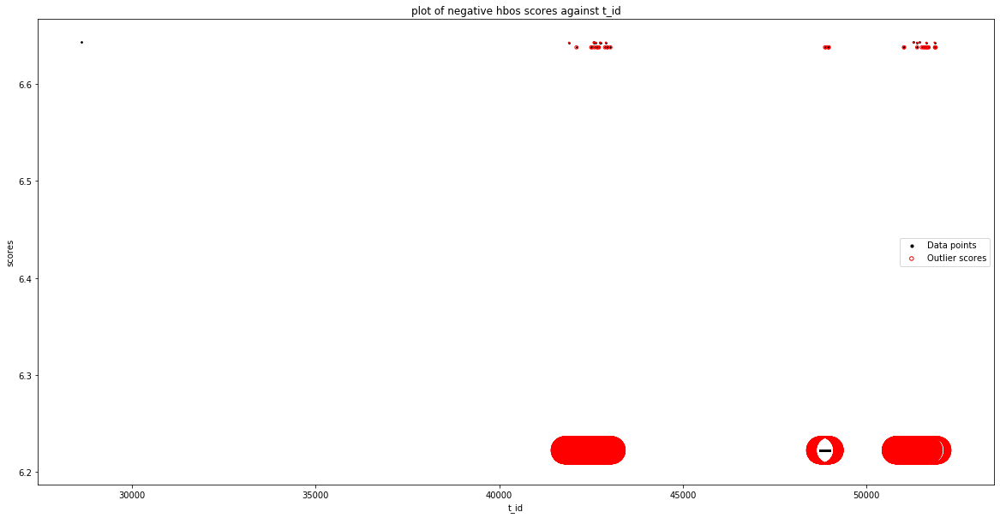

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_mean', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
Outlier index: 0
Outlier score: 6.412643816953999
Outlier index: 1
Outlier score: 6.4124360424447335
Outlier index: 63
Outlier score: 6.455808738090616
Outlier index: 113
Outlier score: 6.4124360424447335
Outlier index: 115
Outlier score: 6.4124360424447335
Outlier index: 174
Outlier score: 6.61878665798764
Outlier index: 193
Outlier score: 6.455808738090616
Outlier index: 311
Outlier score: 6.4124360424447335
Outlier index: 426
Outlier score: 6.594346251937027
Outlier index: 498
Outlier score: 6.4124360424447335
Outlier index: 553
Outlier score: 6.455808738090616
Outli

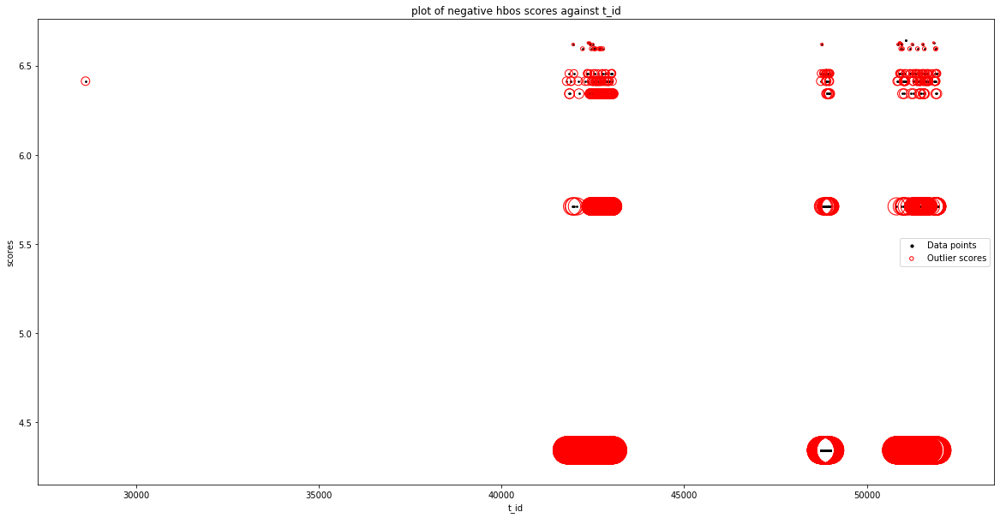

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_mean', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2356
Number of Outliers :  155
Outlier index: 0
Outlier score: 6.5329622127934766
Outlier index: 113
Outlier score: 6.633801888742505
Outlier index: 115
Outlier score: 6.532754438284211
Outlier index: 174
Outlier score: 6.532754438284211
Outlier index: 193
Outlier score: 6.532754438284211
Outlier index: 311
Outlier score: 6.625647612938694
Outlier index: 498
Outlier score: 6.591894205242806
Outlier index: 564
Outlier score: 6.591894205242806
Outlier index: 574
Outlier score: 6.625647612938694
Outlier index: 616
Outlier score: 6.532754438284211
Outlier index: 625
Outlier score: 6.532754438284211
Outlier i

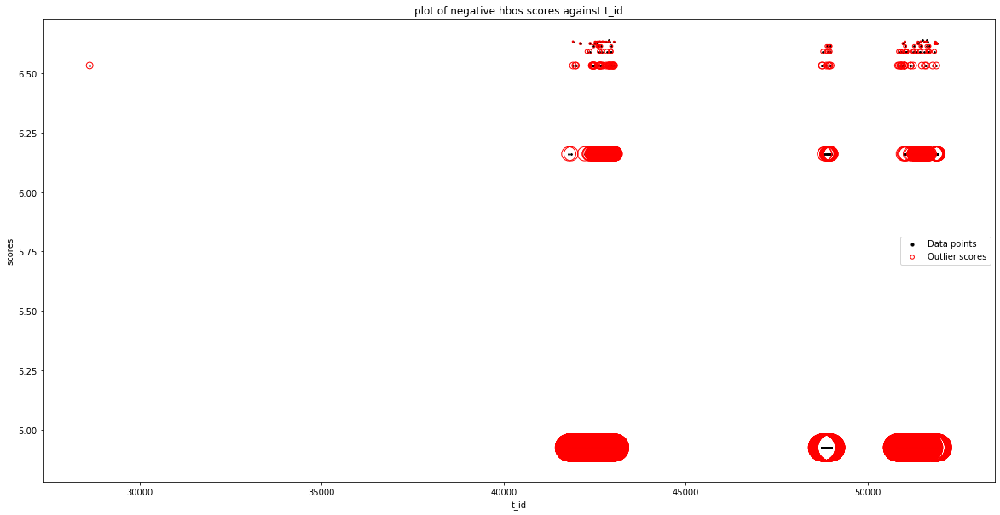

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'bwd_packet_length_std']
input parameters are being used in

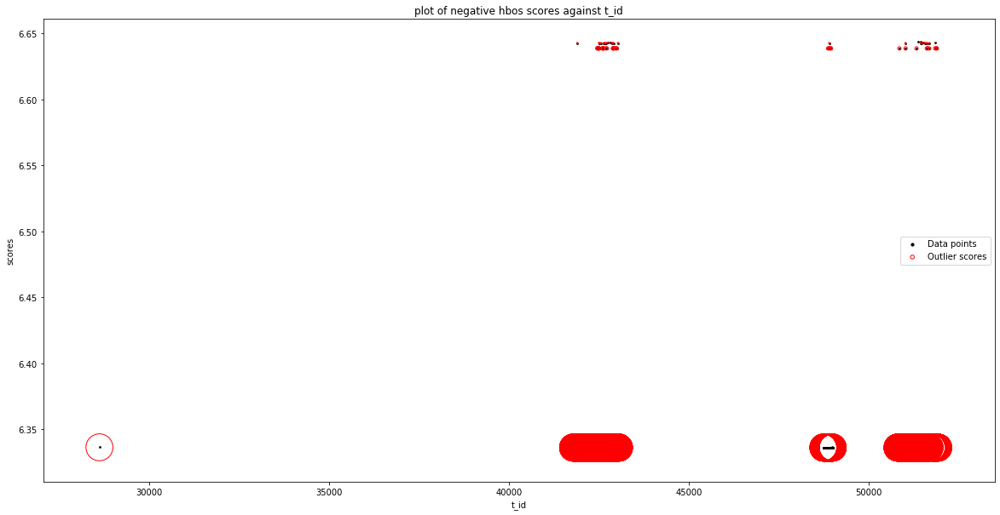

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_mean', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2399
Number of Outliers :  112
Outlier index: 653
Outlier score: 6.519639910820458
Outlier index: 663
Outlier score: 6.627797915164621
Outlier index: 667
Outlier score: 6.57935907350717
Outlier index: 674
Outlier score: 6.57935907350717
Outlier index: 687
Outlier score: 6.519639910820458
Outlier index: 689
Outlier score: 6.519639910820458
Outlier index: 694
Outlier score: 6.519639910820458
Outlier index: 701
Outlier score: 6.519639910820458
Outlier index: 707
Outlier score: 6.57935907350717
Outlier index: 709
Outlier score: 6.519639910820458
Outlier index: 713
Outlier score: 6.519639910820458
Outlier index: 732
Outlier score: 6.519639910820458
Outlier index: 747
Outlier score: 6.519639910820458
Outlier index: 749
Outlier score: 6.627797915164621
Outlier index: 762
Outlier score: 6.519639910820458
O

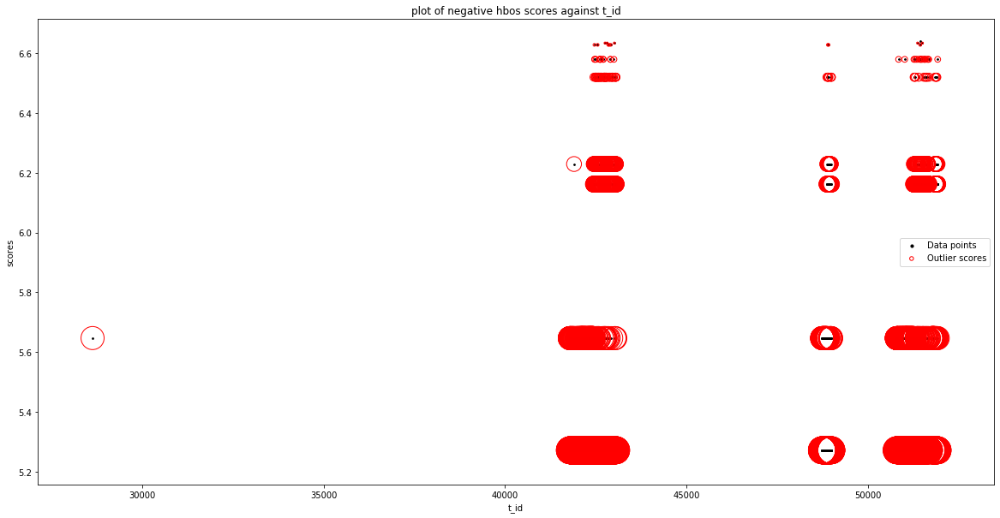

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_mean', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2508
Number of Outliers :  3
Outlier index: 0
Outlier score: 6.6169024910117376
Outlier index: 1468
Outlier score: 6.643845180328782
Outlier index: 2030
Outlier score: 6.643637405819517
Total number of outliers found: 3
Silhouetter Score: 0.999
davies bouldin Score: 0.667
calinski_harabasz Score: 5012.145


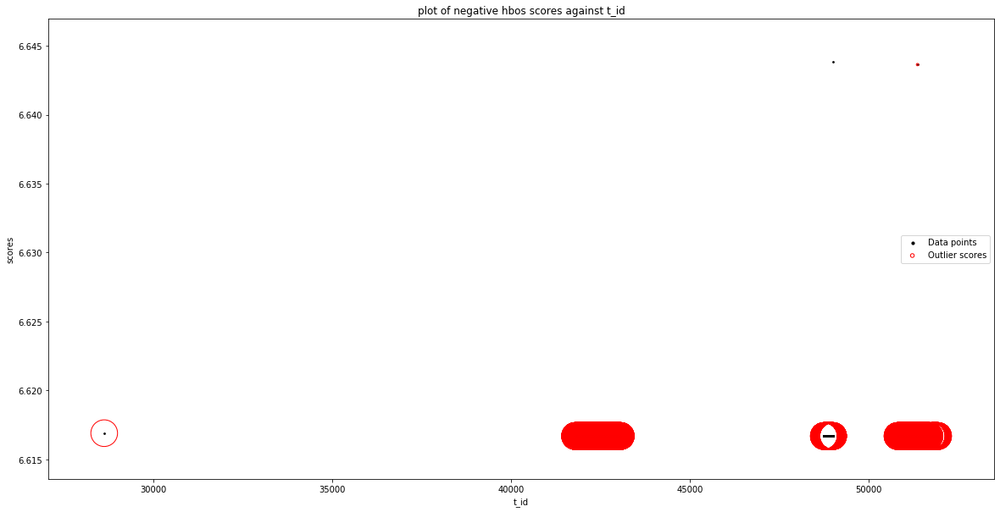

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_mean', 'flow_iat_min'], dtype='object')
Number of Inliers :  2506
Number of Outliers :  5
Outlier index: 0
Outlier score: 6.168839064288486
Outlier index: 199
Outlier score: 6.642975491723715
Outlier index: 631
Outlier score: 6.642975491723715
Outlier index: 1359
Outlier score: 6.642975491723715
Outlier index: 1468
Outlier score: 6.168839064288486
Total number of outliers found: 5
Silhouetter Score: 0.997
davies bouldin Score: 1.200
calinski_harabasz Score: 1669.213


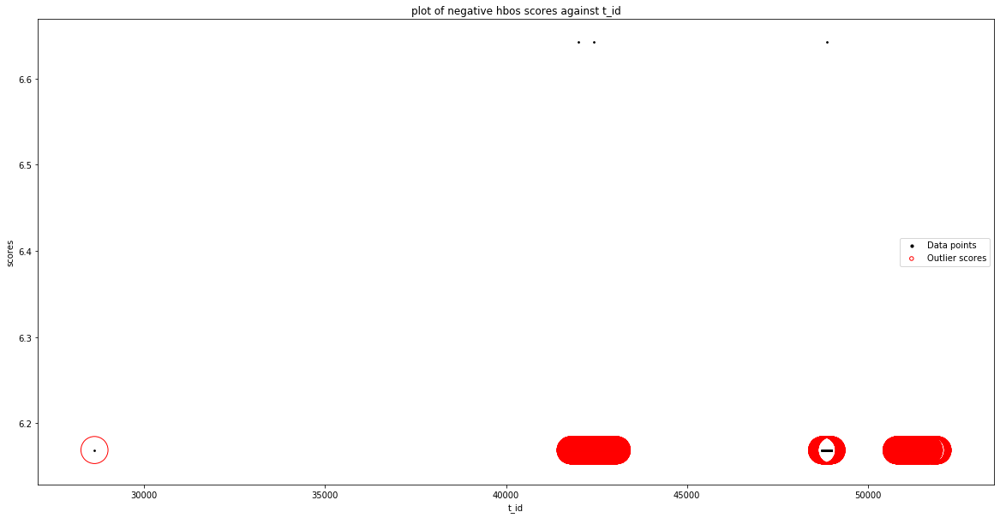

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_mean', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2457
Number of Outliers :  54
Outlier index: 0
Outlier score: 6.293591074059584

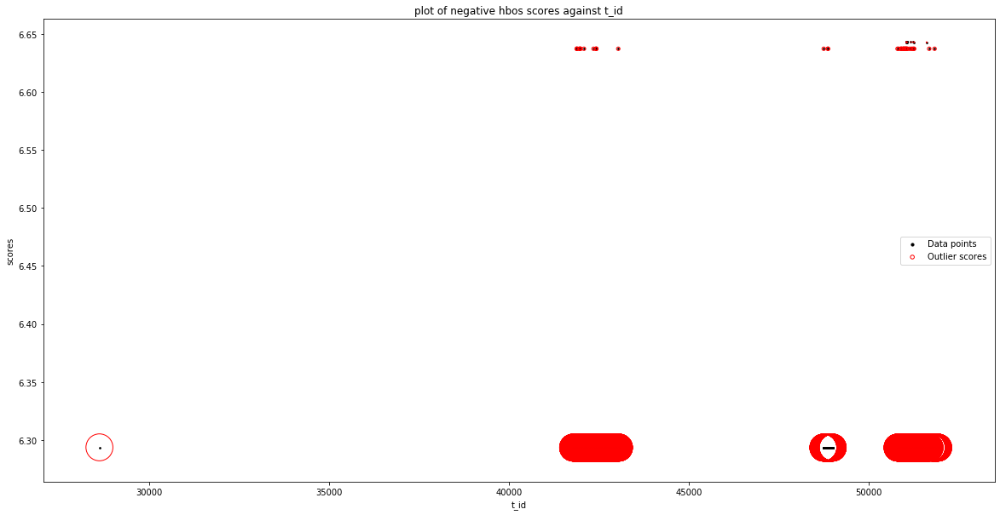

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_mean', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2443
Number of Outliers :  68
Outlier index: 0
Outlier score: 6.400488456029175


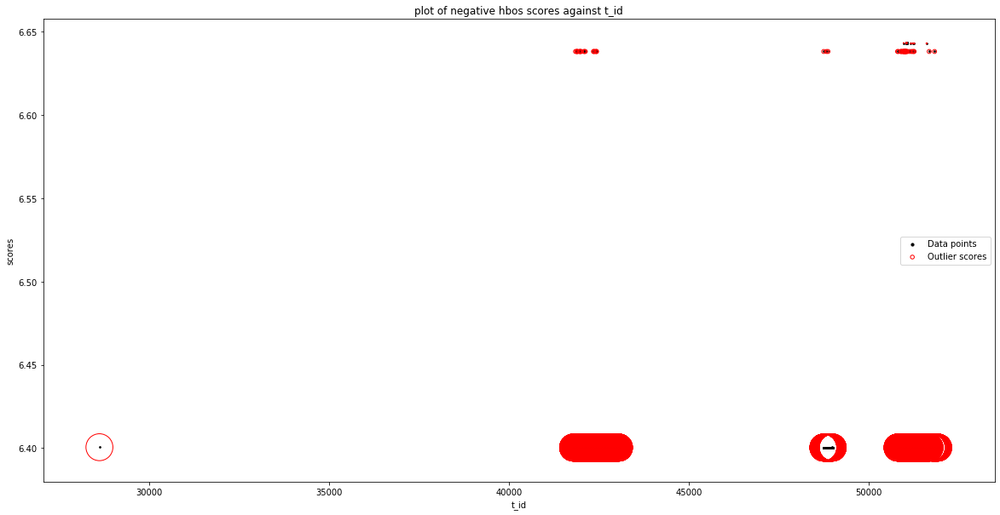

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'fwd_header_length']
input parameters are being used instead of default values
contamination

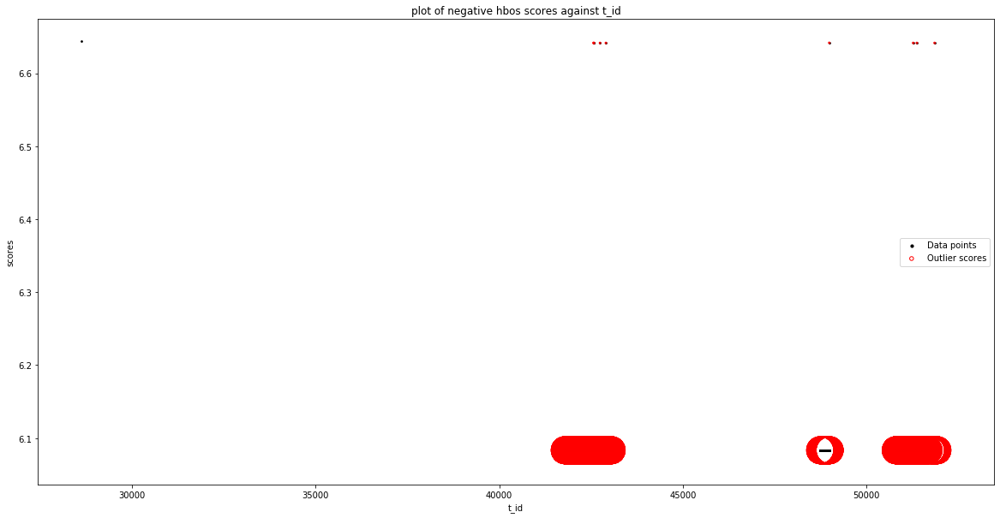

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'packet_length_mean']
input parameters are being used instead of default

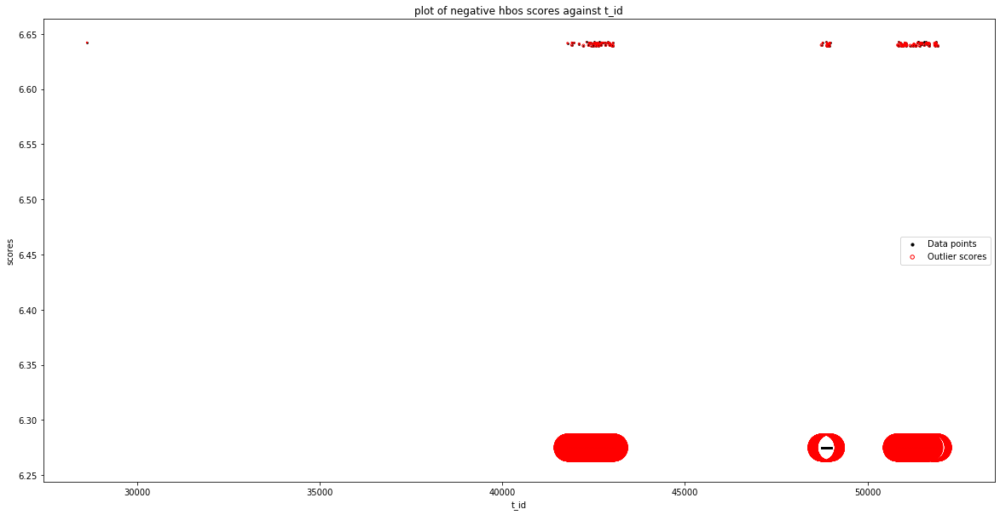

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_mean', 'psh_flag_count'], dtype='object')
Number of Inliers :  2506
Number of Outliers :  5
Outlier index: 0
Outlier score: 6.642488695979308
Outlier index: 763
Outlier score: 6.638186695623007
Outlier index: 937
Outlier score: 6.638186695623007
Outlier index: 1090
Outlier score: 6.638186695623007
Outlier index: 146

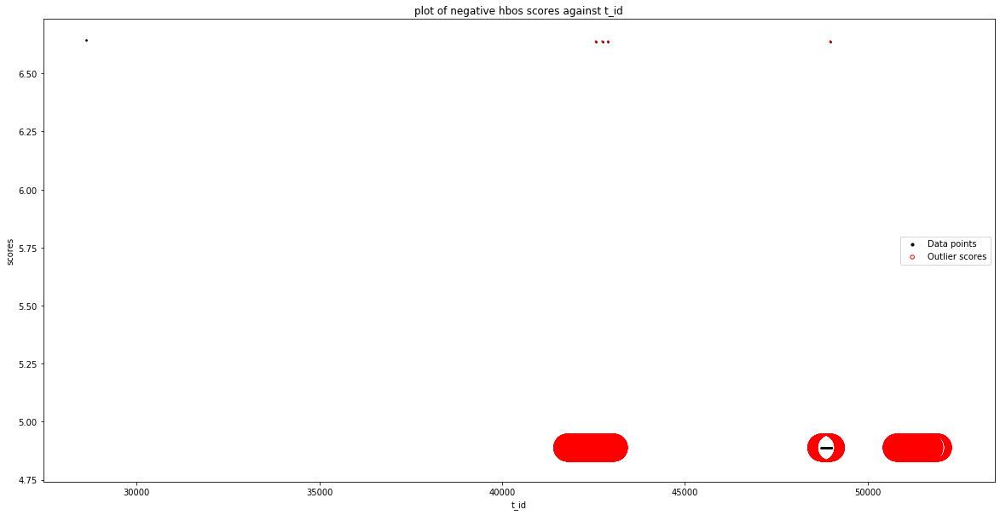

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'down_up_ratio']
input parameters are being used instead of default values
contamination

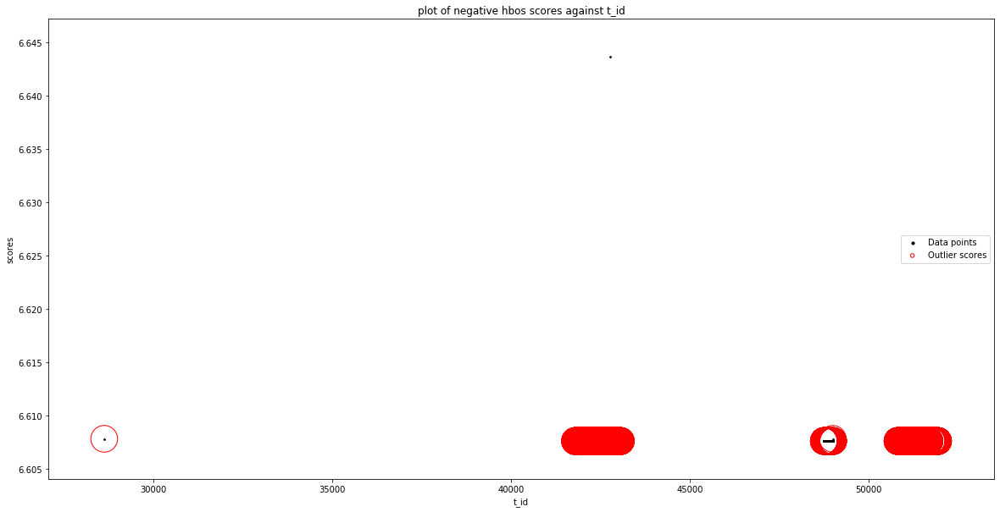

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'active_max']
input parameters are being used instead of default values
contamination: 

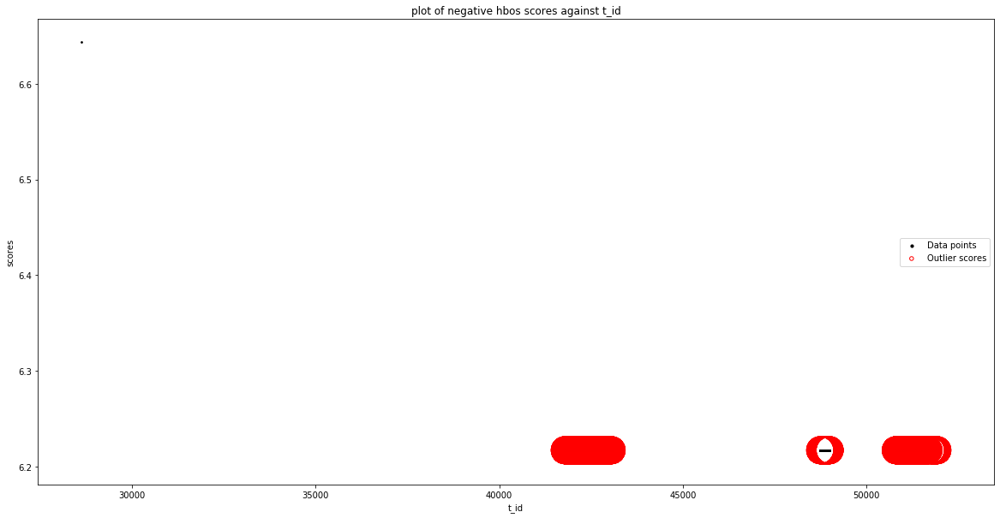

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_mean', 'a_id'], dtype='object')
Number of Inliers :  2510
Number of Outliers :  1
Outlier index: 0
Outlier score: 6.641608548591388
Total number of outliers found: 1
Silhouetter Score: 0.998
davies bouldin Score: 0.001
calinski_harabasz Score: 2508.052


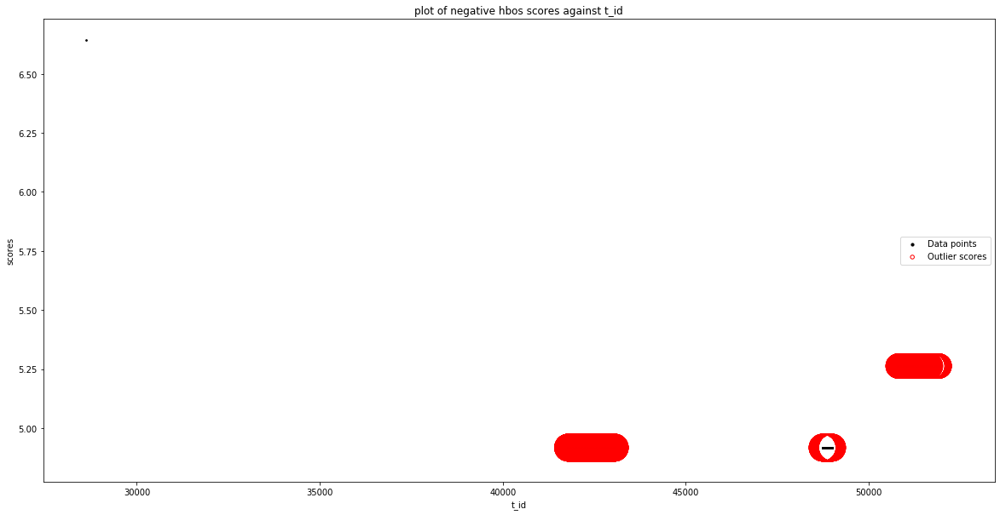

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'service_physical_ip']
input parameters are being used instead of default values
contaminati

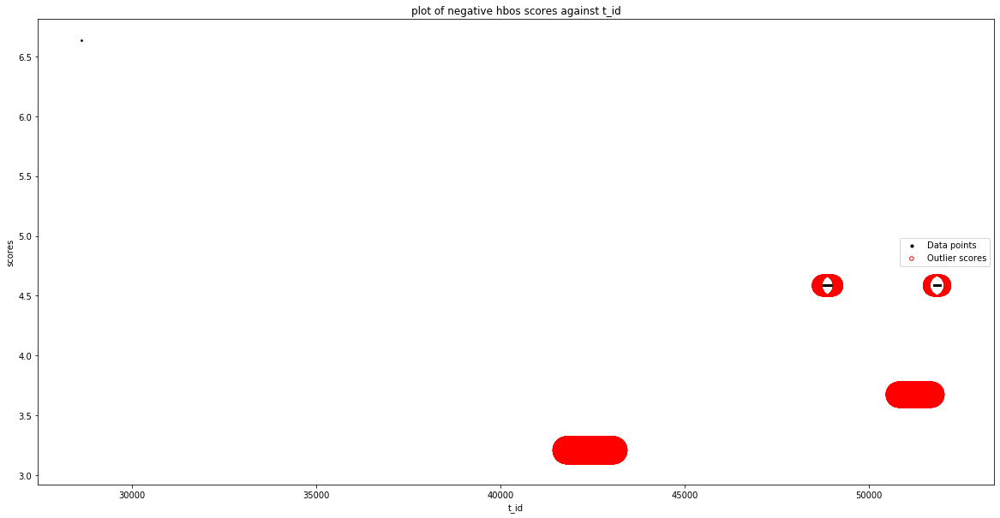

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_mean', 'log_start_time']
input parameters are being used instead of default values
contamination: 0.2

No valid feature
No Valid columns found for combination of  ['idle_std', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_std', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_std', 'bwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_std', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_std', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  

No valid feature
No Valid columns found for combination of  ['idle_std', 'a_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_std', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_std', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_std', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_std', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_std', 'service_physica

Silhouetter Score: -0.044
davies bouldin Score: 1.331
calinski_harabasz Score: 153.225


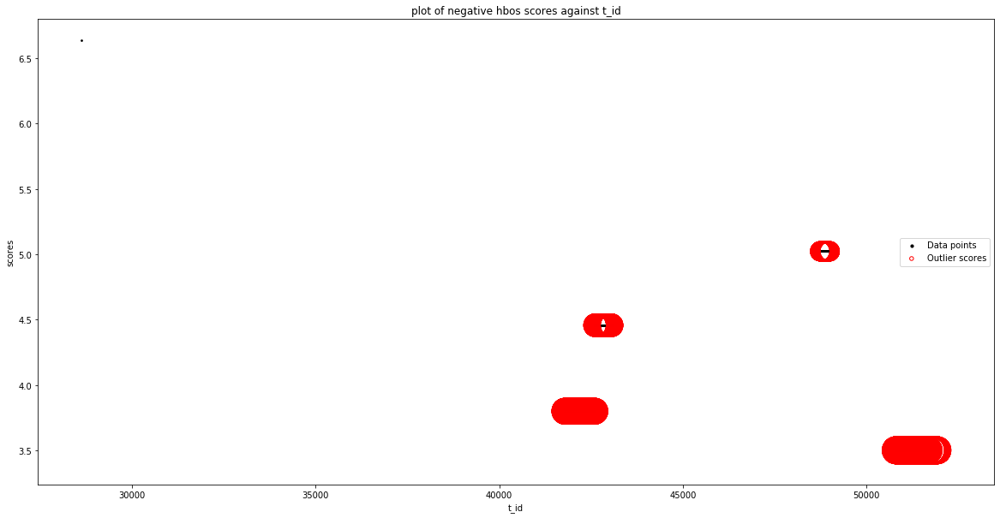

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_max', 'src_port'], dtype='object')
Number of Inliers :  2367
Number of Outliers :  144
Outlier index: 0
Outlier score: 6.622006031577381
Outlier index: 2358
Outlier score: 4.556552134634655
Outlier index: 2359
Outlier score: 4.556552134634655
Outlier index: 2360
Outlier score: 4.556552134634655
Outlier index: 2361
Outlier score: 4.556552134634655
Outlier index: 2362
Outlier score: 4.556552134634655
Outlier index: 2363
Outlier score: 4.556552134634655
Outlier index: 2364
Outlier score: 4.556552134634655
Outlier index: 2365
Outlier score: 4.556552134634655
Outlier index: 2366
Outlier score: 4.556552134634655
Outlier index: 2367
Outlier score: 4.556552134634655
Outlier index: 2368
Outlier sco

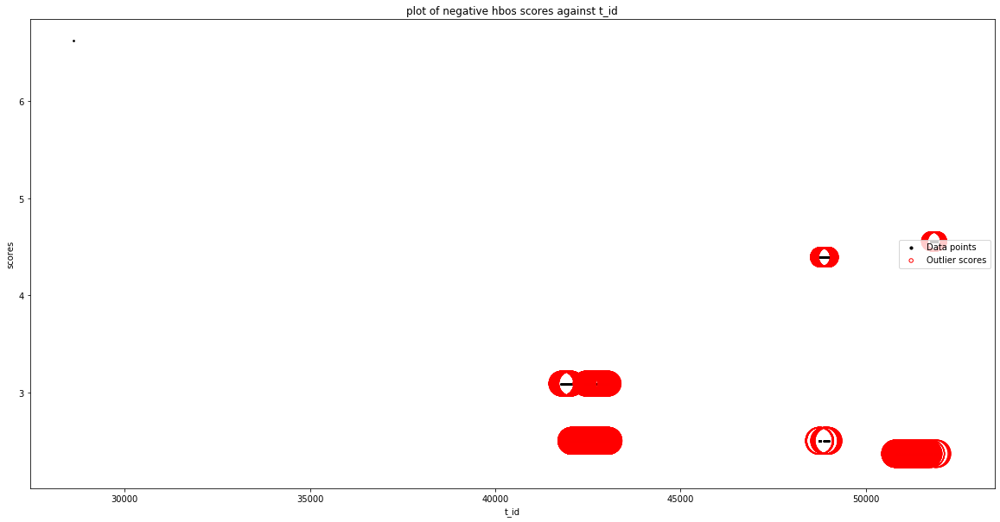

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_max', 'flow_duration'], dtype='object')
Number of Inliers :  2508
Number of Outliers :  3
Outlier index: 0
Outlier score: 6.643655869835509
Outlier index: 146

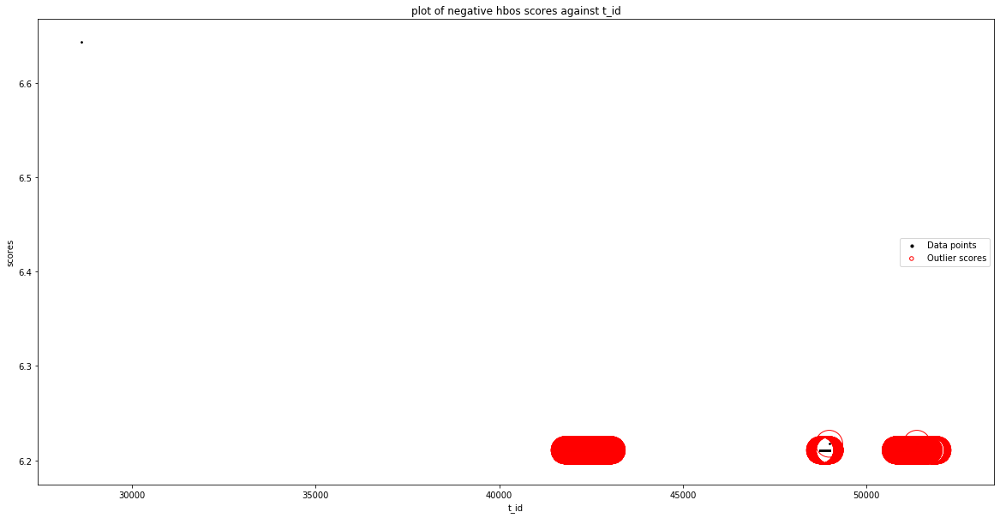

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_max', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2469
Number of Outliers :  42
Outlier index: 0
Outlier score: 6.643460425536714
Outlier index: 113
Outlier score: 6.216577275211465
Outlier index: 311
Outlier score: 6.211831589167199
Outlier index: 703
Outlier score: 6.211831589167199
Outlier index: 721
Outlier score: 6.211831589167199
Outlier index: 763
Outlier score: 6.216775351307501
Outlier index: 775
Outlier score: 6.216973454602304
Outlier index: 788
Outlier score:

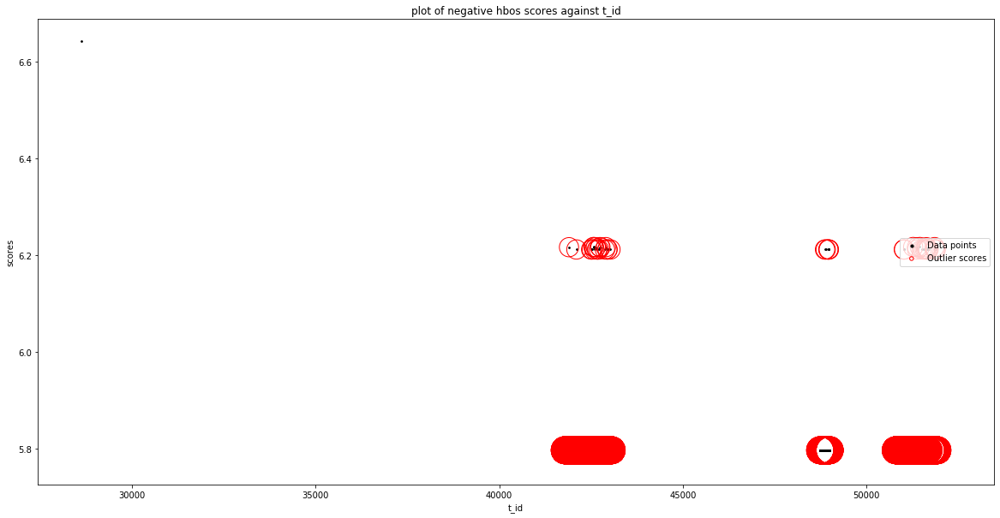

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_max', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2336
Number of Outliers :  175
Outlier index: 0
Outlier score: 6.412446403419368
Outlier index: 1
Outlier score: 5.986355720700754
Outlier index: 63
Outlier score: 6.029728416346636
Outlier index: 113
Outlier score: 5.986355720700754
Outlier index: 115
Outlier score: 5.986355720700754
Outlier index: 174
Outlier score: 6.19270633624366
Outlier index: 193
Outlier score: 6.029728416346636
Outlier index: 311
Outlier score: 5.986355720700754
Outlier index: 426
Outlier score: 6.168265930193046
Outlier index: 498
Outlier score: 5.986355720700754
Outlier index: 553
Outlier score: 6.029728416346636
Outlier inde

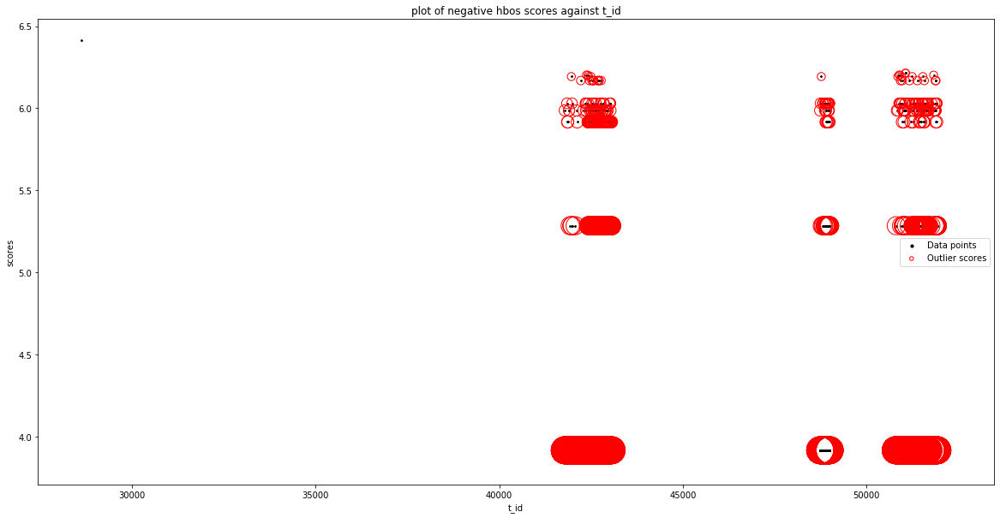

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_max', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2357
Number of Outliers :  154
Outlier index: 0
Outlier score: 6.532764799258846
Outlier index: 113
Outlier score: 6.207721566998525
Outlier index: 115
Outlier score: 6.106674116540232
Outlier index: 174
Outlier score: 6.106674116540232
Outlier index: 193
Outlier score: 6.106674116540232
Outlier index: 311
Outlier score: 6.199567291194715
Outlier index: 498
Outlier score: 6.165813883498826
Outlier index: 564
Outlier score: 6.165813883498826
Outlier index: 574
Outlier score: 6.199567291194715
Outlier index: 616
Outlier score: 6.106674116540232
Outlier index: 625
Outlier score: 6.106674116540232
Outlier inde

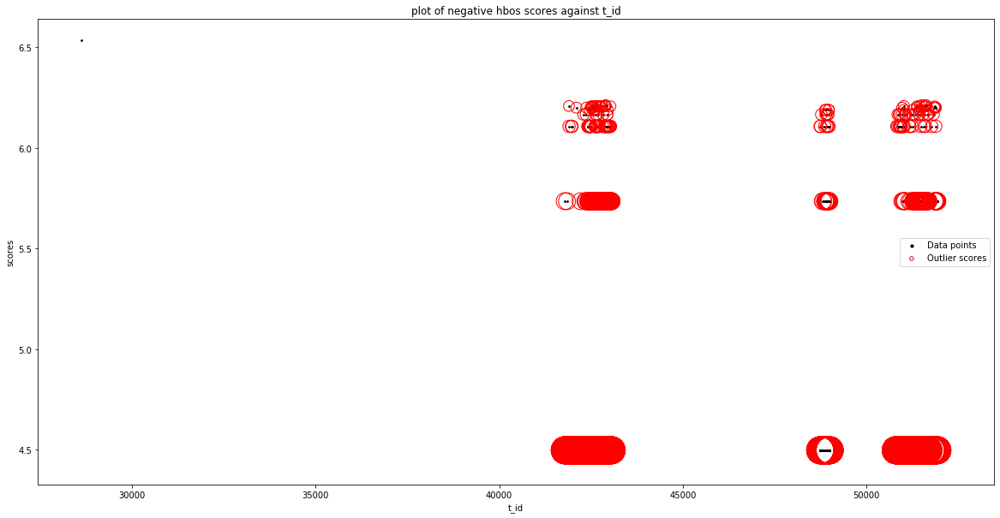

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'bwd_packet_length_std']
input parameters are being used instead

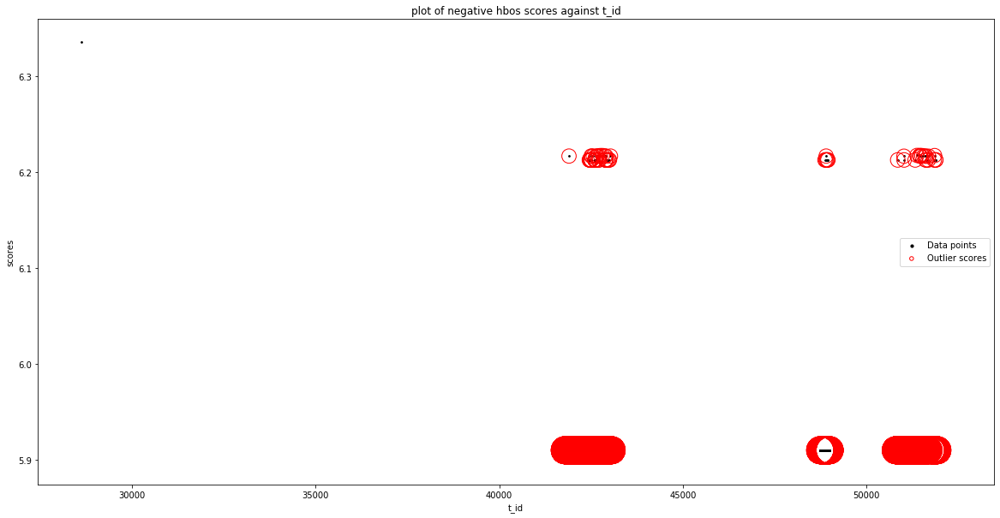

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_max', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2399
Number of Outliers :  112
Outlier index: 653
Outlier score: 6.093559589076477
Outlier index: 663
Outlier score: 6.201717593420641
Outlier index: 667
Outlier score: 6.153278751763191
Outlier index: 674
Outlier score: 6.153278751763191
Outlier index: 687
Outlier score: 6.093559589076477
Outlier index: 689
Outlier score: 6.093559589076477
Outlier index: 694
Outlier score: 6.093559589076477
Outlier index: 701
Outlier score: 6.093559589076477
Outlier index: 707
Outlier score: 6.153278751763191
Outlier index: 709
Outlier score: 6.093559589076477
Outlier index: 713
Outlier score: 6.093559589076477
Outlier index: 732
Outlier score: 6.093559589076477
Outlier index: 747
Outlier score: 6.093559589076477
Outlier index: 749
Outlier score: 6.201717593420641
Outlier index: 762
Outlier score: 6.093559589076477

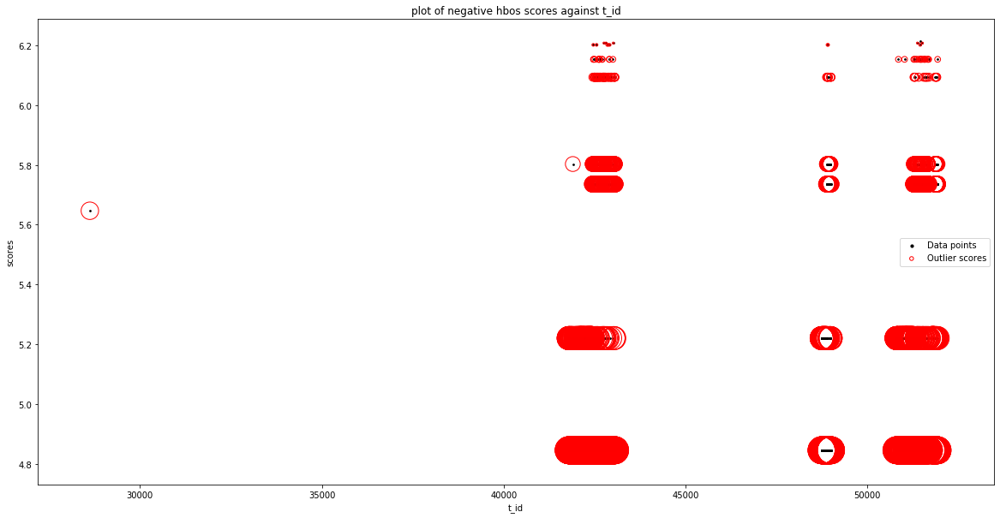

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_max', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2508
Number of Outliers :  3
Outlier index: 0
Outlier score: 6.616705077477107
Outlier index: 1468
Outlier score: 6.217557084075537
Outlier index: 2030
Outlier score: 6.217557084075537
Total number of outliers found: 3
Silhouetter Score: 0.990
davies bouldin Score: 1.023
calinski_harabasz Score: 1977.044


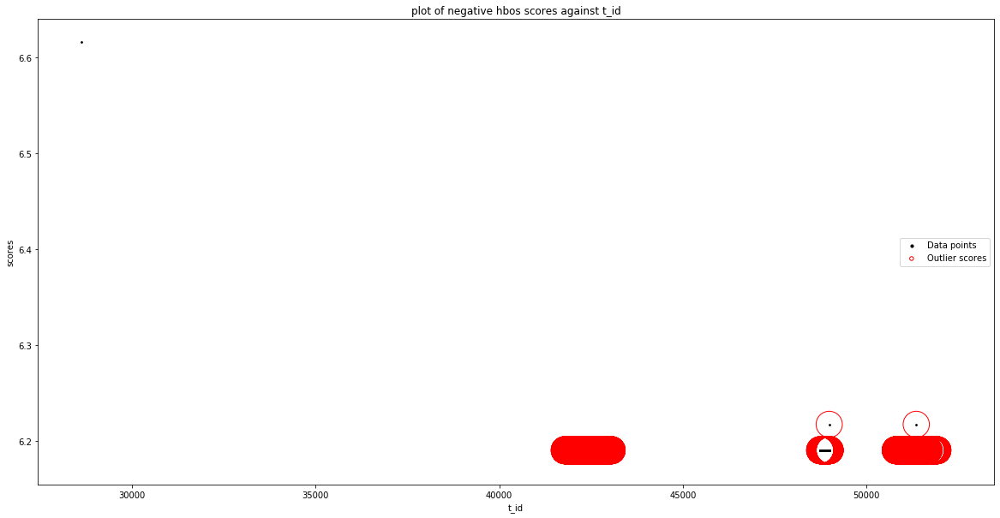

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_max', 'flow_iat_min'], dtype='object')
Number of Inliers :  2507
Number of Outliers :  4
Outlier index: 0
Outlier score: 6.168641650753855
Outlier index: 199
Outlier score: 6.216895169979734
Outlier index: 631
Outlier score: 6.216895169979734
Outlier index: 1359
Outlier score: 6.216895169979734
Total number of outliers found: 4
Silhouetter Score: 0.950
davies bouldin Score: 0.805
calinski_harabasz Score: 830.268


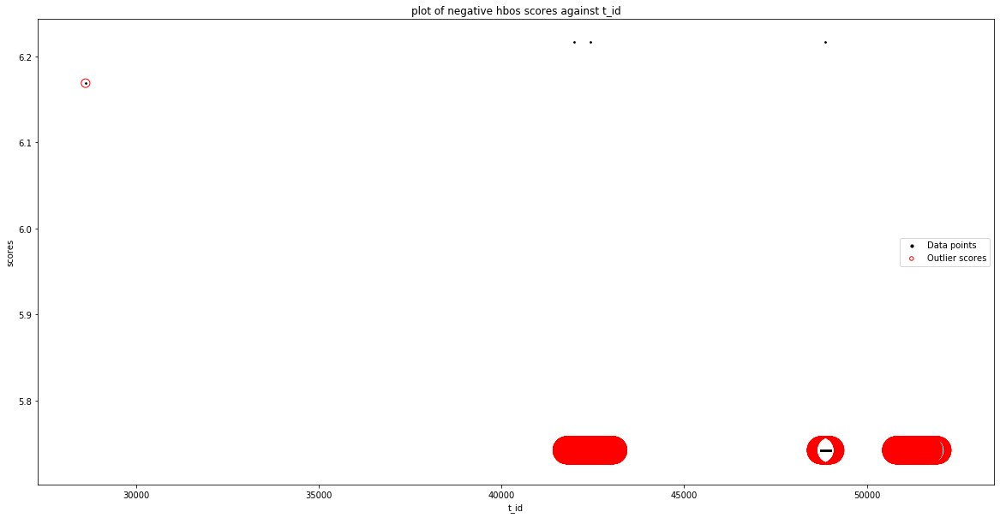

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_max', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2458
Number of Outliers :  53
Outlier index: 0
Outlier score: 6.293393660524954
Outl

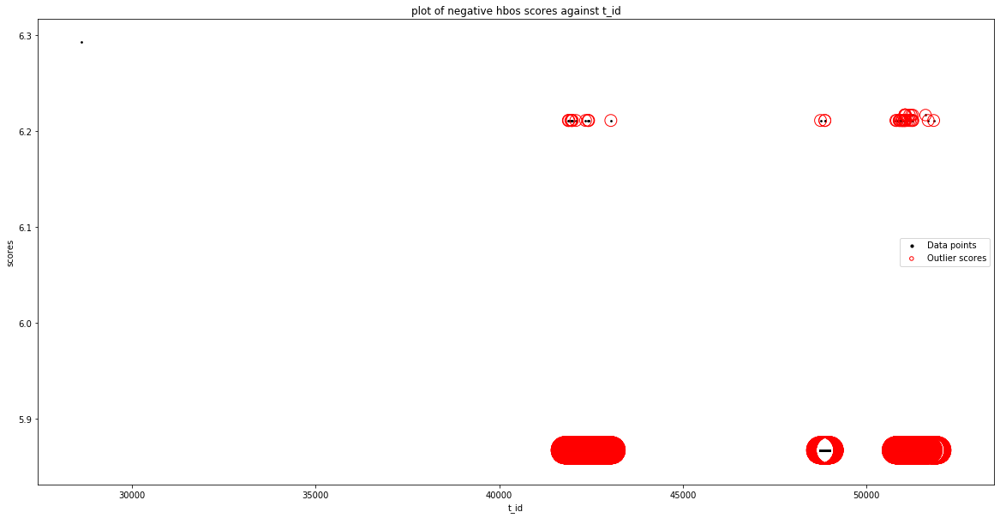

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_max', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2444
Number of Outliers :  67
Outlier index: 0
Outlier score: 6.400291042494544
Outli

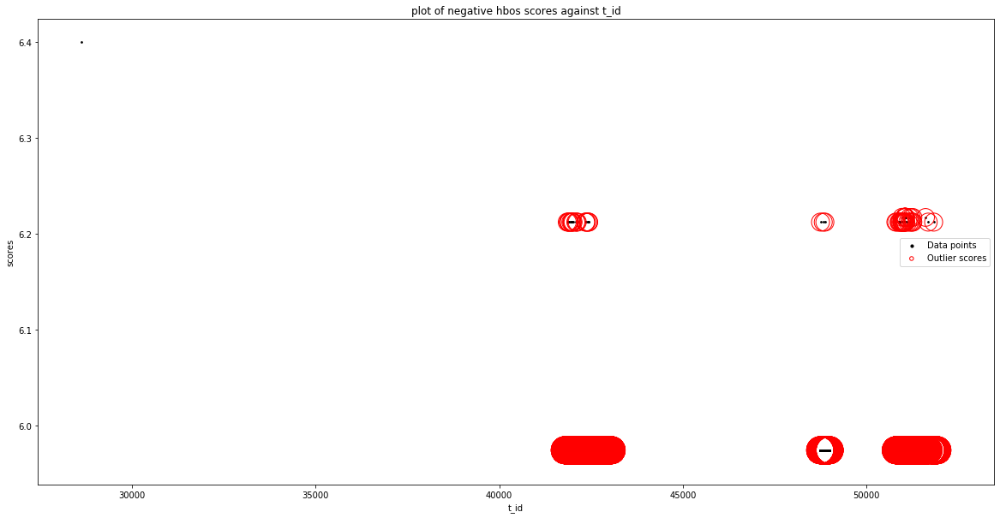

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.2

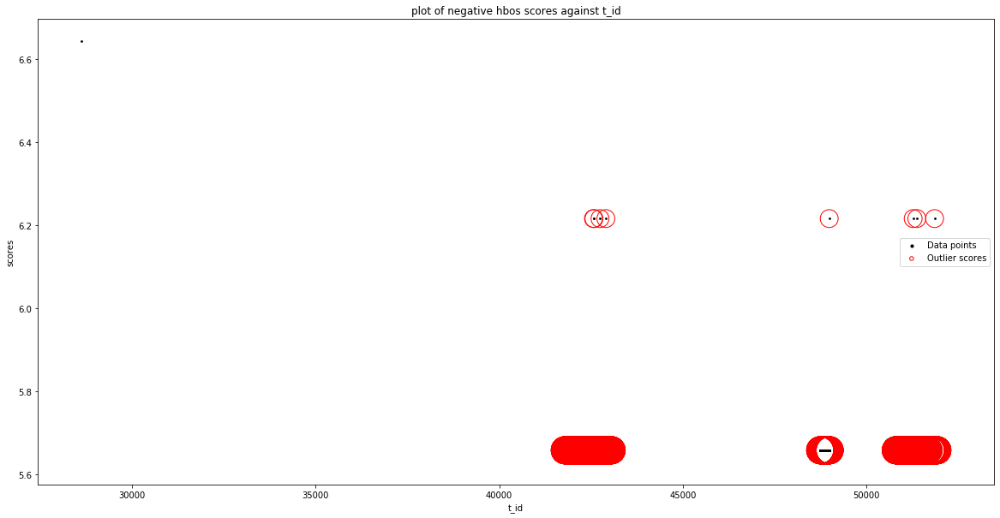

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'packet_length_mean']
input parameters are being used instead of default valu

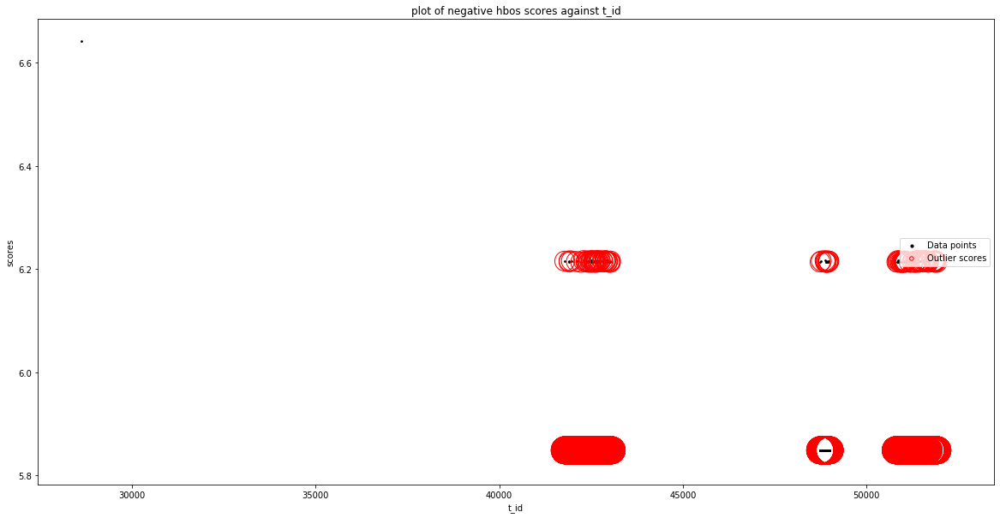

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_max', 'psh_flag_count'], dtype='object')
Number of Inliers :  2506
Number of Outliers :  5
Outlier index: 0
Outlier score: 6.642291282444678
Outlier index: 763
Outlier score: 6.212106373879028
Outlier index: 937
Outlier score: 6.212106373879028
Outlier index: 1090
Outlier score: 6.212106373879028
Outlier index: 1468
Ou

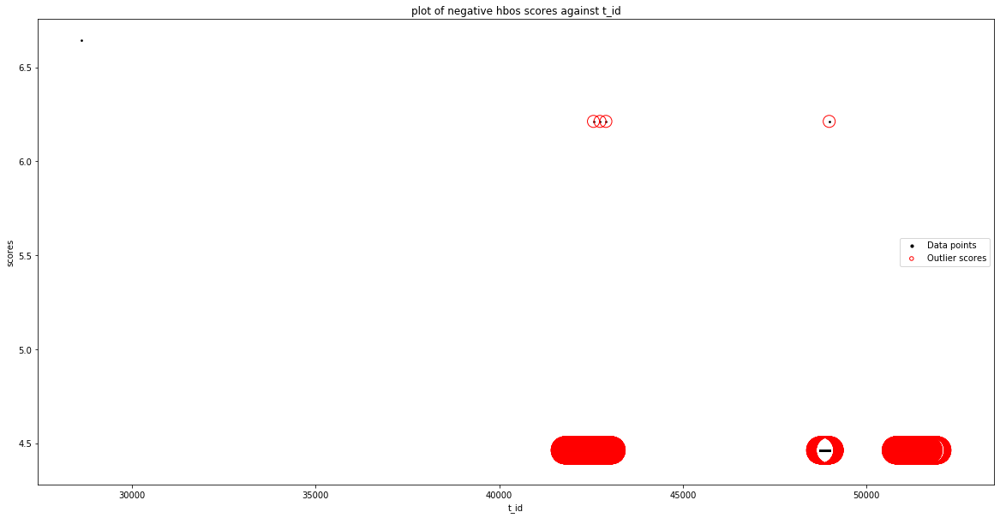

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'down_up_ratio']
input parameters are being used instead of default values
contamination: 0.2

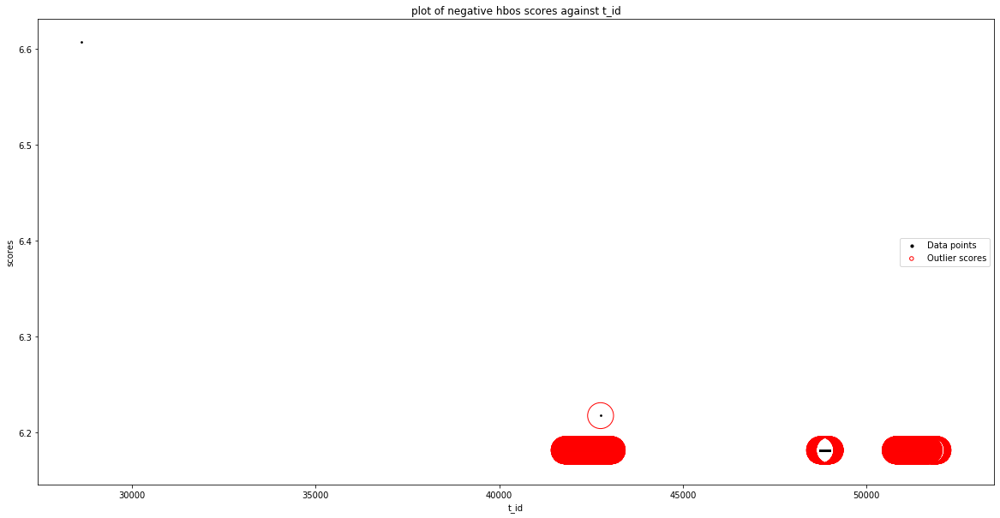

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'active_max']
input parameters are being used instead of default values
contamination: 0.27


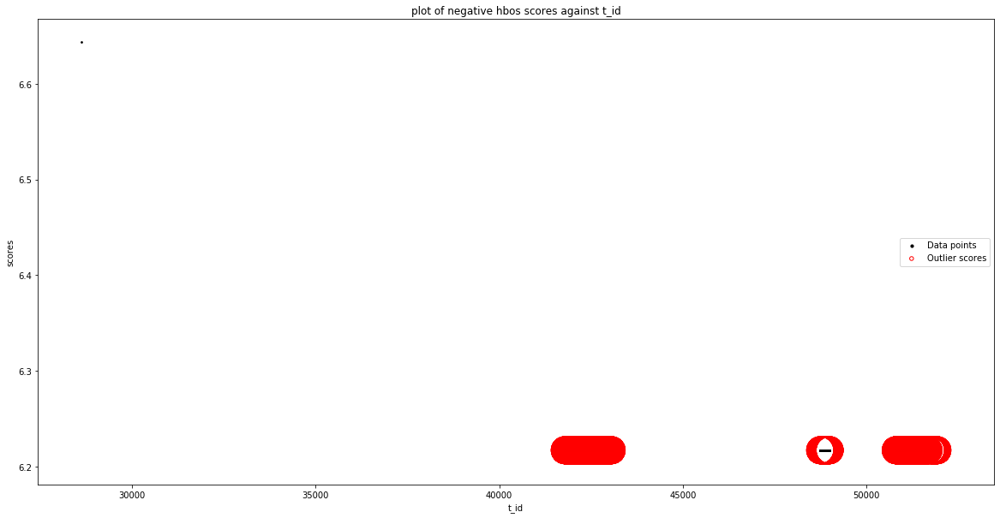

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['idle_max', 'a_id'], dtype='object')
Number of Inliers :  2510
Number of Outliers :  1
Outlier index: 0
Outlier score: 6.6414111350567575
Total number of outliers found: 1
Silhouetter Score: 0.956
davies bouldin Score: 0.042
calinski_harabasz Score: 539.099


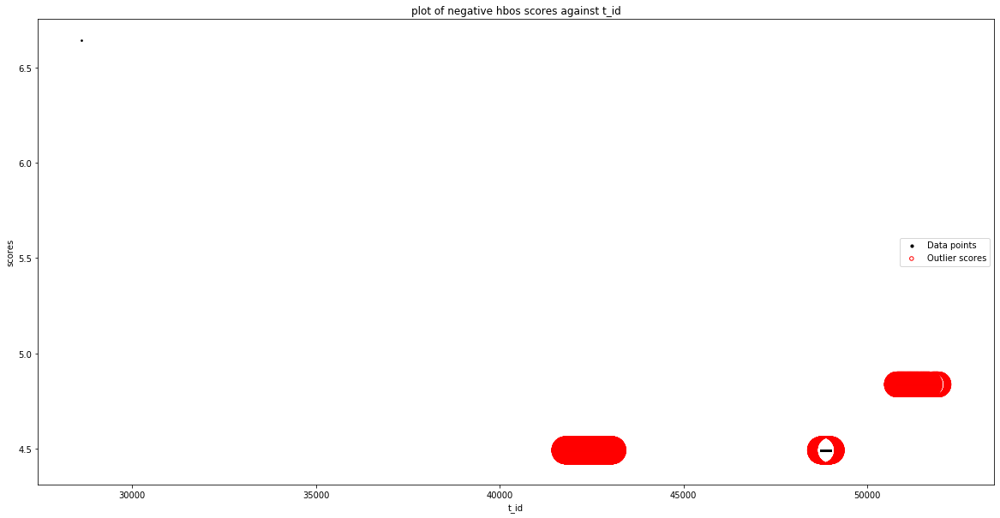

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'service_physical_ip']
input parameters are being used instead of default values
contamination: 0

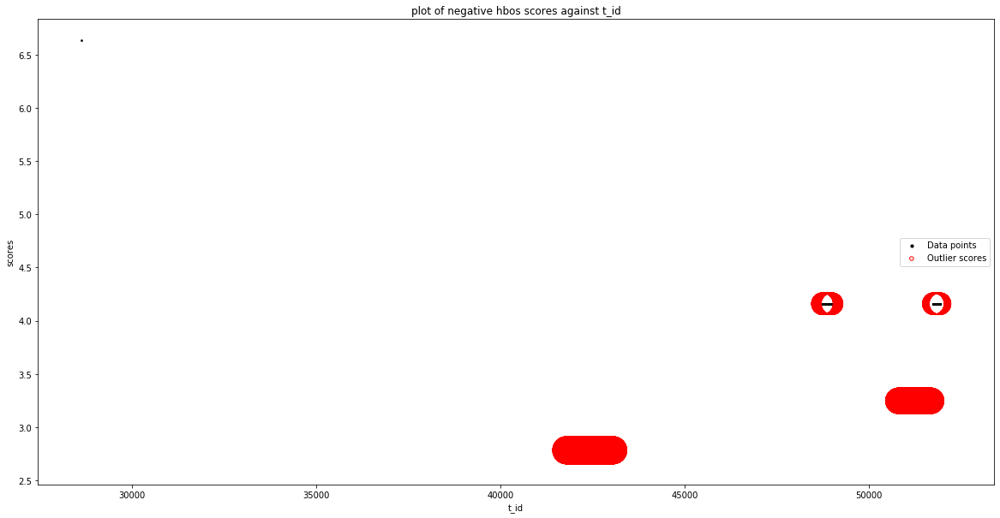

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_max', 'log_start_time']
input parameters are being used instead of default values
contamination: 0.27
n_n

No valid feature
No Valid columns found for combination of  ['idle_min', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_min', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_min', 'bwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_min', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_min', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  

No valid feature
No Valid columns found for combination of  ['idle_min', 'a_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_min', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_min', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_min', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_min', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['idle_min', 'service_physica

No valid feature
No Valid columns found for combination of  ['gw_agent_id', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['gw_agent_id', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['gw_agent_id', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['gw_agent_id', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['gw_agent_id', 'bwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['gw_agent_i

No valid feature
No Valid columns found for combination of  ['gw_agent_id', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['gw_agent_id', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['gw_agent_id', 'active_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['gw_agent_id', 'active_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['gw_agent_id', 'idle_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['gw_agent_id', 'idl

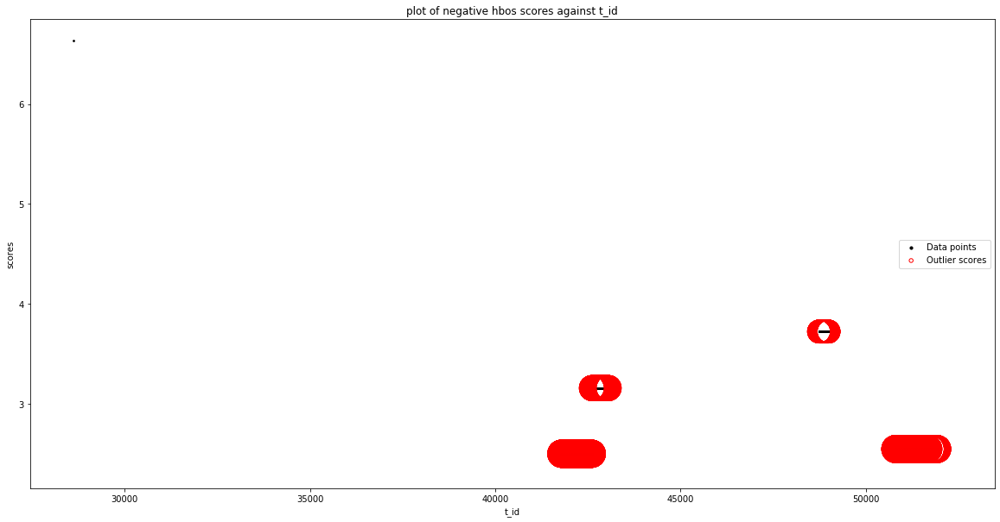

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['a_id', 'src_port'], dtype='object')
Number of Inliers :  2367
Number of Outliers :  144
Outlier index: 0
Outlier score: 6.619956135463552
Outlier index: 2358
Outlier score: 3.6019682309111483
Outlier index: 2359
Outlier score: 3.6019682309111483
Outlier index: 2360
Outlier score: 3.6019682309111483
Outlier index: 2361
Outlier score: 3.6019682309111483
Outlier index: 2362
Outlier score: 3.6019682309111483
Outlier index: 2363
Outlier score: 3.6019682309111483
Outlier index: 2364
Outlier score: 3.6019682309111483
Outlier index: 2365
Outlier score: 3.6019682309111483
Outlier index: 2366
Outlier score: 3.6019682309111483
Outlier index: 2367
Outlier score: 3.6019682309111483
Outlier index: 2368
Outlier s

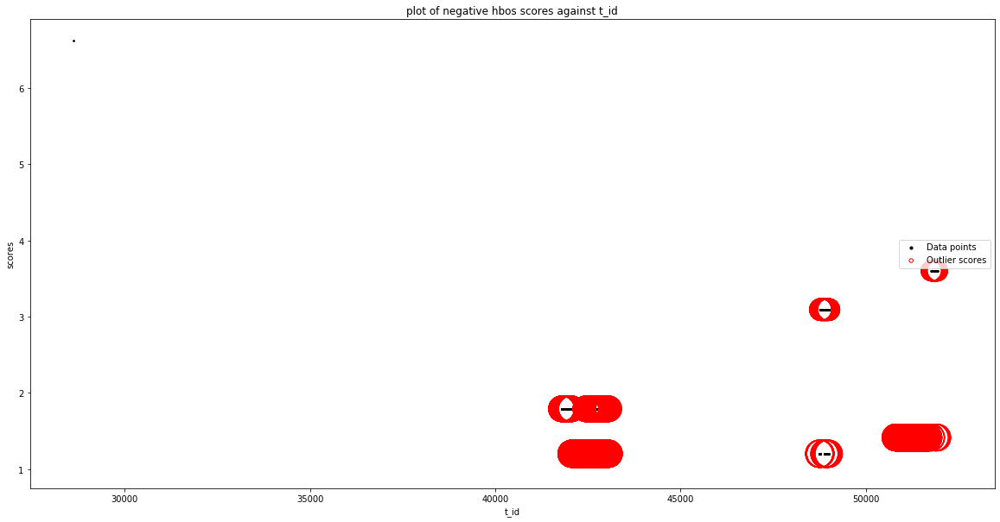

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['a_id', 'flow_duration'], dtype='object')
Number of Inliers :  2509
Number of Outliers :  2
Outlier index: 0
Outlier score: 6.6416059737216795
Outlier index: 2046
Outlier score: 5.

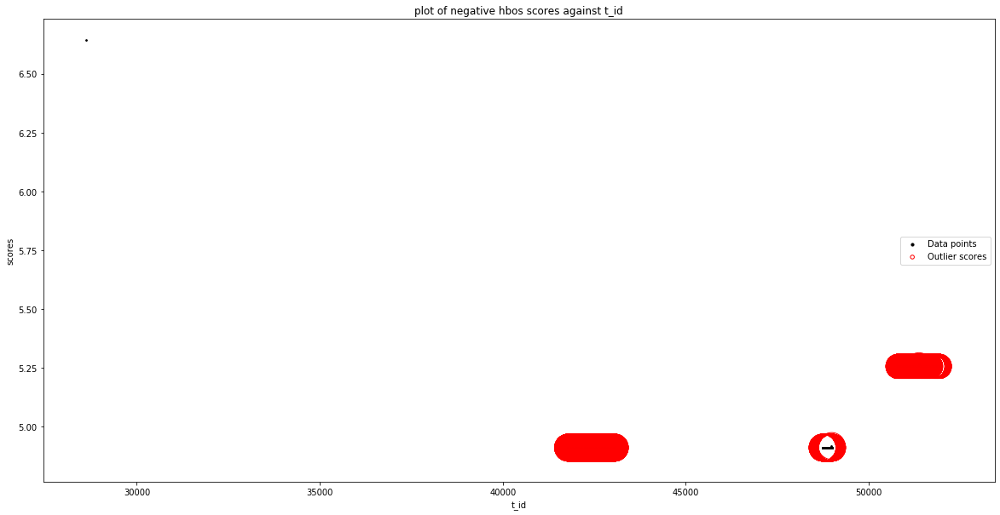

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['a_id', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2469
Number of Outliers :  42
Outlier index: 0
Outlier score: 6.641410529422884
Outlier index: 113
Outlier score: 4.916493752076116
Outlier index: 311
Outlier score: 4.9117480660318495
Outlier index: 703
Outlier score: 4.9117480660318495
Outlier index: 721
Outlier score: 4.9117480660318495
Outlier index: 763
Outlier score: 4.9166918281721514
Outlier index: 775
Outlier score: 4.9168899314669545
Outlier index: 788
Outlier score: 4.9117

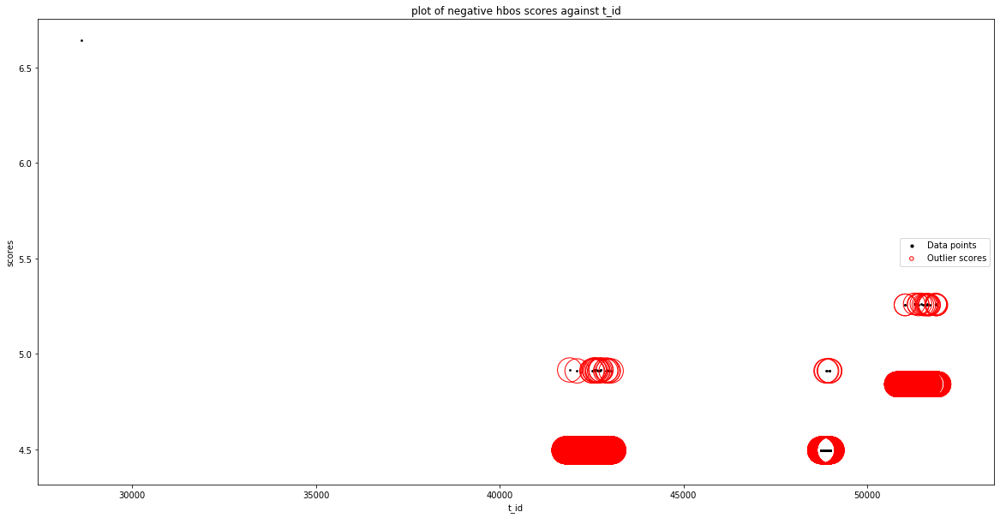

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['a_id', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2324
Number of Outliers :  187
Outlier index: 0
Outlier score: 6.4103965073055384
Outlier index: 1
Outlier score: 4.686272197565405
Outlier index: 63
Outlier score: 4.729644893211288
Outlier index: 113
Outlier score: 4.686272197565405
Outlier index: 115
Outlier score: 4.686272197565405
Outlier index: 174
Outlier score: 4.892622813108312
Outlier index: 193
Outlier score: 4.729644893211288
Outlier index: 311
Outlier score: 4.686272197565405
Outlier index: 426
Outlier score: 4.868182407057698
Outlier index: 498
Outlier score: 4.686272197565405
Outlier index: 553
Outlier score: 4.729644893211288
Outlier index: 554

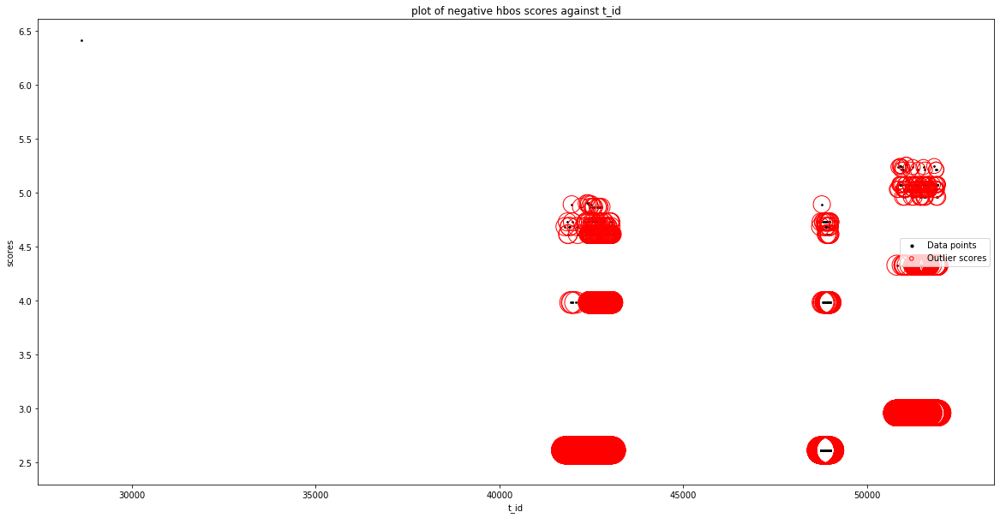

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['a_id', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2357
Number of Outliers :  154
Outlier index: 0
Outlier score: 6.530714903145016
Outlier index: 113
Outlier score: 4.907638043863176
Outlier index: 115
Outlier score: 4.8065905934048825
Outlier index: 174
Outlier score: 4.8065905934048825
Outlier index: 193
Outlier score: 4.8065905934048825
Outlier index: 311
Outlier score: 4.8994837680593655
Outlier index: 498
Outlier score: 4.865730360363477
Outlier index: 564
Outlier score: 4.865730360363477
Outlier index: 574
Outlier score: 4.8994837680593655
Outlier index: 616
Outlier score: 4.8065905934048825
Outlier index: 625
Outlier score: 4.8065905934048825
Outlier index

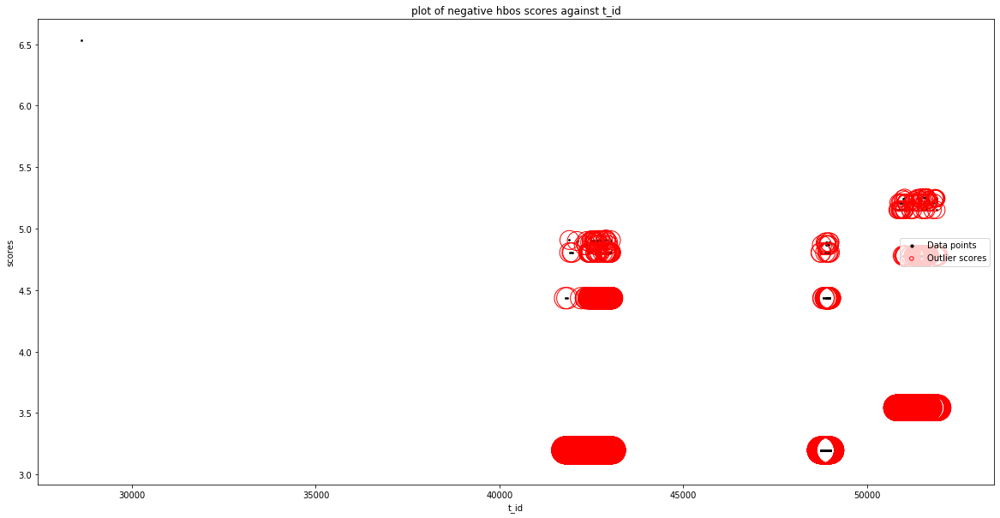

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'bwd_packet_length_std']
input parameters are being used instead of default values
c

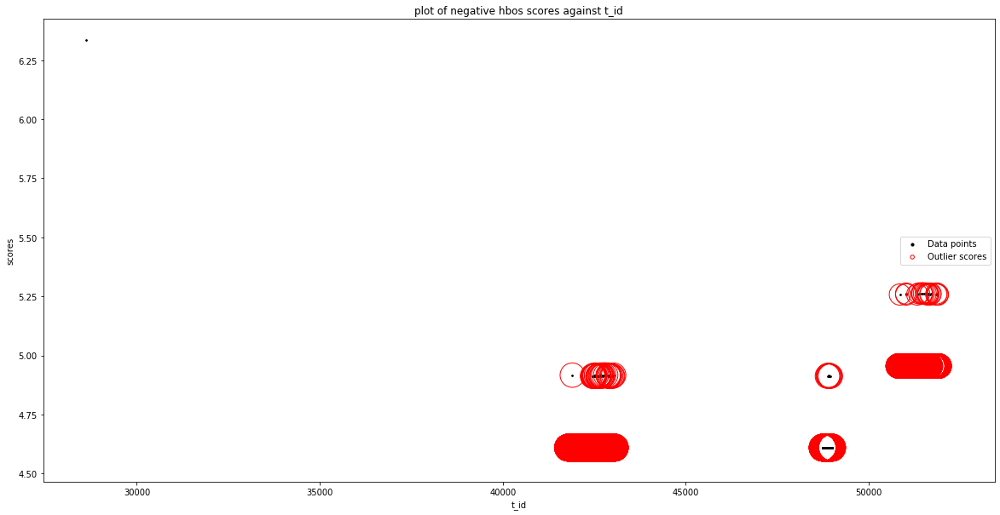

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['a_id', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2315
Number of Outliers :  196
Outlier index: 0
Outlier score: 5.644765961443179
Outlier index: 653
Outlier score: 4.793476065941129
Outlier index: 663
Outlier score: 4.901634070285292
Outlier index: 667
Outlier score: 4.8531952286278415
Outlier index: 674
Outlier score: 4.8531952286278415
Outlier index: 687
Outlier score: 4.793476065941129
Outlier index: 689
Outlier score: 4.793476065941129
Outlier index: 694
Outlier score: 4.793476065941129
Outlier index: 701
Outlier score: 4.793476065941129
Outlier index: 707
Outlier score: 4.8531952286278415
Outlier index: 709
Outlier score: 4.793476065941129
Outlier index: 713
Outlier score: 4.793476065941129
Outlier index: 732
Outlier score: 4.793476065941129
Outlier index: 747
Outlier score: 4.793476065941129
Outlier index: 749
Outlier score: 4.901634070285292
Ou

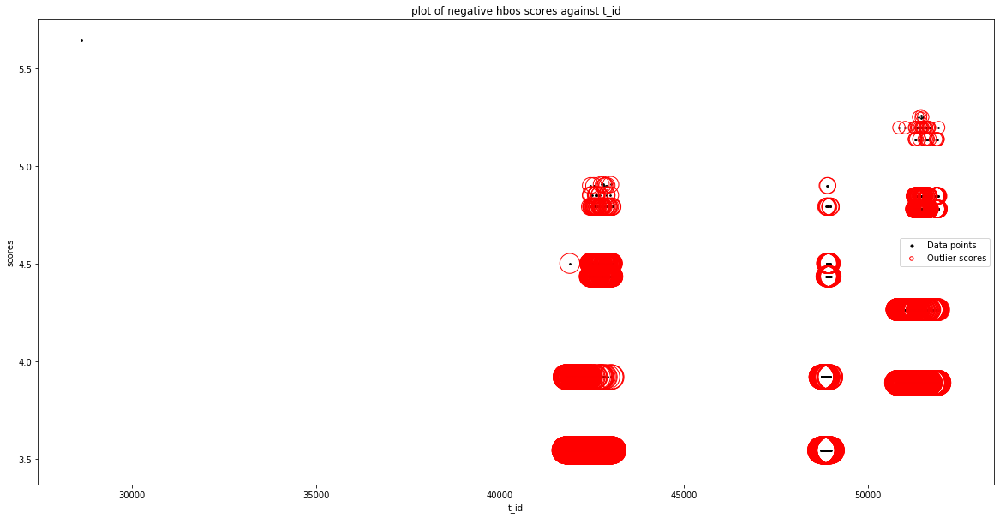

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['a_id', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2509
Number of Outliers :  2
Outlier index: 0
Outlier score: 6.614655181363277
Outlier index: 2030
Outlier score: 5.26297318035203
Total number of outliers found: 2
Silhouetter Score: 0.973
davies bouldin Score: 0.552
calinski_harabasz Score: 42.831


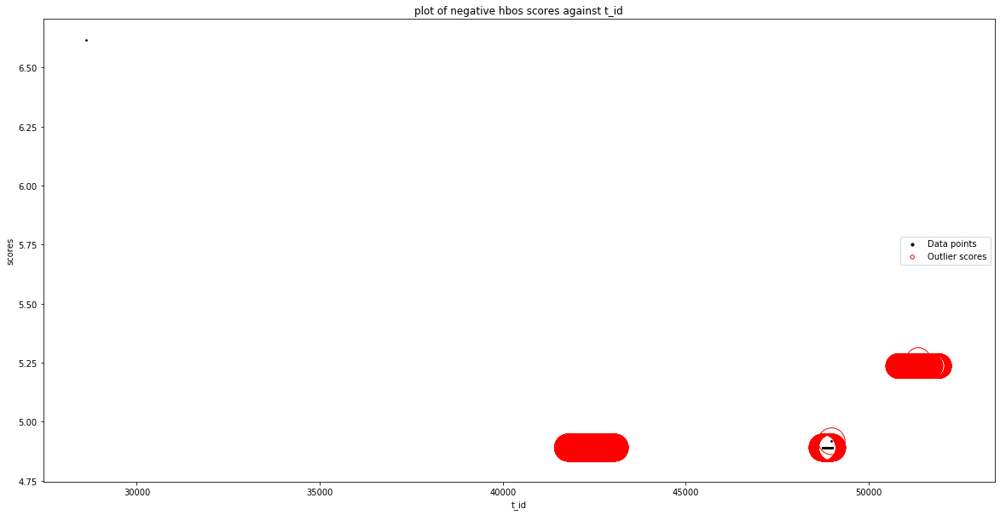

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['a_id', 'flow_iat_min'], dtype='object')
Number of Inliers :  2507
Number of Outliers :  4
Outlier index: 0
Outlier score: 6.1665917546400255
Outlier index: 199
Outlier score: 4.916811646844386
Outlier index: 631
Outlier score: 4.916811646844386
Outlier index: 1359
Outlier score: 4.916811646844386
Total number of outliers found: 4
Silhouetter Score: 0.973
davies bouldin Score: 0.534
calinski_harabasz Score: 3691.881


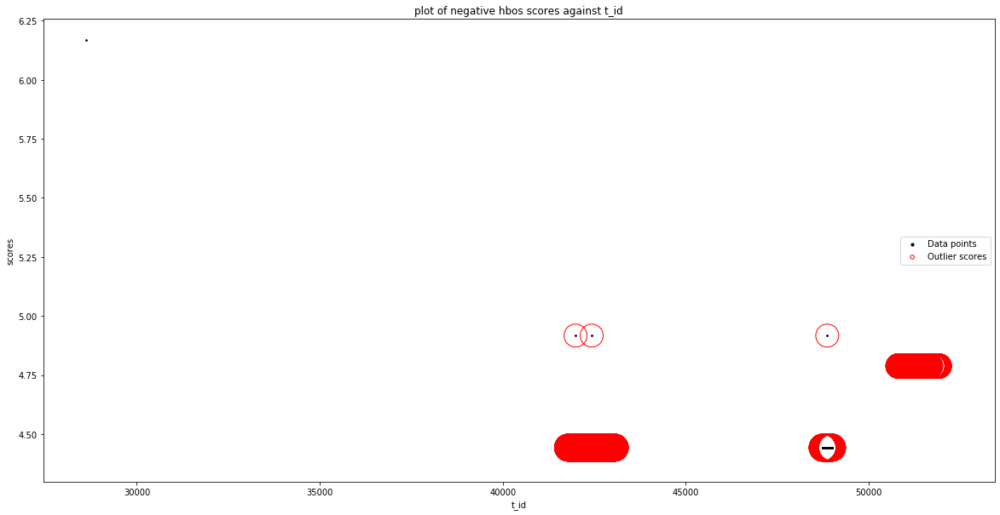

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['a_id', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2474
Number of Outliers :  37
Outlier index: 0
Outlier score: 6.291343764411124
Outlier index: 1484
Outl

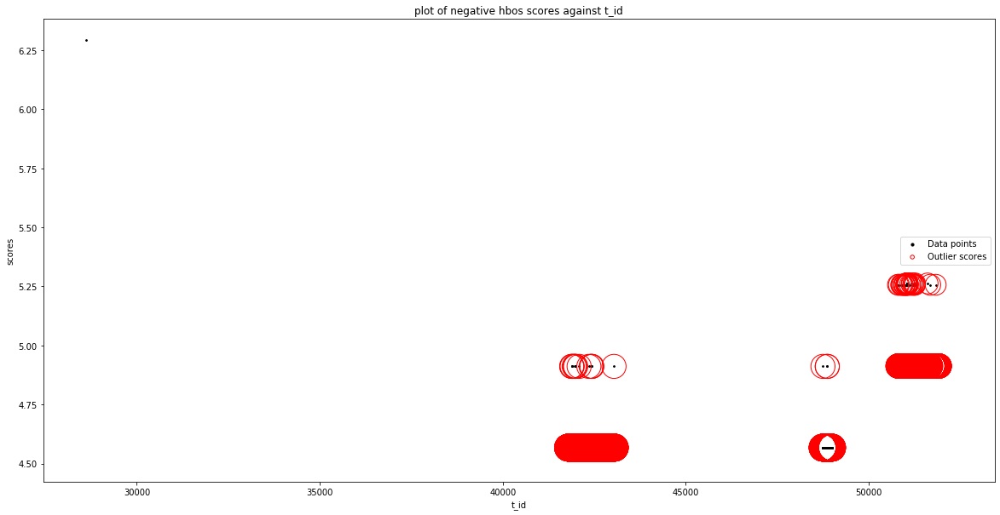

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['a_id', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2466
Number of Outliers :  45
Outlier index: 0
Outlier score: 6.398241146380714
Outlier index: 1484
Outli

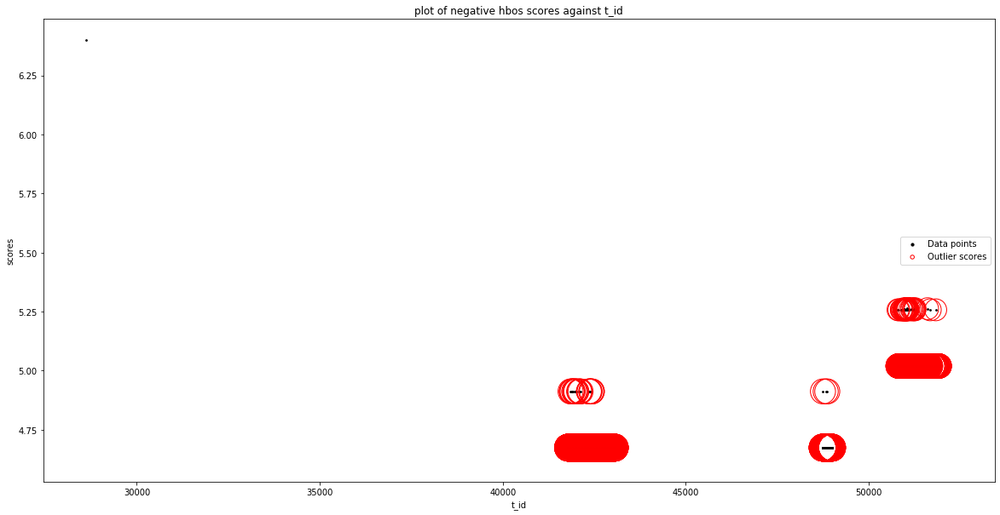

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Fe

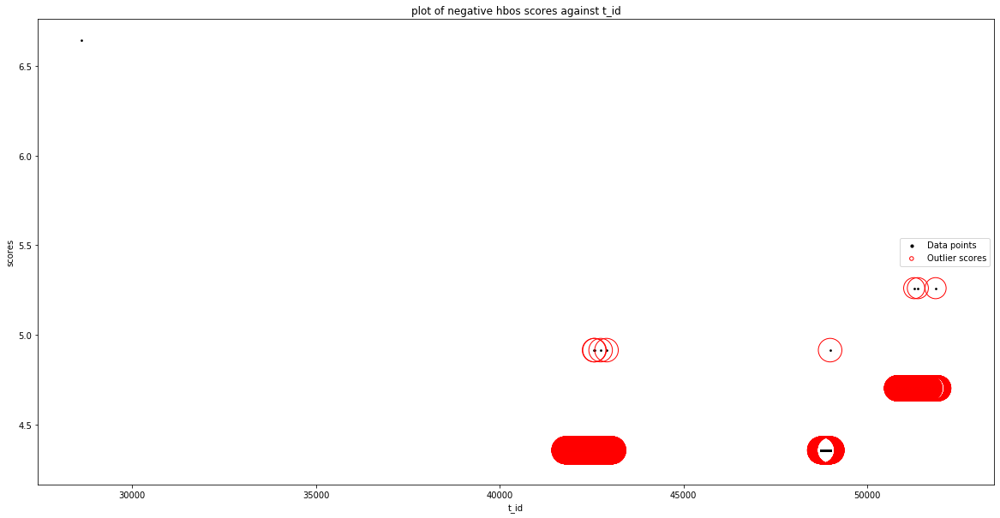

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'packet_length_mean']
input parameters are being used instead of default values
contamination: 0.

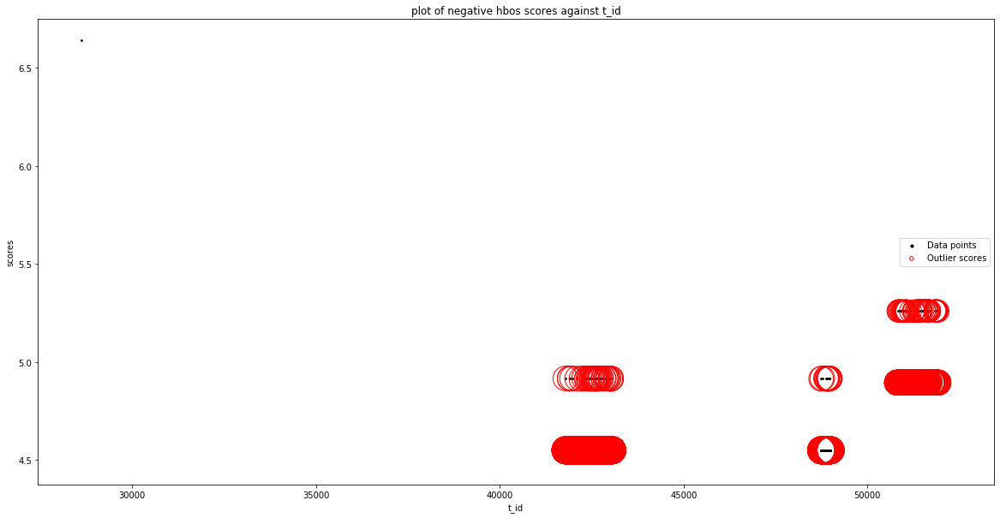

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['a_id', 'psh_flag_count'], dtype='object')
Number of Inliers :  2506
Number of Outliers :  5
Outlier index: 0
Outlier score: 6.640241386330848
Outlier index: 763
Outlier score: 4.9120228507436785
Outlier index: 937
Outlier score: 4.9120228507436785
Outlier index: 1090
Outlier score: 4.9120228507436785
Outlier index: 1468
Outlier score: 

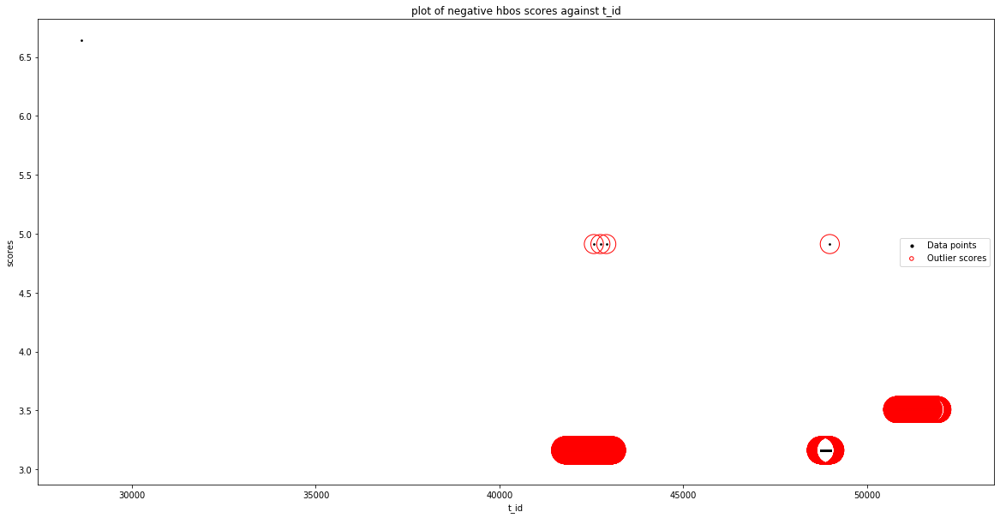

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'down_up_ratio']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No

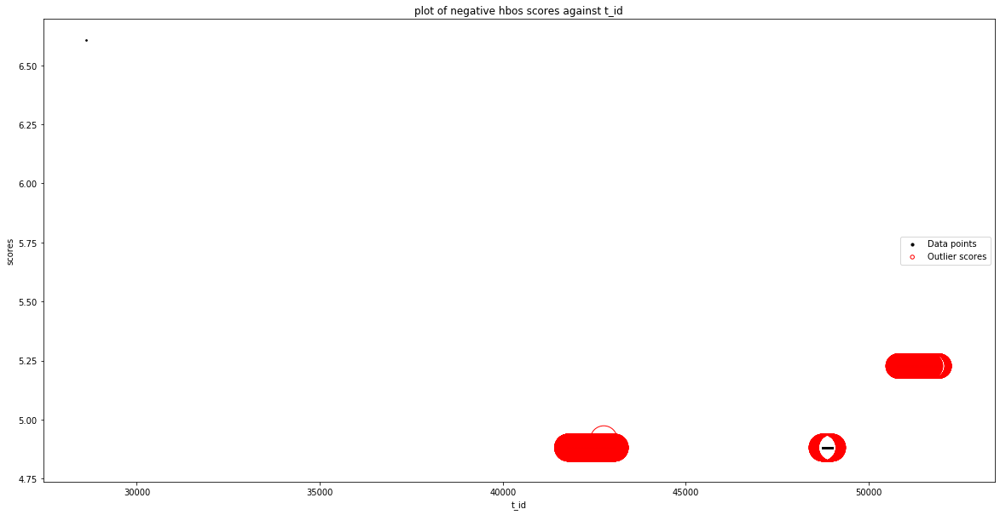

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'active_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No v

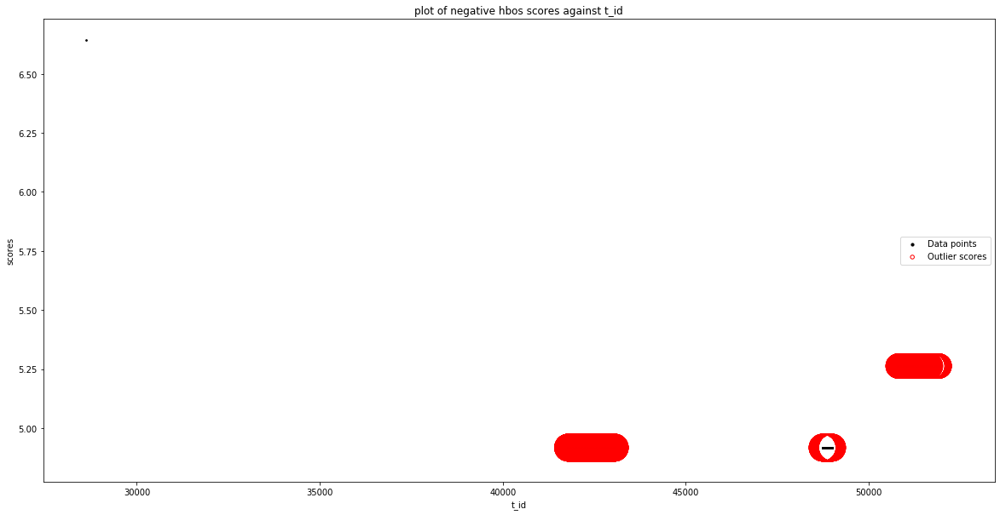

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['a_id', 'idle_max'], dtype='object')
Number of Inliers :  2510
Number of Outliers :  1
Outlier index: 0
Outlier score: 6.6414111350567575
Total number of outliers found: 1
Silhouetter Score: 0.956
davies bouldin Score: 0.042
calinski_harabasz Score: 539.099


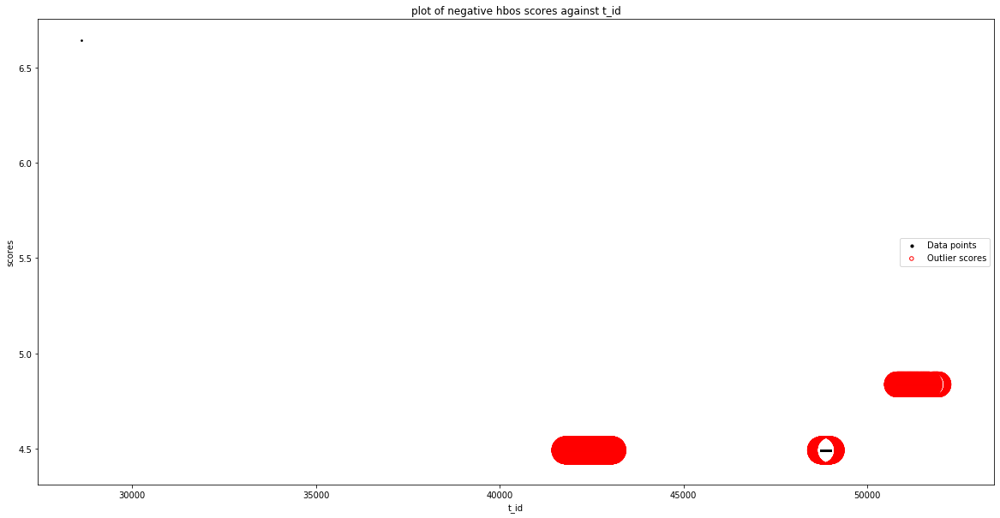

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid f

Silhouetter Score: 0.231
davies bouldin Score: 0.804
calinski_harabasz Score: 261.270


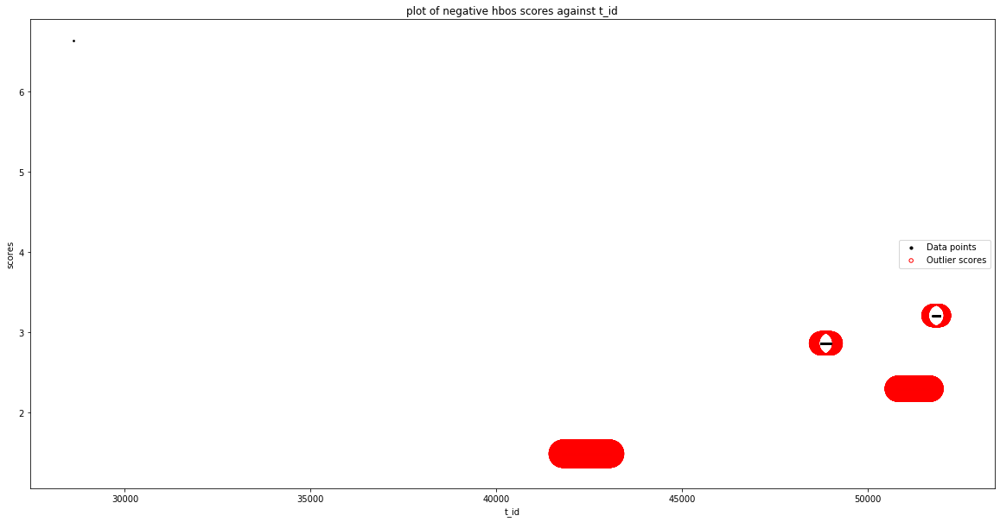

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'updatedAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['a_id', 'log_start_time']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No vali

No valid feature
No Valid columns found for combination of  ['agent_id', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['agent_id', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['agent_id', 'bwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['agent_id', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['agent_id', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  

No valid feature
No Valid columns found for combination of  ['agent_id', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['agent_id', 'a_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['agent_id', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['agent_id', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['agent_id', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['agent_id', 'service_phys

No valid feature
No Valid columns found for combination of  ['client_physical_ip', 'fwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_physical_ip', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_physical_ip', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_physical_ip', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_physical_ip', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns fou

No valid feature
No Valid columns found for combination of  ['client_physical_ip', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_physical_ip', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_physical_ip', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_physical_ip', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_physical_ip', 'active_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid co

No valid feature
No Valid columns found for combination of  ['client_pseudo_ip', 'bwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_pseudo_ip', 'flow_bytes_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_pseudo_ip', 'flow_pkts_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_pseudo_ip', 'flow_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_pseudo_ip', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Vali

No valid feature
No Valid columns found for combination of  ['client_pseudo_ip', 'fwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_pseudo_ip', 'bwd_bytes_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_pseudo_ip', 'bwd_packet_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_pseudo_ip', 'bwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_pseudo_ip', 'subflow_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No vali

No valid feature
No Valid columns found for combination of  ['service_id', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_id', 'total_length_of_fwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_id', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_id', 'fwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_id', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Vali

No valid feature
No Valid columns found for combination of  ['service_id', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_id', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_id', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_id', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_id', 'down_up_ratio']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['serv

No valid feature
No Valid columns found for combination of  ['service_physical_ip', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_physical_ip', 'src_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_physical_ip', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_physical_ip', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_physical_ip', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combinat

No valid feature
No Valid columns found for combination of  ['service_physical_ip', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_physical_ip', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_physical_ip', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_physical_ip', 'packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_physical_ip', 'packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No

No valid feature
No Valid columns found for combination of  ['service_physical_ip', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_physical_ip', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_physical_ip', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_physical_ip', 'service_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_physical_ip', 'client_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid featu

No valid feature
No Valid columns found for combination of  ['service_pseudo_ip', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_pseudo_ip', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_pseudo_ip', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_pseudo_ip', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_pseudo_ip', 'bwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found fo

No valid feature
No Valid columns found for combination of  ['service_pseudo_ip', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_pseudo_ip', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_pseudo_ip', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_pseudo_ip', 'active_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_pseudo_ip', 'active_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for

Silhouetter Score: 0.466
davies bouldin Score: 0.554
calinski_harabasz Score: 755.346


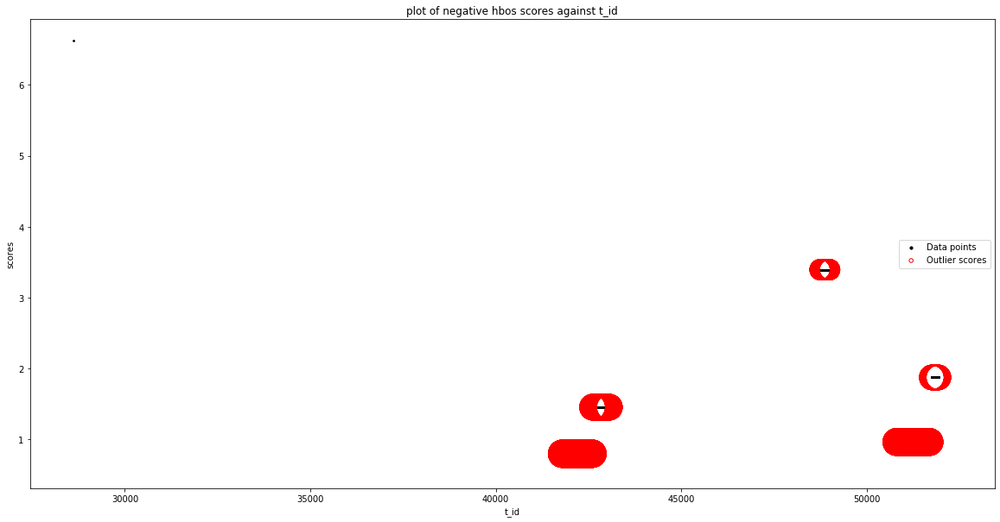

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'src_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['client_tx_bytes', 'src_port'], dtype='object')
Number of Inliers :  2367
Number of Outliers :  144
Outlier index: 0
Outlier score: 6.610864303683282
Outlier index: 2358
Outlier score: 2.9248003236764077
Outlier index: 2359
Outlier score: 2.9248003236764077
Outlier index: 2360
Outlier score: 2.9248003236764077
Outlier index: 2361
Outlier score: 2.9248003236764077
Outlier index: 2362
Outlier score: 2.9248003236764077
Outlier index: 2363
Outlier score: 2.9248003236764077
Outlier index: 2364
Outlier score: 2.9248003236764077
Outlier index: 2365
Outlier score: 2.9248003236764077
Outlier index: 2366
Outlier score: 2.9248003236764077
Outlier index: 2367
Outlier score: 2.9248003236764077
Outlier

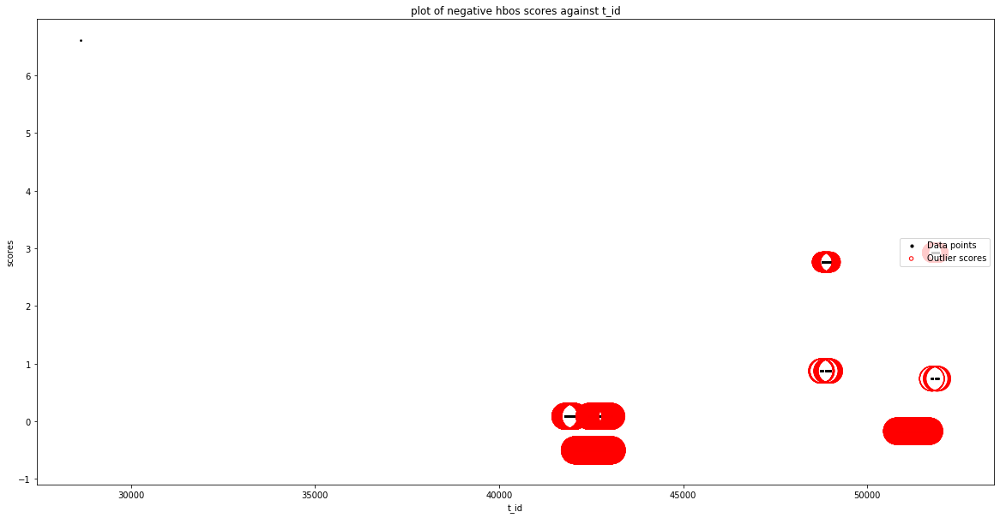

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['client_tx_bytes', 'flow_duration'], dtype='object')
Number of Inliers :  2509
Number of Outliers :  2
Outlier index: 0
Outlier score: 6

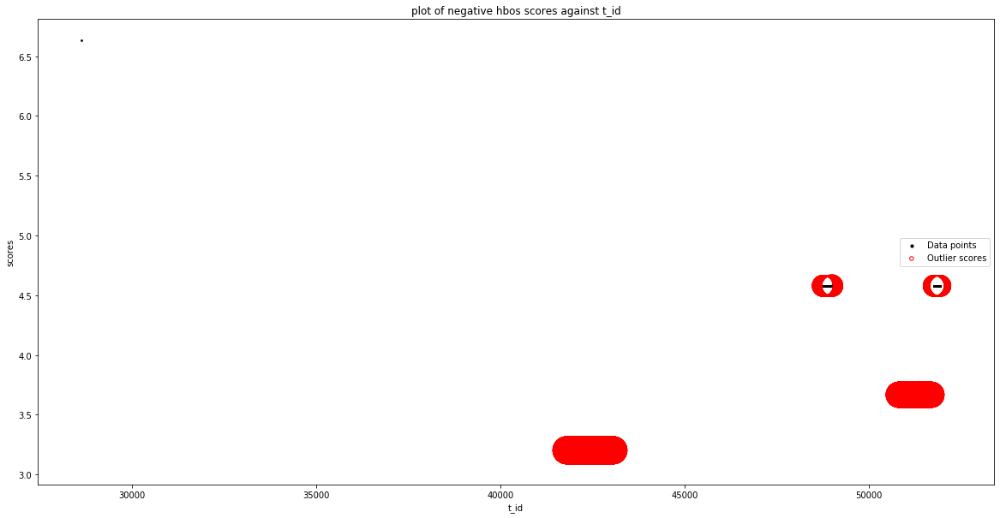

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'total_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'total_bwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['client_tx_bytes', 'total_length_of_fwd_packet'], dtype='object')
Number of Inliers :  2501
Number of Outliers :  10
Outlier index: 0
Outlier score: 6.632318697642614
Outlier index: 1363
Outlier score: 4.580079778208951
Outlier index: 1380
Outlier score: 4.580079778208951
Outlier index: 1446
Outlier score: 4.580079778208951
Outlier index: 1452
Outlier score: 4.580079778208951
Outlier index: 1459
Outlier score: 4.580079778208951
Outlier index: 2437
Outlier score: 4.585023540349253
Outlie

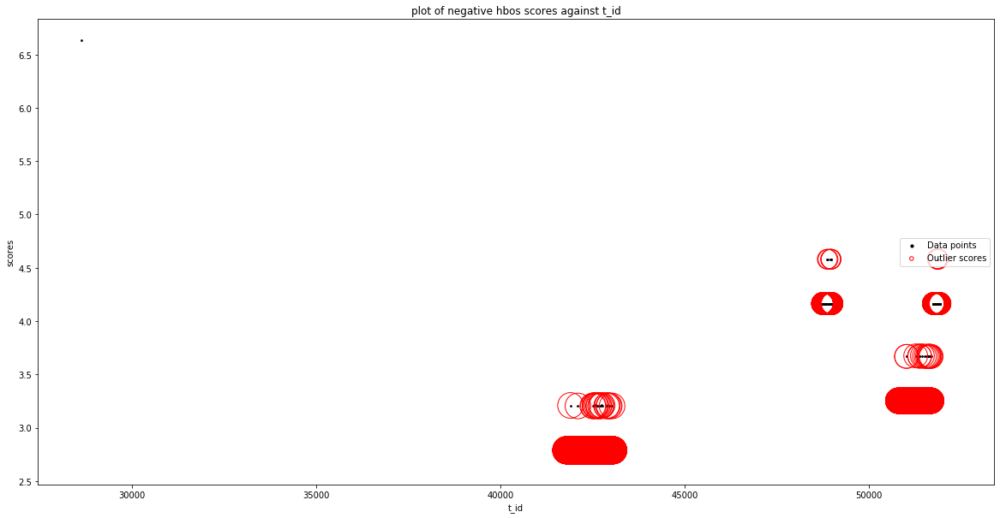

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['client_tx_bytes', 'fwd_packet_length_max'], dtype='object')
Number of Inliers :  2265
Number of Outliers :  246
Outlier index: 0
Outlier score: 6.401304675525267
Outlier index: 1
Outlier score: 2.9785846332272867
Outlier index: 63
Outlier score: 3.021957328873169
Outlier index: 113
Outlier score: 2.9785846332272867
Outlier index: 115
Outlier score: 2.9785846332272867
Outlier index: 174
Outlier score: 3.184935248770193
Outlier index: 193
Outlier score: 3.021957328873169
Outlier index: 311
Outlier score: 2.9785846332272867
Outlier index: 426
Outlier score: 3.1604948427195794
Outlier index: 498
Outlier score: 2.9785846332272867
Outlier index: 553
Outlier score: 3.0219573

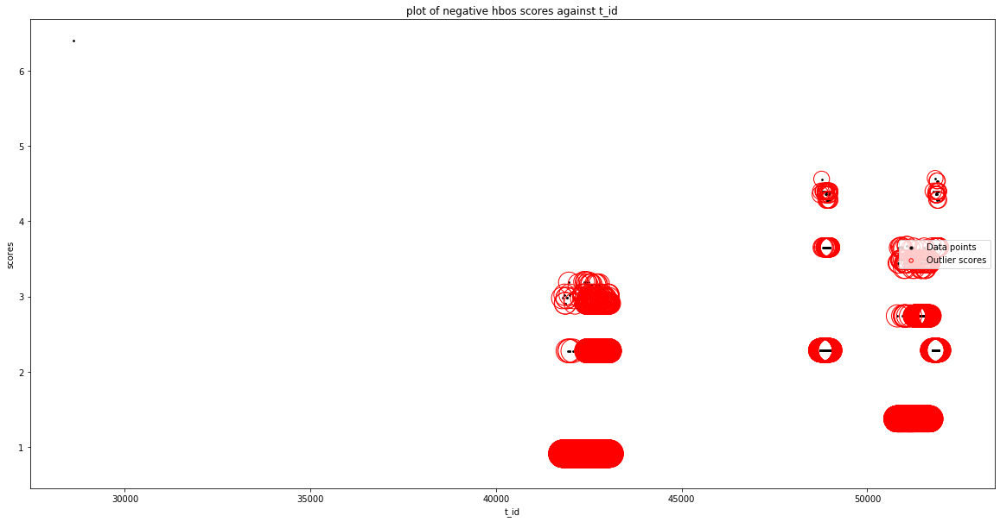

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['client_tx_bytes', 'fwd_packet_length_mean'], dtype='object')
Number of Inliers :  2359
Number of Outliers :  152
Outlier index: 0
Outlier score: 6.521623071364745
Outlier index: 113
Outlier score: 3.1999504795250577
Outlier index: 311
Outlier score: 3.1917962037212475
Outlier index: 574
Outlier score: 3.1917962037212475
Outlier index: 703
Outlier score: 3.1983159330846687
Outlier index: 707
Outlier score: 3.1917962037212475
Outlier index: 721
Outlier score: 3.1983159330846687
Outlier index: 758
Outlier score: 3.1917962037212475
Outlier index: 763
Outlier score: 3.1983159330846687
Outlier index: 825
Outlier score: 3.1999504795250577
Outlier index: 857
Outlier score: 3.19831

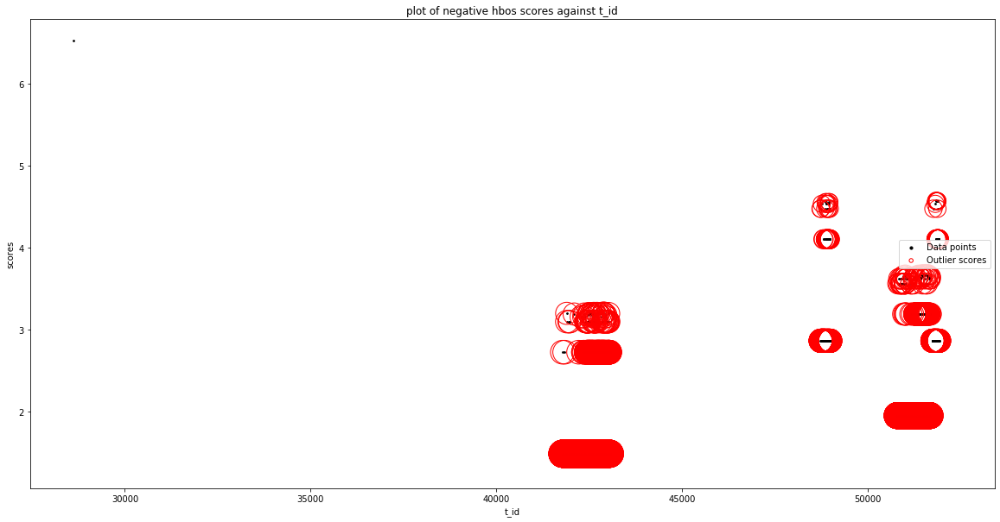

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'fwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'bwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'bwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'bwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'bwd_packet_length_std']
inpu

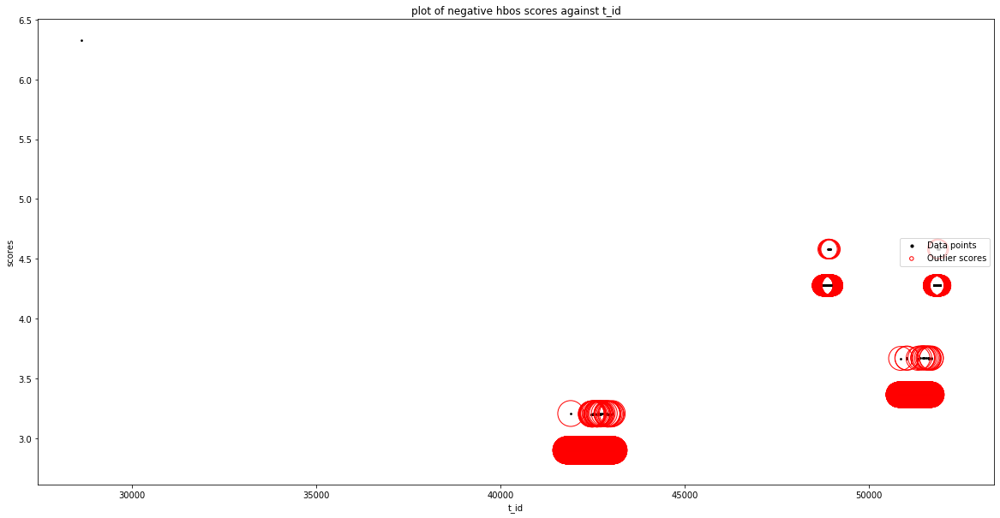

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['client_tx_bytes', 'flow_pkts_per_sec'], dtype='object')
Number of Inliers :  2382
Number of Outliers :  129
Outlier index: 0
Outlier score: 5.63567412966291
Outlier index: 1366
Outlier score: 4.104188672243942
Outlier index: 1367
Outlier score: 4.46180777811823
Outlier index: 1369
Outlier score: 4.104188672243942
Outlier index: 1372
Outlier score: 4.104188672243942
Outlier index: 1374
Outlier score: 4.171359524093464
Outlier index: 1375
Outlier score: 4.171359524093464
Outlier index: 1378
Outlier score: 4.104188672243942
Outlier index: 1383
Outlier score: 4.46180777811823
Outlier index: 1384
Outlier score: 4.104188672243942
Outlier index: 1387
Outlier score: 4.104188672243942
Outlier index: 1388
Outlier score: 4.171359524093464
Outlier index: 1389
Outlier score: 4.171359524093464
Outlier index: 1390
Outlier score: 4.569965782462393
Outlier index: 1391
Outlier score: 4

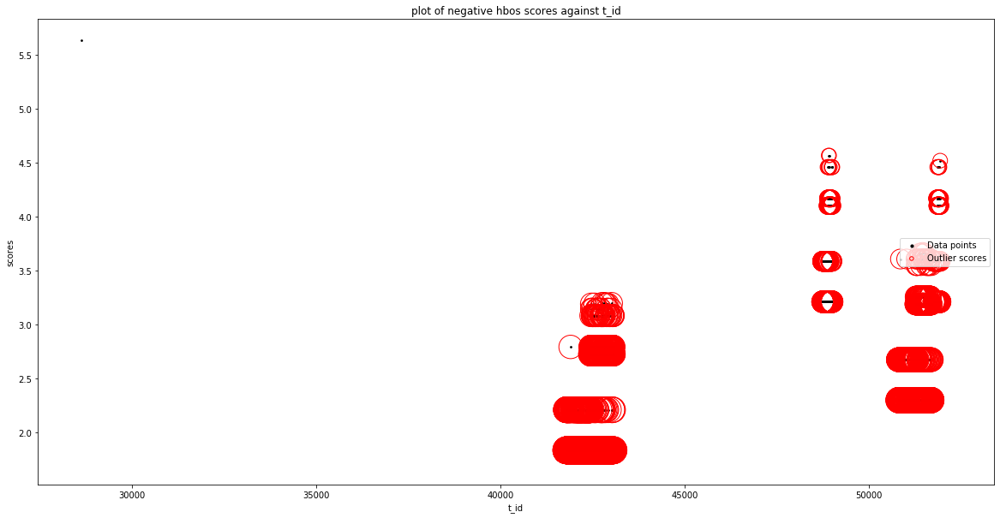

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['client_tx_bytes', 'flow_iat_mean'], dtype='object')
Number of Inliers :  2509
Number of Outliers :  2
Outlier index: 0
Outlier score: 6.605563349583007
Outlier index: 1468
Outlier score: 4.585805273117289
Total number of outliers found: 2
Silhouetter Score: 0.996
davies bouldin Score: 0.917
calinski_harabasz Score: 2675.472


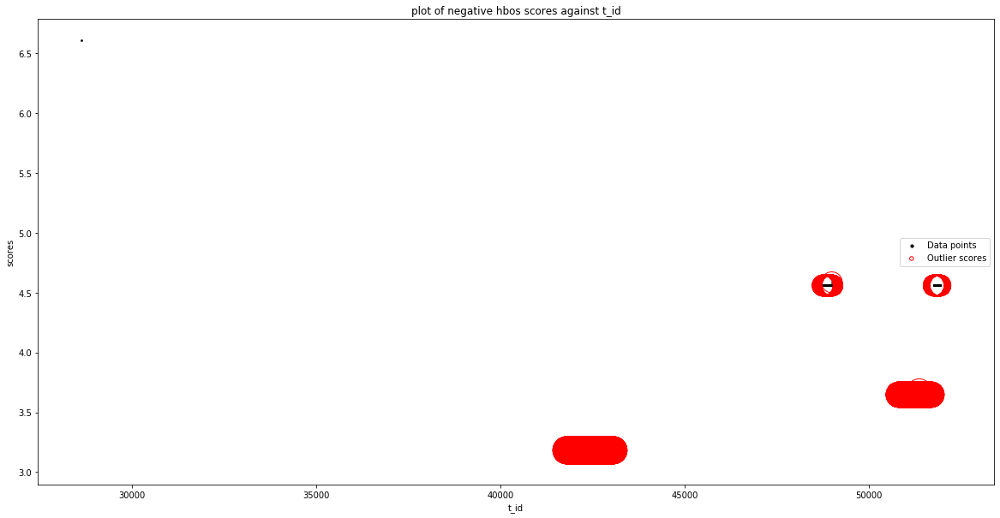

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'flow_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['client_tx_bytes', 'flow_iat_min'], dtype='object')
Number of Inliers :  2509
Number of Outliers :  2
Outlier index: 0
Outlier score: 6.157499922859755
Outlier index: 1359
Outlier score: 4.585143359021487
Total number of outliers found: 2
Silhouetter Score: 0.976
davies bouldin Score: 1.048
calinski_harabasz Score: 412.008


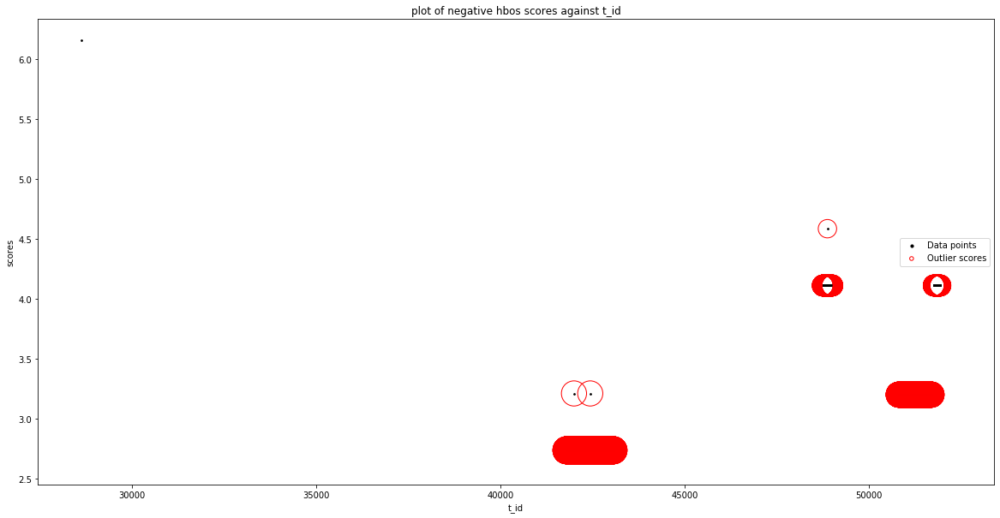

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'flow_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'fwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'fwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['client_tx_bytes', 'fwd_iat_min'], dtype='object')
Number of Inliers :  2506
Number of Outliers :  5
Outlier index: 0
Out

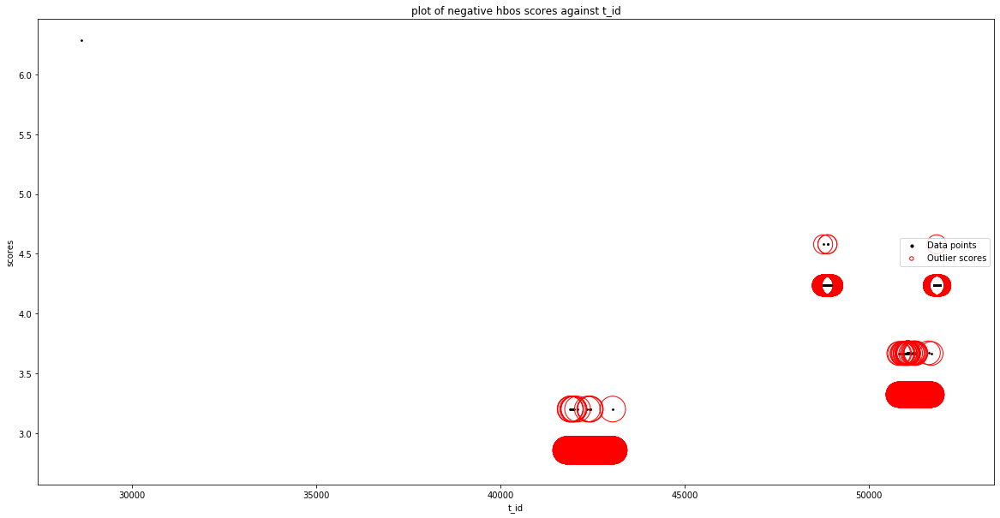

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['client_tx_bytes', 'bwd_iat_min'], dtype='object')
Number of Inliers :  2506
Number of Outliers :  5
Outlier index: 0
Outl

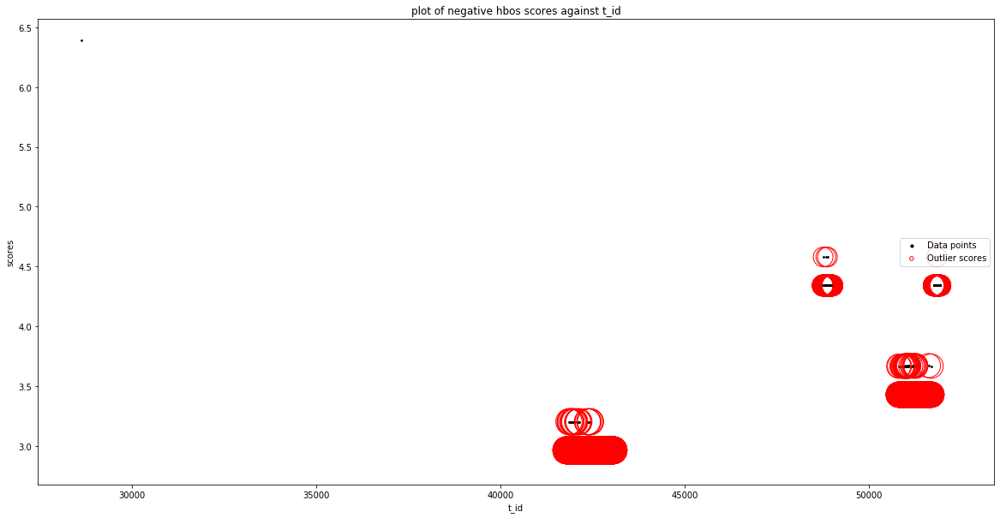

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'fwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'fwd_header_length']
input parameters are being used instead o

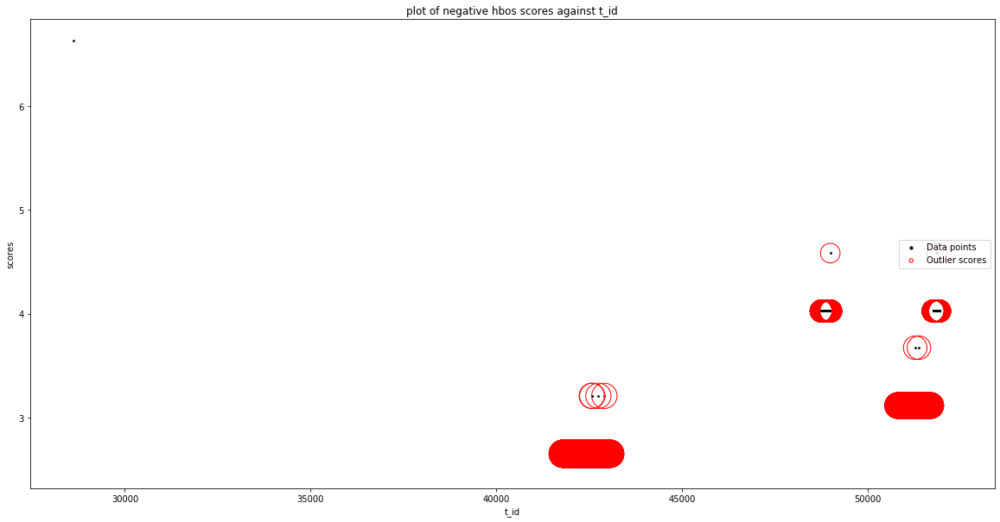

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'fwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'bwd_packets_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'packet_length_mean']
input parameters are

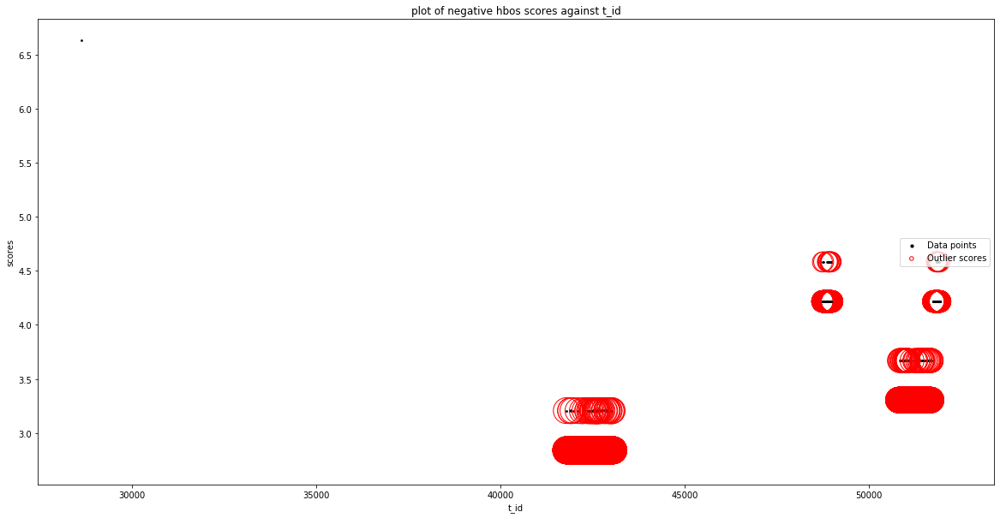

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'rst_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['client_tx_bytes', 'psh_flag_count'], dtype='object')
Number of Inliers :  2506
Number of Outliers :  5
Outlier index: 0
Outlier score: 6.631149554550578
Outlier index: 763
Outlier score: 3.2043352864055605
Outlier index: 937
Outlier score: 3.2043352864055605
Outlier index: 1090
Outlier score: 3.20433528

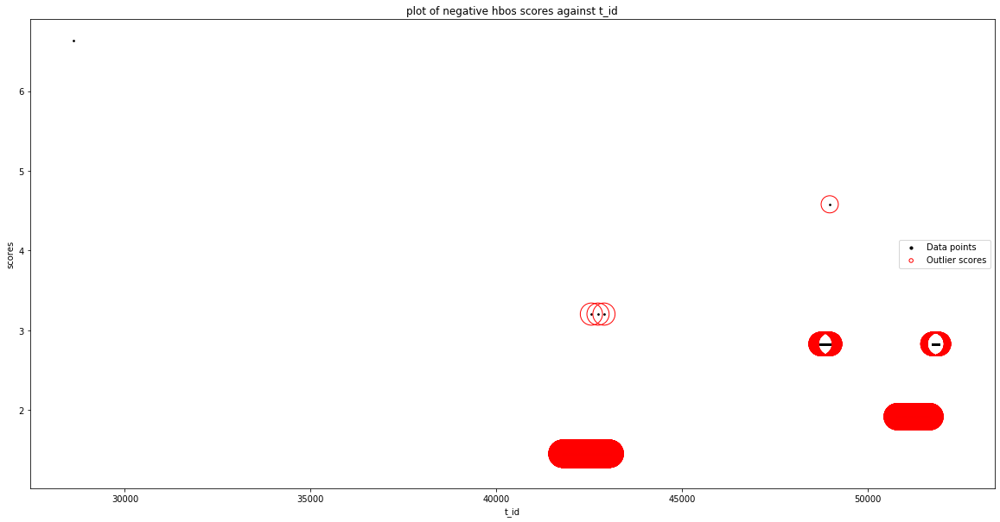

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'ack_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'urg_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'down_up_ratio']
input parameters are being used instead o

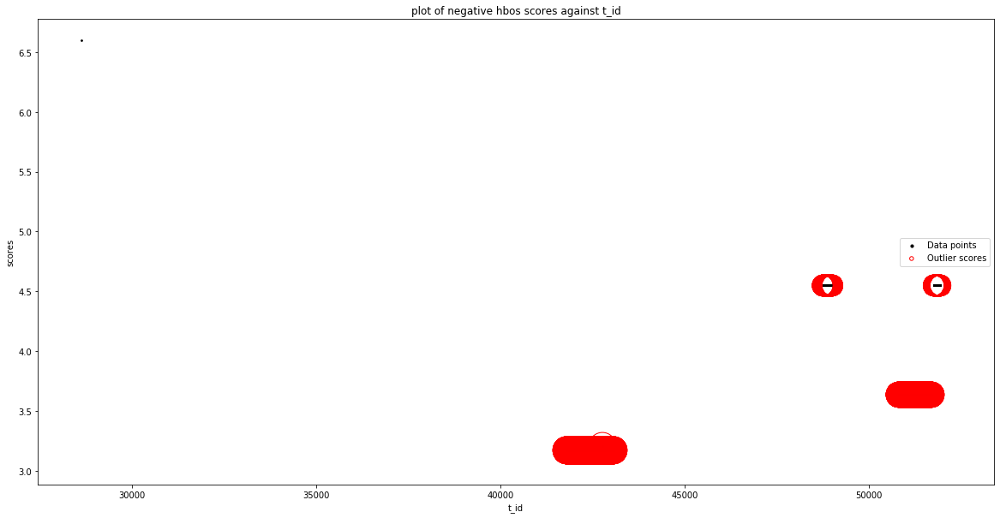

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'active_max']
input parameters are being used instead of 

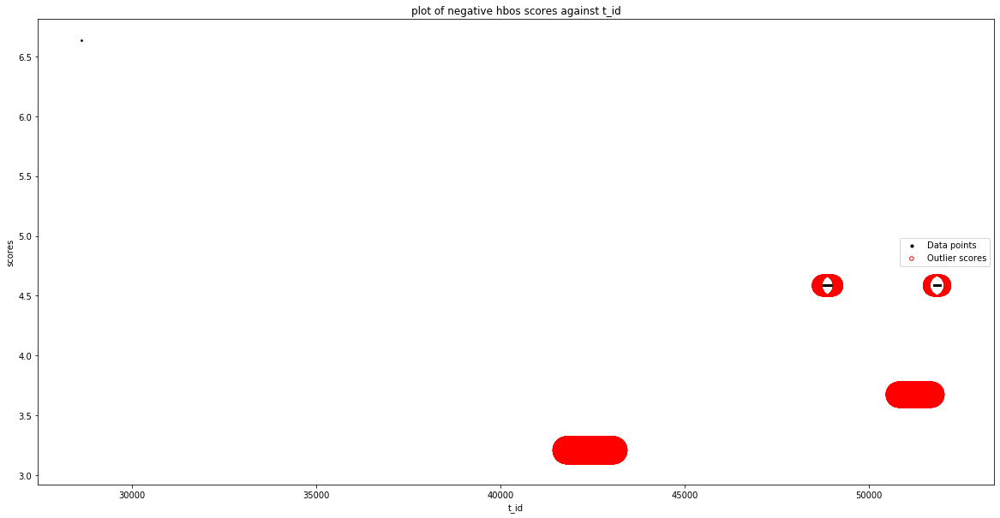

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'idle_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['client_tx_bytes', 'idle_max'], dtype='object')
Number of Inliers :  2510
Number of Outliers :  1
Outlier index: 0
Outlier score: 6.632319303276487
Total number of outliers found: 1
Silhouetter Score: 0.957
davies bouldin Score: 0.040
calinski_harabasz Score: 590.164


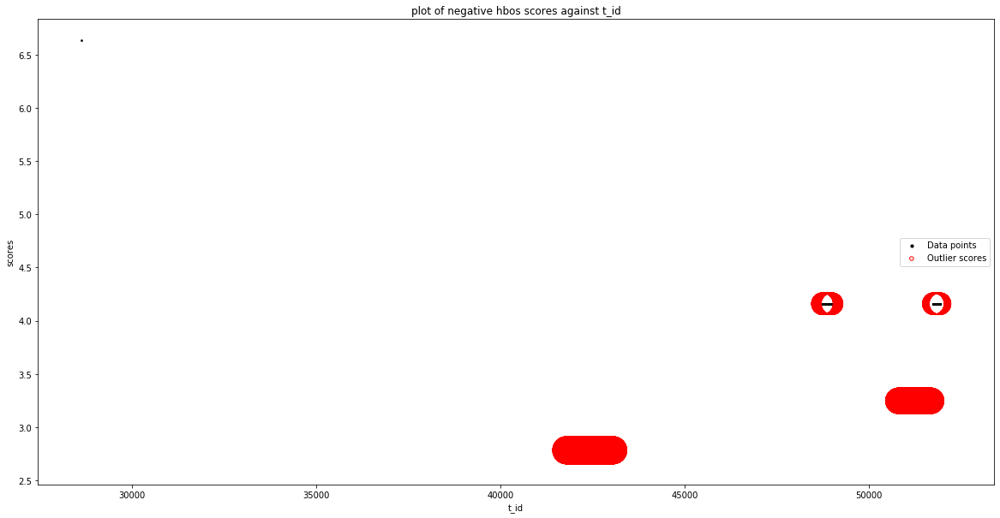

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
Features Used ::  Index(['client_tx_bytes', 'a_id'], dtype='object')
Number of Inliers :  2347
Number of Outliers :  164
Outlier index: 0
Outlier score: 6.630269407162658
Outlier index: 2348
Outlier score: 3.2049439510516047
Outlier index: 2349
Outlier score: 3.2049439510516047
Outlier index: 2350
Outlier score: 3.2049439510516047
Outlier index: 2351
Outlier score: 3.2049439510516047
Outlier index: 2352
Outlier score: 3.2049439510516047
Outlier index: 2353
Outlier score: 3.2049439510516047
Outlier index: 2354
Outlier score: 3

Silhouetter Score: 0.231
davies bouldin Score: 0.804
calinski_harabasz Score: 261.270


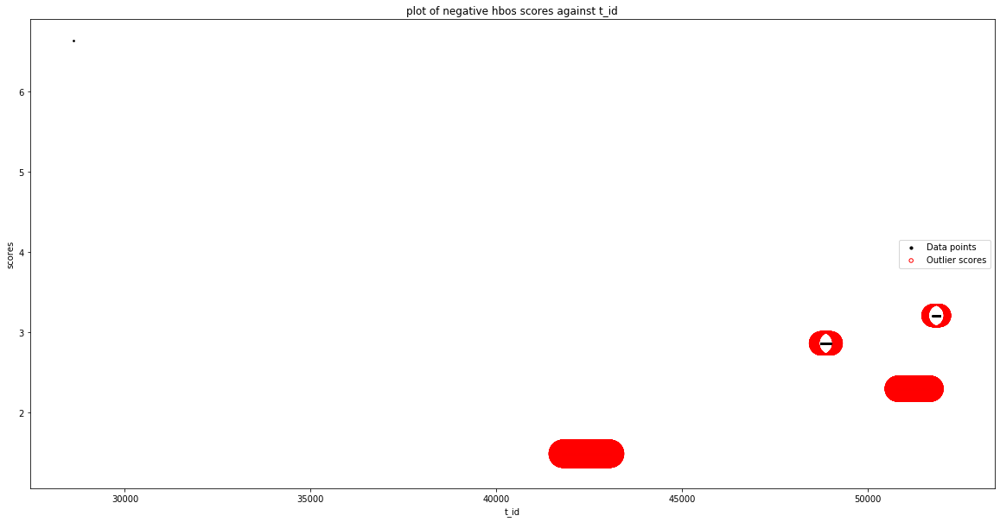

input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'client_physical_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'client_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'service_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['client_tx_bytes', 'service_physical_ip']
input parameters are being used instead

No valid feature
No Valid columns found for combination of  ['service_tx_bytes', 'fwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_tx_bytes', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_tx_bytes', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_tx_bytes', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_tx_bytes', 'bwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for com

No valid feature
No Valid columns found for combination of  ['service_tx_bytes', 'bwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_tx_bytes', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_tx_bytes', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_tx_bytes', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['service_tx_bytes', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid colu

No valid feature
No Valid columns found for combination of  ['difference_bytes', 'bwd_packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['difference_bytes', 'flow_bytes_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['difference_bytes', 'flow_pkts_per_sec']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['difference_bytes', 'flow_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['difference_bytes', 'flow_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Vali

No valid feature
No Valid columns found for combination of  ['difference_bytes', 'fwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['difference_bytes', 'bwd_bytes_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['difference_bytes', 'bwd_packet_per_bulk_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['difference_bytes', 'bwd_bulk_rate_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['difference_bytes', 'subflow_fwd_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No vali

No valid feature
No Valid columns found for combination of  ['createdAt', 'total_length_of_fwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['createdAt', 'total_length_of_bwd_packet']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['createdAt', 'fwd_packet_length_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['createdAt', 'fwd_packet_length_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['createdAt', 'fwd_packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Vali

No valid feature
No Valid columns found for combination of  ['createdAt', 'cwr_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['createdAt', 'ece_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['createdAt', 'down_up_ratio']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['createdAt', 'avg_packet_size']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['createdAt', 'fwd_segment_size_avg']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['cr

No valid feature
No Valid columns found for combination of  ['updatedAt', 'src_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['updatedAt', 'dest_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['updatedAt', 'dest_port']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['updatedAt', 'protocol']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['updatedAt', 'timestamp']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['updatedAt', 'flow_duration']
input pa

No valid feature
No Valid columns found for combination of  ['updatedAt', 'packet_length_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['updatedAt', 'packet_length_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['updatedAt', 'packet_length_variance']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['updatedAt', 'fin_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['updatedAt', 'syn_flag_count']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination

No valid feature
No Valid columns found for combination of  ['updatedAt', 'service_pseudo_ip']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['updatedAt', 'client_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['updatedAt', 'service_tx_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['updatedAt', 'difference_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['updatedAt', 'createdAt']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['updat

No valid feature
No Valid columns found for combination of  ['log_start_time', 'bwd_psh_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_start_time', 'fwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_start_time', 'bwd_urg_flags']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_start_time', 'fwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_start_time', 'bwd_header_length']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found fo

No valid feature
No Valid columns found for combination of  ['log_start_time', 'idle_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_start_time', 'idle_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_start_time', 'gw_agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_start_time', 'a_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_start_time', 'agent_id']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_start_time

No valid feature
No Valid columns found for combination of  ['log_end_time', 'fwd_iat_max']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_end_time', 'fwd_iat_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_end_time', 'bwd_iat_total']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_end_time', 'bwd_iat_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_end_time', 'bwd_iat_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_e

No valid feature
No Valid columns found for combination of  ['log_end_time', 'bwd_init_win_bytes']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_end_time', 'fwd_act_data_packets']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_end_time', 'fwd_seg_size_min']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_end_time', 'active_mean']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combination of  ['log_end_time', 'active_std']
input parameters are being used instead of default values
contamination: 0.27
n_neighbors: 30
No valid feature
No Valid columns found for combin

In [83]:
parameters = [0.27, 30]
algorithm = "hbos"
service_id = 824
agent_id = 7083
#[Silhouetter, davies_bouldin, calinski_harabasz]
results = []
for feature in df.columns:
    for feature_2 in df.columns:
        if feature == feature_2:
            continue
        else:
            features = [feature,feature_2]
            evaluation_scores = execute_etlp_pipeline(df,features, algorithm, parameters, service_id, agent_id)
#             hbos_eval_scores_list = execute_etlp_pipeline(df, features, "hbos", parameters, 7083)
        results.append((algorithm,service_id, agent_id, features, evaluation_scores[0], evaluation_scores[1], evaluation_scores[2]))
    
results_df = pd.DataFrame(results, columns = ["algorithm", "service_id", "agent_id", "features", "silht_score", "dbi_score", "ch_score"])
name = algorithm + ".csv"
results_df.to_csv(name, index = False)